#Experiments on Cifar10
All experiments are essentially the same, but they differ on augmentations applied, but each experiment can be done seperately with its own dependencies.


## First Experiment working Original Augmentation Techniques;It doesn't preserve the features.

100%|██████████| 170498071/170498071 [00:03<00:00, 46841496.42it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
Epoch 0/199, Loss: 2.1974, Train Acc: 0.1679, Val Acc: 0.1466


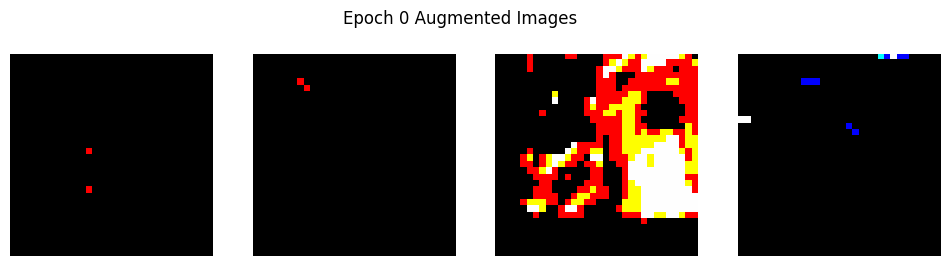

Epoch 1/199, Loss: 2.1056, Train Acc: 0.2151, Val Acc: 0.2789


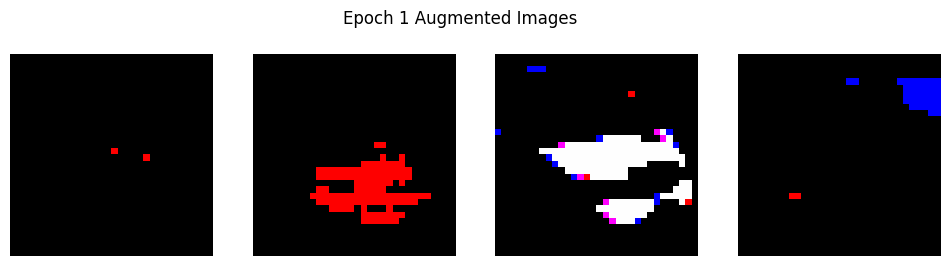

Epoch 2/199, Loss: 2.0669, Train Acc: 0.2337, Val Acc: 0.2999


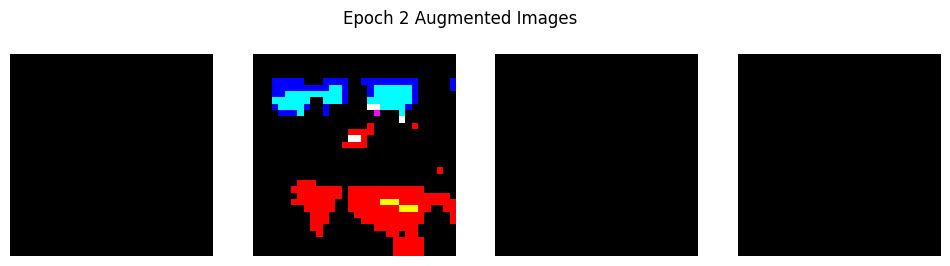

Epoch 3/199, Loss: 2.0450, Train Acc: 0.2443, Val Acc: 0.3250


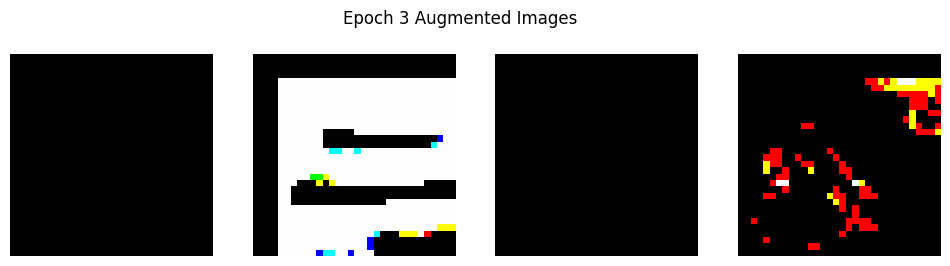

Epoch 4/199, Loss: 2.0205, Train Acc: 0.2518, Val Acc: 0.3340


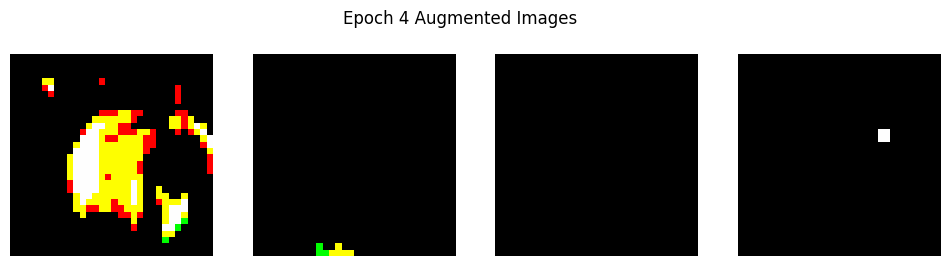

Epoch 5/199, Loss: 2.0129, Train Acc: 0.2566, Val Acc: 0.3857


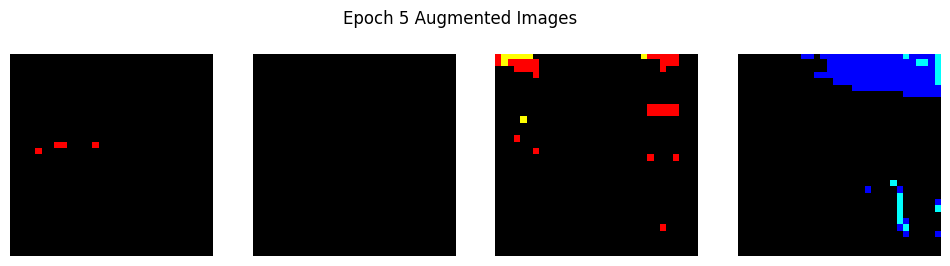

KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
from torchvision.transforms import Lambda
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# PCA Color Augmentation
def pca_color_augmentation(image):
    reshaped_image = image.reshape(-1, 3).astype(np.float32)
    mean = np.mean(reshaped_image, axis=0)
    std = np.std(reshaped_image, axis=0)

    std[std == 0] = 1

    normalized_image = (reshaped_image - mean) / std

    cov_matrix = np.cov(normalized_image, rowvar=False)

    cov_matrix += np.eye(cov_matrix.shape[0]) * 1e-5

    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvectors = eigenvectors[:, sorted_indices]
    eigenvalues = eigenvalues[sorted_indices]

    alphas = np.random.normal(0, 0.5, 3)
    pca_jitter = np.dot(eigenvectors, alphas * eigenvalues)
    pca_jitter = (pca_jitter * std + mean).astype(np.float32)
    augmented_image = normalized_image + pca_jitter
    augmented_image = (augmented_image * std + mean).astype(np.uint8)

    return augmented_image.reshape(image.shape)

# Transforms including PCA color augmentation
train_transforms = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    Lambda(lambda x: torch.tensor(pca_color_augmentation(x.numpy().transpose((1, 2, 0))), dtype=torch.float32).permute(2, 0, 1)),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])


def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        # Validation phase
        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model


train_loader, test_loader, num_classes = get_dataloaders(dataset='CIFAR10', batch_size=128)


model = AlexNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=10, verbose=True, eps=1e-8)


trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=200)


##Second Experiment with modification on PCA implementation with clipping and scaling down the degree of pertubation.

-Adding Clipping: The pixel values in the pca_color_augmentation function are clipped to ensure they remain within the valid range (0-255). This step is crucial to prevent any unnatural pixel values that might result from the PCA augmentation.

-Scaling Down the Perturbation: The perturbation applied to the pixel values is scaled down by using a smaller standard deviation (e.g., alpha_std=0.1) for the random values. This ensures that the changes introduced by the PCA augmentation are subtle and do not obscure the main features of the image.

Files already downloaded and verified
Files already downloaded and verified
Epoch 0/199, Loss: 2.1649, Train Acc: 0.1825, Val Acc: 0.2502


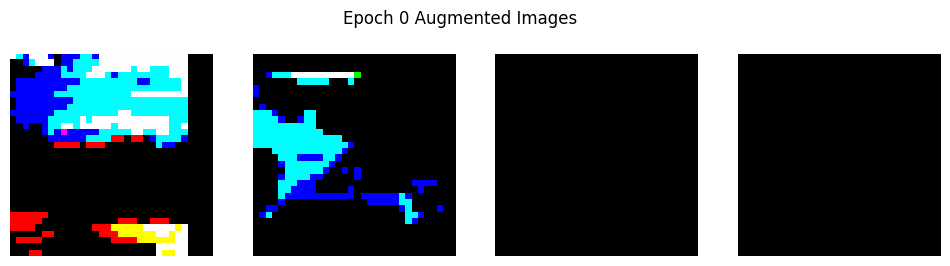

Epoch 1/199, Loss: 2.0642, Train Acc: 0.2301, Val Acc: 0.2513


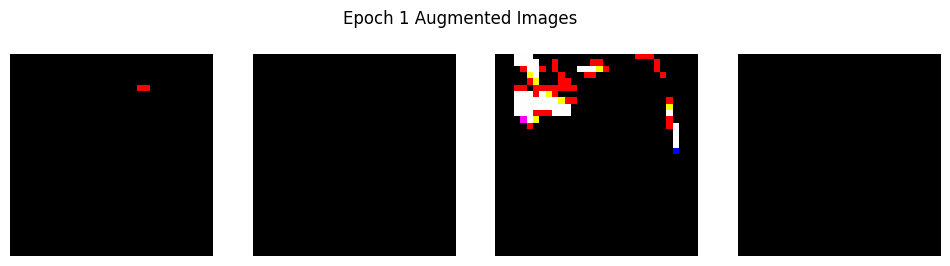

Epoch 2/199, Loss: 2.0285, Train Acc: 0.2484, Val Acc: 0.2638


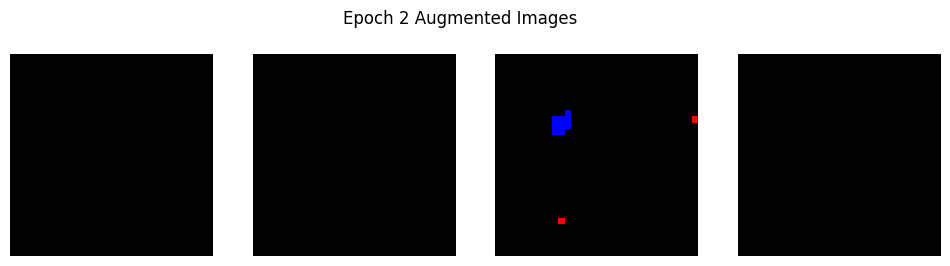

Epoch 3/199, Loss: 2.0066, Train Acc: 0.2578, Val Acc: 0.3199


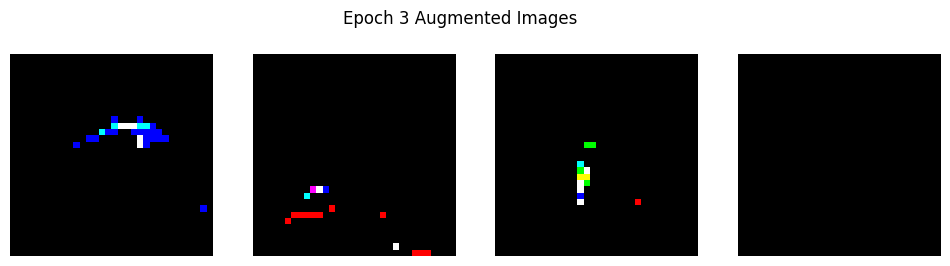

Epoch 4/199, Loss: 1.9820, Train Acc: 0.2691, Val Acc: 0.2923


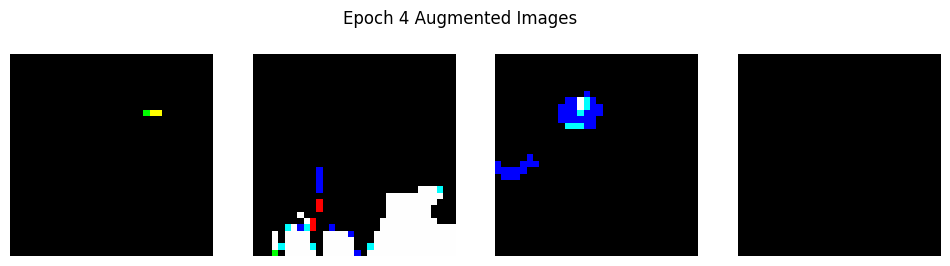

Epoch 5/199, Loss: 1.9651, Train Acc: 0.2802, Val Acc: 0.2845


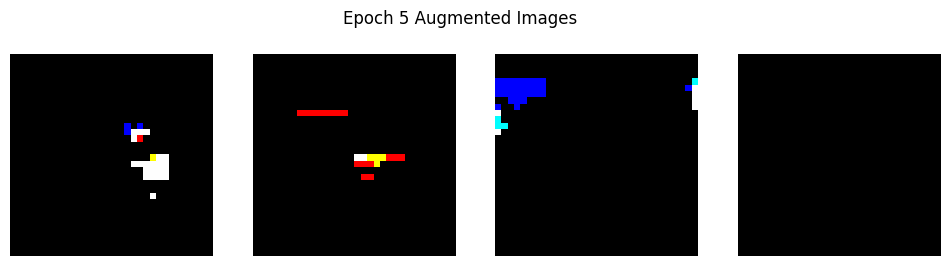

Epoch 6/199, Loss: 1.9533, Train Acc: 0.2847, Val Acc: 0.3370


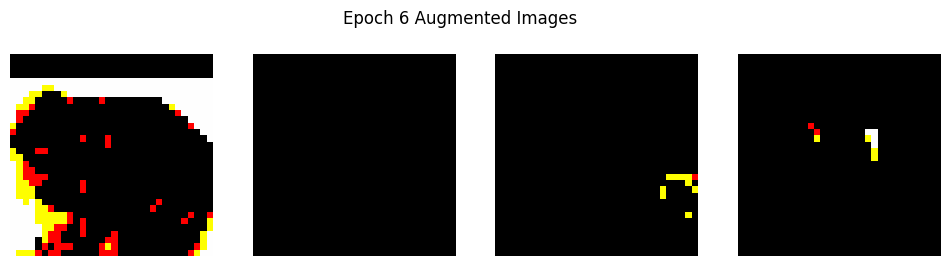

Epoch 7/199, Loss: 1.9369, Train Acc: 0.2903, Val Acc: 0.3192


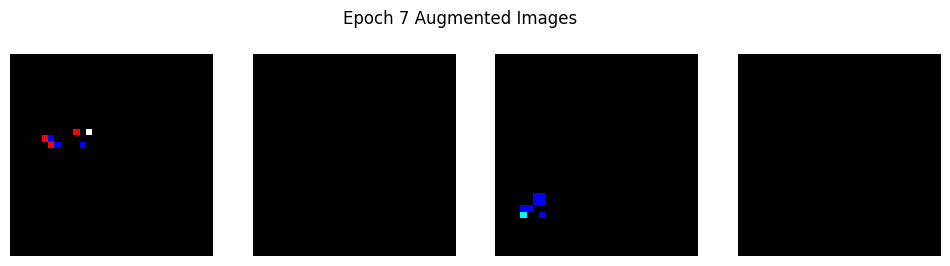

KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
from torchvision.transforms import Lambda
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

# Revised PCA Color Augmentation
def pca_color_augmentation(image, alpha_std=0.1):
    reshaped_image = image.reshape(-1, 3).astype(np.float32)
    mean = np.mean(reshaped_image, axis=0)
    std = np.std(reshaped_image, axis=0)

    std[std == 0] = 1

    normalized_image = (reshaped_image - mean) / std

    cov_matrix = np.cov(normalized_image, rowvar=False)

    cov_matrix += np.eye(cov_matrix.shape[0]) * 1e-5

    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvectors = eigenvectors[:, sorted_indices]
    eigenvalues = eigenvalues[sorted_indices]

    alphas = np.random.normal(0, alpha_std, 3)
    pca_jitter = np.dot(eigenvectors, alphas * eigenvalues)
    pca_jitter = (pca_jitter * std + mean).astype(np.float32)
    augmented_image = normalized_image + pca_jitter
    augmented_image = (augmented_image * std + mean).astype(np.uint8)

    augmented_image = np.clip(augmented_image, 0, 255)

    return augmented_image.reshape(image.shape)


# Transforms including PCA color augmentation
train_transforms = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    Lambda(lambda x: torch.tensor(pca_color_augmentation(x.numpy().transpose((1, 2, 0))), dtype=torch.float32).permute(2, 0, 1)),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        # Validation phase
        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model

train_loader, test_loader, num_classes = get_dataloaders(dataset='CIFAR10', batch_size=128)

model = AlexNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=10, verbose=True, eps=1e-8)

trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=200)


##Third experiment, Training the model on Cifar10 without Augmentation.

Files already downloaded and verified
Files already downloaded and verified
Epoch 0/199, Loss: 1.9574, Train Acc: 0.2490, Val Acc: 0.4259


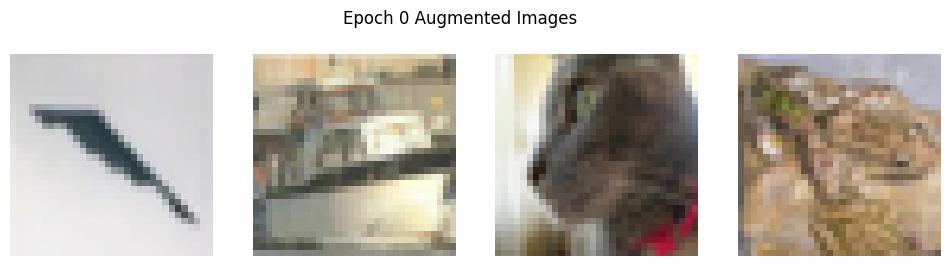

Epoch 1/199, Loss: 1.4455, Train Acc: 0.4633, Val Acc: 0.5354


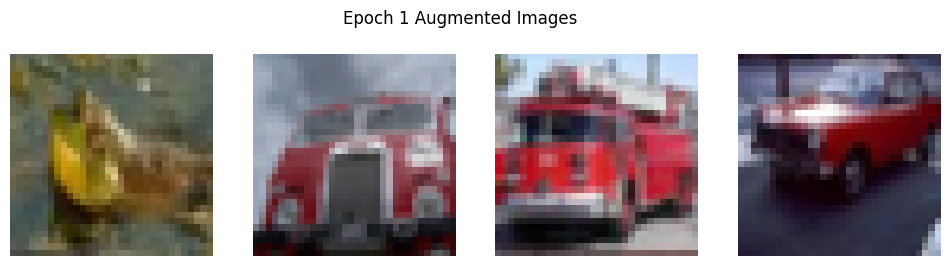

Epoch 2/199, Loss: 1.2020, Train Acc: 0.5728, Val Acc: 0.6168


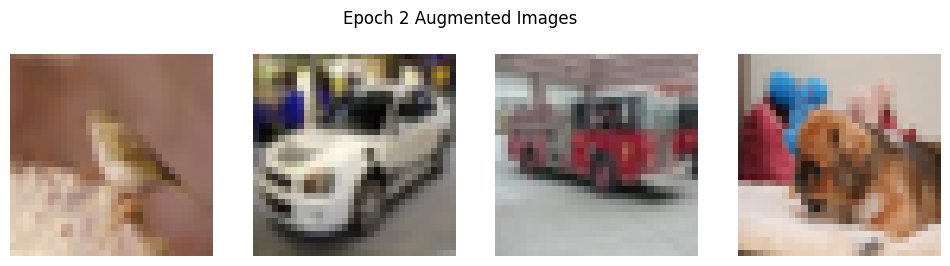

Epoch 3/199, Loss: 1.0222, Train Acc: 0.6444, Val Acc: 0.6655


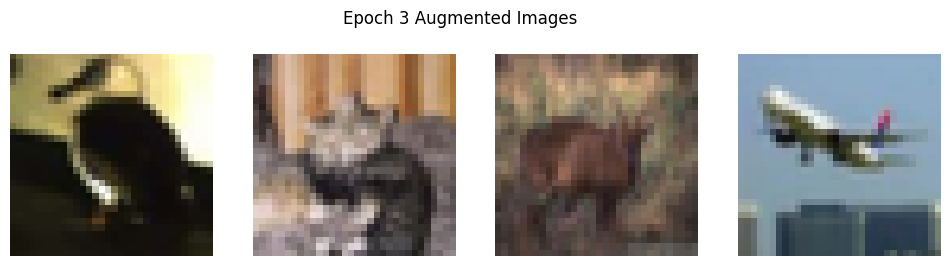

Epoch 4/199, Loss: 0.9201, Train Acc: 0.6845, Val Acc: 0.6915


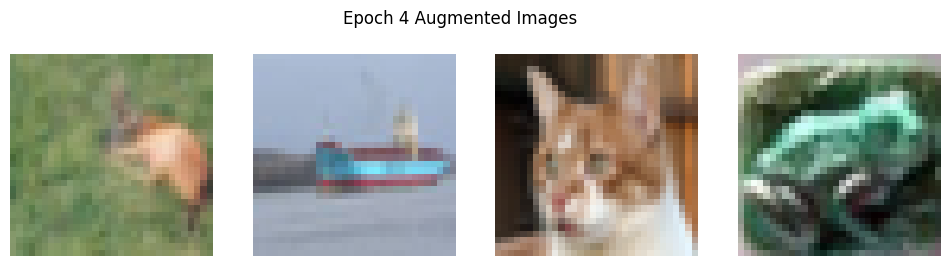

Epoch 5/199, Loss: 0.8428, Train Acc: 0.7111, Val Acc: 0.7107


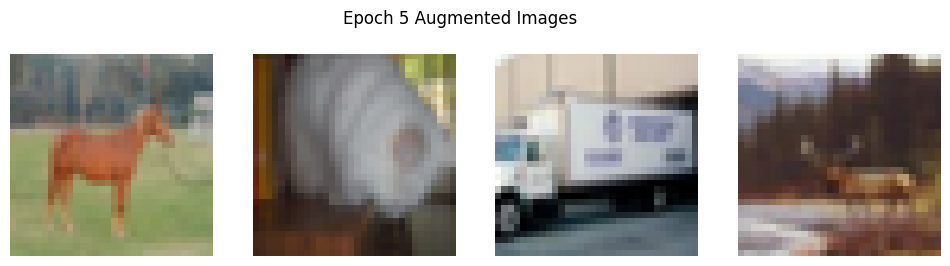

Epoch 6/199, Loss: 0.7845, Train Acc: 0.7319, Val Acc: 0.7302


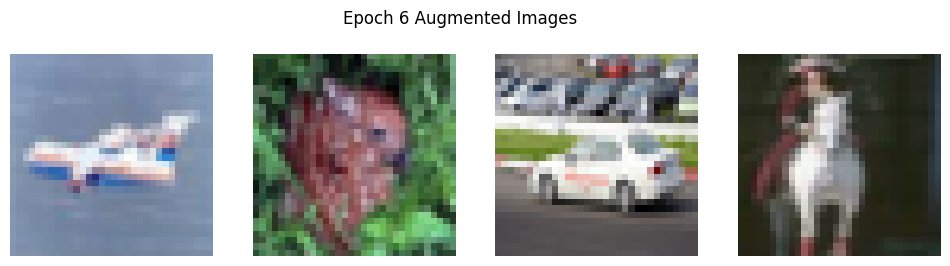

Epoch 7/199, Loss: 0.7266, Train Acc: 0.7532, Val Acc: 0.7394


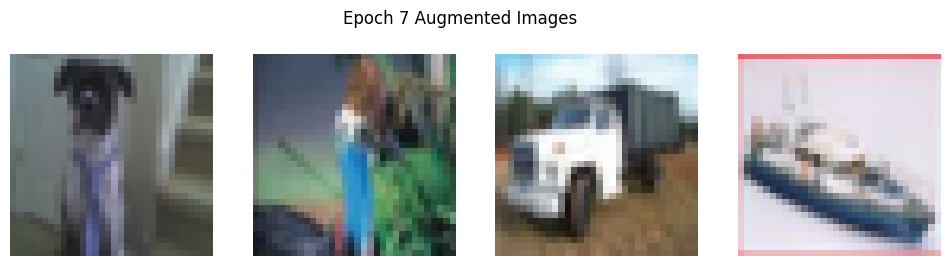

Epoch 8/199, Loss: 0.6934, Train Acc: 0.7663, Val Acc: 0.7717


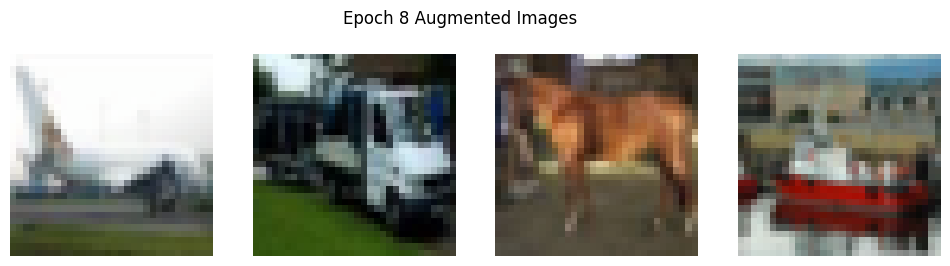

Epoch 9/199, Loss: 0.6429, Train Acc: 0.7807, Val Acc: 0.7514


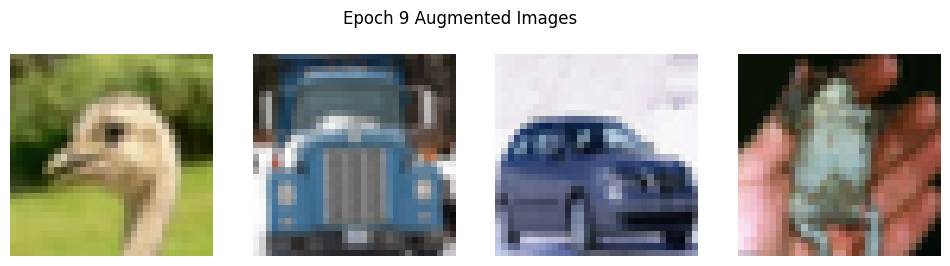

Epoch 10/199, Loss: 0.6096, Train Acc: 0.7925, Val Acc: 0.7630


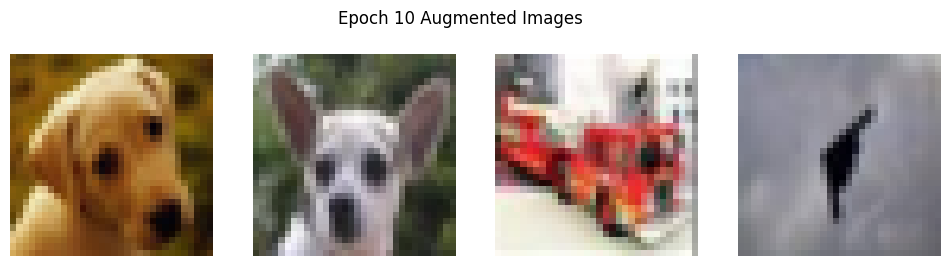

Epoch 11/199, Loss: 0.5912, Train Acc: 0.8008, Val Acc: 0.7617


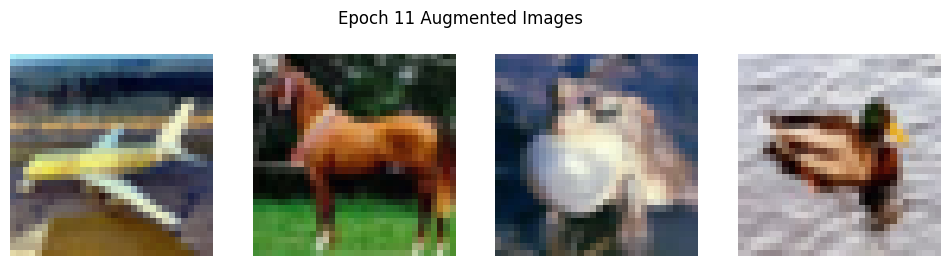

Epoch 12/199, Loss: 0.5728, Train Acc: 0.8056, Val Acc: 0.7566


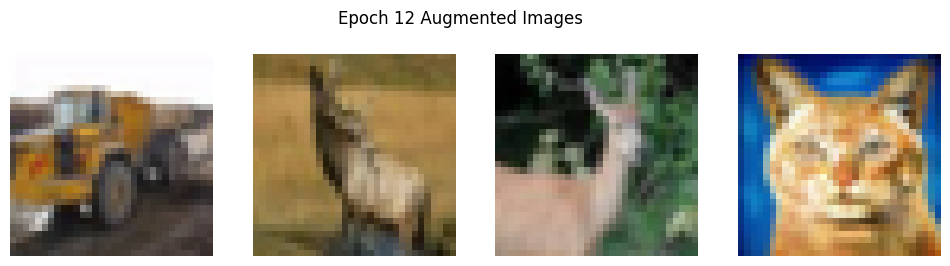

Epoch 13/199, Loss: 0.5532, Train Acc: 0.8129, Val Acc: 0.7780


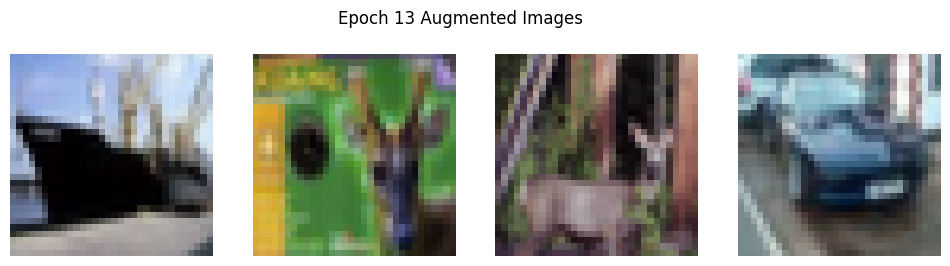

Epoch 14/199, Loss: 0.5287, Train Acc: 0.8218, Val Acc: 0.7811


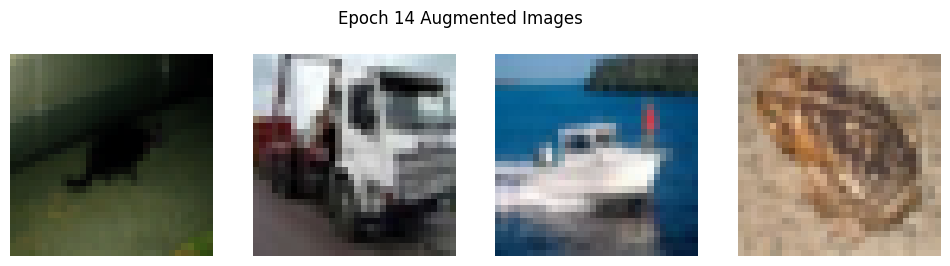

Epoch 15/199, Loss: 0.5150, Train Acc: 0.8265, Val Acc: 0.7857


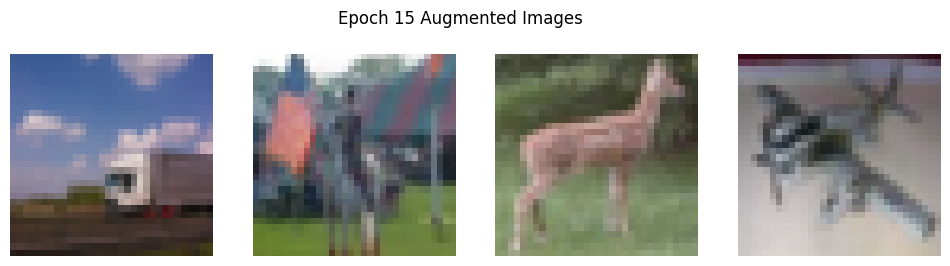

Epoch 16/199, Loss: 0.5224, Train Acc: 0.8266, Val Acc: 0.7902


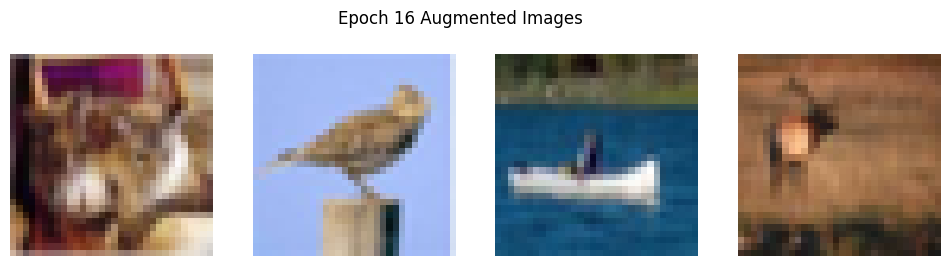

Epoch 17/199, Loss: 0.4917, Train Acc: 0.8337, Val Acc: 0.7827


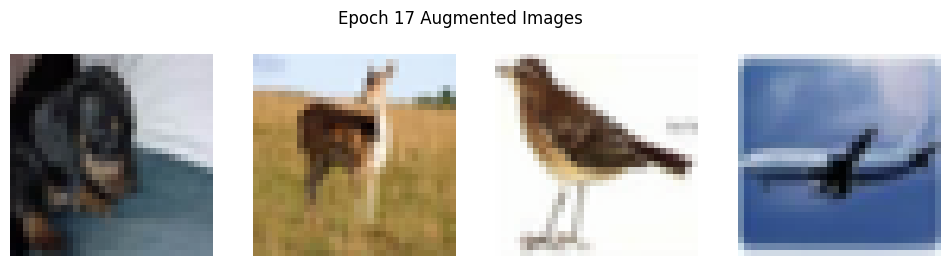

Epoch 18/199, Loss: 0.4734, Train Acc: 0.8400, Val Acc: 0.8031


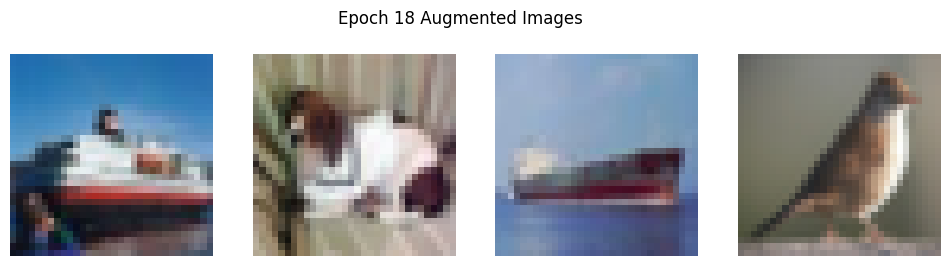

Epoch 19/199, Loss: 0.4551, Train Acc: 0.8475, Val Acc: 0.7730


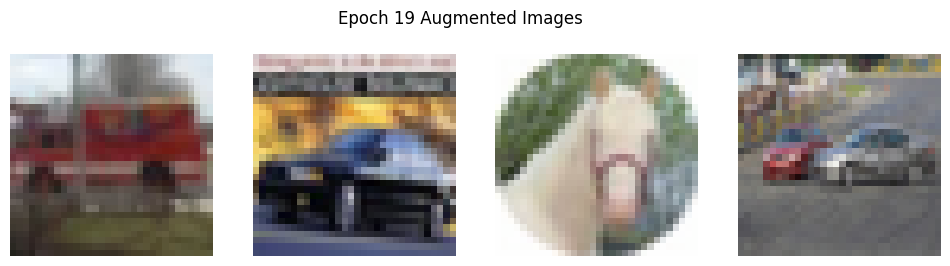

Epoch 20/199, Loss: 0.4557, Train Acc: 0.8468, Val Acc: 0.7963


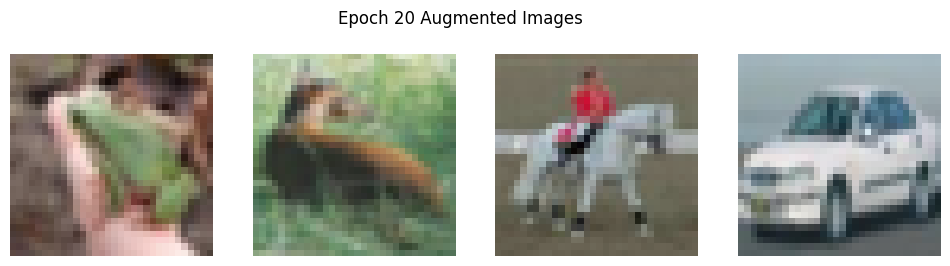

Epoch 21/199, Loss: 0.4565, Train Acc: 0.8464, Val Acc: 0.7962


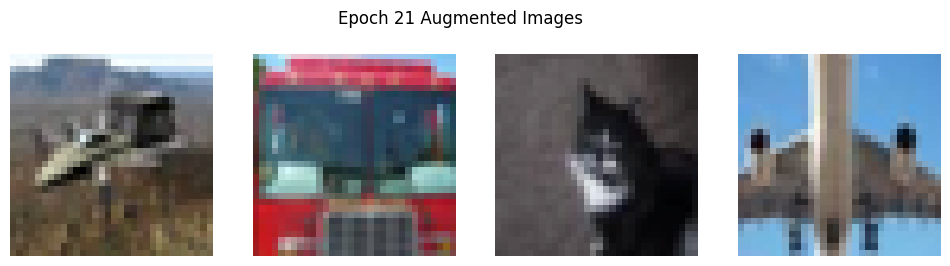

Epoch 22/199, Loss: 0.4373, Train Acc: 0.8520, Val Acc: 0.7719


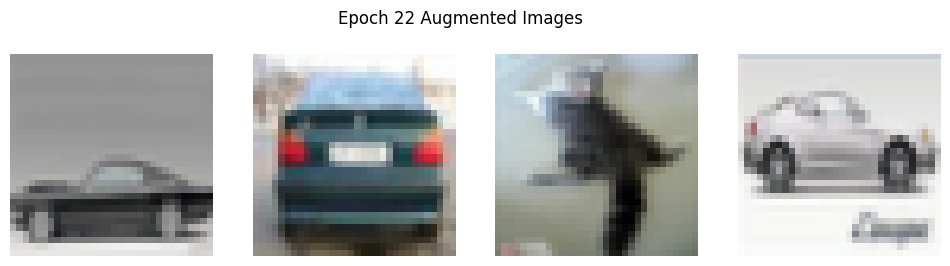

Epoch 23/199, Loss: 0.4209, Train Acc: 0.8594, Val Acc: 0.7659


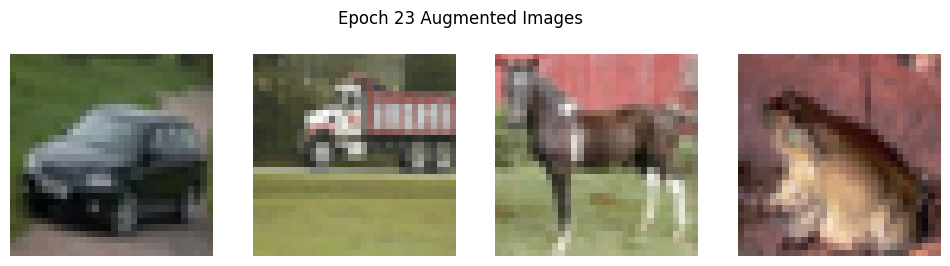

Epoch 24/199, Loss: 0.4401, Train Acc: 0.8523, Val Acc: 0.7861


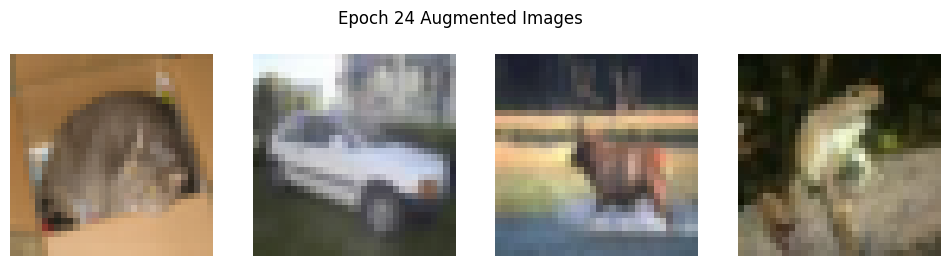

Epoch 25/199, Loss: 0.4246, Train Acc: 0.8581, Val Acc: 0.7797


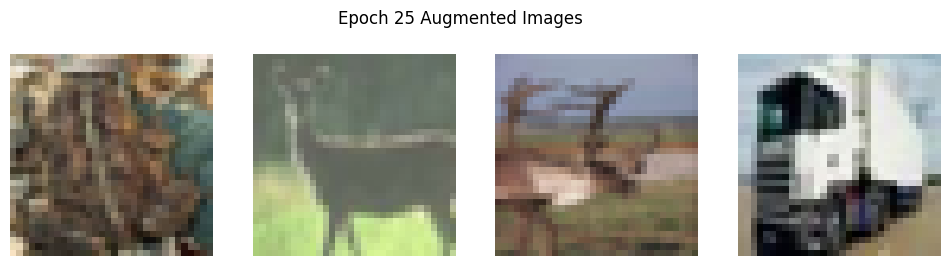

Epoch 26/199, Loss: 0.4138, Train Acc: 0.8609, Val Acc: 0.7749


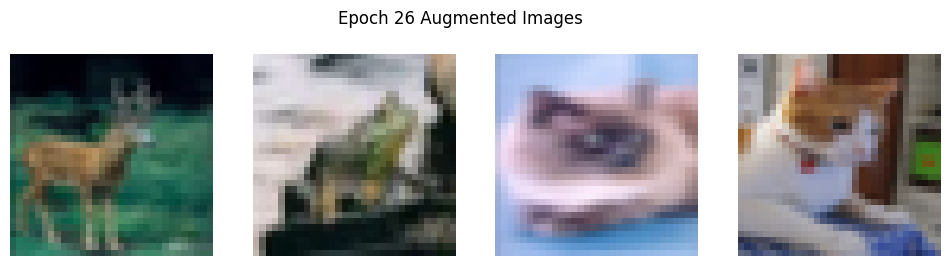

Epoch 27/199, Loss: 0.4202, Train Acc: 0.8588, Val Acc: 0.8026


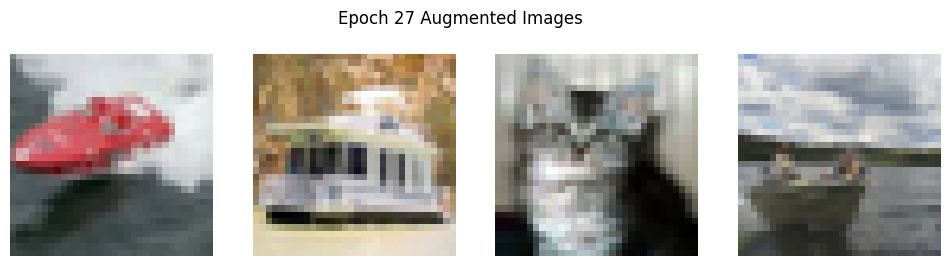

Epoch 28/199, Loss: 0.3936, Train Acc: 0.8700, Val Acc: 0.8063


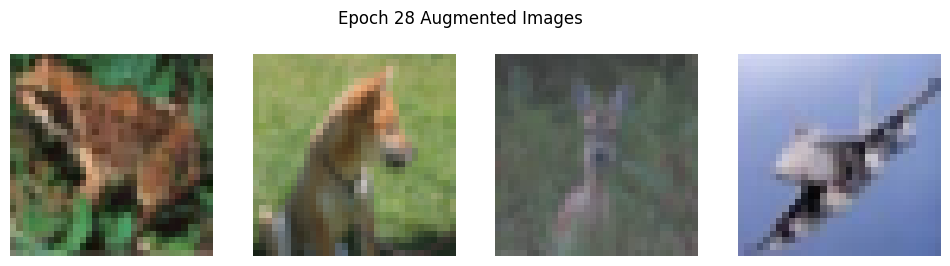

Epoch 29/199, Loss: 0.3960, Train Acc: 0.8680, Val Acc: 0.7832


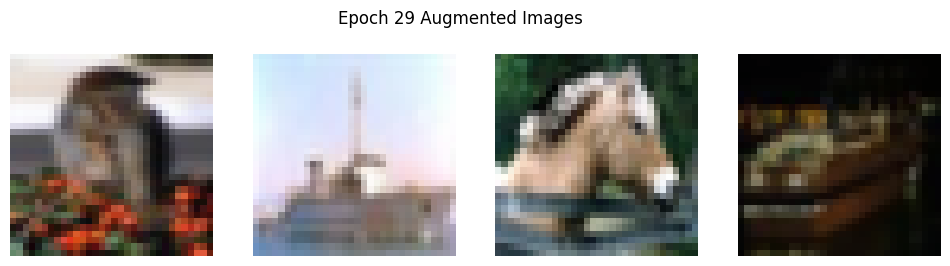

Epoch 30/199, Loss: 0.3949, Train Acc: 0.8687, Val Acc: 0.8073


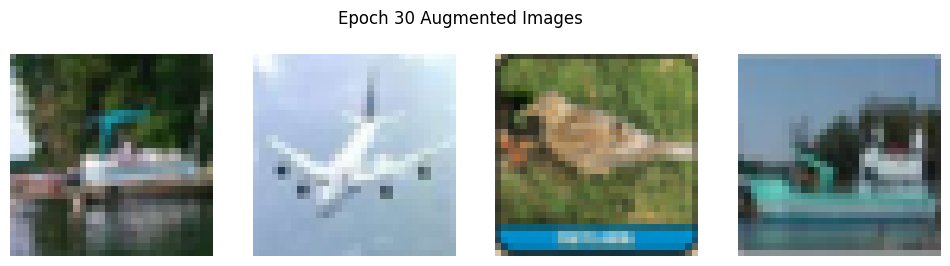

Epoch 31/199, Loss: 0.3796, Train Acc: 0.8749, Val Acc: 0.7905


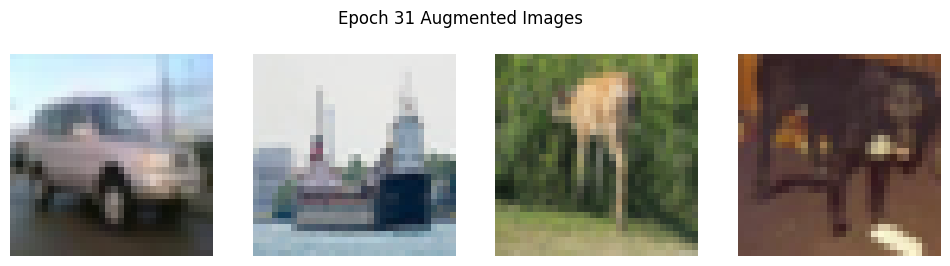

Epoch 32/199, Loss: 0.3917, Train Acc: 0.8701, Val Acc: 0.8050


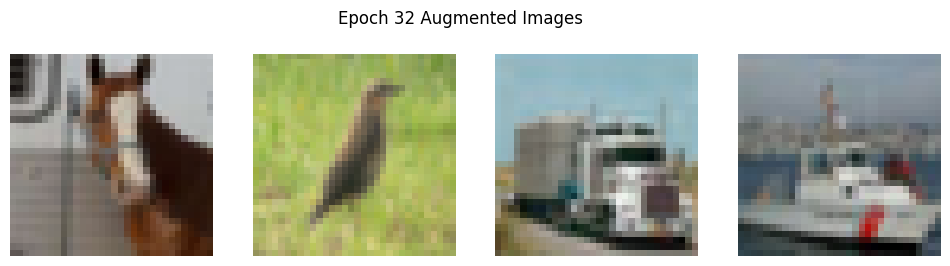

Epoch 33/199, Loss: 0.3827, Train Acc: 0.8713, Val Acc: 0.7976


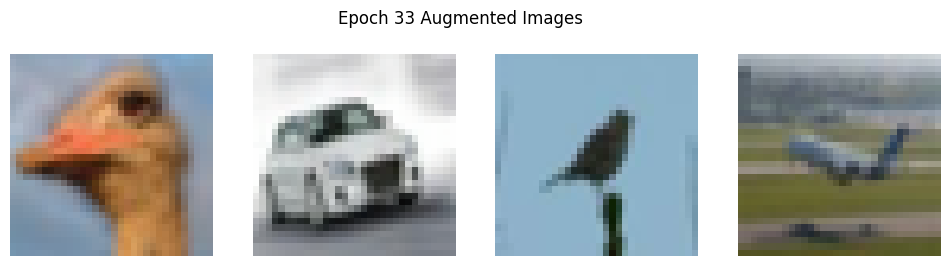

Epoch 34/199, Loss: 0.3785, Train Acc: 0.8738, Val Acc: 0.8142


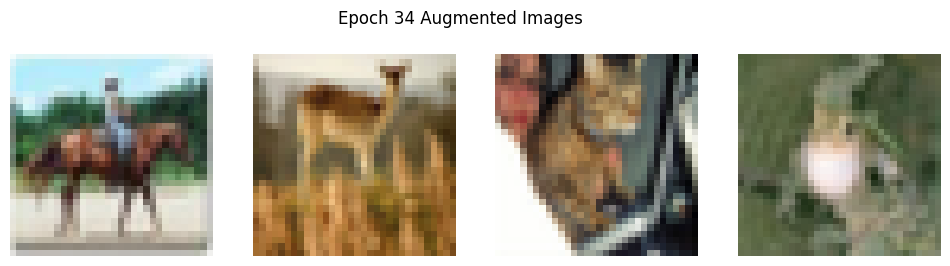

Epoch 35/199, Loss: 0.3839, Train Acc: 0.8725, Val Acc: 0.7842


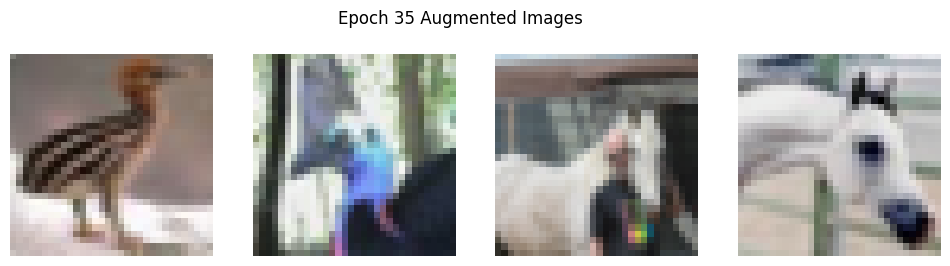

Epoch 36/199, Loss: 0.3698, Train Acc: 0.8772, Val Acc: 0.8116


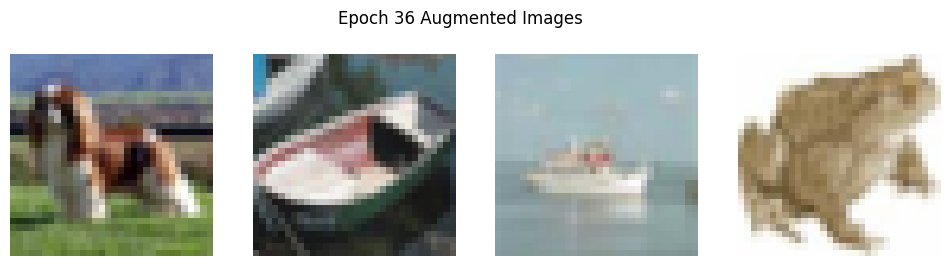

Epoch 37/199, Loss: 0.3603, Train Acc: 0.8797, Val Acc: 0.8136


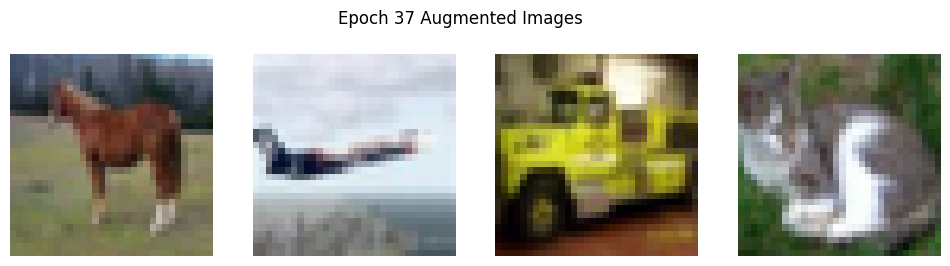

Epoch 38/199, Loss: 0.3751, Train Acc: 0.8746, Val Acc: 0.8021


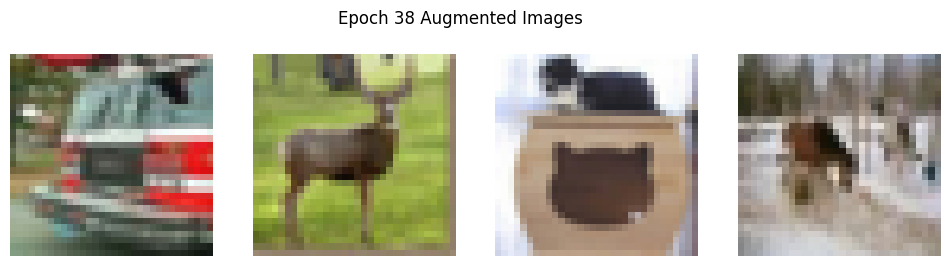

Epoch 39/199, Loss: 0.3637, Train Acc: 0.8774, Val Acc: 0.8068


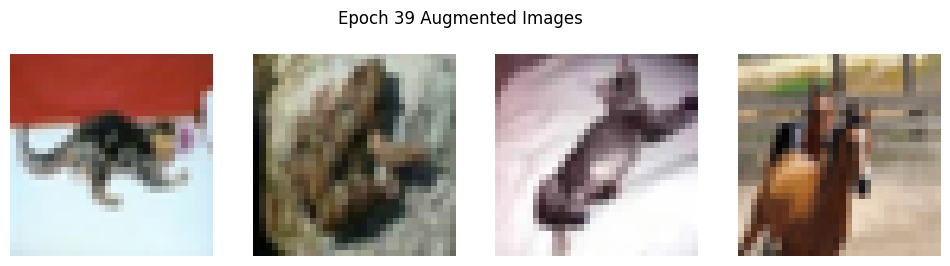

Epoch 40/199, Loss: 0.3662, Train Acc: 0.8782, Val Acc: 0.8040


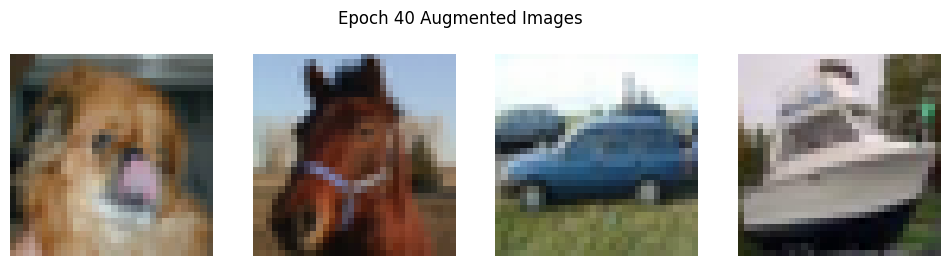

Epoch 41/199, Loss: 0.3701, Train Acc: 0.8773, Val Acc: 0.8063


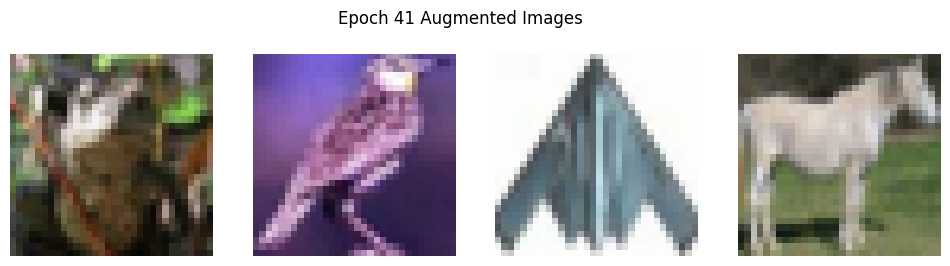

Epoch 42/199, Loss: 0.3587, Train Acc: 0.8814, Val Acc: 0.8058


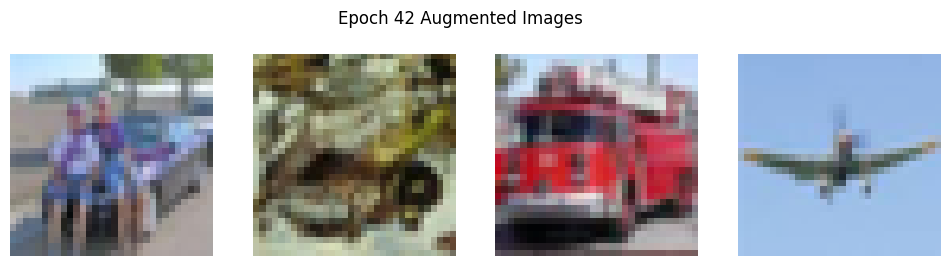

Epoch 43/199, Loss: 0.3518, Train Acc: 0.8823, Val Acc: 0.8061


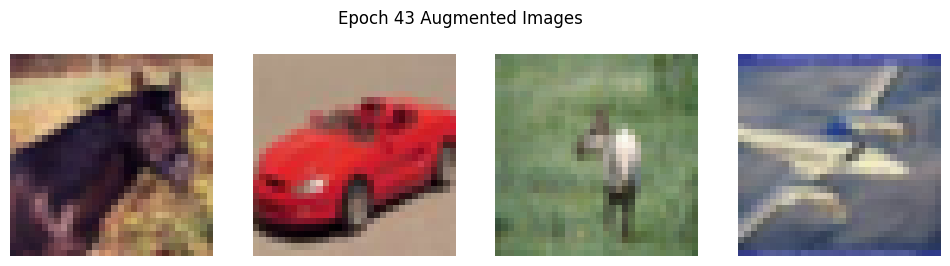

Epoch 44/199, Loss: 0.3503, Train Acc: 0.8824, Val Acc: 0.7933


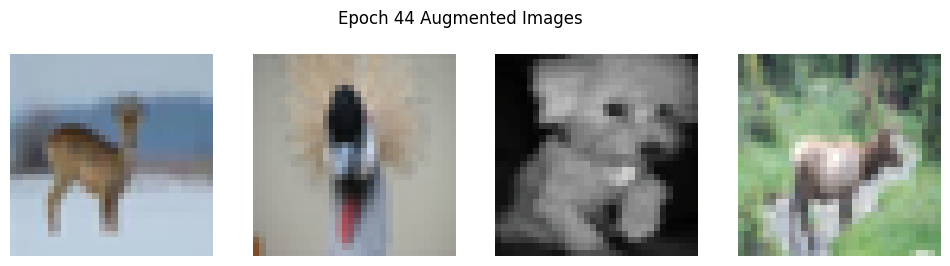

Epoch 45/199, Loss: 0.3612, Train Acc: 0.8796, Val Acc: 0.8112
Epoch 00046: reducing learning rate of group 0 to 1.0000e-02.


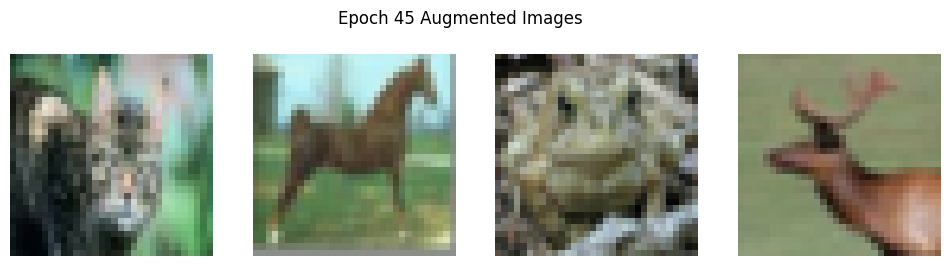

Epoch 46/199, Loss: 0.1137, Train Acc: 0.9625, Val Acc: 0.8564


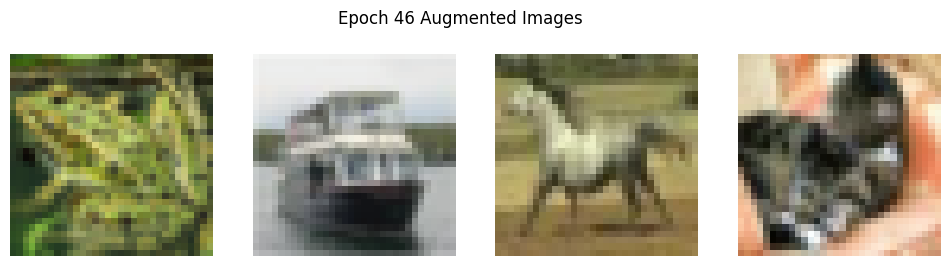

Epoch 47/199, Loss: 0.0487, Train Acc: 0.9846, Val Acc: 0.8566


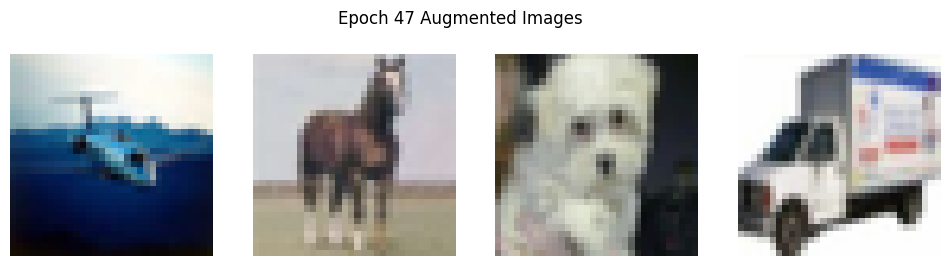

Epoch 48/199, Loss: 0.0301, Train Acc: 0.9909, Val Acc: 0.8608


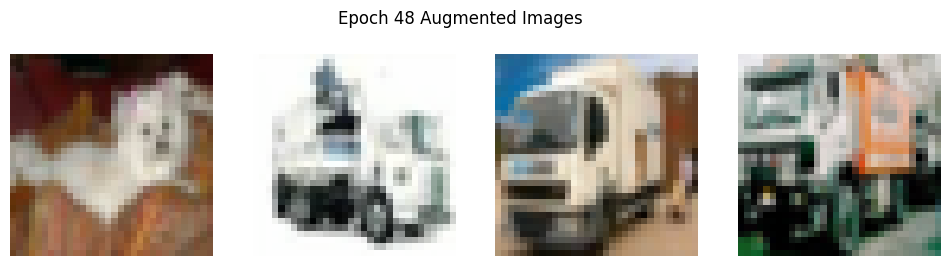

Epoch 49/199, Loss: 0.0188, Train Acc: 0.9951, Val Acc: 0.8614


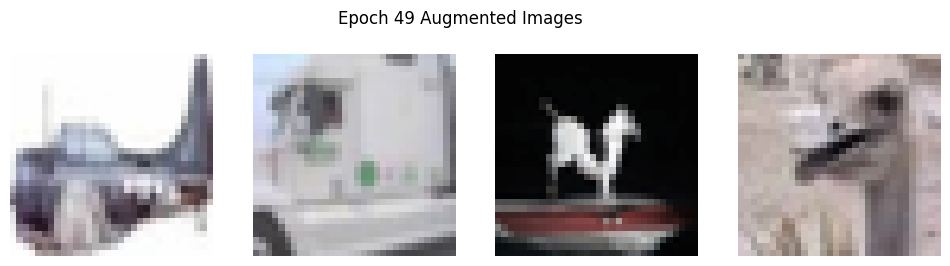

Epoch 50/199, Loss: 0.0129, Train Acc: 0.9970, Val Acc: 0.8609


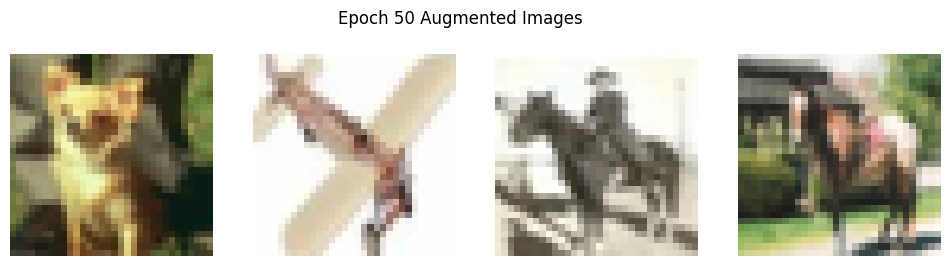

Epoch 51/199, Loss: 0.0107, Train Acc: 0.9979, Val Acc: 0.8625


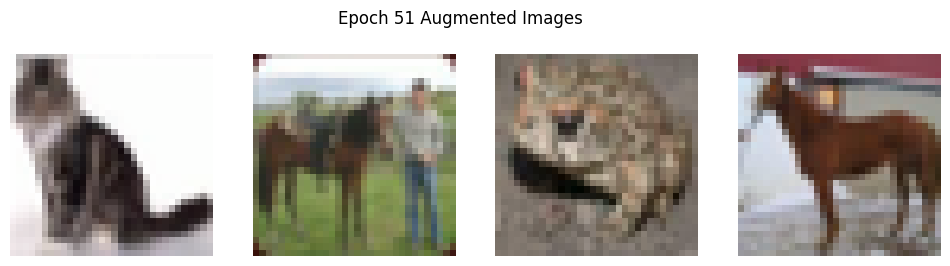

Epoch 52/199, Loss: 0.0093, Train Acc: 0.9981, Val Acc: 0.8655


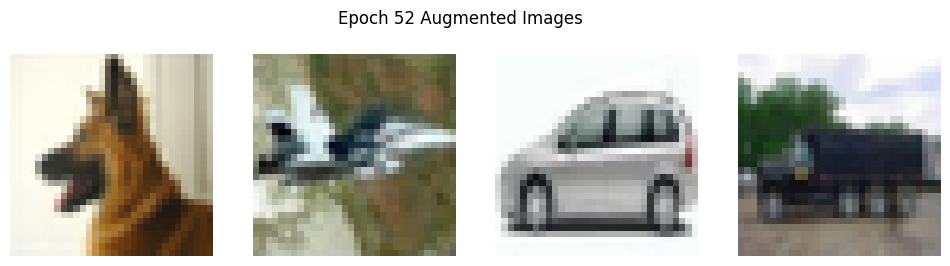

Epoch 53/199, Loss: 0.0078, Train Acc: 0.9987, Val Acc: 0.8647


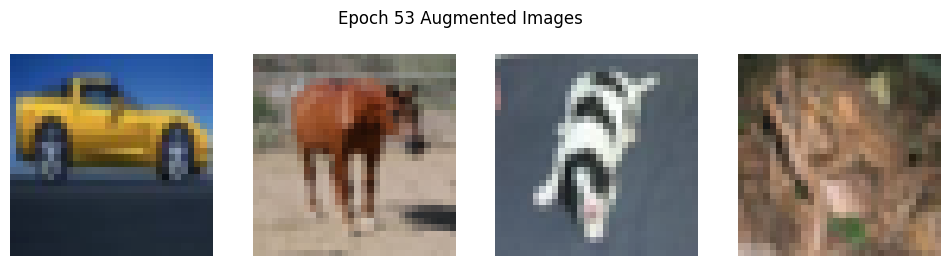

Epoch 54/199, Loss: 0.0072, Train Acc: 0.9990, Val Acc: 0.8668


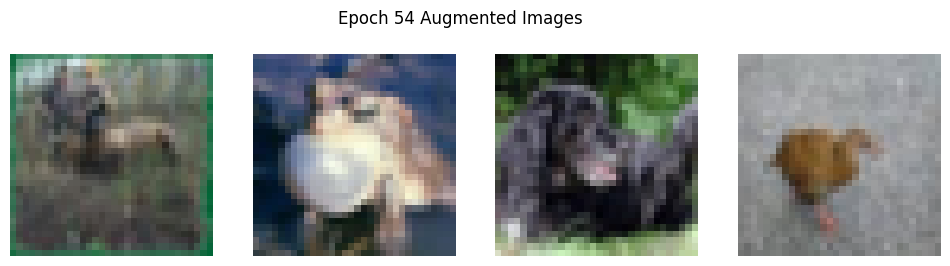

Epoch 55/199, Loss: 0.0066, Train Acc: 0.9991, Val Acc: 0.8661


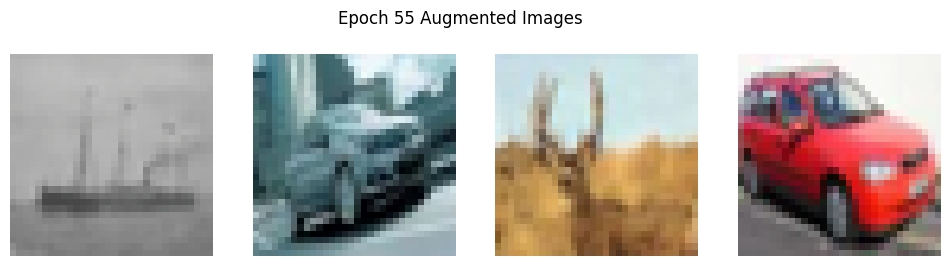

Epoch 56/199, Loss: 0.0066, Train Acc: 0.9991, Val Acc: 0.8674


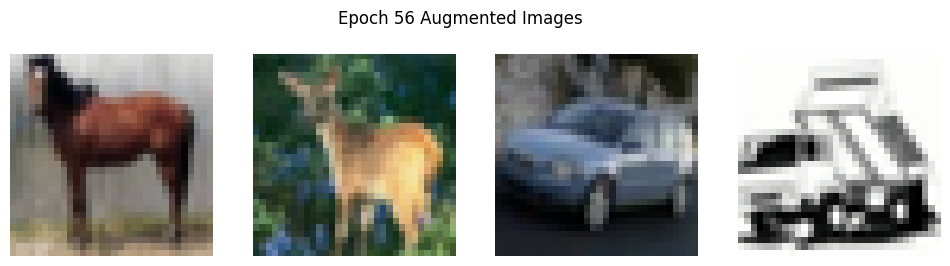

Epoch 57/199, Loss: 0.0068, Train Acc: 0.9992, Val Acc: 0.8669


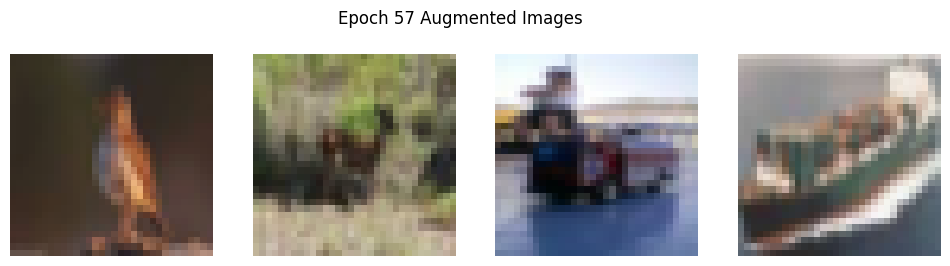

Epoch 58/199, Loss: 0.0060, Train Acc: 0.9993, Val Acc: 0.8673


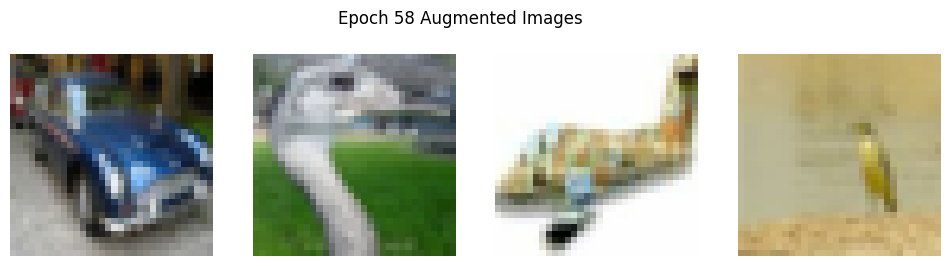

Epoch 59/199, Loss: 0.0058, Train Acc: 0.9994, Val Acc: 0.8661


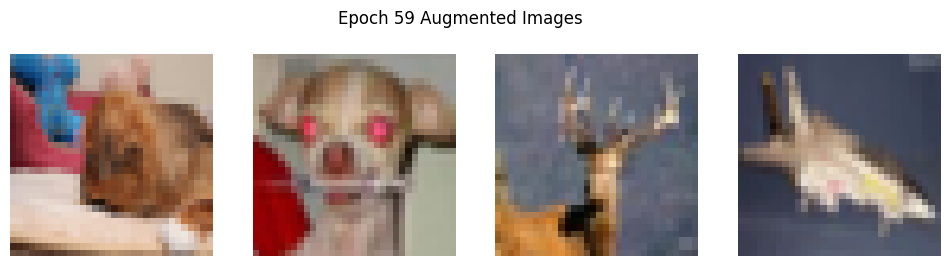

Epoch 60/199, Loss: 0.0059, Train Acc: 0.9994, Val Acc: 0.8668


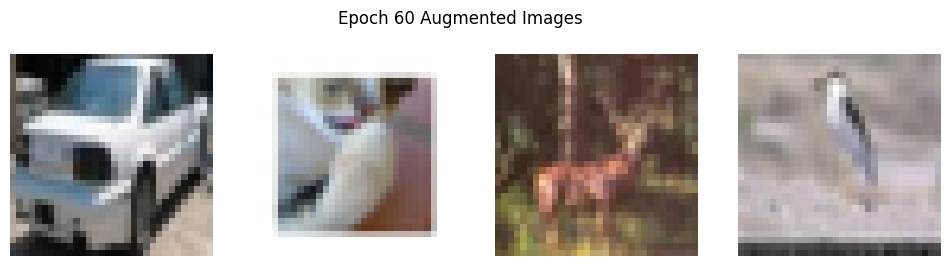

Epoch 61/199, Loss: 0.0062, Train Acc: 0.9993, Val Acc: 0.8660


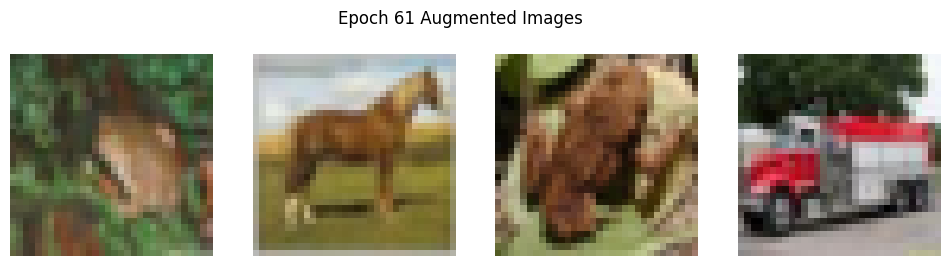

Epoch 62/199, Loss: 0.0060, Train Acc: 0.9994, Val Acc: 0.8660


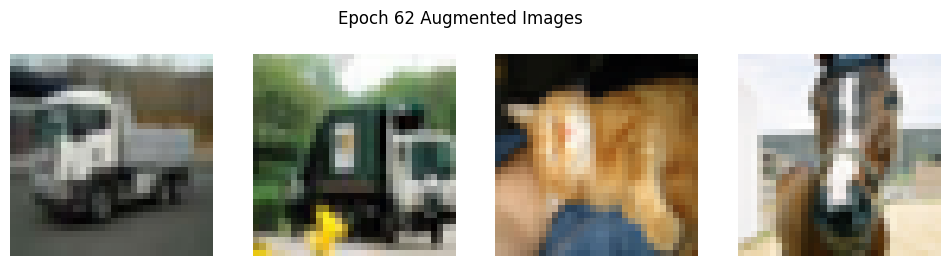

Epoch 63/199, Loss: 0.0059, Train Acc: 0.9993, Val Acc: 0.8652


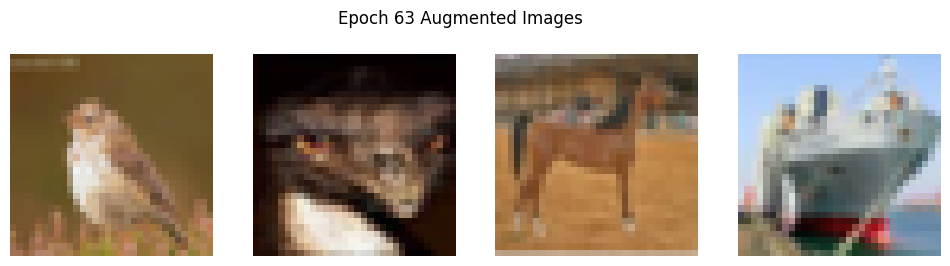

Epoch 64/199, Loss: 0.0064, Train Acc: 0.9992, Val Acc: 0.8668


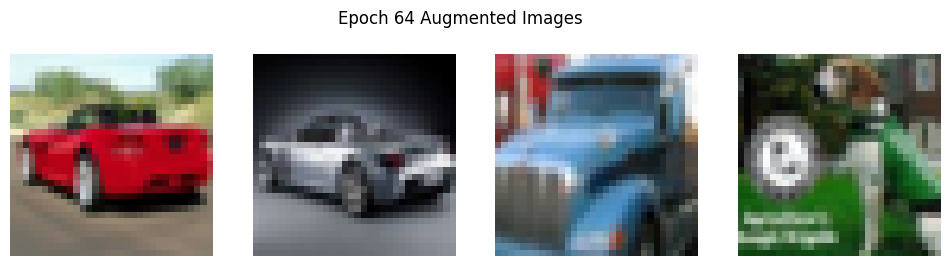

Epoch 65/199, Loss: 0.0065, Train Acc: 0.9992, Val Acc: 0.8680


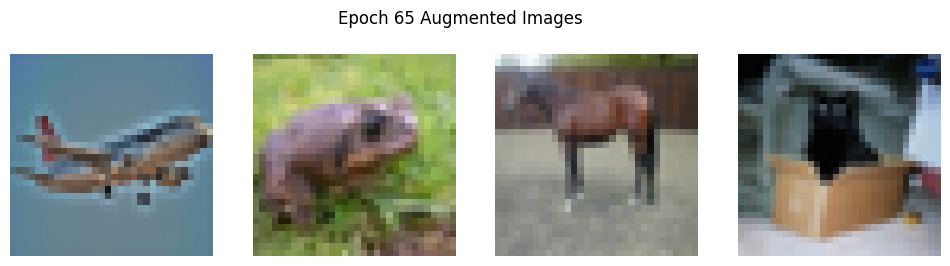

Epoch 66/199, Loss: 0.0065, Train Acc: 0.9994, Val Acc: 0.8697


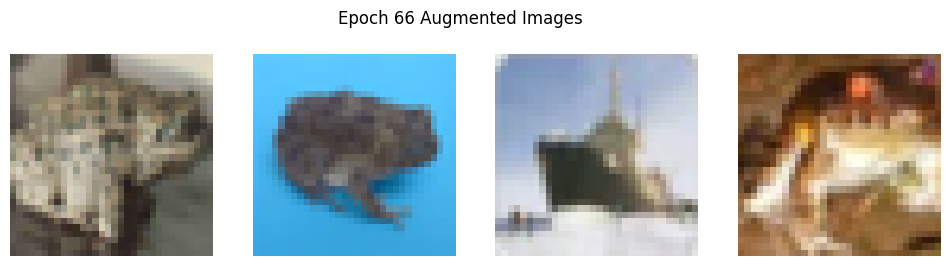

Epoch 67/199, Loss: 0.0069, Train Acc: 0.9993, Val Acc: 0.8684


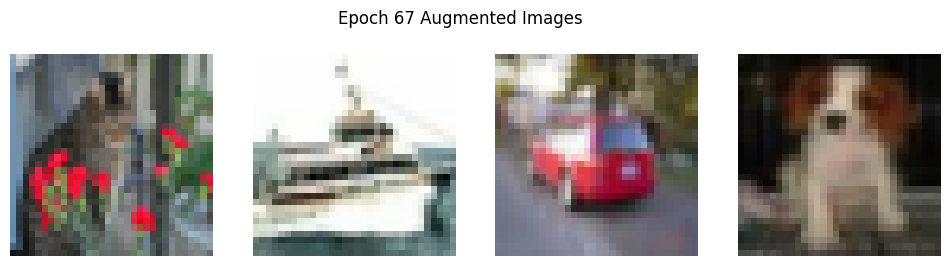

Epoch 68/199, Loss: 0.0062, Train Acc: 0.9996, Val Acc: 0.8683


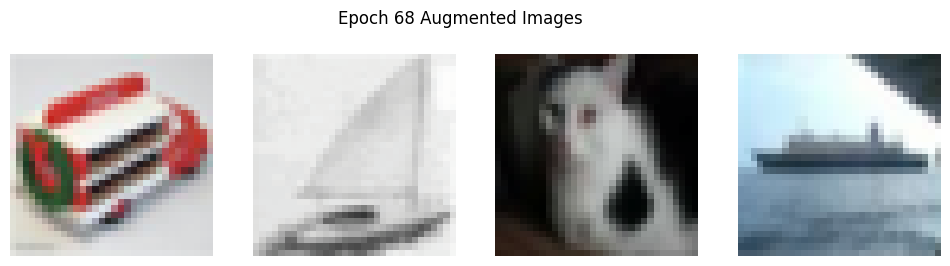

Epoch 69/199, Loss: 0.0067, Train Acc: 0.9994, Val Acc: 0.8684


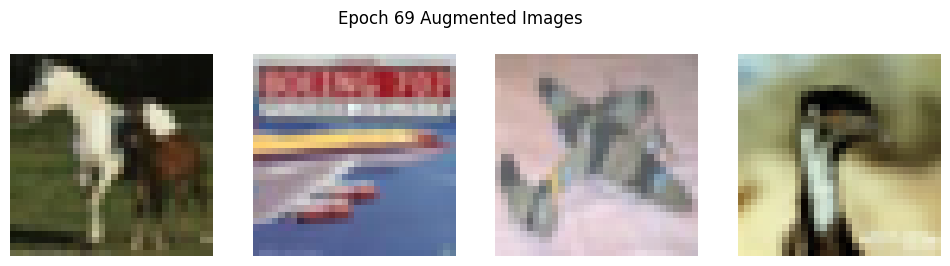

Epoch 70/199, Loss: 0.0076, Train Acc: 0.9991, Val Acc: 0.8676


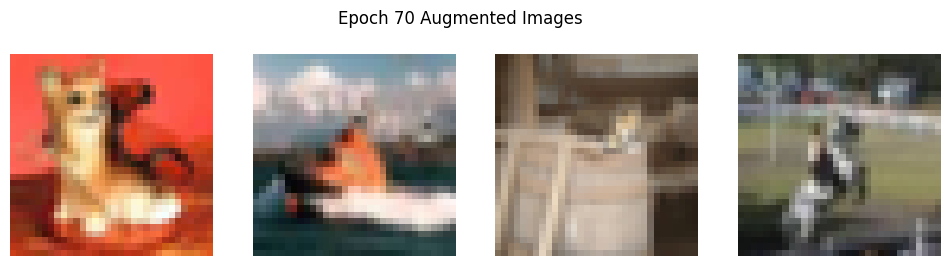

Epoch 71/199, Loss: 0.0071, Train Acc: 0.9992, Val Acc: 0.8658


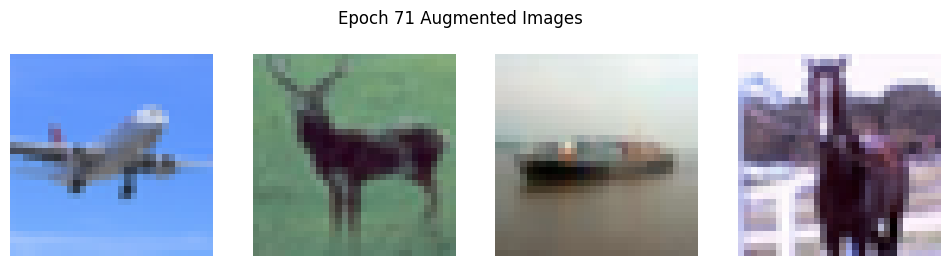

Epoch 72/199, Loss: 0.0075, Train Acc: 0.9992, Val Acc: 0.8673


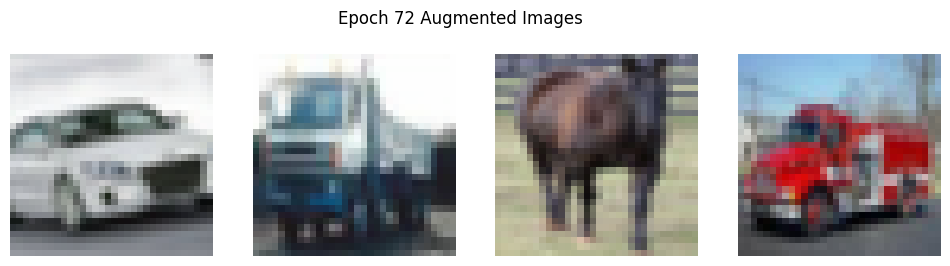

Epoch 73/199, Loss: 0.0069, Train Acc: 0.9994, Val Acc: 0.8697


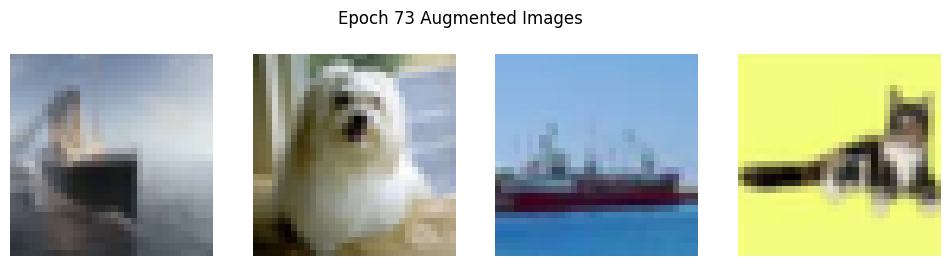

Epoch 74/199, Loss: 0.0074, Train Acc: 0.9992, Val Acc: 0.8678


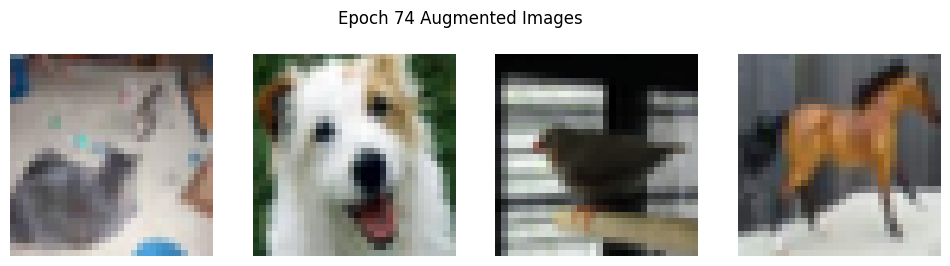

Epoch 75/199, Loss: 0.0072, Train Acc: 0.9995, Val Acc: 0.8691


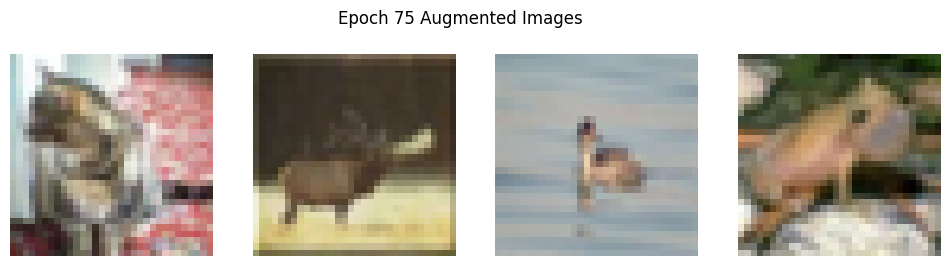

Epoch 76/199, Loss: 0.0076, Train Acc: 0.9992, Val Acc: 0.8674


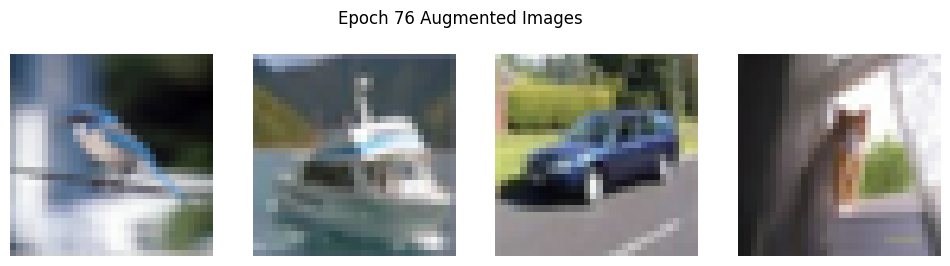

Epoch 77/199, Loss: 0.0077, Train Acc: 0.9992, Val Acc: 0.8690
Epoch 00078: reducing learning rate of group 0 to 1.0000e-03.


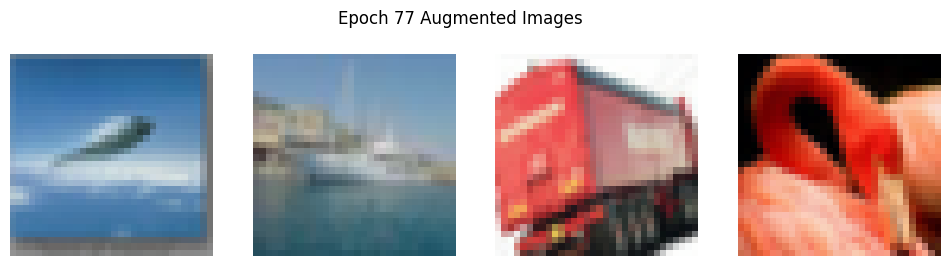

Epoch 78/199, Loss: 0.0056, Train Acc: 0.9998, Val Acc: 0.8691


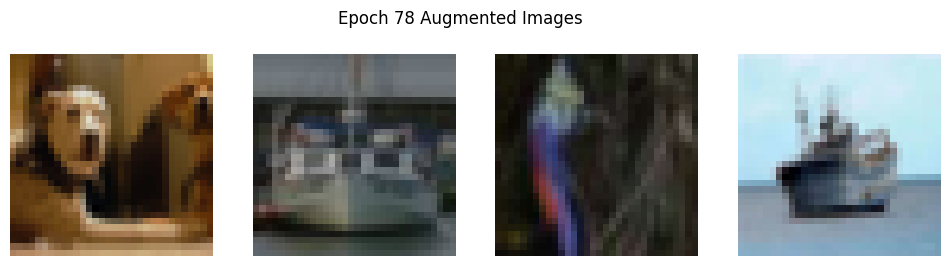

Epoch 79/199, Loss: 0.0053, Train Acc: 0.9998, Val Acc: 0.8702


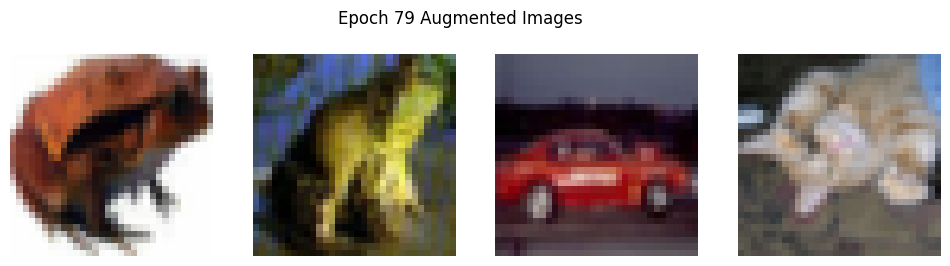

Epoch 80/199, Loss: 0.0052, Train Acc: 0.9997, Val Acc: 0.8693


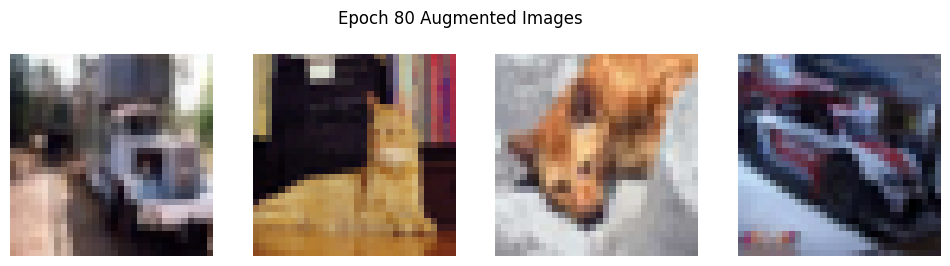

Epoch 81/199, Loss: 0.0050, Train Acc: 0.9999, Val Acc: 0.8689


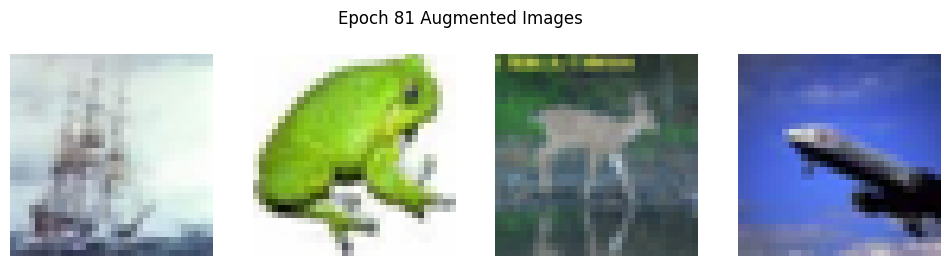

Epoch 82/199, Loss: 0.0050, Train Acc: 0.9998, Val Acc: 0.8694


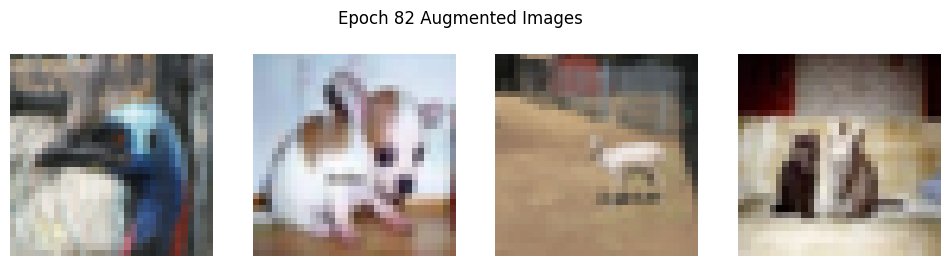

Epoch 83/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8687


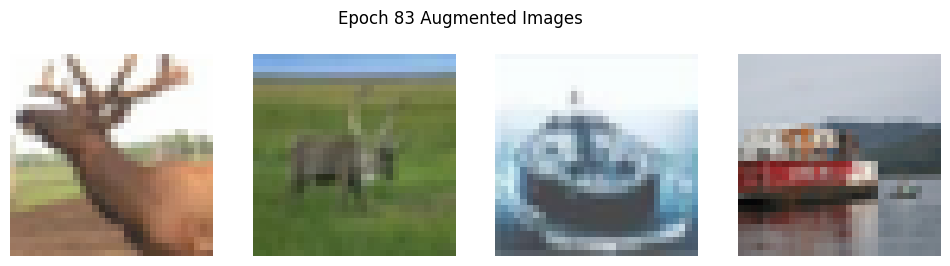

Epoch 84/199, Loss: 0.0049, Train Acc: 0.9997, Val Acc: 0.8701


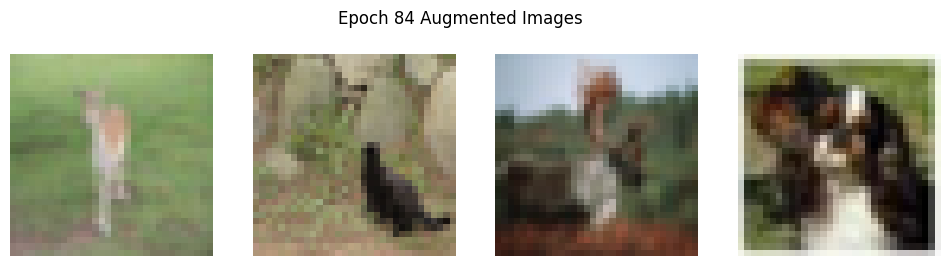

Epoch 85/199, Loss: 0.0050, Train Acc: 0.9997, Val Acc: 0.8692


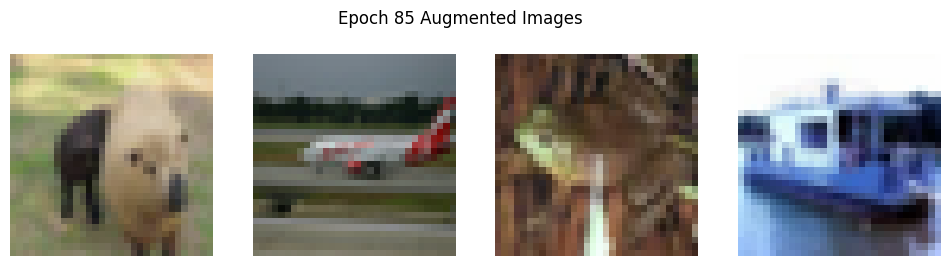

Epoch 86/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8693


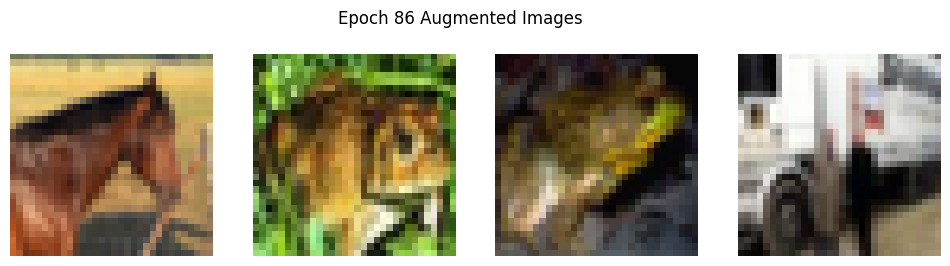

Epoch 87/199, Loss: 0.0049, Train Acc: 0.9997, Val Acc: 0.8688


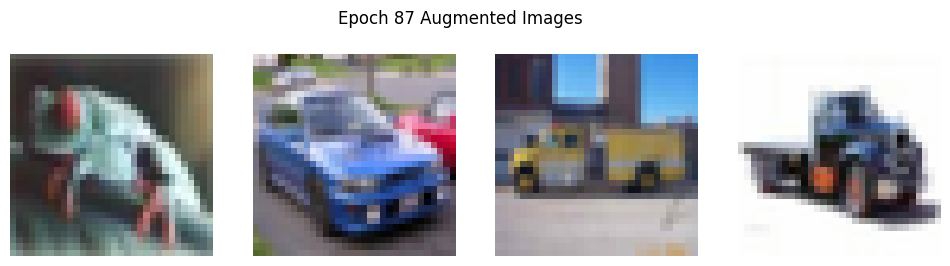

Epoch 88/199, Loss: 0.0050, Train Acc: 0.9997, Val Acc: 0.8702


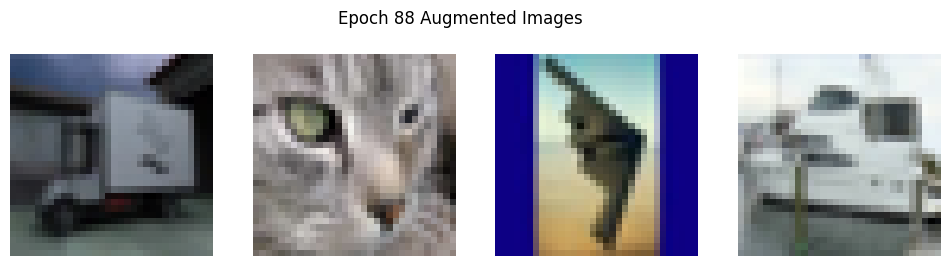

Epoch 89/199, Loss: 0.0049, Train Acc: 0.9999, Val Acc: 0.8700


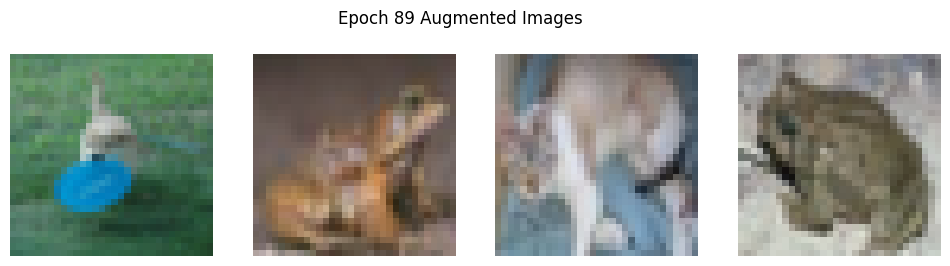

Epoch 90/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8695
Epoch 00091: reducing learning rate of group 0 to 1.0000e-04.


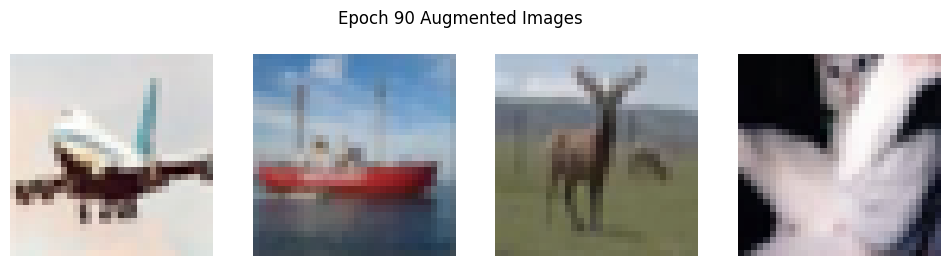

Epoch 91/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8698


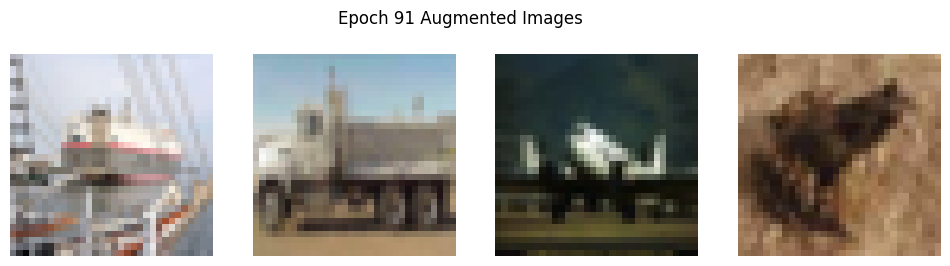

Epoch 92/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8703


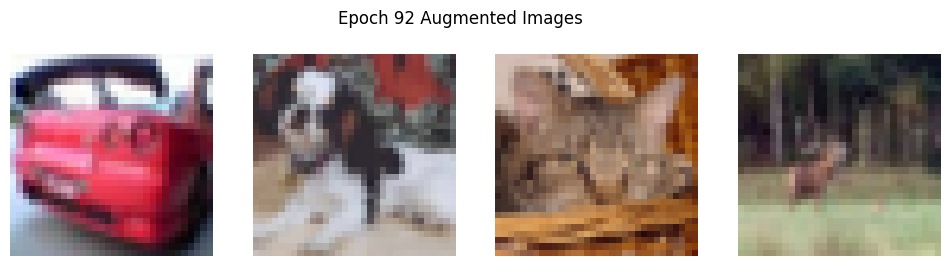

Epoch 93/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8700


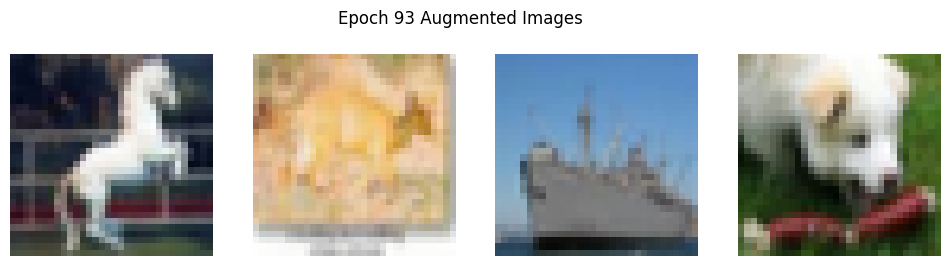

Epoch 94/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8703


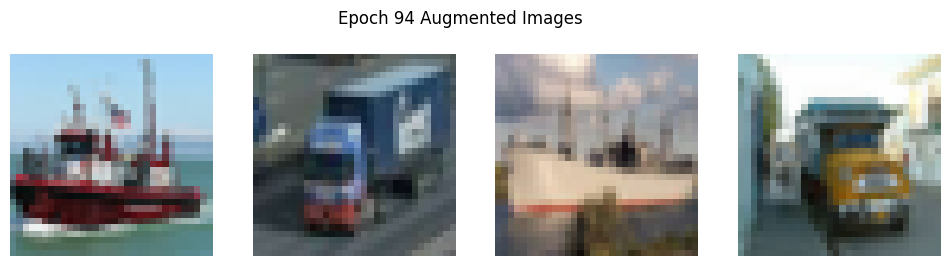

Epoch 95/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8703


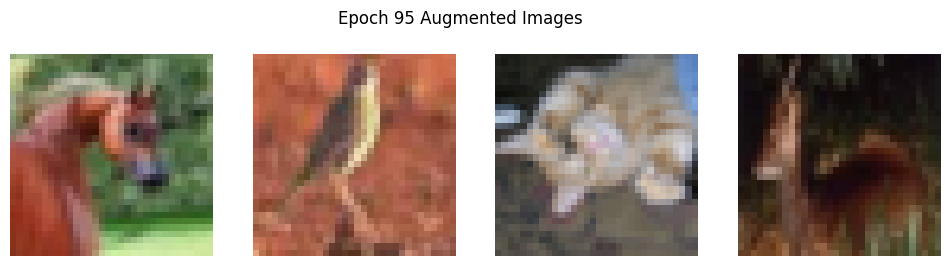

Epoch 96/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


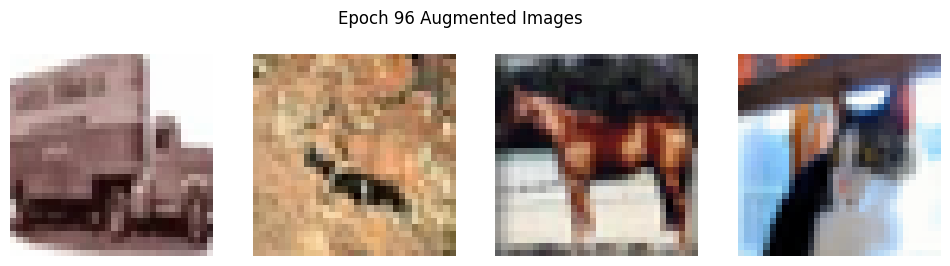

Epoch 97/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8703


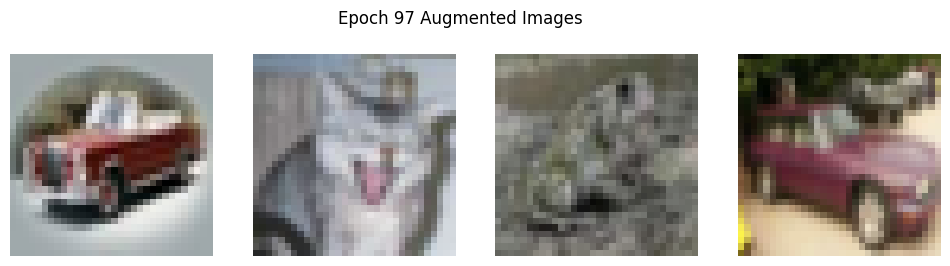

Epoch 98/199, Loss: 0.0050, Train Acc: 0.9997, Val Acc: 0.8698


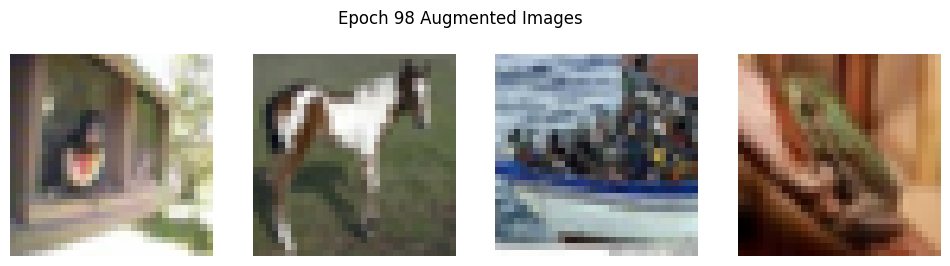

Epoch 99/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8696


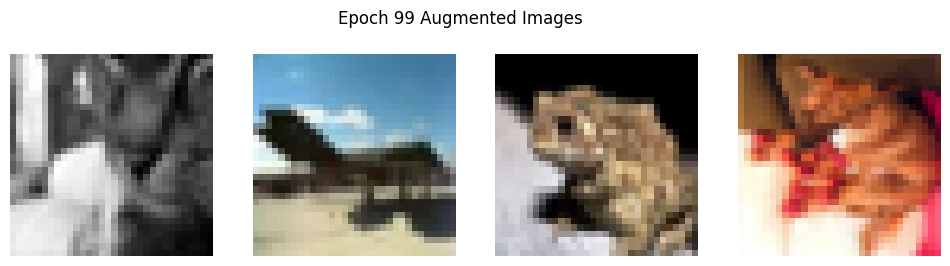

Epoch 100/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8700


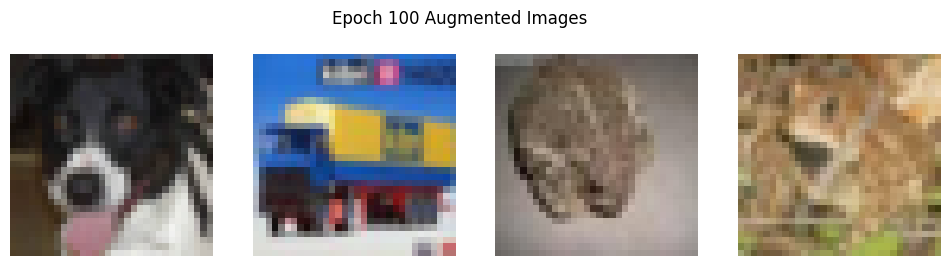

Epoch 101/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8702


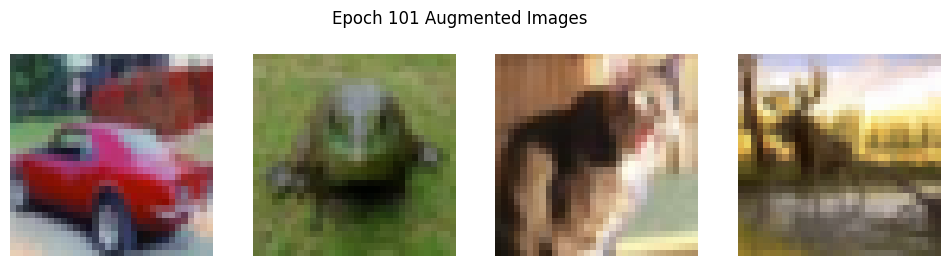

Epoch 102/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8700


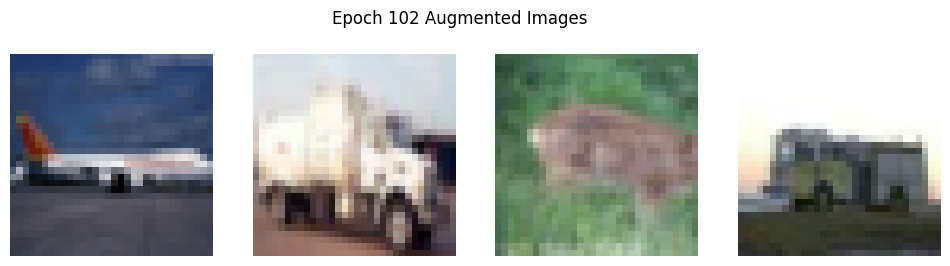

Epoch 103/199, Loss: 0.0048, Train Acc: 0.9997, Val Acc: 0.8703
Epoch 00104: reducing learning rate of group 0 to 1.0000e-05.


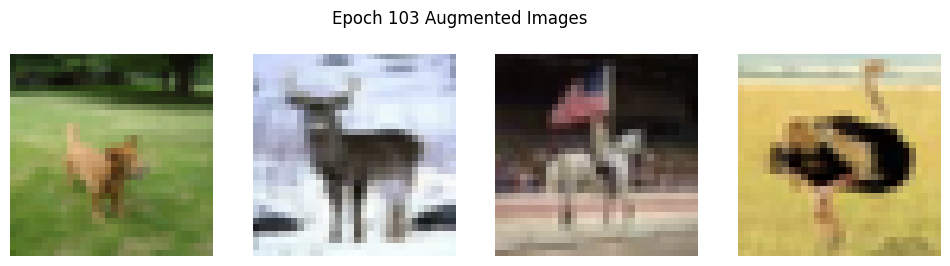

Epoch 104/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8703


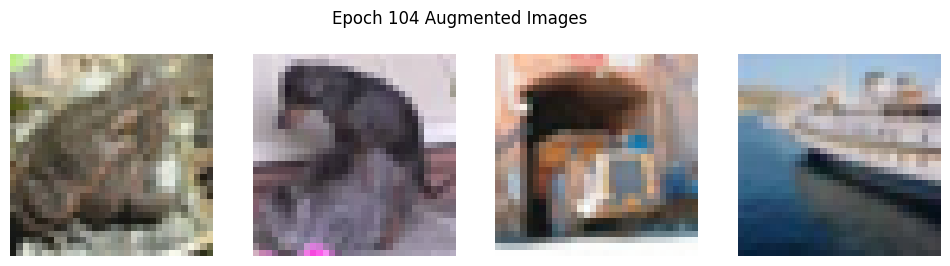

Epoch 105/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8700


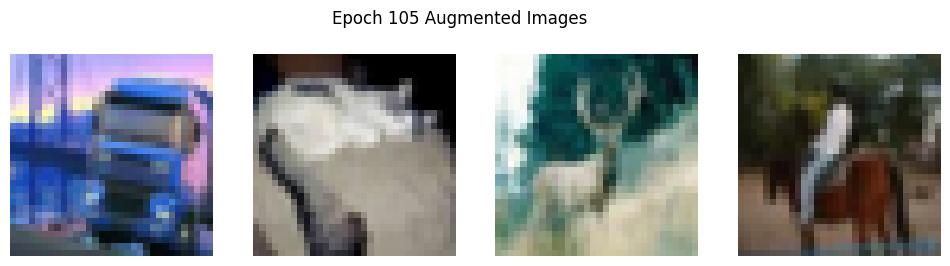

Epoch 106/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8700


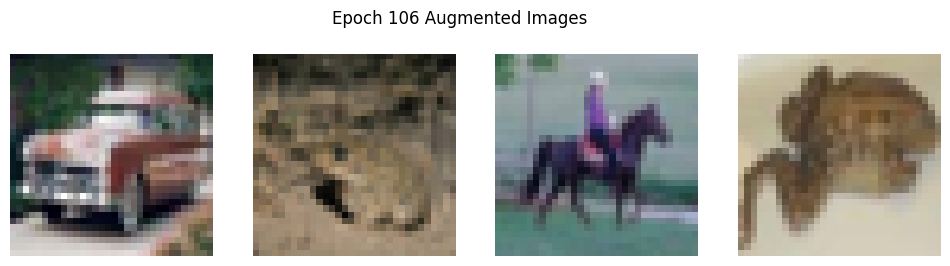

Epoch 107/199, Loss: 0.0048, Train Acc: 0.9999, Val Acc: 0.8704


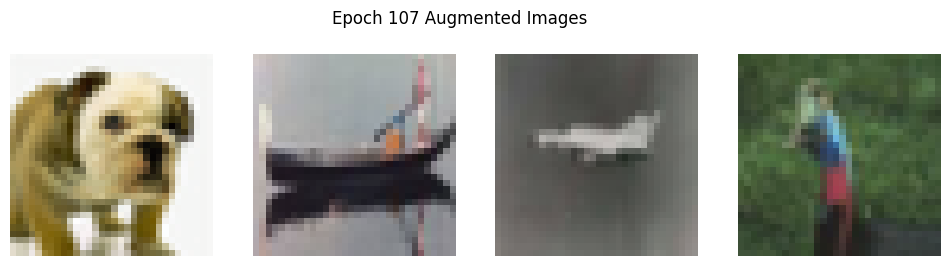

Epoch 108/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8703


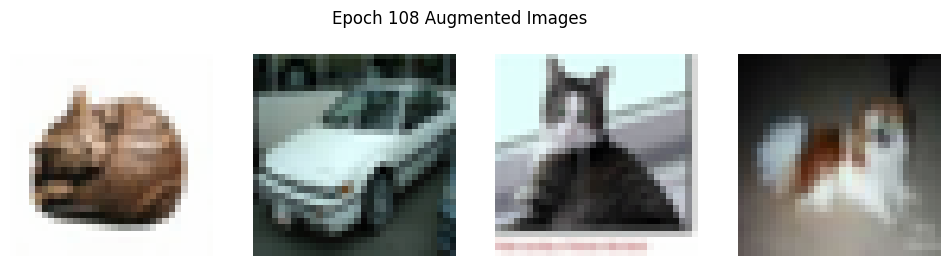

Epoch 109/199, Loss: 0.0050, Train Acc: 0.9997, Val Acc: 0.8703


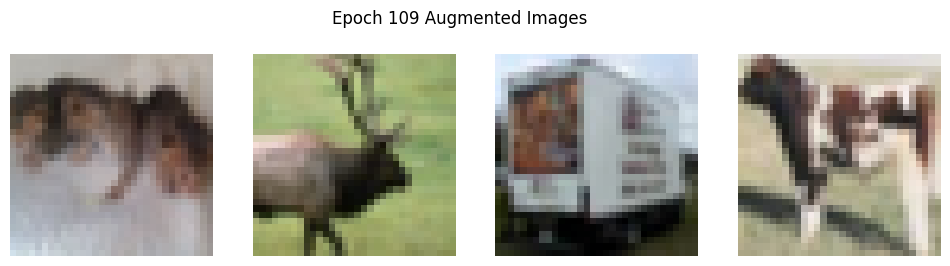

Epoch 110/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8705


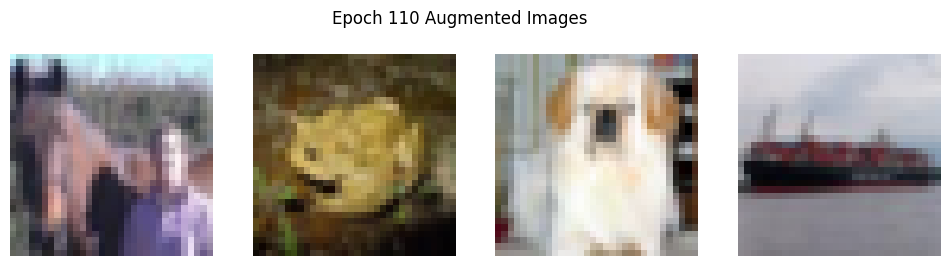

Epoch 111/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8705


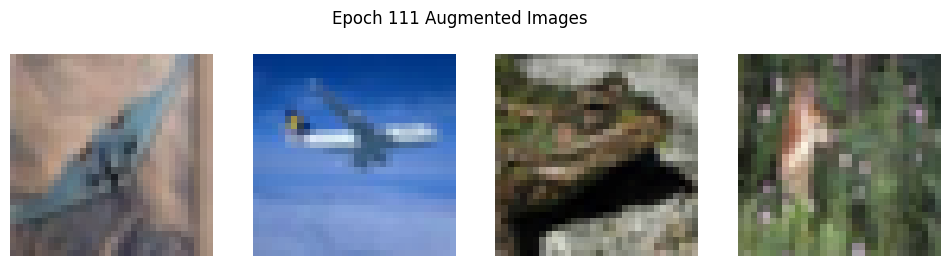

Epoch 112/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8704


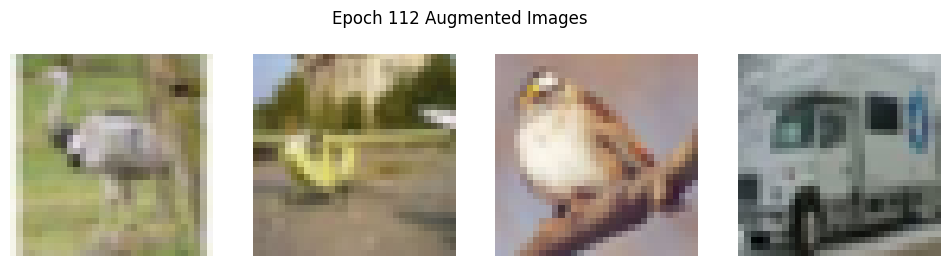

Epoch 113/199, Loss: 0.0048, Train Acc: 0.9997, Val Acc: 0.8704


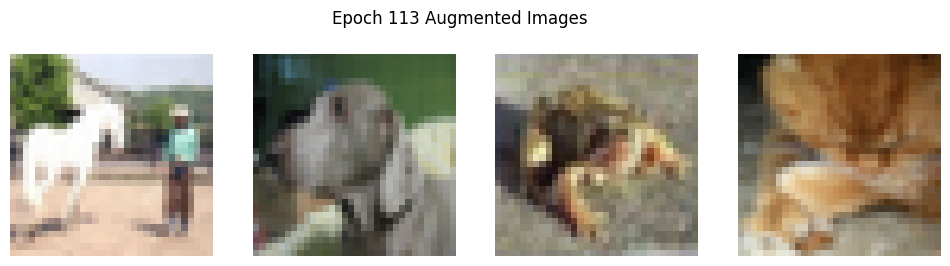

Epoch 114/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8703


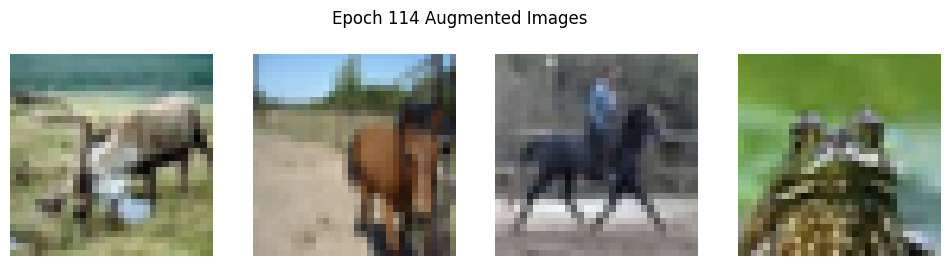

Epoch 115/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8703


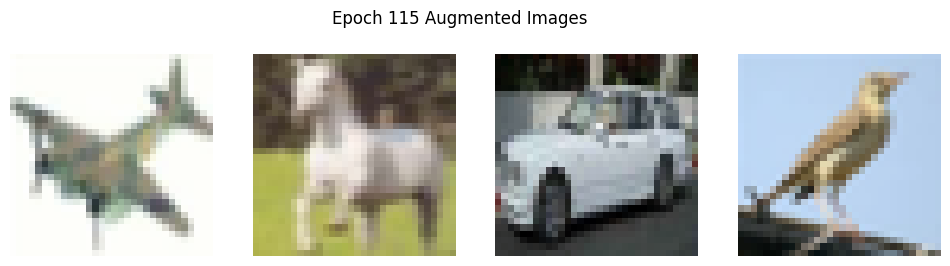

Epoch 116/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8702


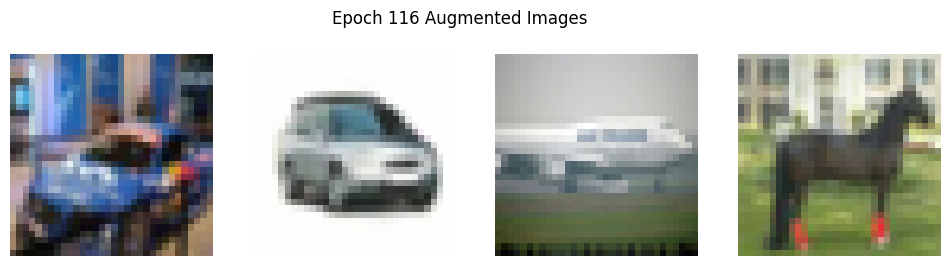

Epoch 117/199, Loss: 0.0050, Train Acc: 0.9998, Val Acc: 0.8701


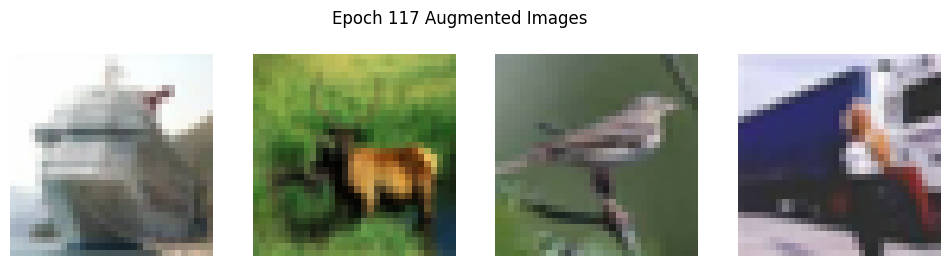

Epoch 118/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8702


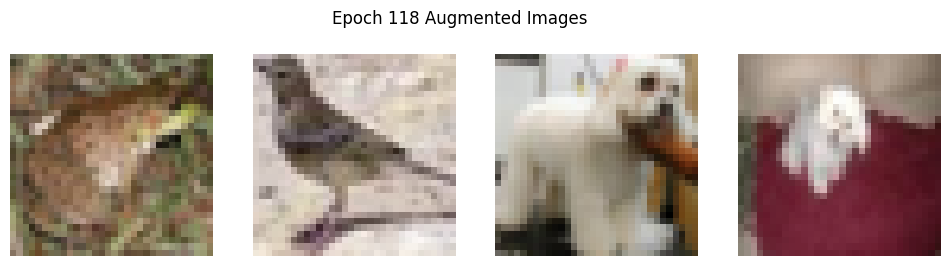

Epoch 119/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8701


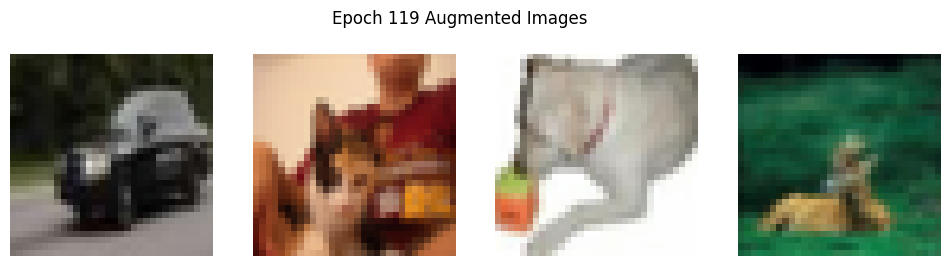

Epoch 120/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8702


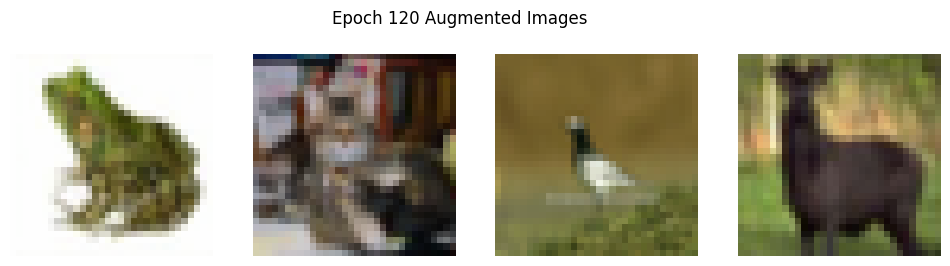

Epoch 121/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8701
Epoch 00122: reducing learning rate of group 0 to 1.0000e-06.


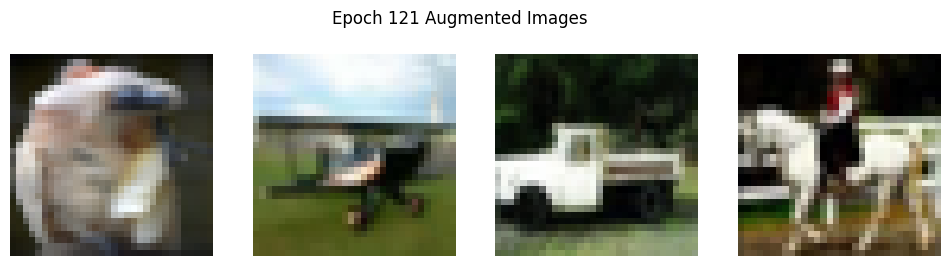

Epoch 122/199, Loss: 0.0048, Train Acc: 0.9999, Val Acc: 0.8700


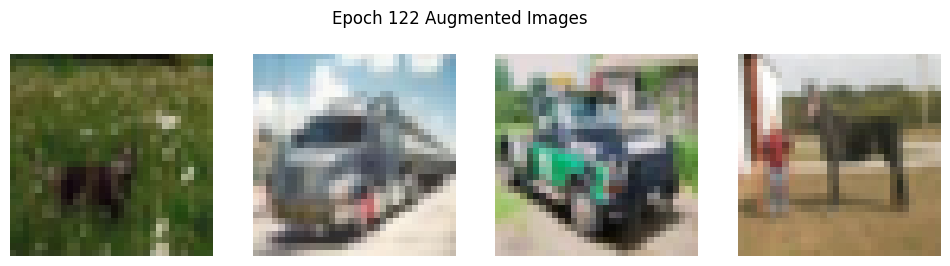

Epoch 123/199, Loss: 0.0049, Train Acc: 0.9999, Val Acc: 0.8701


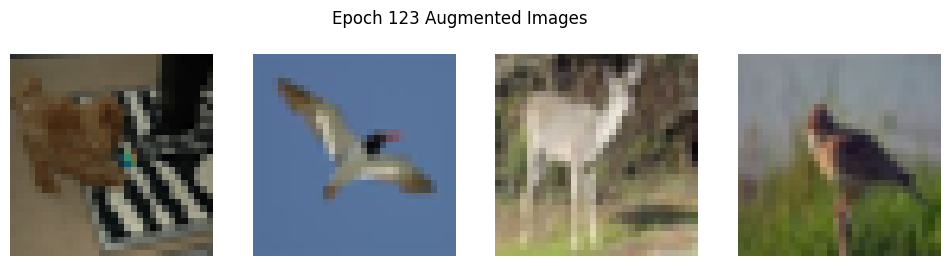

Epoch 124/199, Loss: 0.0048, Train Acc: 0.9997, Val Acc: 0.8701


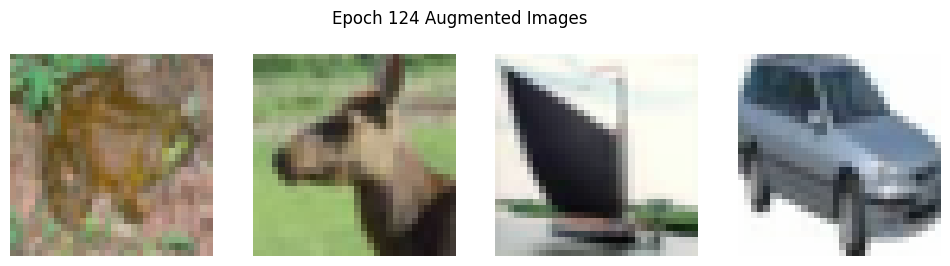

Epoch 125/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8700


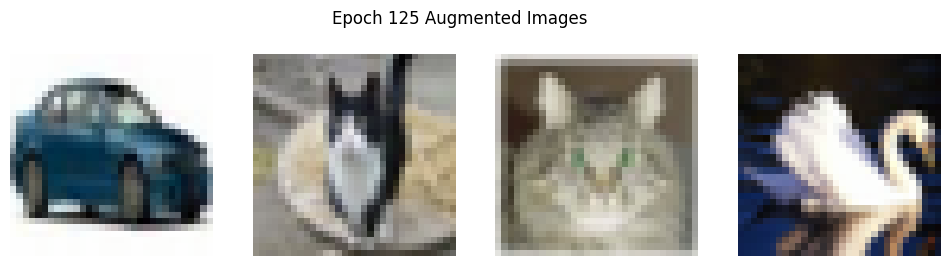

Epoch 126/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8700


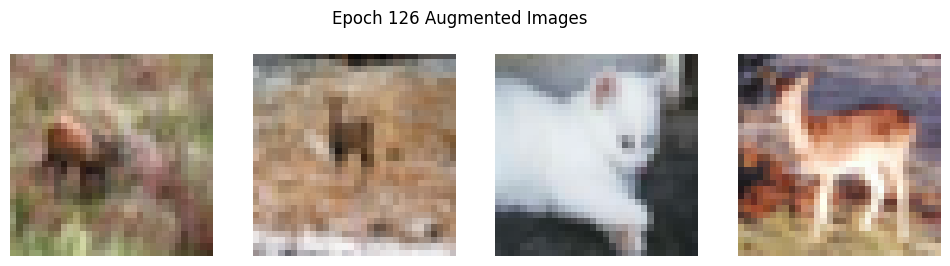

Epoch 127/199, Loss: 0.0049, Train Acc: 0.9997, Val Acc: 0.8700


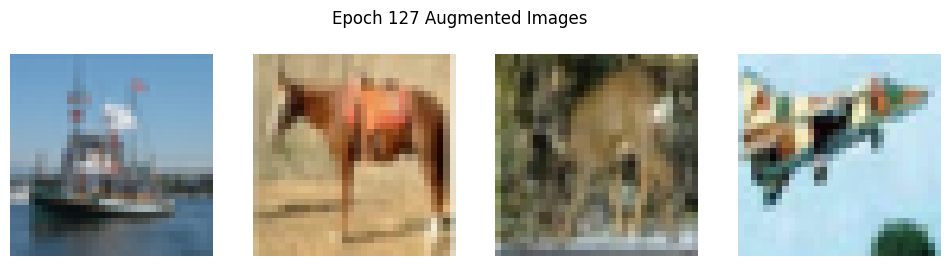

Epoch 128/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8700


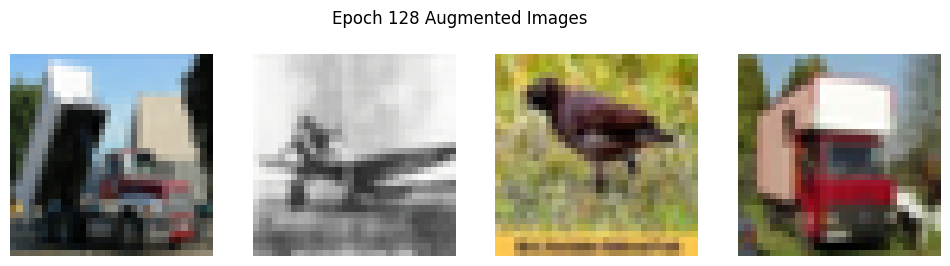

Epoch 129/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8700


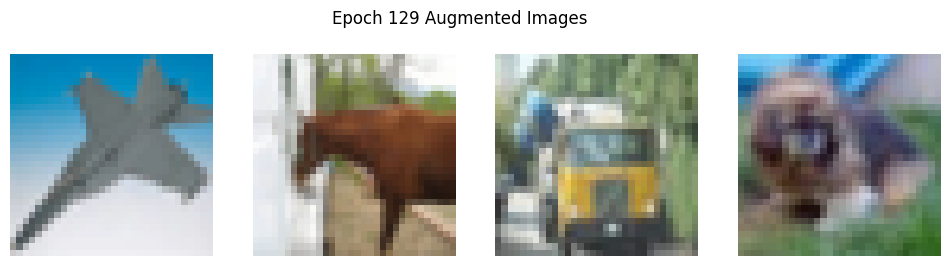

Epoch 130/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8700


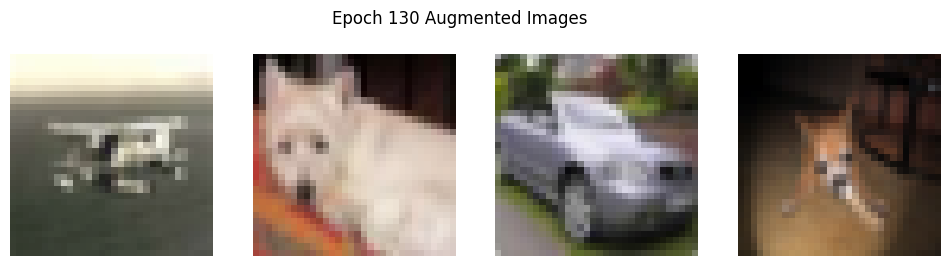

Epoch 131/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8700


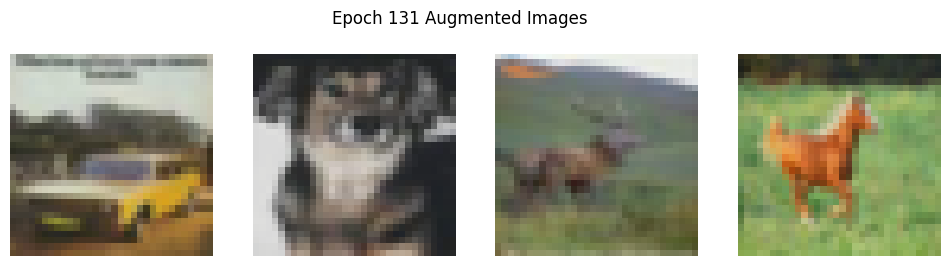

Epoch 132/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701
Epoch 00133: reducing learning rate of group 0 to 1.0000e-07.


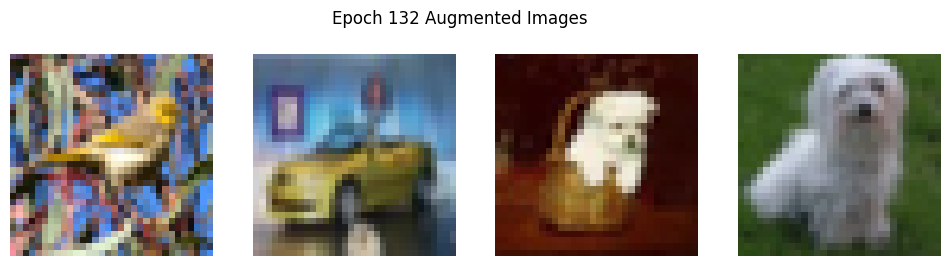

Epoch 133/199, Loss: 0.0048, Train Acc: 0.9997, Val Acc: 0.8701


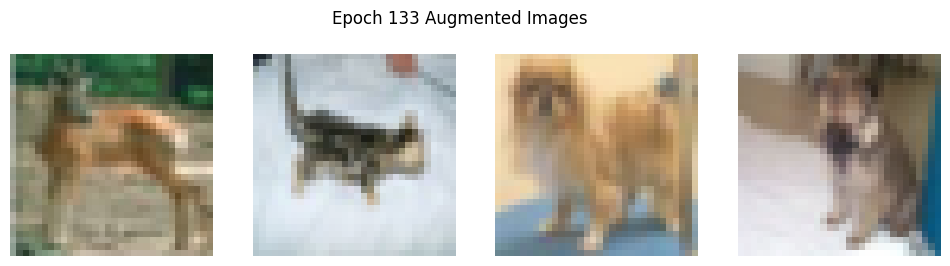

Epoch 134/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


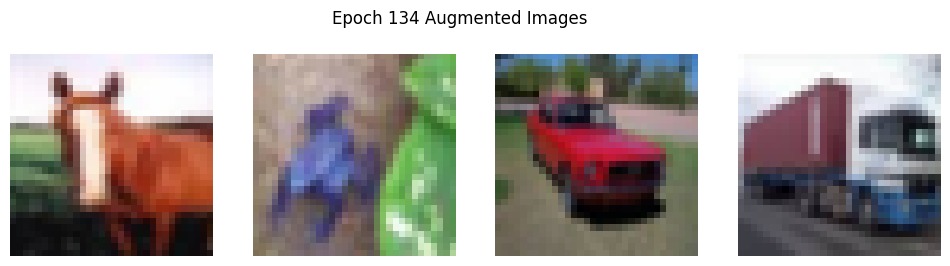

Epoch 135/199, Loss: 0.0050, Train Acc: 0.9998, Val Acc: 0.8701


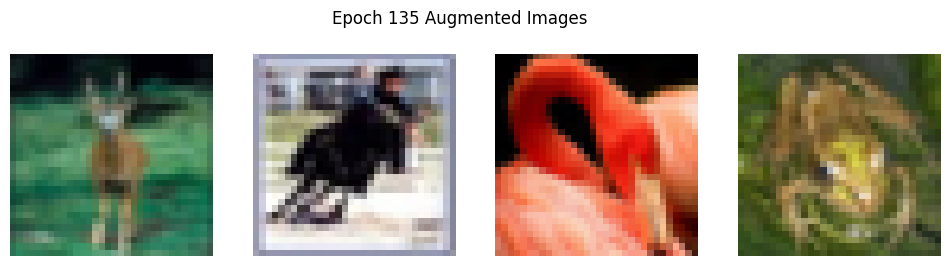

Epoch 136/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8701


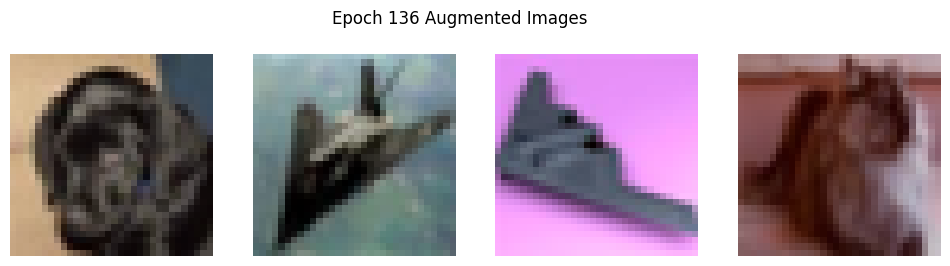

Epoch 137/199, Loss: 0.0049, Train Acc: 0.9999, Val Acc: 0.8701


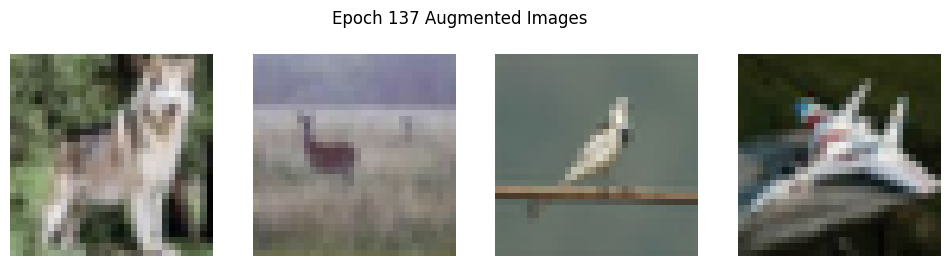

Epoch 138/199, Loss: 0.0049, Train Acc: 0.9997, Val Acc: 0.8701


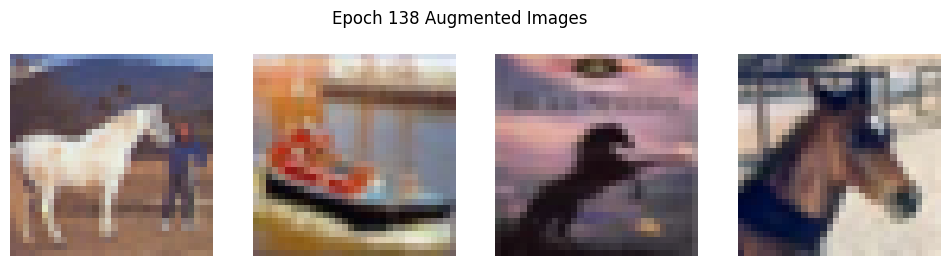

Epoch 139/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8701


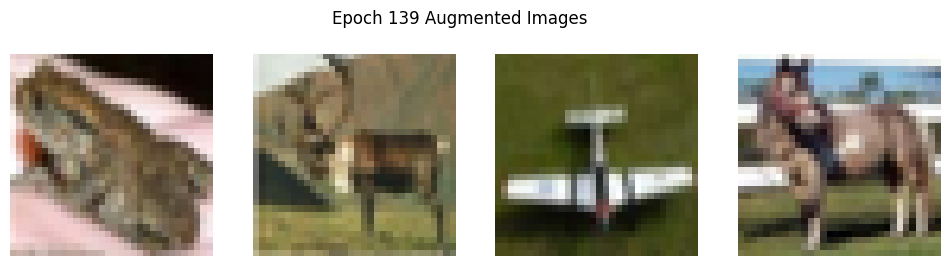

Epoch 140/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8701


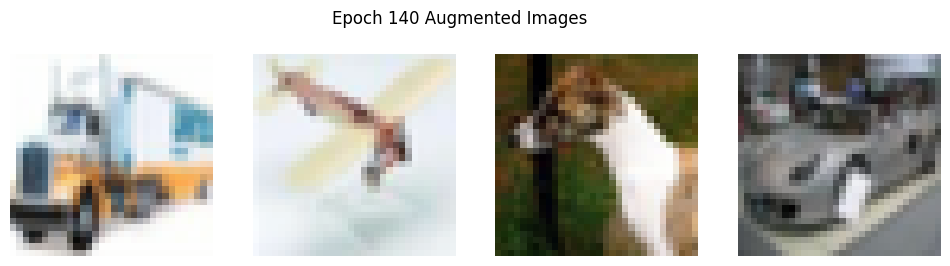

Epoch 141/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


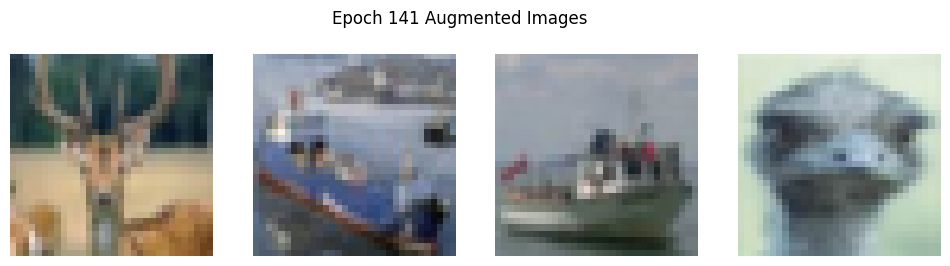

Epoch 142/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


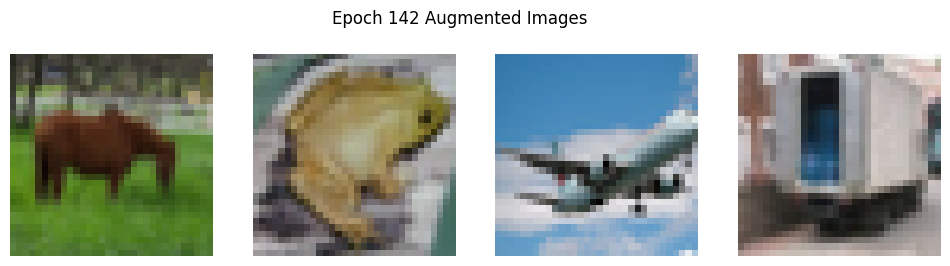

Epoch 143/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8701
Epoch 00144: reducing learning rate of group 0 to 1.0000e-08.


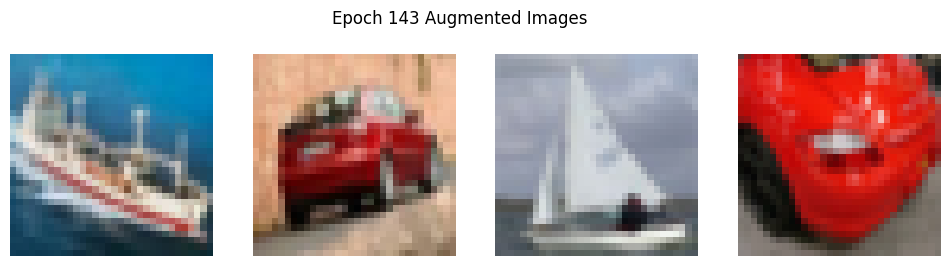

Epoch 144/199, Loss: 0.0050, Train Acc: 0.9998, Val Acc: 0.8701


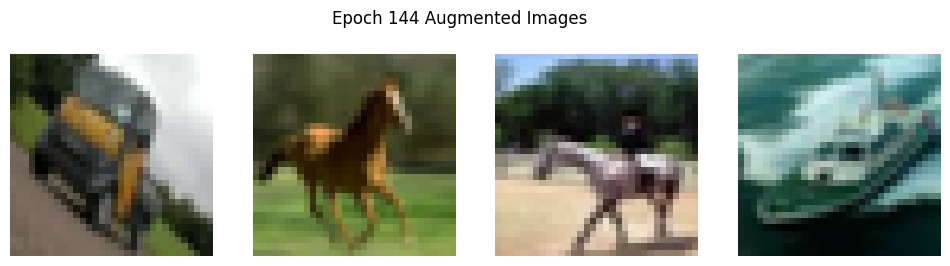

Epoch 145/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


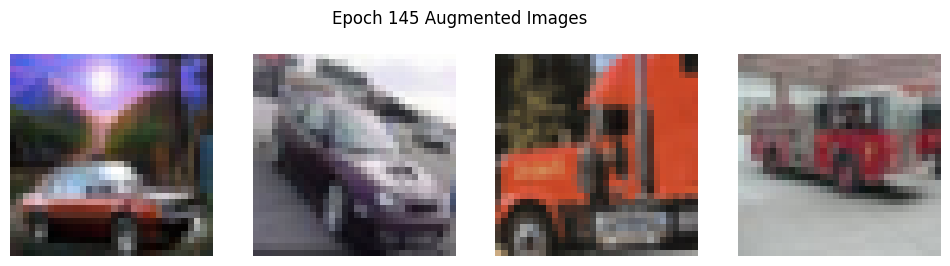

Epoch 146/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


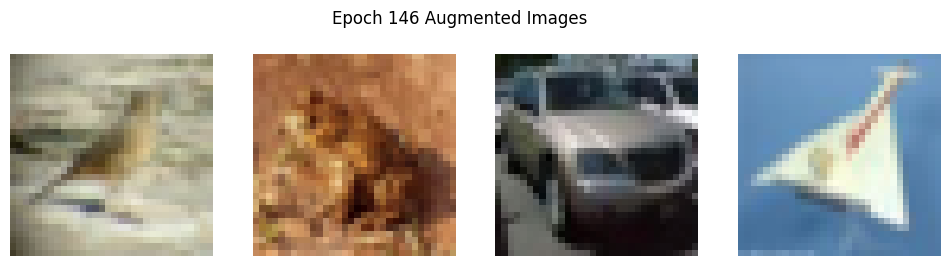

Epoch 147/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8701


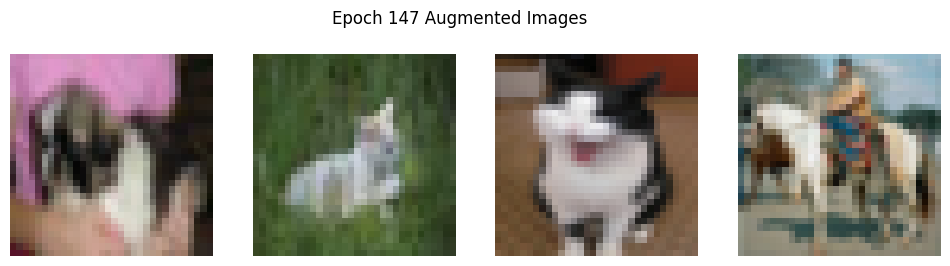

Epoch 148/199, Loss: 0.0049, Train Acc: 0.9997, Val Acc: 0.8701


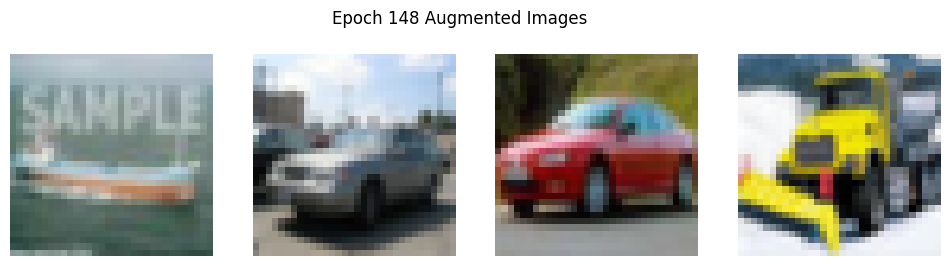

Epoch 149/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8701


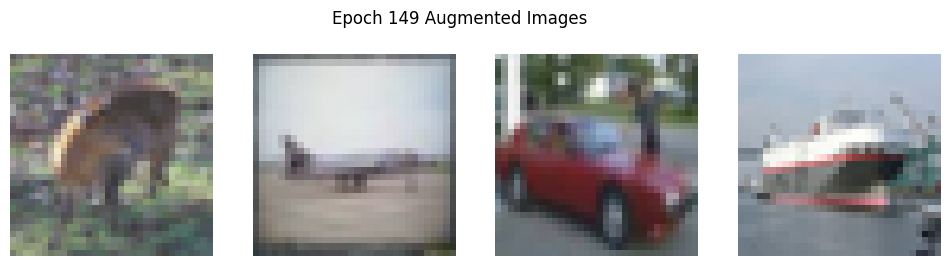

Epoch 150/199, Loss: 0.0048, Train Acc: 0.9999, Val Acc: 0.8701


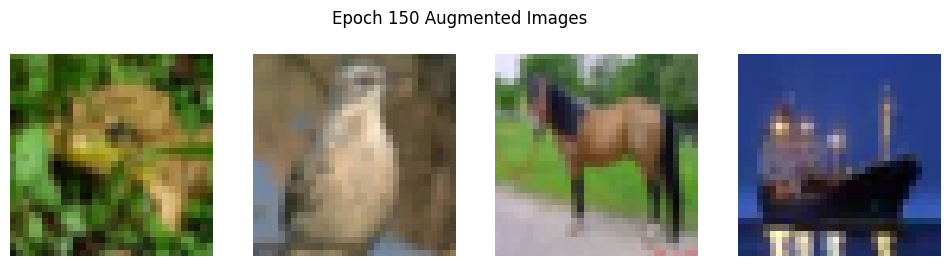

Epoch 151/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8701


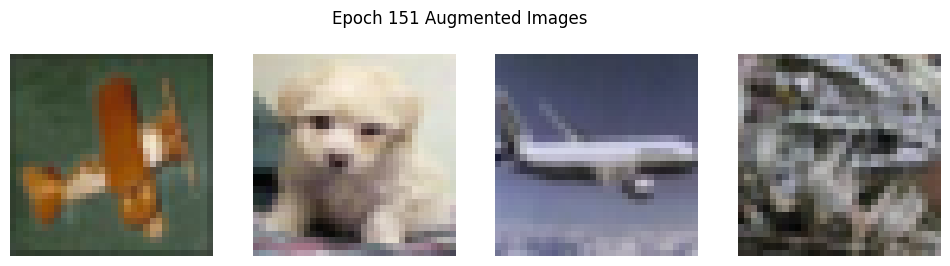

Epoch 152/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


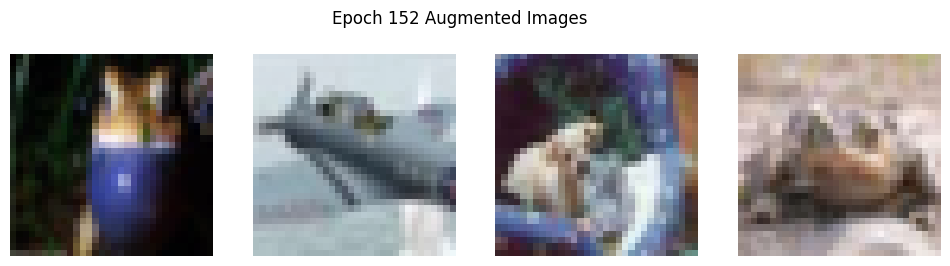

Epoch 153/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8701


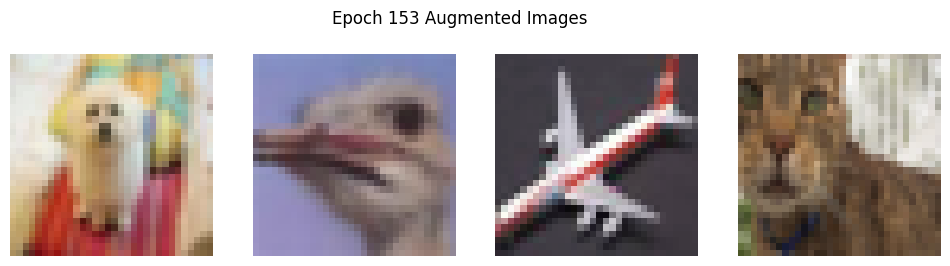

Epoch 154/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


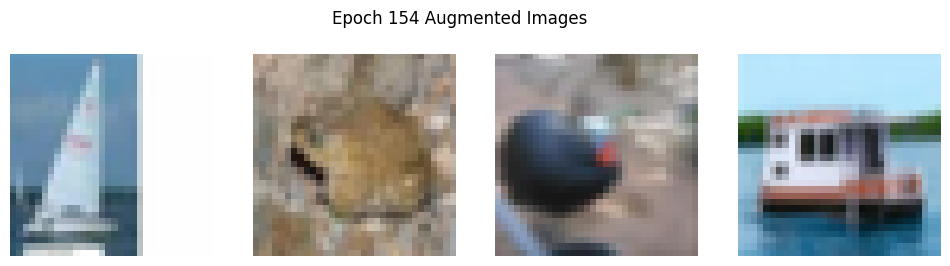

Epoch 155/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8701


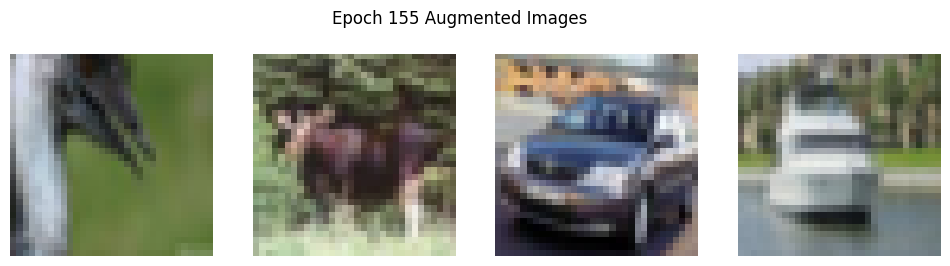

Epoch 156/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


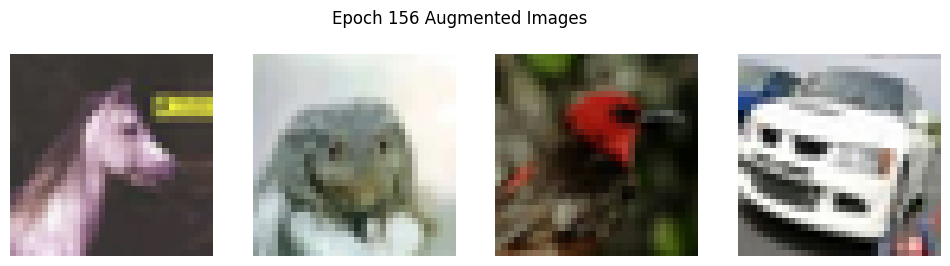

Epoch 157/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


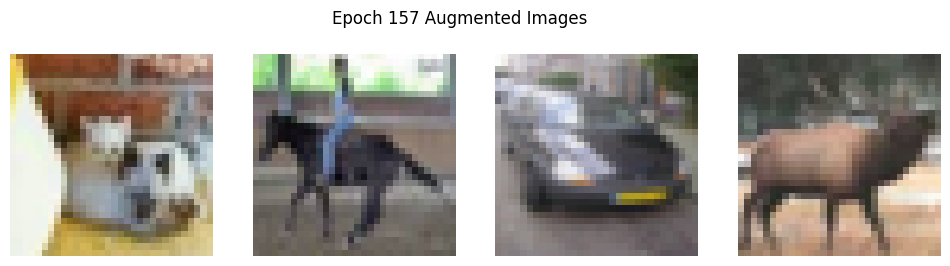

Epoch 158/199, Loss: 0.0046, Train Acc: 0.9998, Val Acc: 0.8701


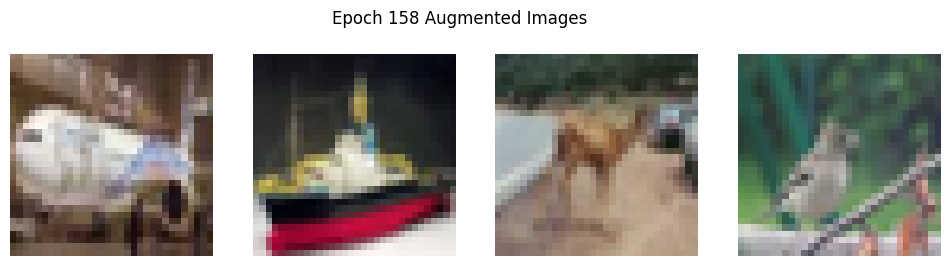

Epoch 159/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8701


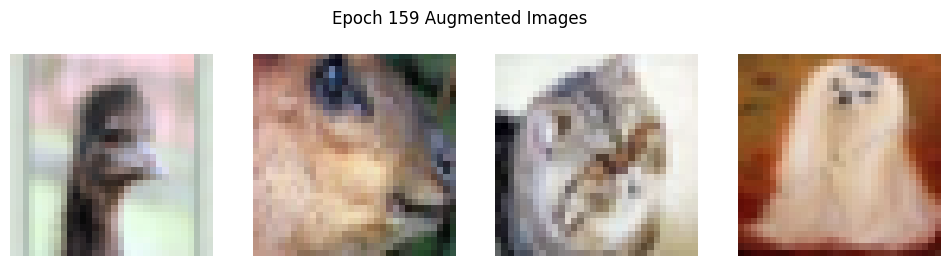

Epoch 160/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8701


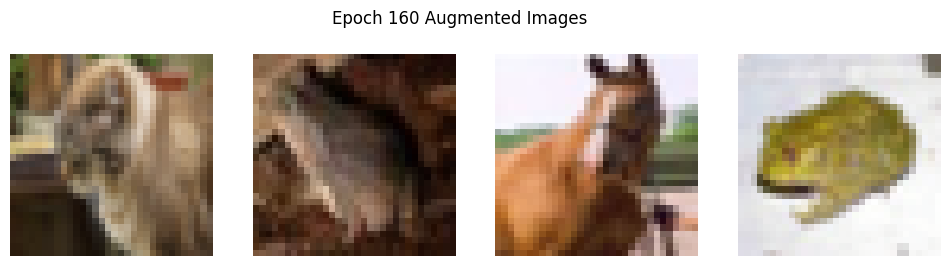

Epoch 161/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


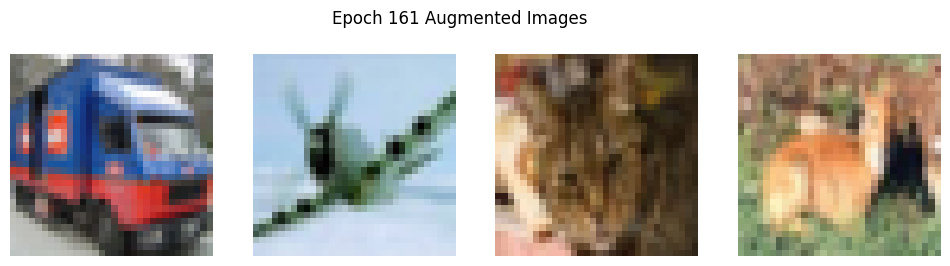

Epoch 162/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8701


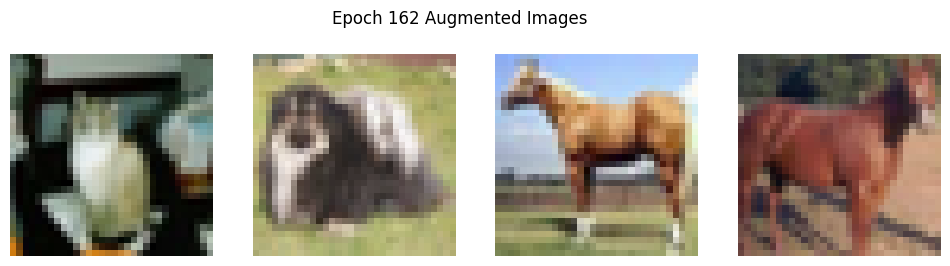

Epoch 163/199, Loss: 0.0048, Train Acc: 0.9999, Val Acc: 0.8701


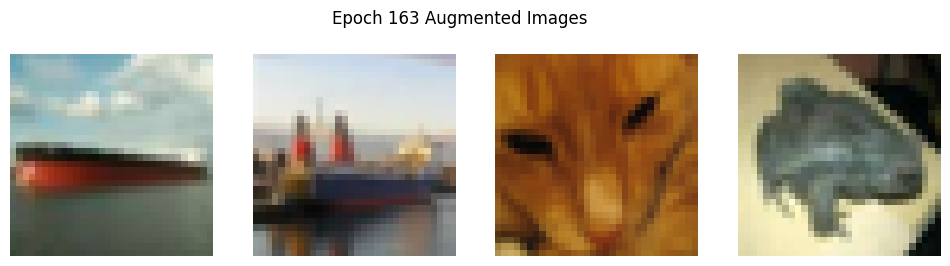

Epoch 164/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


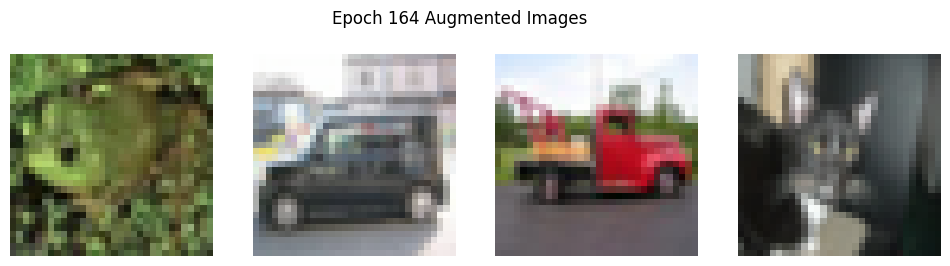

Epoch 165/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8701


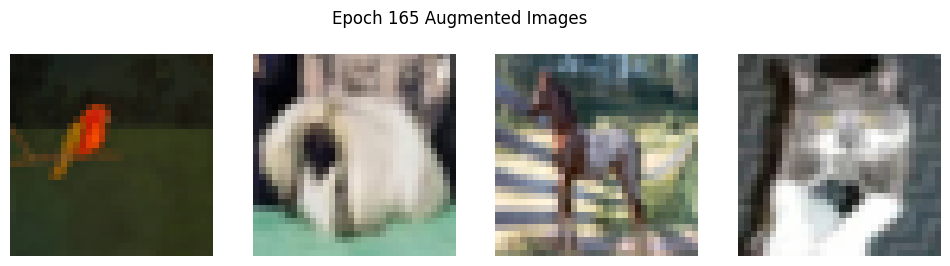

Epoch 166/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


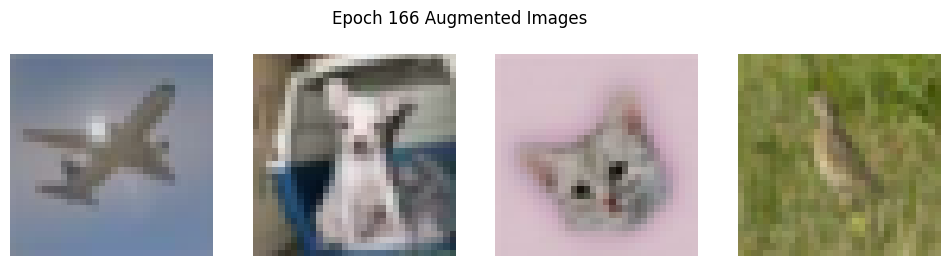

Epoch 167/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8701


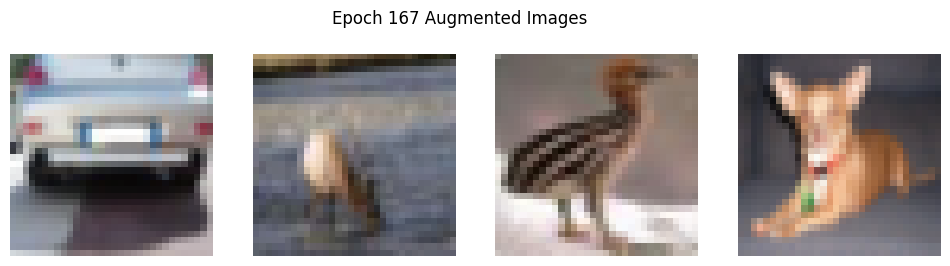

Epoch 168/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


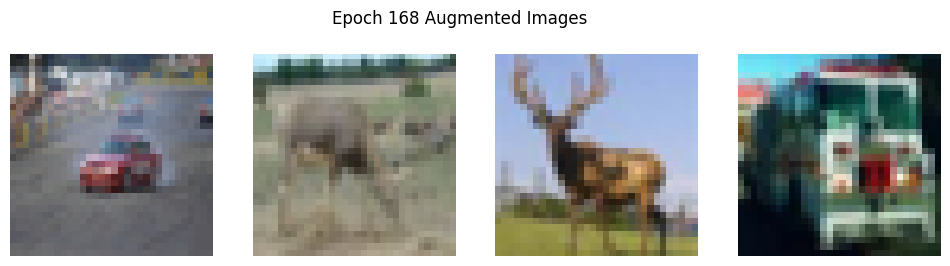

Epoch 169/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8701


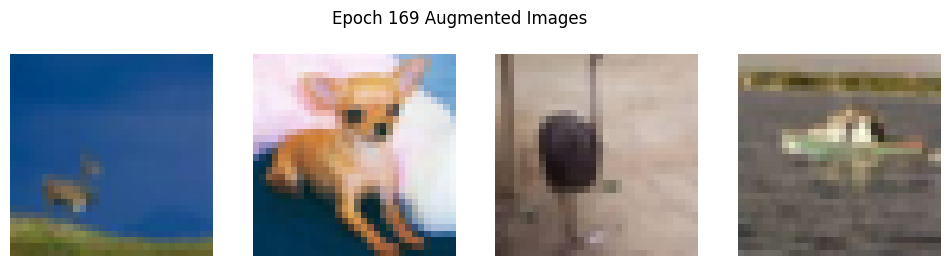

Epoch 170/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


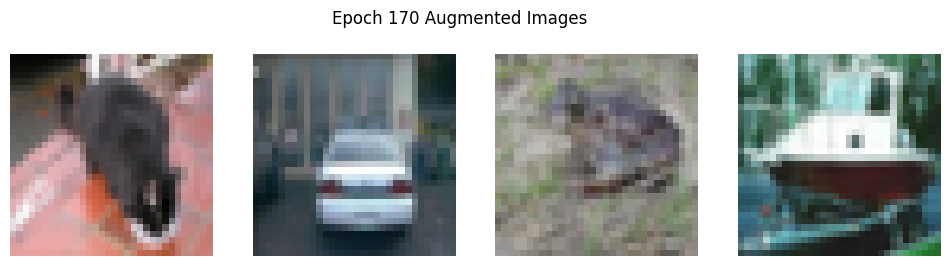

Epoch 171/199, Loss: 0.0049, Train Acc: 0.9997, Val Acc: 0.8701


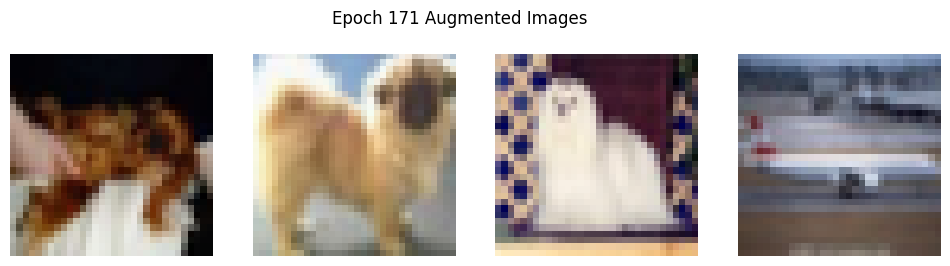

Epoch 172/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


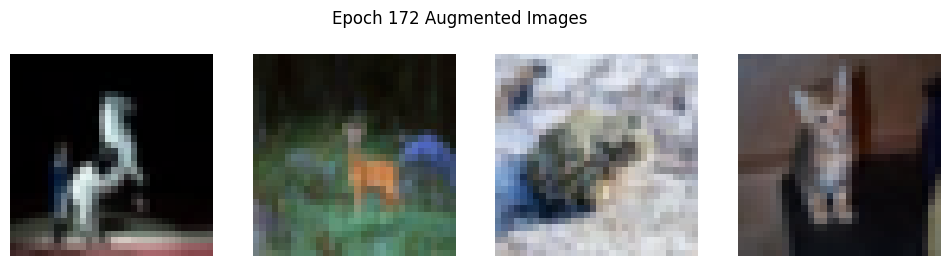

Epoch 173/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


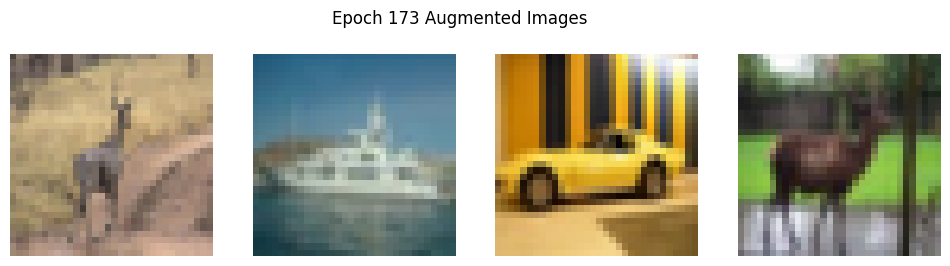

Epoch 174/199, Loss: 0.0048, Train Acc: 0.9999, Val Acc: 0.8701


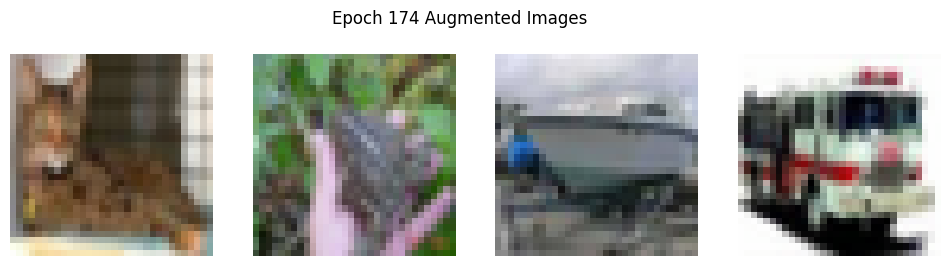

Epoch 175/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


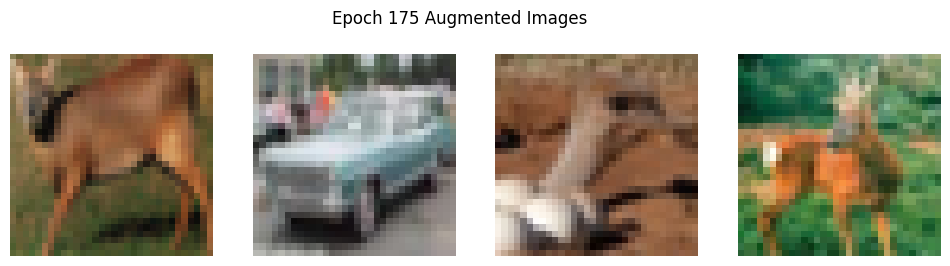

Epoch 176/199, Loss: 0.0049, Train Acc: 0.9997, Val Acc: 0.8701


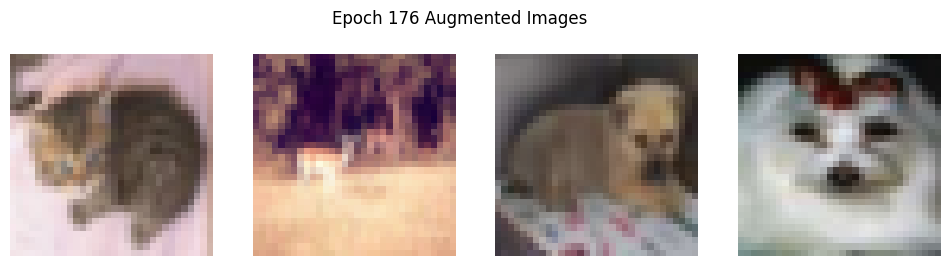

Epoch 177/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8701


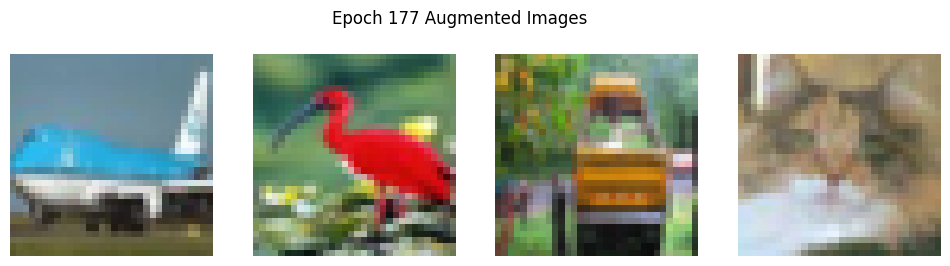

Epoch 178/199, Loss: 0.0049, Train Acc: 0.9997, Val Acc: 0.8701


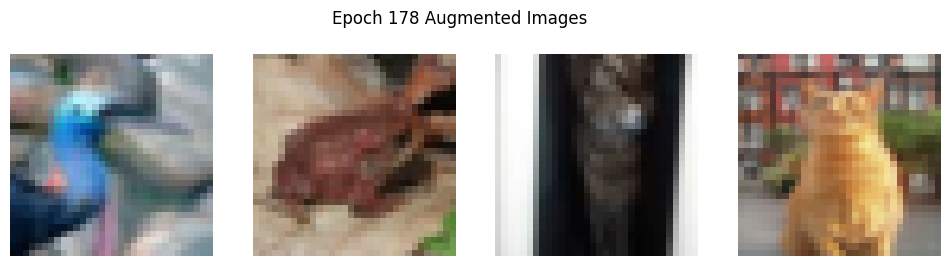

Epoch 179/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


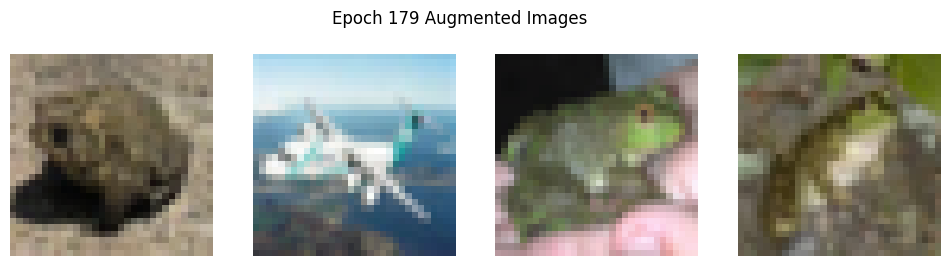

Epoch 180/199, Loss: 0.0046, Train Acc: 0.9998, Val Acc: 0.8701


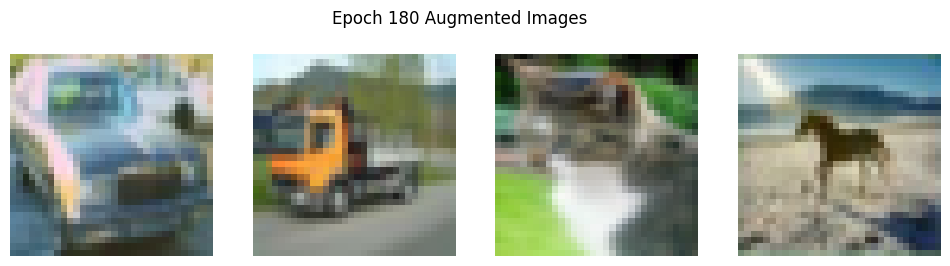

Epoch 181/199, Loss: 0.0046, Train Acc: 1.0000, Val Acc: 0.8701


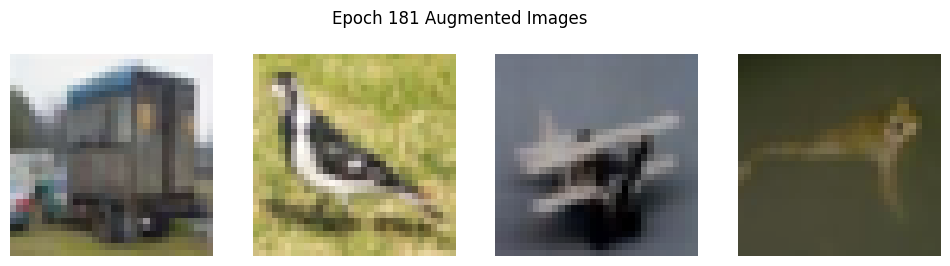

Epoch 182/199, Loss: 0.0052, Train Acc: 0.9997, Val Acc: 0.8701


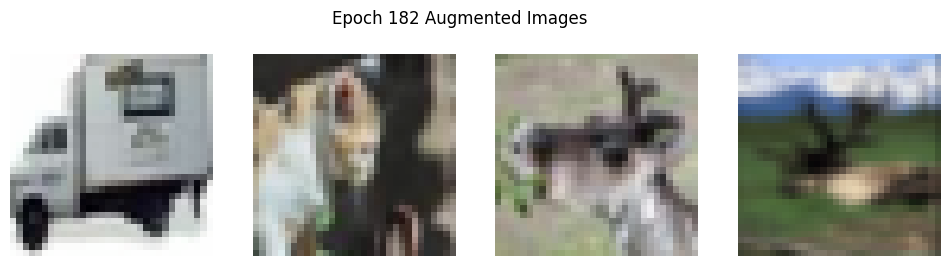

Epoch 183/199, Loss: 0.0045, Train Acc: 0.9999, Val Acc: 0.8701


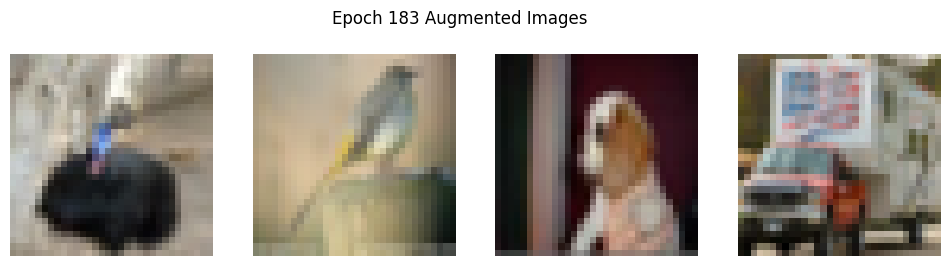

Epoch 184/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


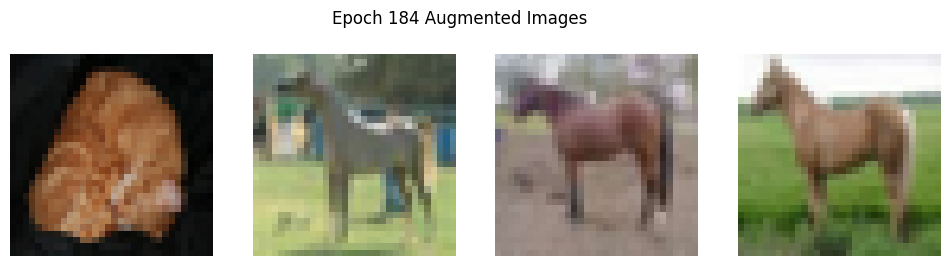

Epoch 185/199, Loss: 0.0048, Train Acc: 0.9999, Val Acc: 0.8701


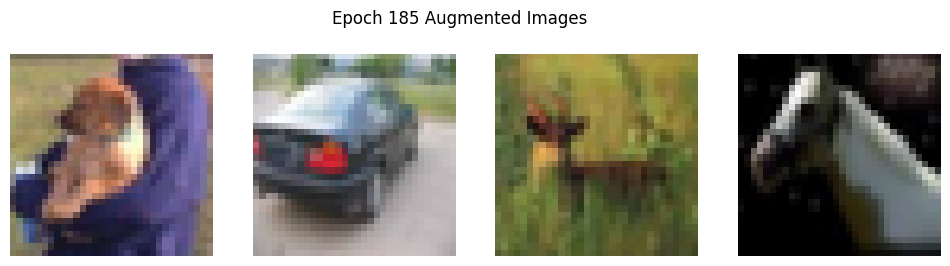

Epoch 186/199, Loss: 0.0046, Train Acc: 0.9998, Val Acc: 0.8701


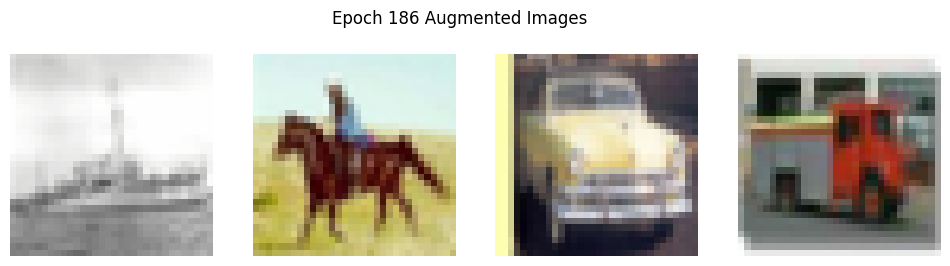

Epoch 187/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


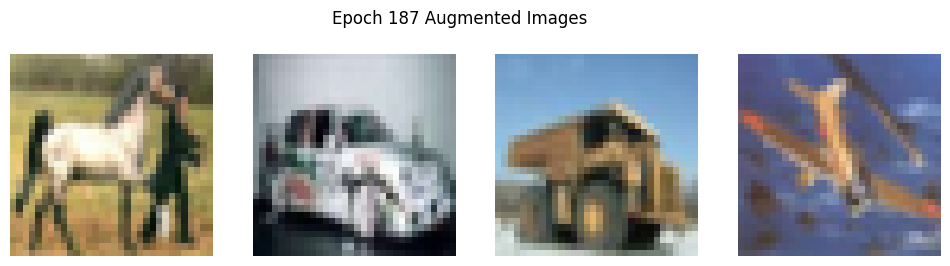

Epoch 188/199, Loss: 0.0045, Train Acc: 0.9998, Val Acc: 0.8701


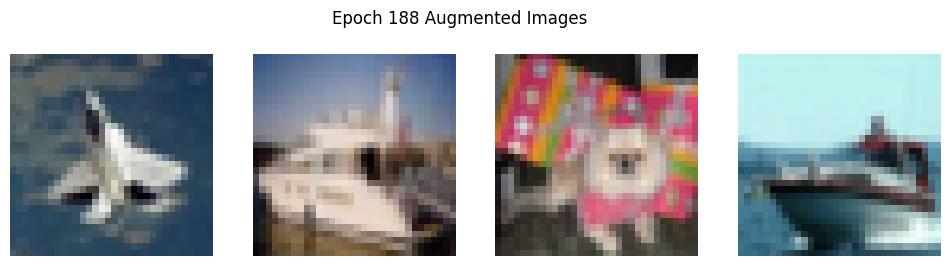

Epoch 189/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8701


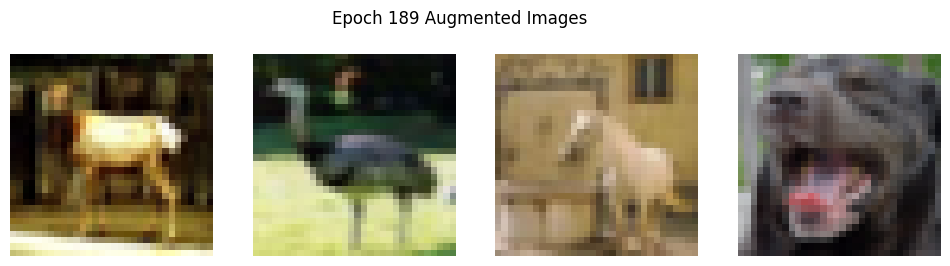

Epoch 190/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8701


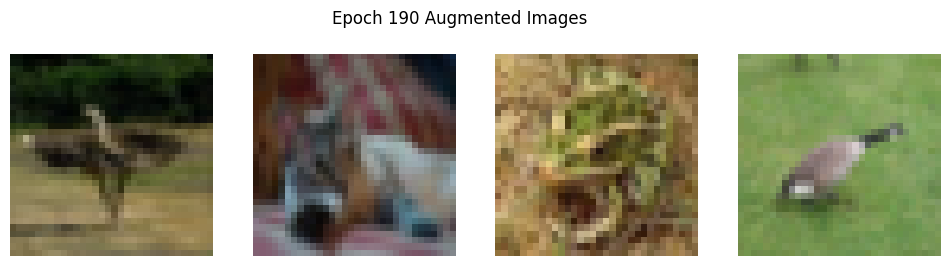

Epoch 191/199, Loss: 0.0047, Train Acc: 0.9999, Val Acc: 0.8701


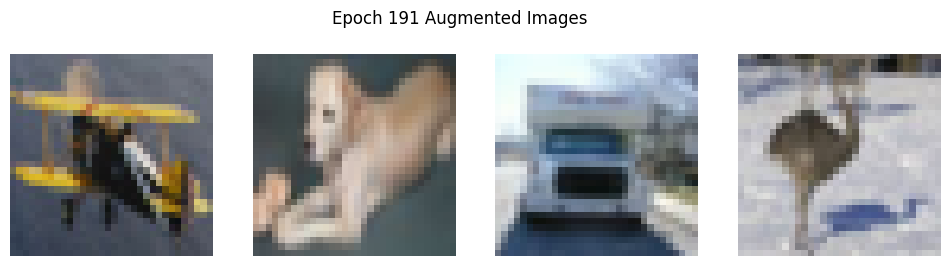

Epoch 192/199, Loss: 0.0047, Train Acc: 0.9998, Val Acc: 0.8701


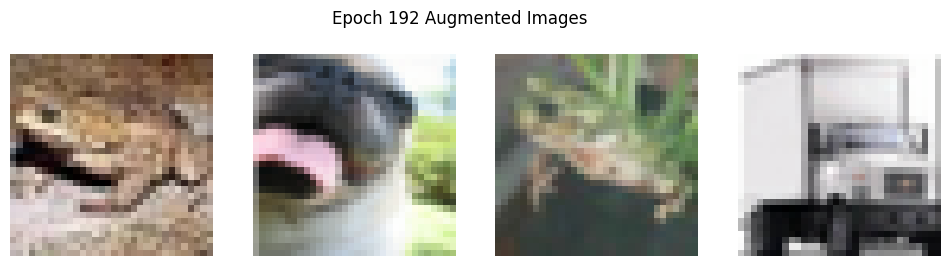

Epoch 193/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


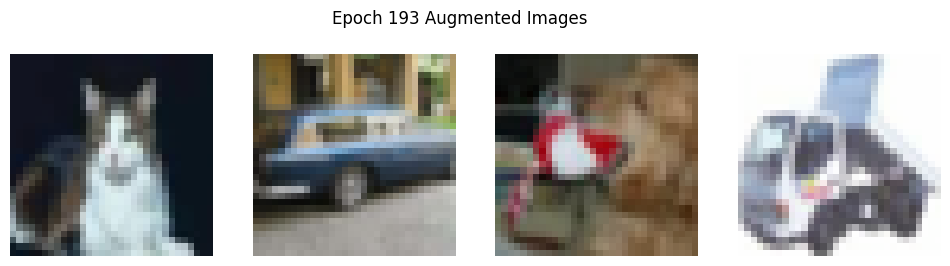

Epoch 194/199, Loss: 0.0049, Train Acc: 0.9998, Val Acc: 0.8701


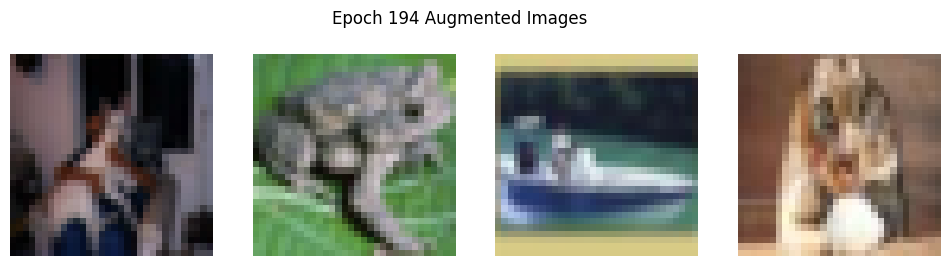

Epoch 195/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


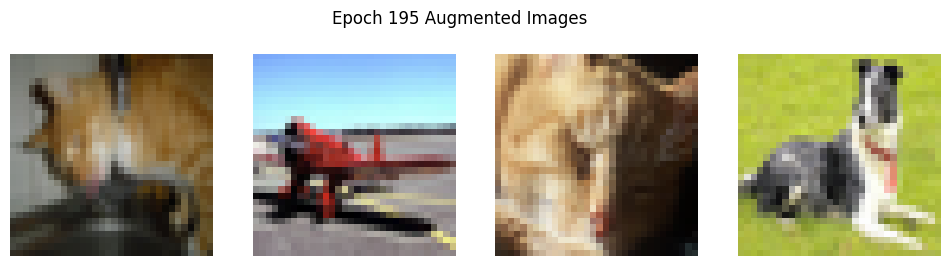

Epoch 196/199, Loss: 0.0050, Train Acc: 0.9998, Val Acc: 0.8701


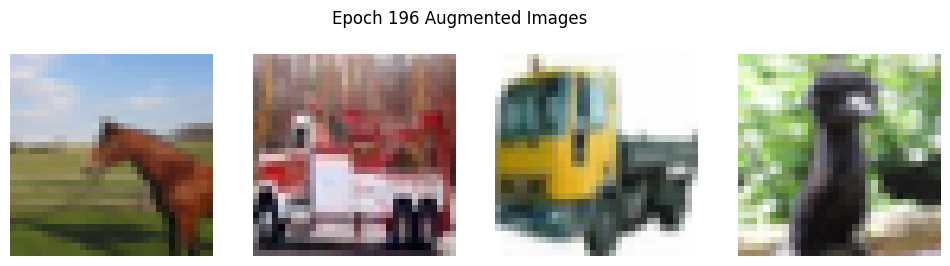

Epoch 197/199, Loss: 0.0046, Train Acc: 0.9999, Val Acc: 0.8701


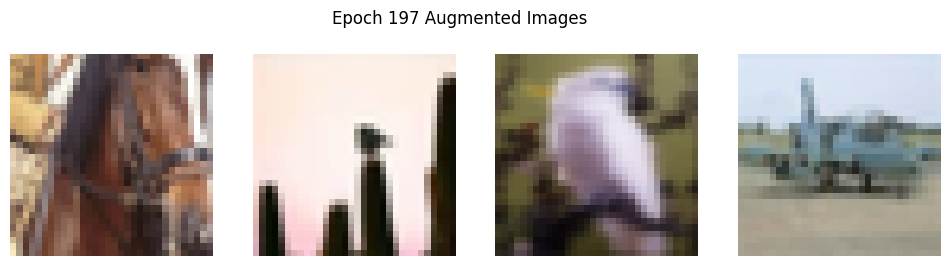

Epoch 198/199, Loss: 0.0045, Train Acc: 0.9999, Val Acc: 0.8701


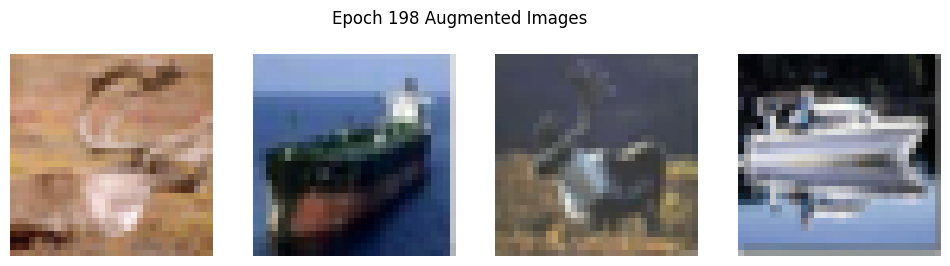

Epoch 199/199, Loss: 0.0048, Train Acc: 0.9998, Val Acc: 0.8701


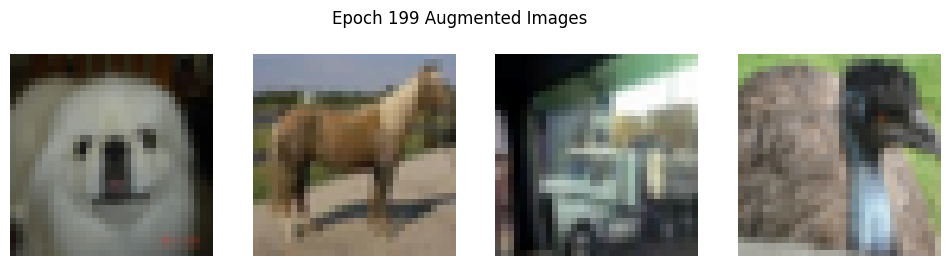

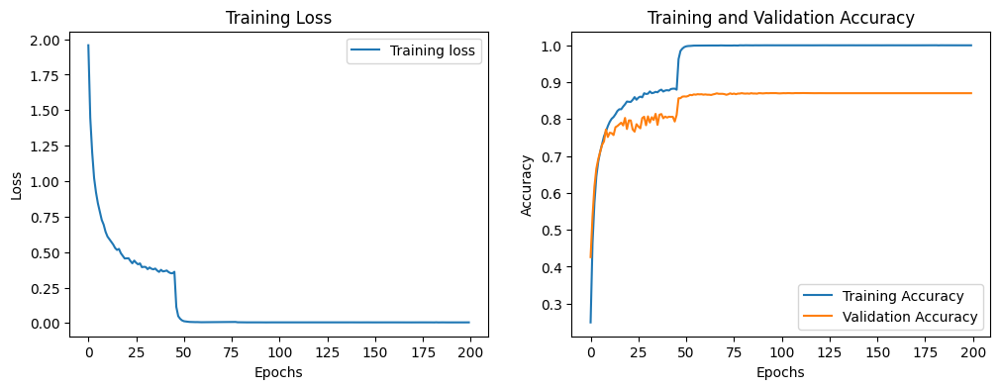

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
from torchvision.transforms import Lambda
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x



train_transforms = transforms.Compose([

    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        # Validation phase
        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model


train_loader, test_loader, num_classes = get_dataloaders(dataset='CIFAR10', batch_size=128)

model = AlexNet(num_classes=num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=10, verbose=True, eps=1e-8)

trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=200)


##Fourth Experiment with 2 parts of Basic Augmentation to mitigate overfitting.

###First Part:

Files already downloaded and verified
Files already downloaded and verified
Epoch 0/199, Loss: 1.9124, Train Acc: 0.2696, Val Acc: 0.4158


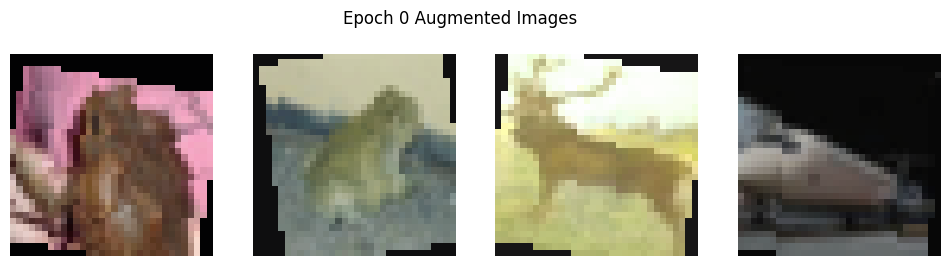

Epoch 1/199, Loss: 1.5649, Train Acc: 0.4212, Val Acc: 0.4849


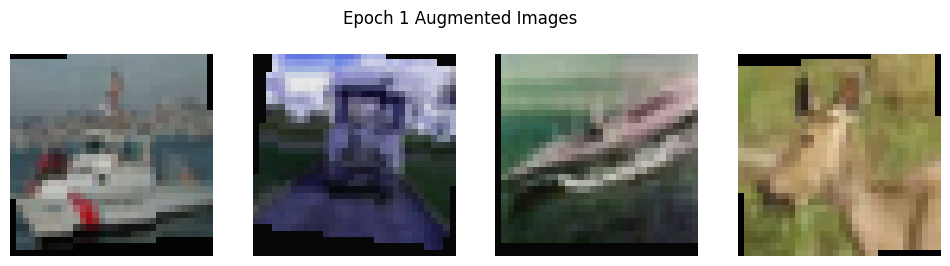

Epoch 2/199, Loss: 1.4191, Train Acc: 0.4836, Val Acc: 0.5377


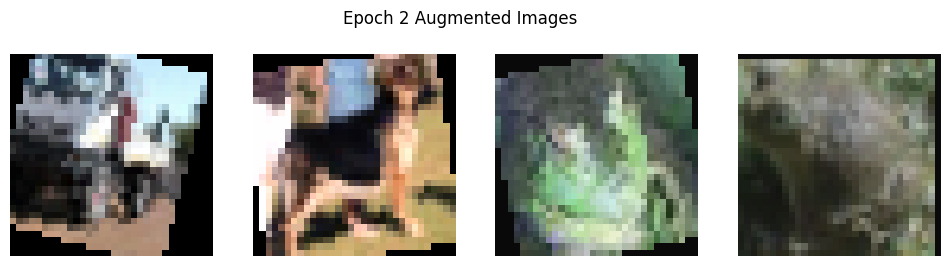

Epoch 3/199, Loss: 1.3361, Train Acc: 0.5193, Val Acc: 0.5615


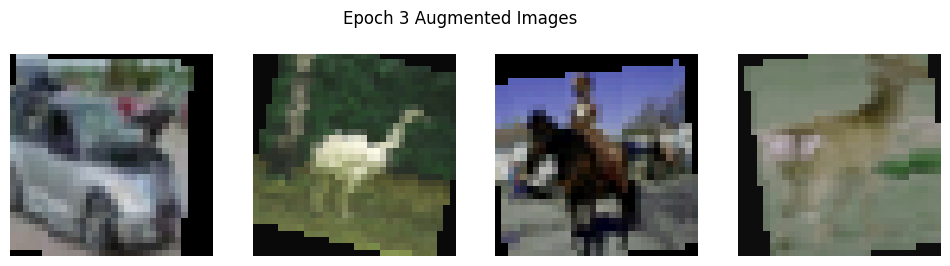

Epoch 4/199, Loss: 1.2757, Train Acc: 0.5421, Val Acc: 0.6190


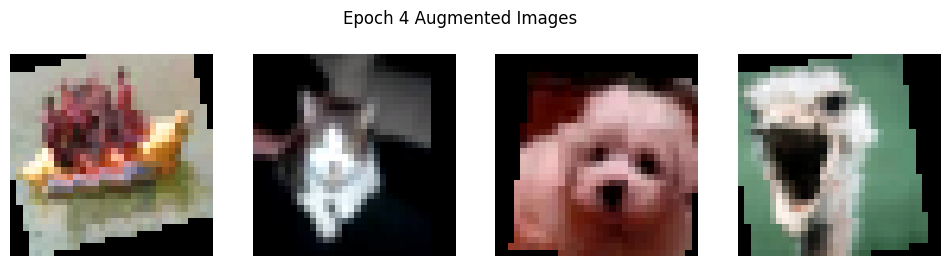

Epoch 5/199, Loss: 1.2130, Train Acc: 0.5675, Val Acc: 0.5960


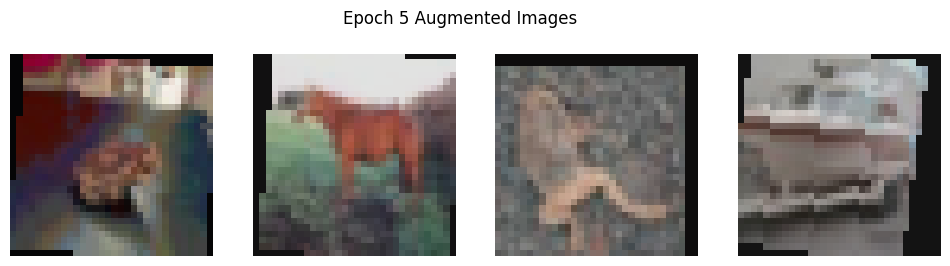

Epoch 6/199, Loss: 1.1695, Train Acc: 0.5840, Val Acc: 0.6214


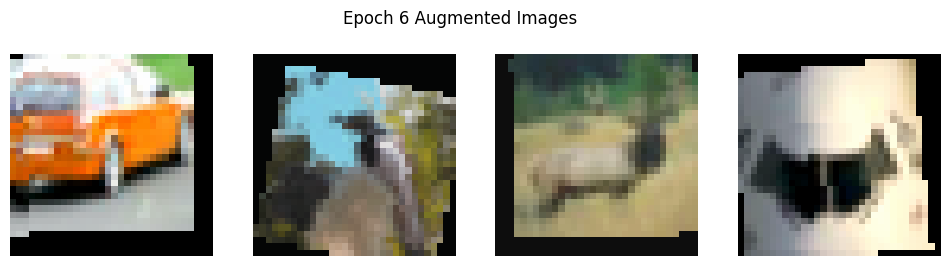

Epoch 7/199, Loss: 1.1267, Train Acc: 0.6000, Val Acc: 0.6527


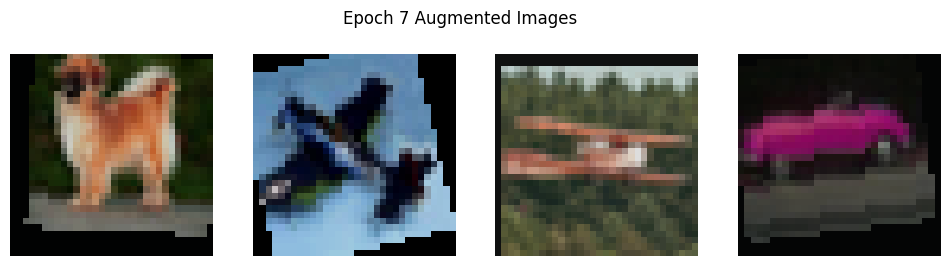

Epoch 8/199, Loss: 1.0921, Train Acc: 0.6159, Val Acc: 0.6726


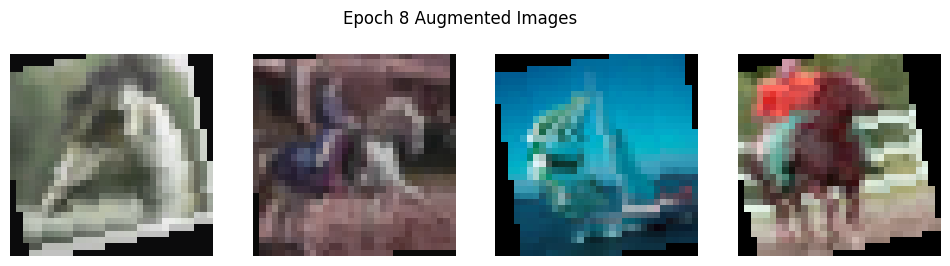

Epoch 9/199, Loss: 1.0585, Train Acc: 0.6303, Val Acc: 0.6837


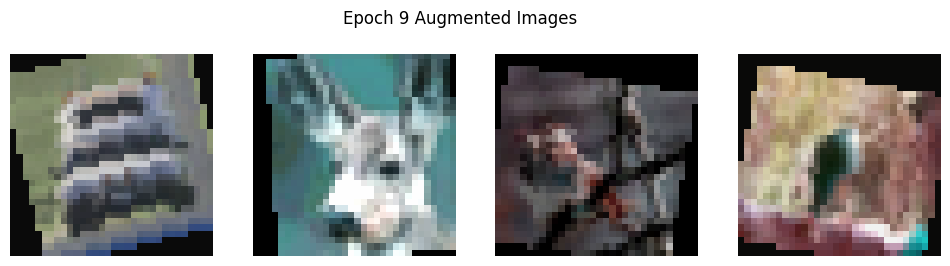

Epoch 10/199, Loss: 1.0331, Train Acc: 0.6392, Val Acc: 0.6885


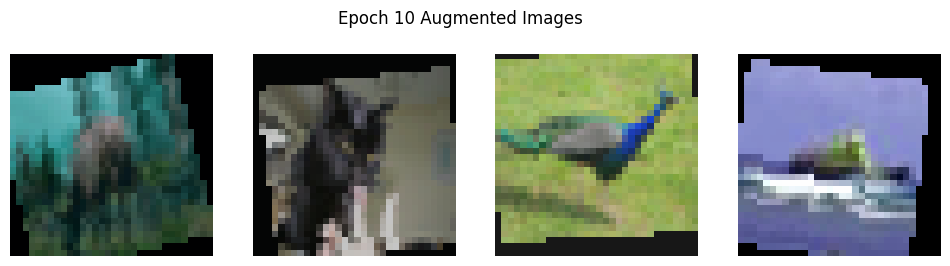

Epoch 11/199, Loss: 1.0088, Train Acc: 0.6455, Val Acc: 0.6833


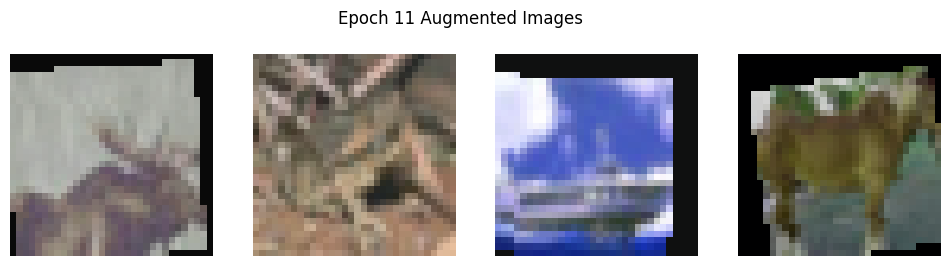

Epoch 12/199, Loss: 0.9856, Train Acc: 0.6569, Val Acc: 0.7116


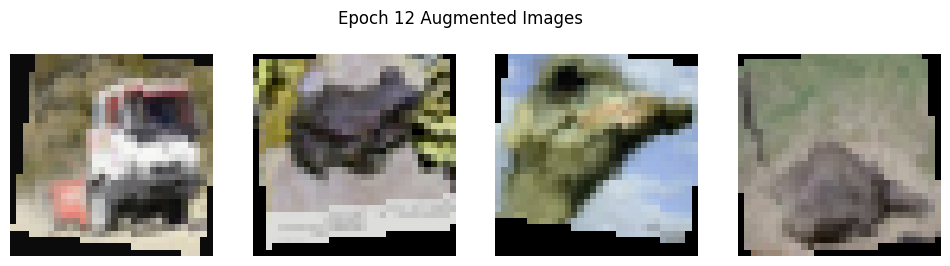

Epoch 13/199, Loss: 0.9755, Train Acc: 0.6613, Val Acc: 0.7221


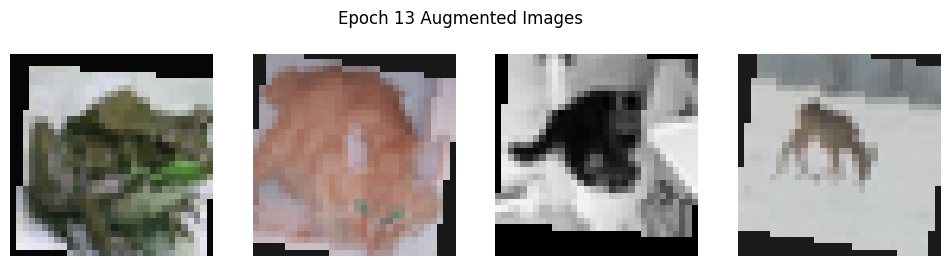

Epoch 14/199, Loss: 0.9441, Train Acc: 0.6724, Val Acc: 0.7124


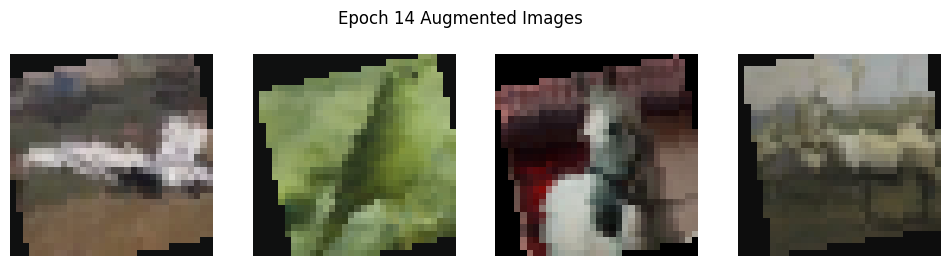

Epoch 15/199, Loss: 0.9370, Train Acc: 0.6756, Val Acc: 0.6975


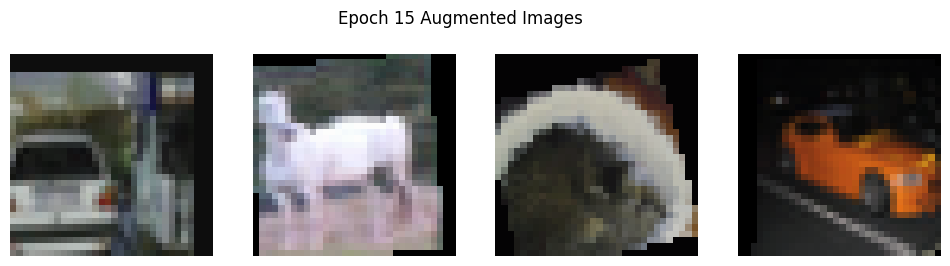

Epoch 16/199, Loss: 0.9243, Train Acc: 0.6810, Val Acc: 0.7237


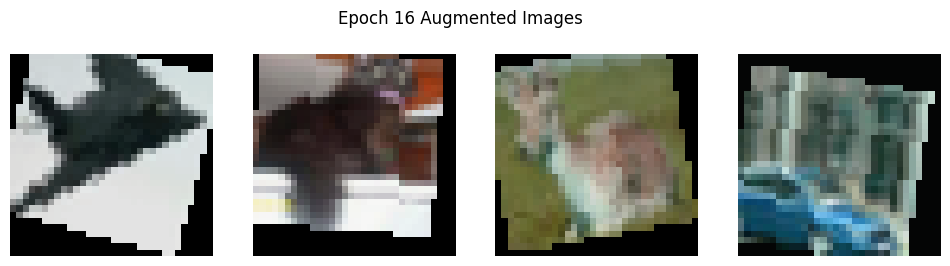

Epoch 17/199, Loss: 0.9018, Train Acc: 0.6871, Val Acc: 0.7297


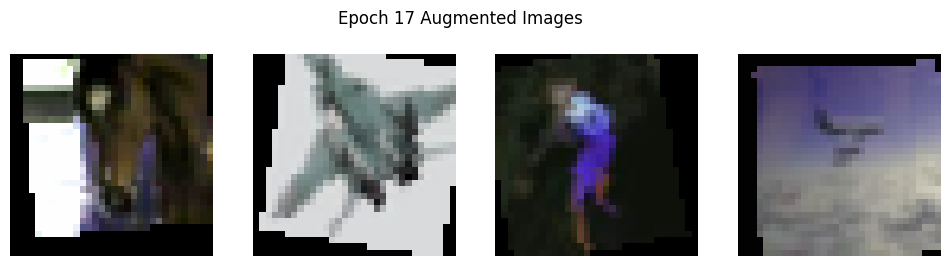

Epoch 18/199, Loss: 0.9012, Train Acc: 0.6917, Val Acc: 0.7386


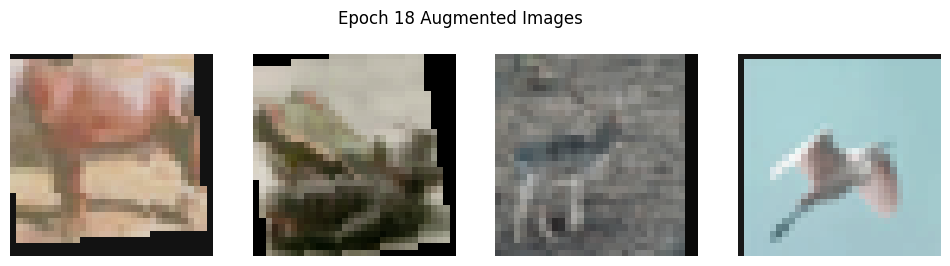

Epoch 19/199, Loss: 0.8871, Train Acc: 0.6949, Val Acc: 0.7371


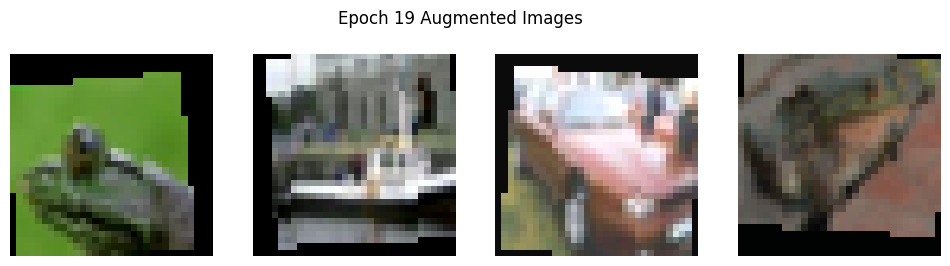

Epoch 20/199, Loss: 0.8730, Train Acc: 0.6960, Val Acc: 0.7492


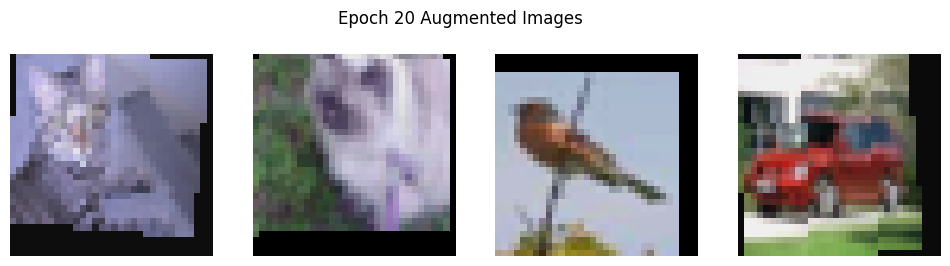

Epoch 21/199, Loss: 0.8590, Train Acc: 0.7036, Val Acc: 0.7469


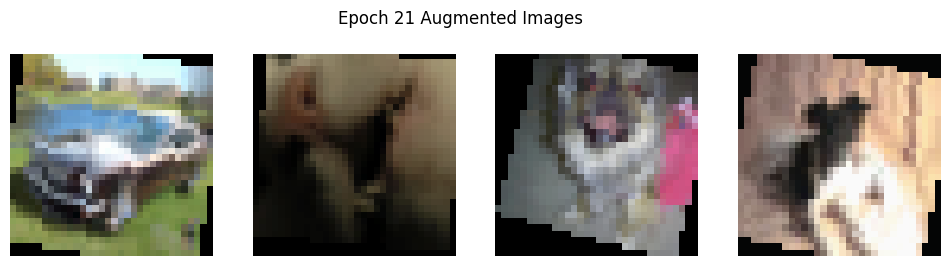

Epoch 22/199, Loss: 0.8575, Train Acc: 0.7028, Val Acc: 0.7487


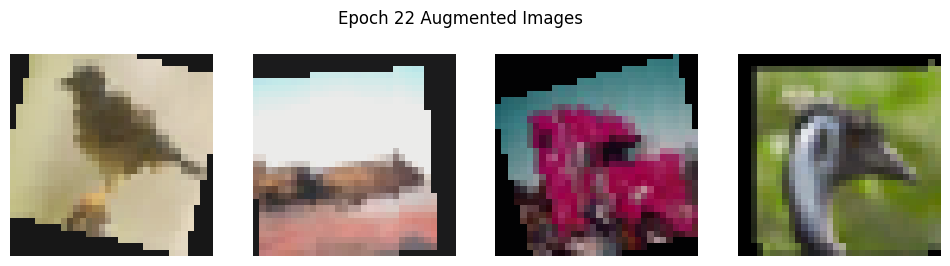

Epoch 23/199, Loss: 0.8478, Train Acc: 0.7097, Val Acc: 0.7496


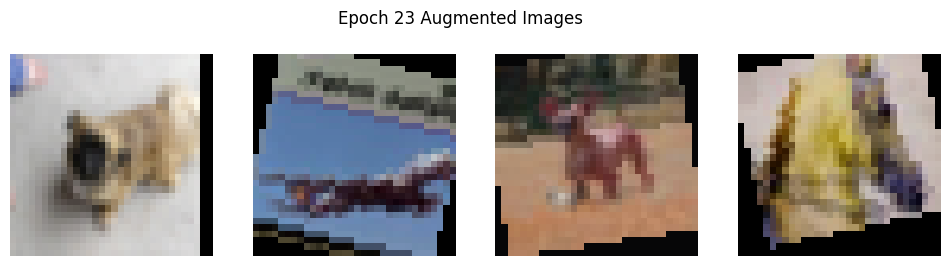

Epoch 24/199, Loss: 0.8323, Train Acc: 0.7131, Val Acc: 0.7557


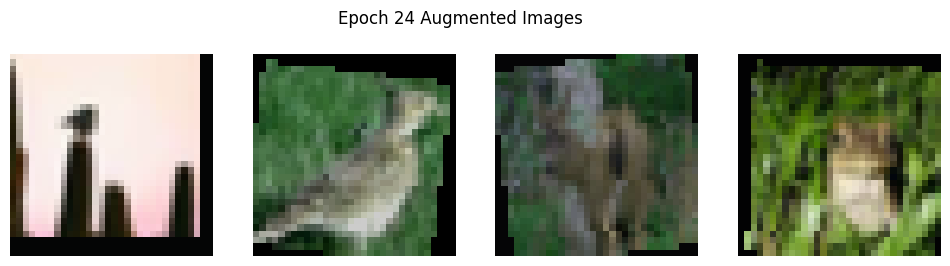

Epoch 25/199, Loss: 0.8270, Train Acc: 0.7173, Val Acc: 0.7513


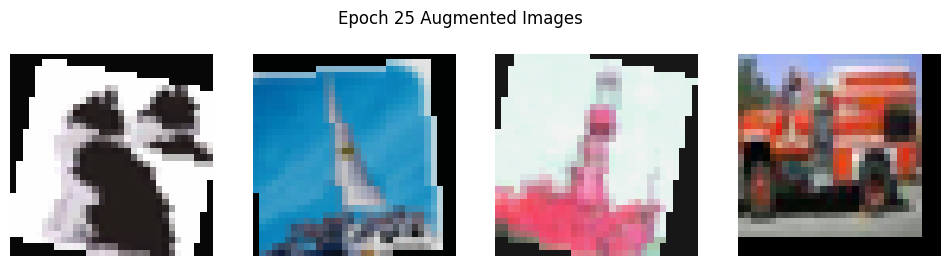

Epoch 26/199, Loss: 0.8213, Train Acc: 0.7166, Val Acc: 0.7688


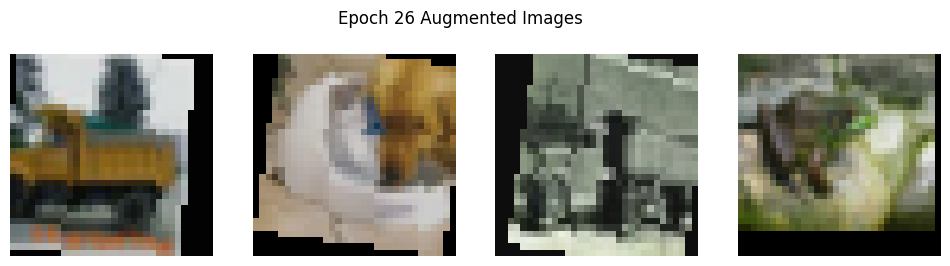

Epoch 27/199, Loss: 0.8162, Train Acc: 0.7191, Val Acc: 0.7602


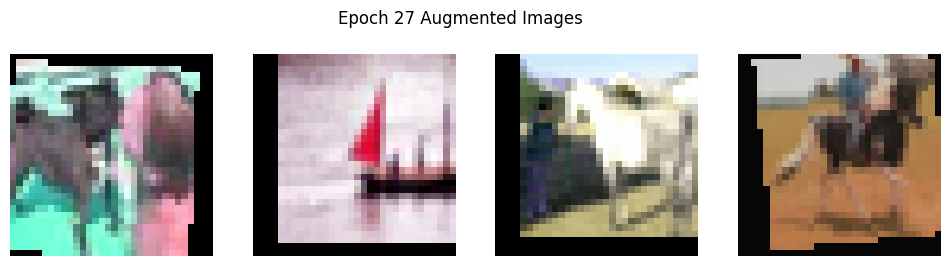

Epoch 28/199, Loss: 0.8082, Train Acc: 0.7208, Val Acc: 0.7636


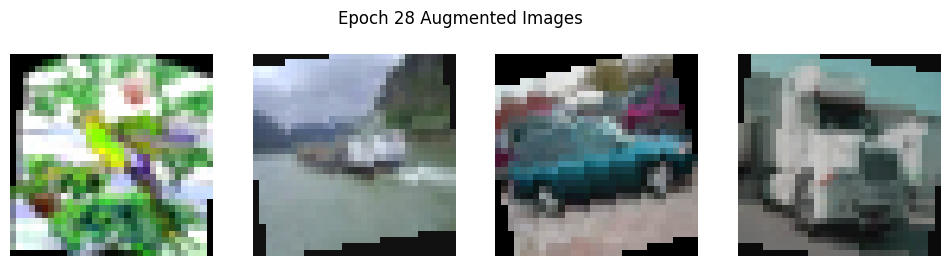

Epoch 29/199, Loss: 0.8013, Train Acc: 0.7245, Val Acc: 0.7714


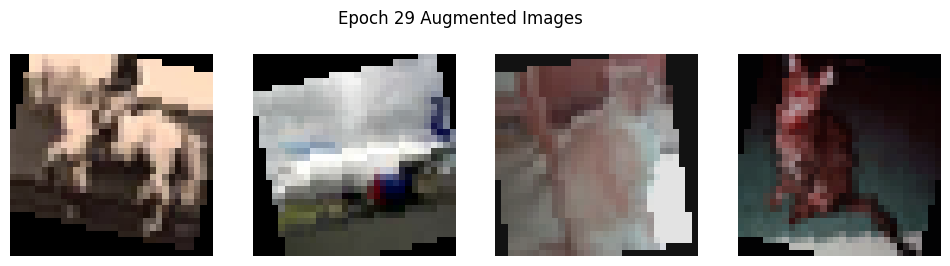

Epoch 30/199, Loss: 0.7874, Train Acc: 0.7309, Val Acc: 0.7746


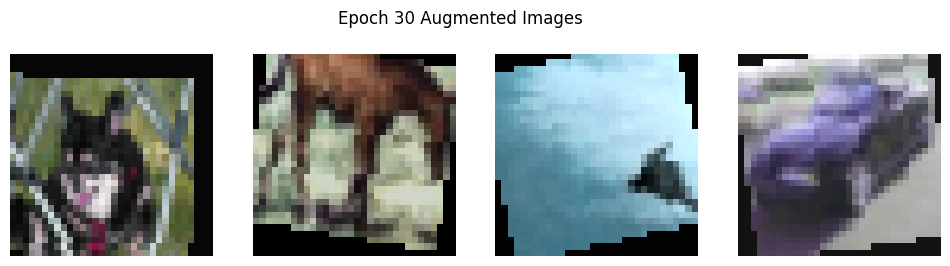

Epoch 31/199, Loss: 0.7889, Train Acc: 0.7300, Val Acc: 0.7747


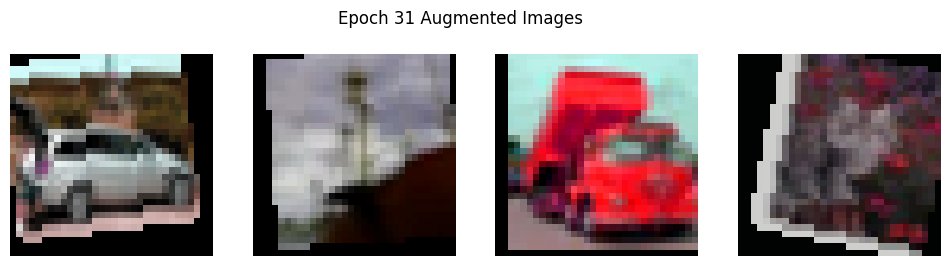

Epoch 32/199, Loss: 0.7863, Train Acc: 0.7312, Val Acc: 0.7683


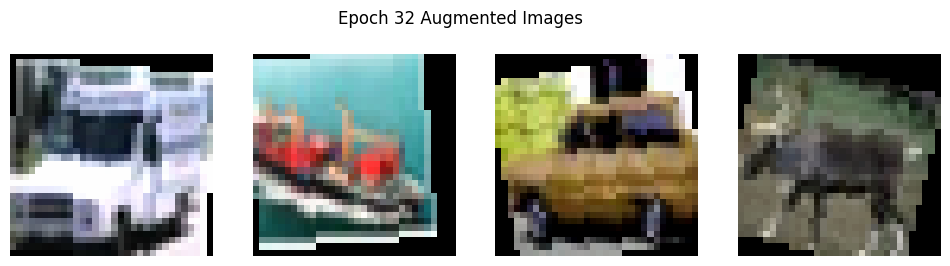

Epoch 33/199, Loss: 0.7741, Train Acc: 0.7332, Val Acc: 0.7793


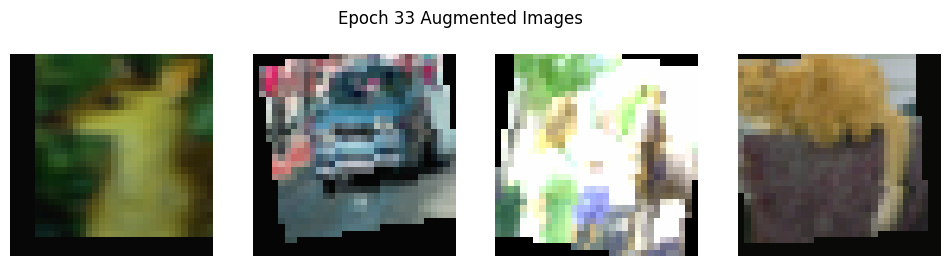

Epoch 34/199, Loss: 0.7761, Train Acc: 0.7341, Val Acc: 0.7833


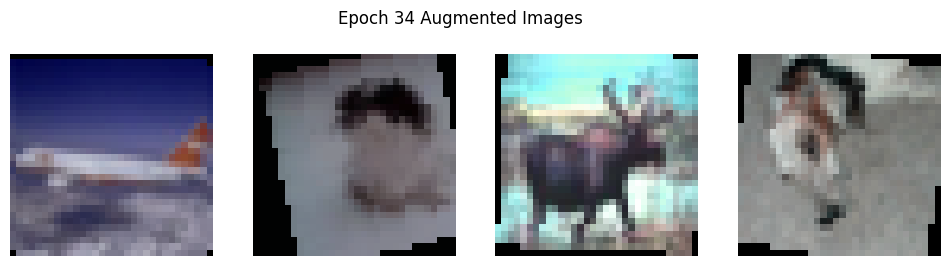

Epoch 35/199, Loss: 0.7661, Train Acc: 0.7378, Val Acc: 0.7816


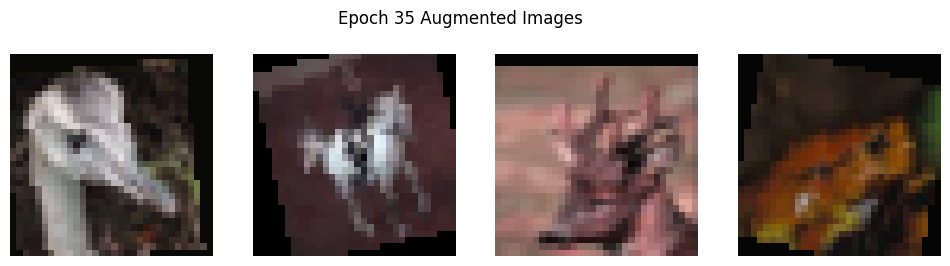

Epoch 36/199, Loss: 0.7642, Train Acc: 0.7395, Val Acc: 0.7739


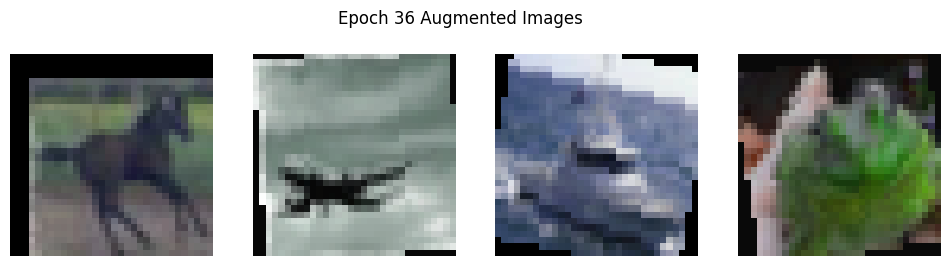

Epoch 37/199, Loss: 0.7615, Train Acc: 0.7391, Val Acc: 0.7887


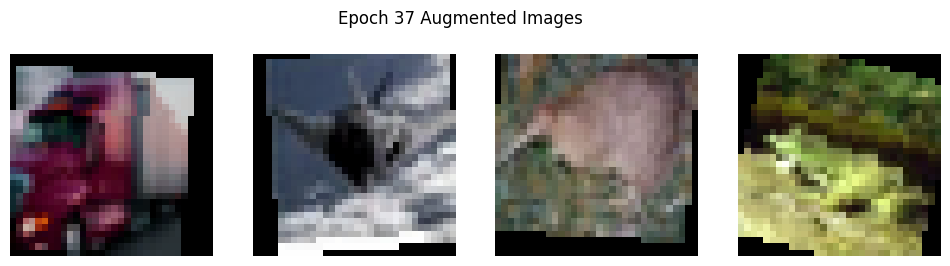

Epoch 38/199, Loss: 0.7510, Train Acc: 0.7442, Val Acc: 0.7863


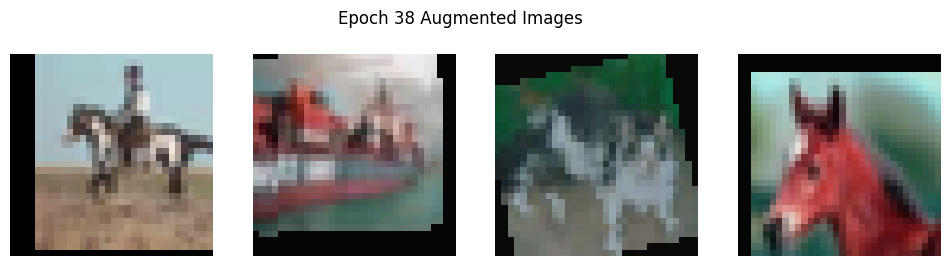

Epoch 39/199, Loss: 0.7479, Train Acc: 0.7432, Val Acc: 0.7905


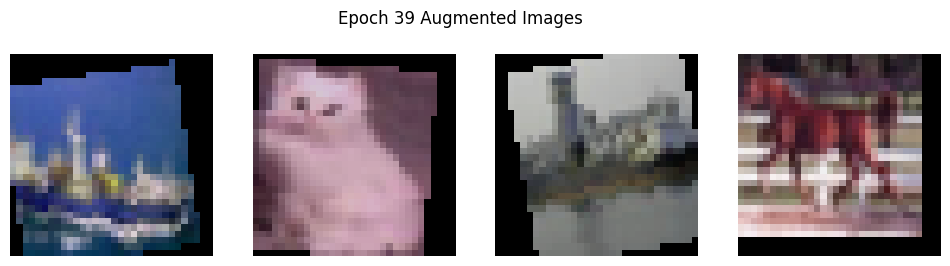

Epoch 40/199, Loss: 0.7371, Train Acc: 0.7478, Val Acc: 0.7803


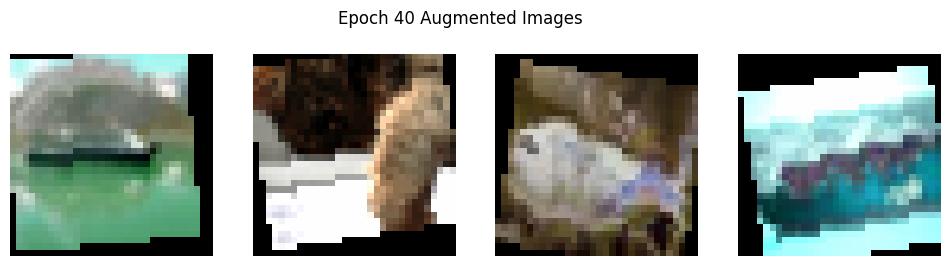

Epoch 41/199, Loss: 0.7358, Train Acc: 0.7481, Val Acc: 0.7835


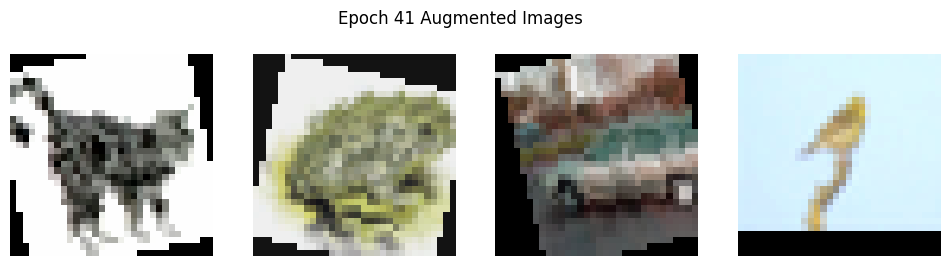

Epoch 42/199, Loss: 0.7337, Train Acc: 0.7492, Val Acc: 0.7971


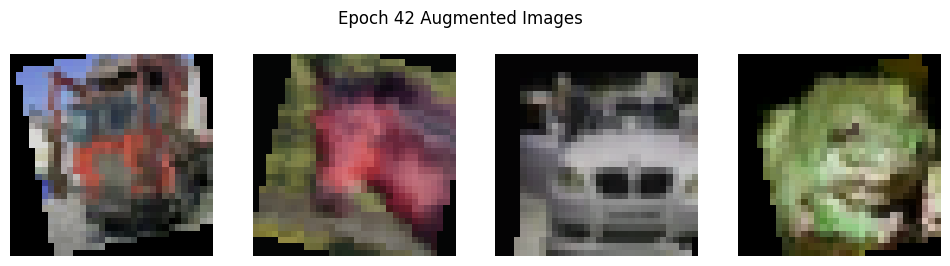

Epoch 43/199, Loss: 0.7246, Train Acc: 0.7502, Val Acc: 0.7837


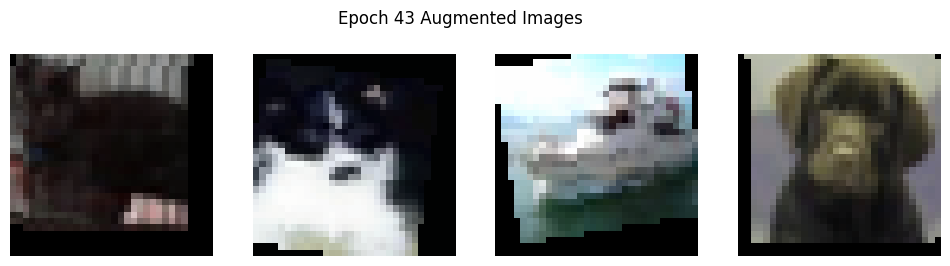

Epoch 44/199, Loss: 0.7319, Train Acc: 0.7481, Val Acc: 0.7973


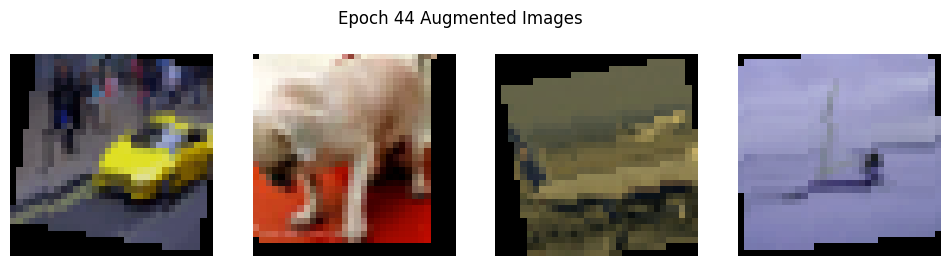

Epoch 45/199, Loss: 0.7241, Train Acc: 0.7519, Val Acc: 0.7938


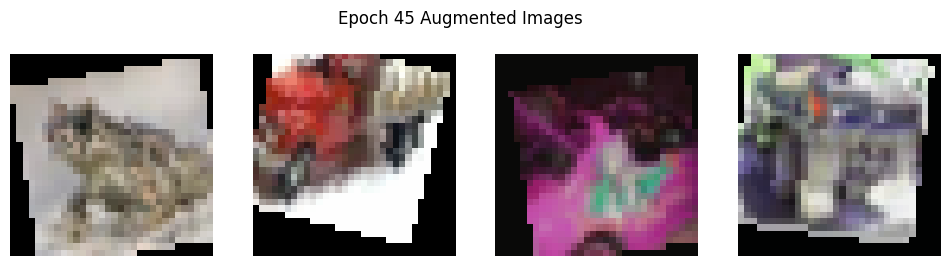

Epoch 46/199, Loss: 0.7213, Train Acc: 0.7536, Val Acc: 0.7984


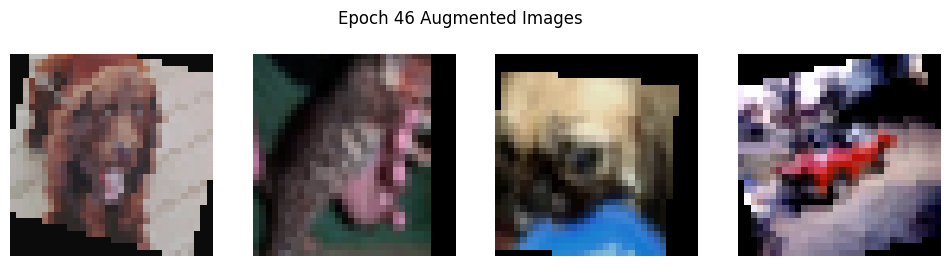

Epoch 47/199, Loss: 0.7197, Train Acc: 0.7550, Val Acc: 0.7938


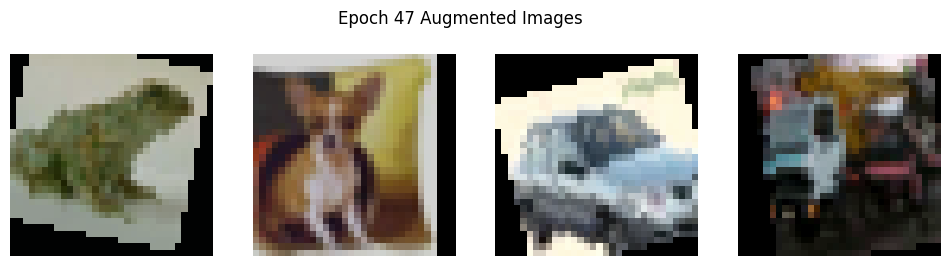

Epoch 48/199, Loss: 0.7085, Train Acc: 0.7594, Val Acc: 0.8004


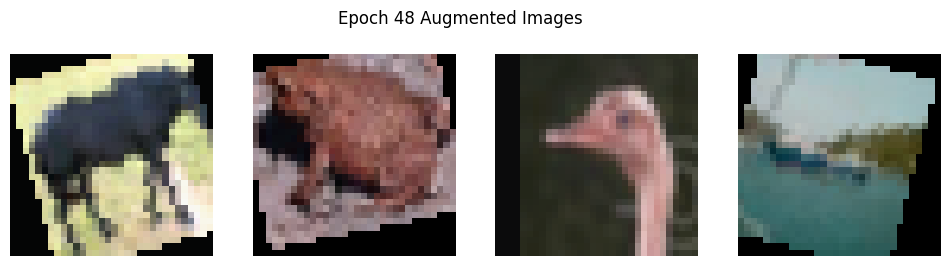

Epoch 49/199, Loss: 0.7166, Train Acc: 0.7567, Val Acc: 0.7836


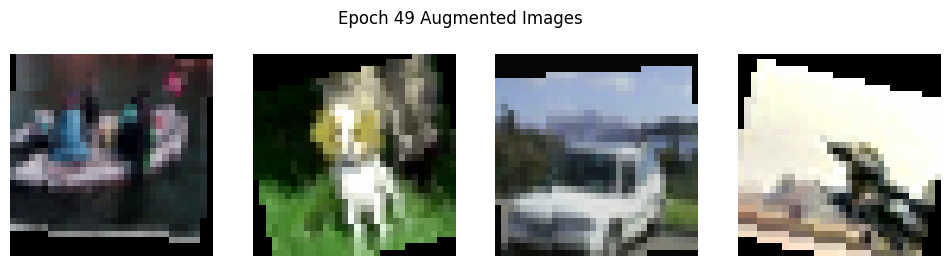

Epoch 50/199, Loss: 0.7096, Train Acc: 0.7577, Val Acc: 0.8027


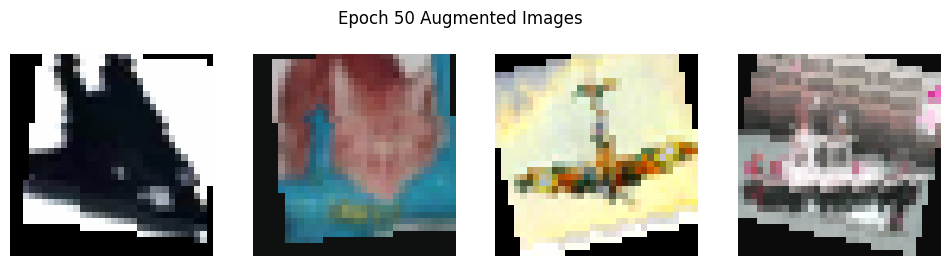

Epoch 51/199, Loss: 0.7047, Train Acc: 0.7595, Val Acc: 0.8047


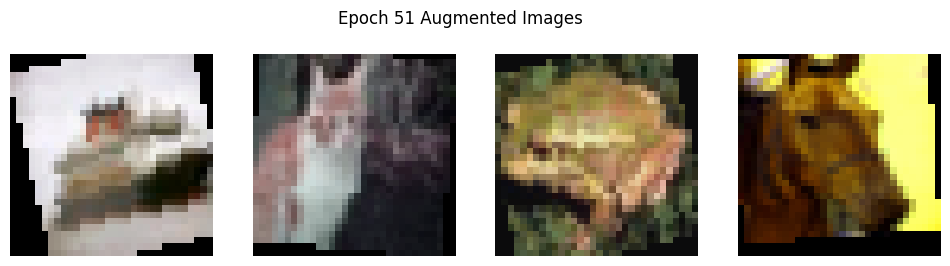

Epoch 52/199, Loss: 0.7051, Train Acc: 0.7592, Val Acc: 0.7894


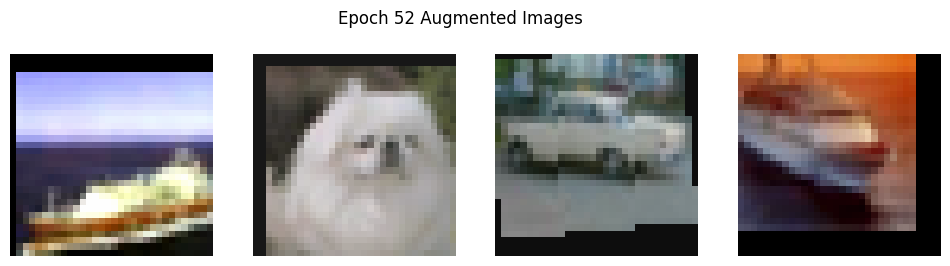

Epoch 53/199, Loss: 0.6996, Train Acc: 0.7636, Val Acc: 0.8001


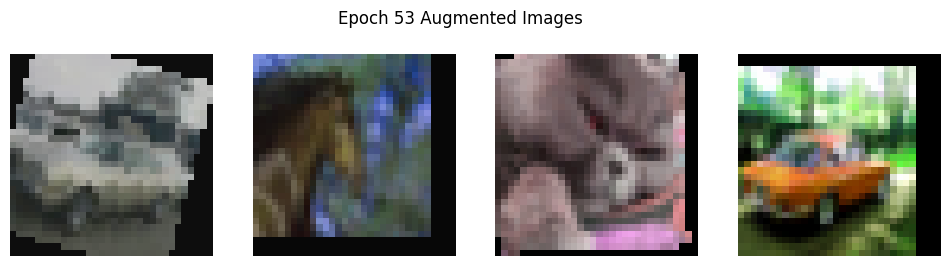

Epoch 54/199, Loss: 0.6972, Train Acc: 0.7609, Val Acc: 0.7995


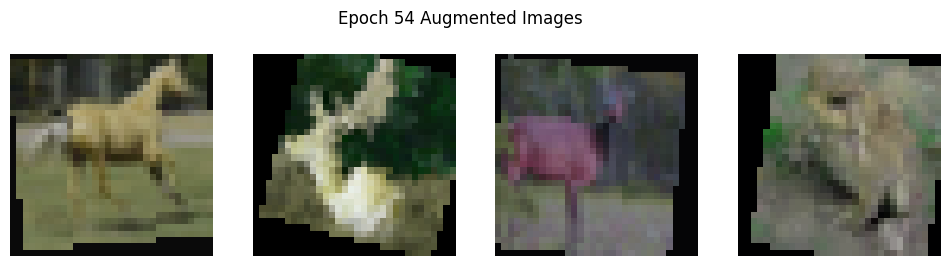

Epoch 55/199, Loss: 0.6909, Train Acc: 0.7653, Val Acc: 0.7968


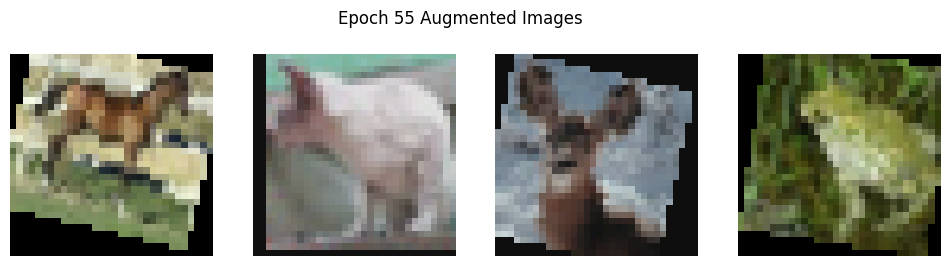

Epoch 56/199, Loss: 0.6975, Train Acc: 0.7627, Val Acc: 0.7912


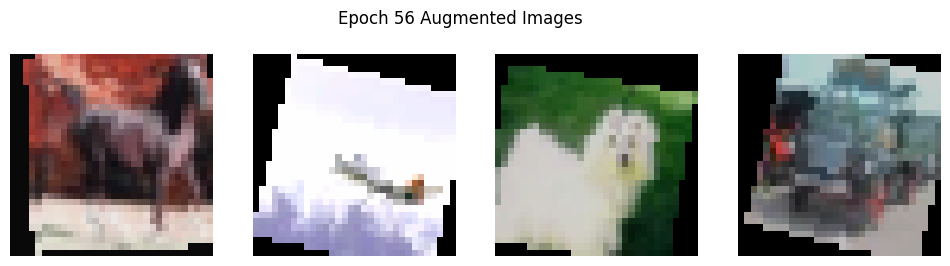

Epoch 57/199, Loss: 0.6852, Train Acc: 0.7673, Val Acc: 0.7961
Epoch 00058: reducing learning rate of group 0 to 1.0000e-04.


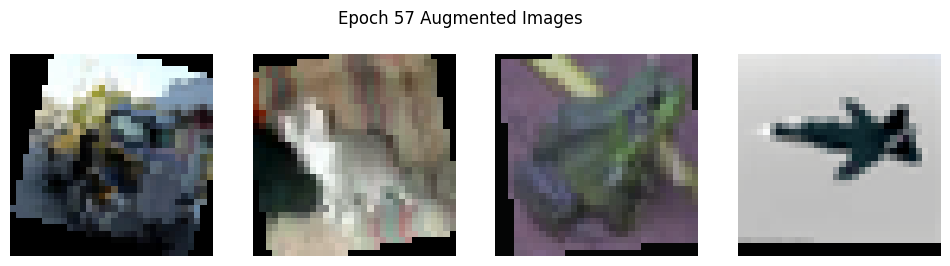

Epoch 58/199, Loss: 0.6068, Train Acc: 0.7928, Val Acc: 0.8235


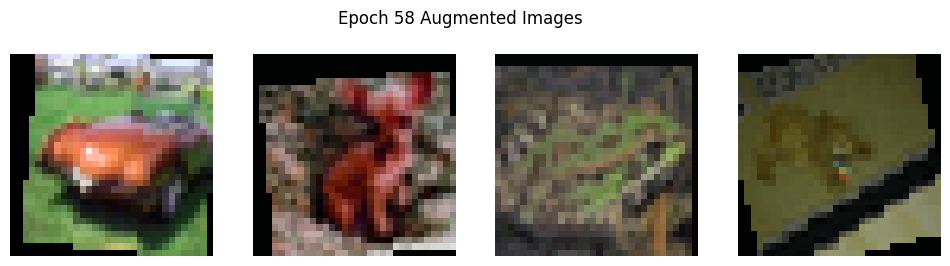

Epoch 59/199, Loss: 0.5970, Train Acc: 0.7946, Val Acc: 0.8247


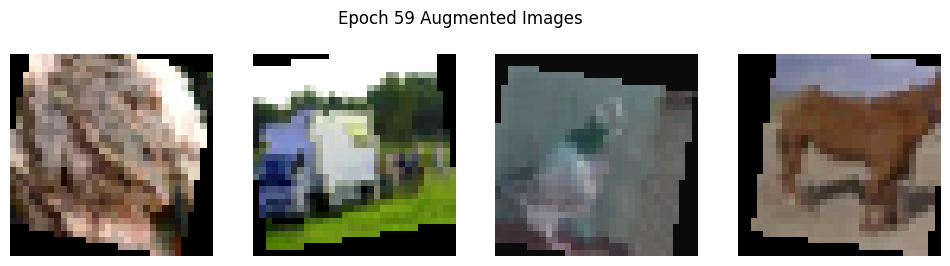

Epoch 60/199, Loss: 0.5864, Train Acc: 0.7985, Val Acc: 0.8257


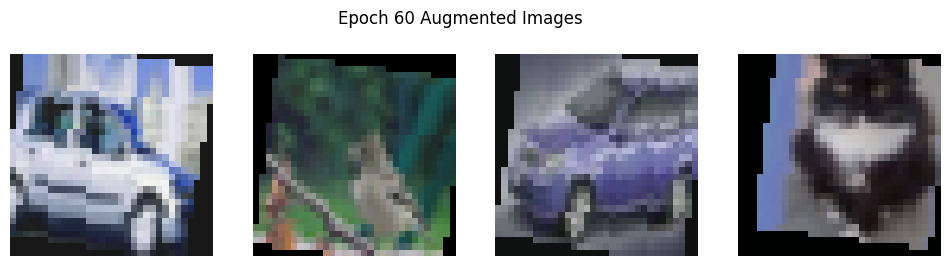

Epoch 61/199, Loss: 0.5841, Train Acc: 0.7977, Val Acc: 0.8260


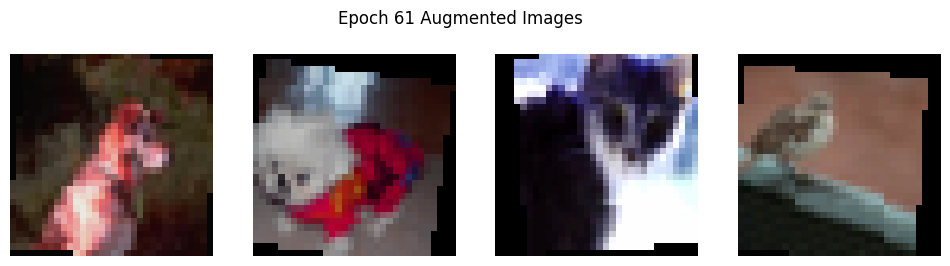

Epoch 62/199, Loss: 0.5780, Train Acc: 0.8007, Val Acc: 0.8269


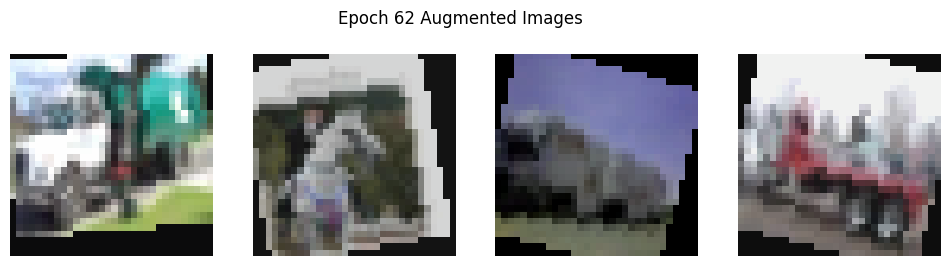

Epoch 63/199, Loss: 0.5695, Train Acc: 0.8038, Val Acc: 0.8253


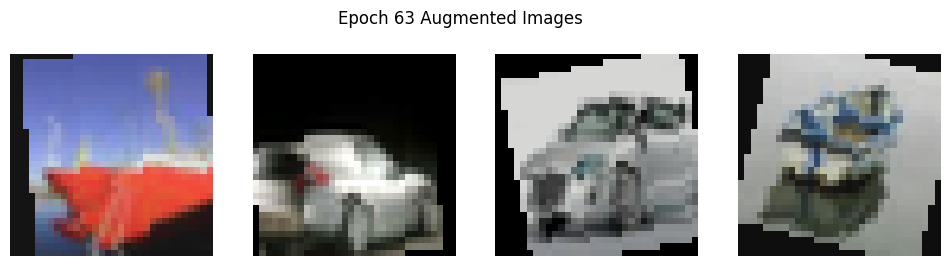

Epoch 64/199, Loss: 0.5715, Train Acc: 0.8030, Val Acc: 0.8262


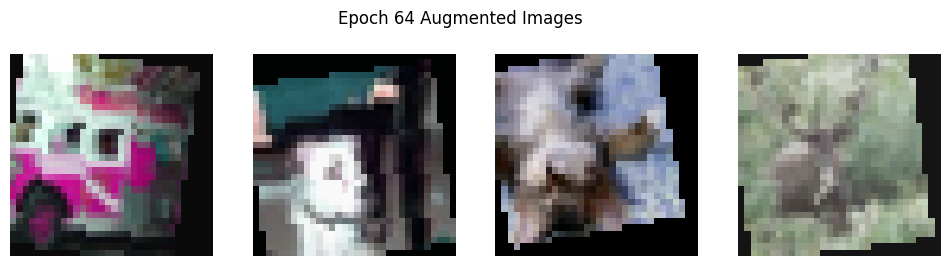

Epoch 65/199, Loss: 0.5681, Train Acc: 0.8053, Val Acc: 0.8278


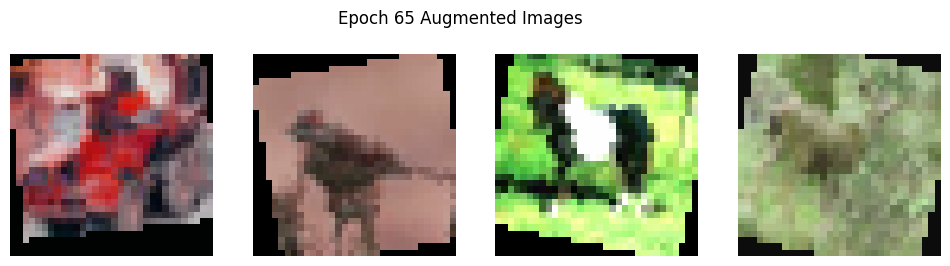

Epoch 66/199, Loss: 0.5659, Train Acc: 0.8069, Val Acc: 0.8276


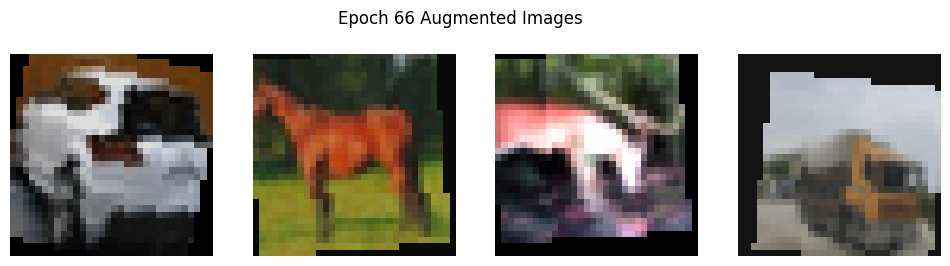

Epoch 67/199, Loss: 0.5564, Train Acc: 0.8075, Val Acc: 0.8305


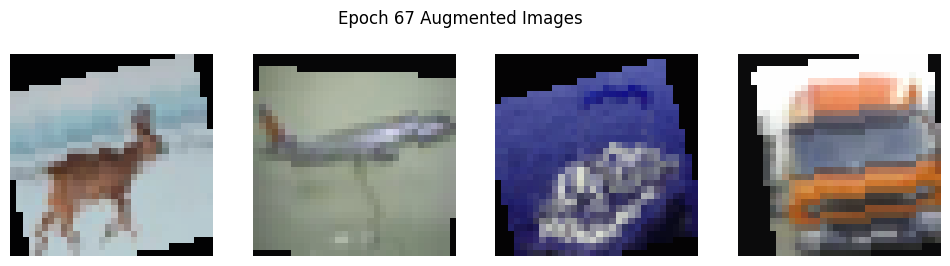

Epoch 68/199, Loss: 0.5561, Train Acc: 0.8076, Val Acc: 0.8313


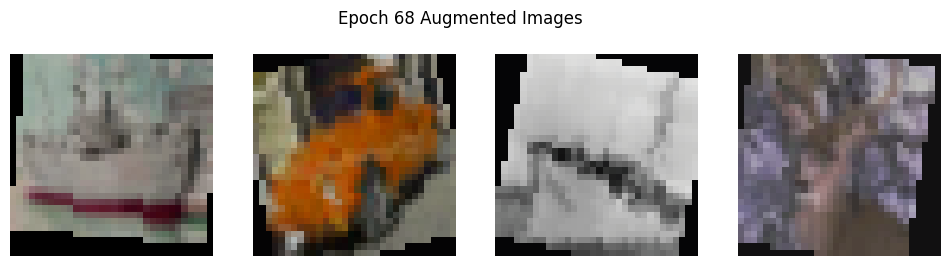

Epoch 69/199, Loss: 0.5604, Train Acc: 0.8079, Val Acc: 0.8307


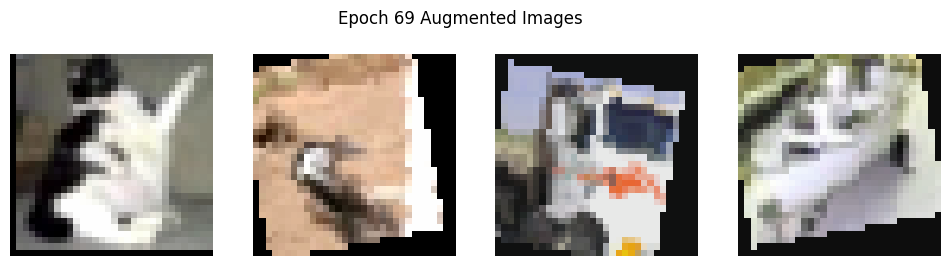

Epoch 70/199, Loss: 0.5522, Train Acc: 0.8094, Val Acc: 0.8296


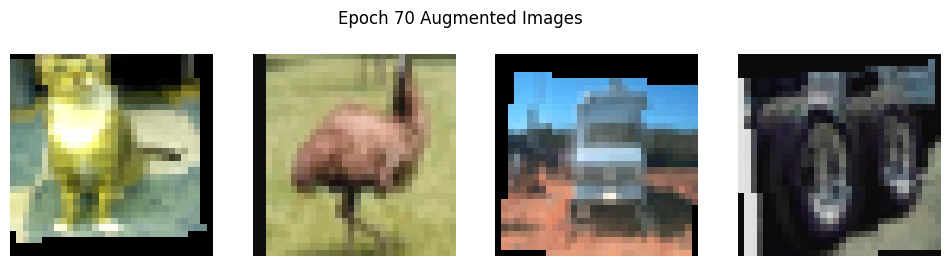

Epoch 71/199, Loss: 0.5477, Train Acc: 0.8108, Val Acc: 0.8297


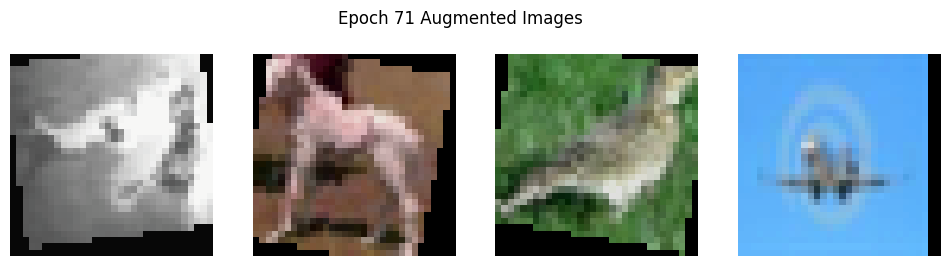

Epoch 72/199, Loss: 0.5478, Train Acc: 0.8081, Val Acc: 0.8305


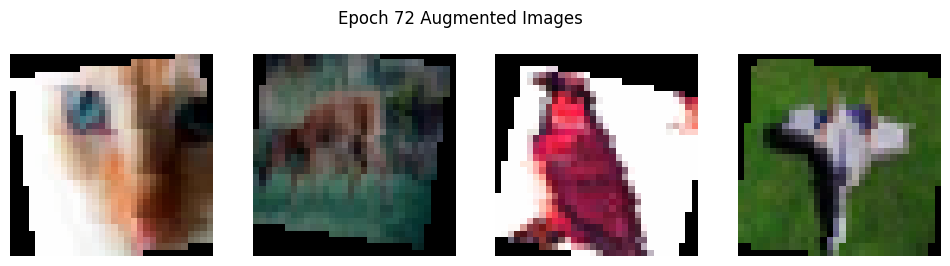

Epoch 73/199, Loss: 0.5501, Train Acc: 0.8116, Val Acc: 0.8325


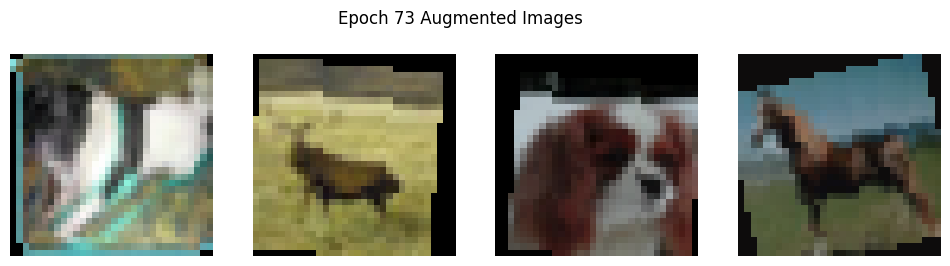

Epoch 74/199, Loss: 0.5453, Train Acc: 0.8120, Val Acc: 0.8335


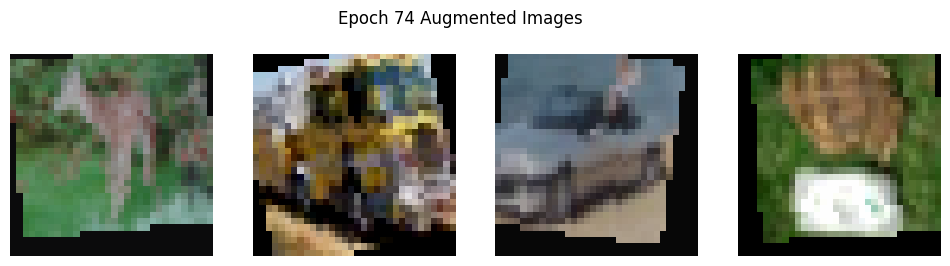

Epoch 75/199, Loss: 0.5402, Train Acc: 0.8134, Val Acc: 0.8320


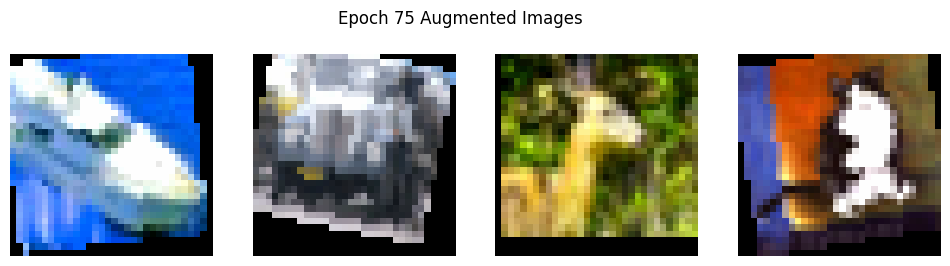

Epoch 76/199, Loss: 0.5435, Train Acc: 0.8114, Val Acc: 0.8332


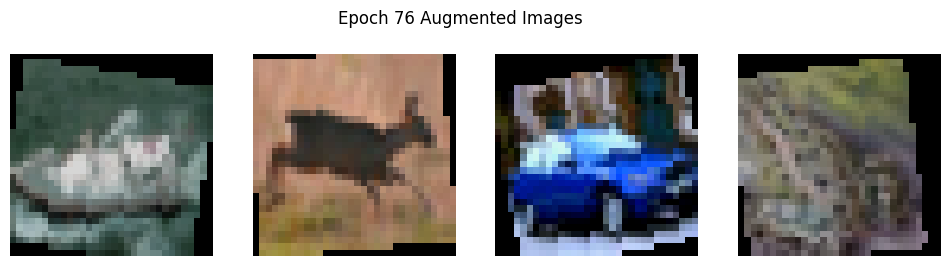

Epoch 77/199, Loss: 0.5439, Train Acc: 0.8119, Val Acc: 0.8329


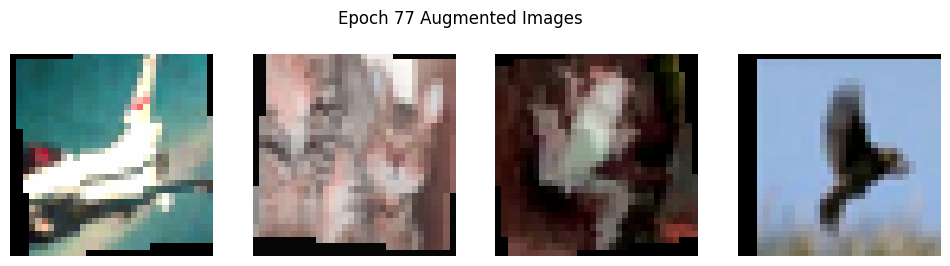

Epoch 78/199, Loss: 0.5360, Train Acc: 0.8183, Val Acc: 0.8335


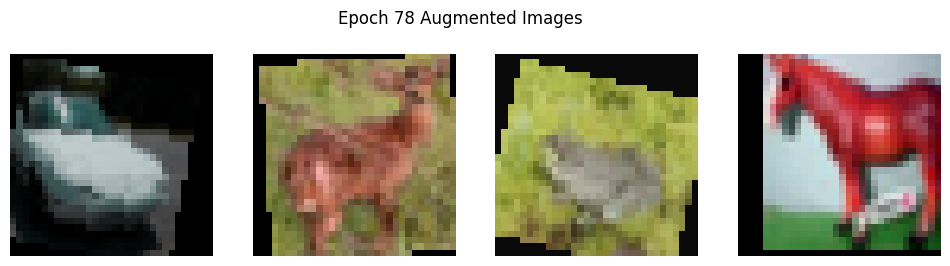

Epoch 79/199, Loss: 0.5358, Train Acc: 0.8157, Val Acc: 0.8358


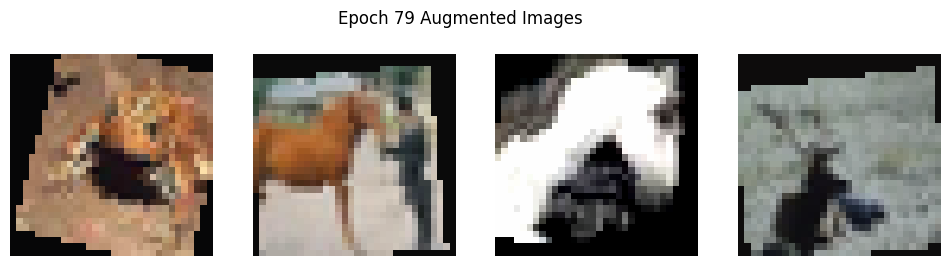

Epoch 80/199, Loss: 0.5341, Train Acc: 0.8159, Val Acc: 0.8343


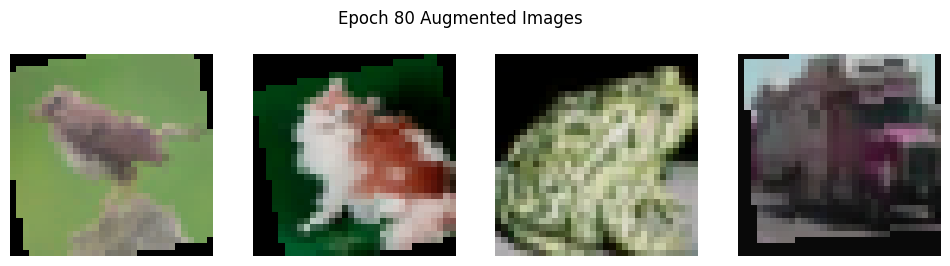

Epoch 81/199, Loss: 0.5307, Train Acc: 0.8161, Val Acc: 0.8351


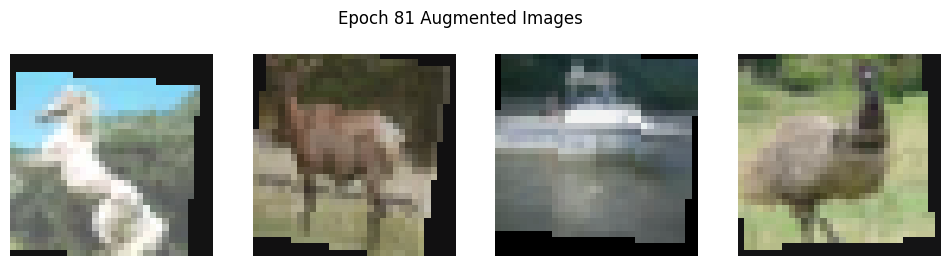

Epoch 82/199, Loss: 0.5338, Train Acc: 0.8156, Val Acc: 0.8332


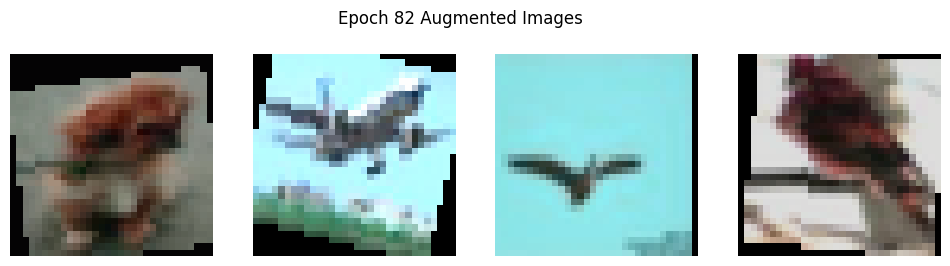

Epoch 83/199, Loss: 0.5296, Train Acc: 0.8177, Val Acc: 0.8335


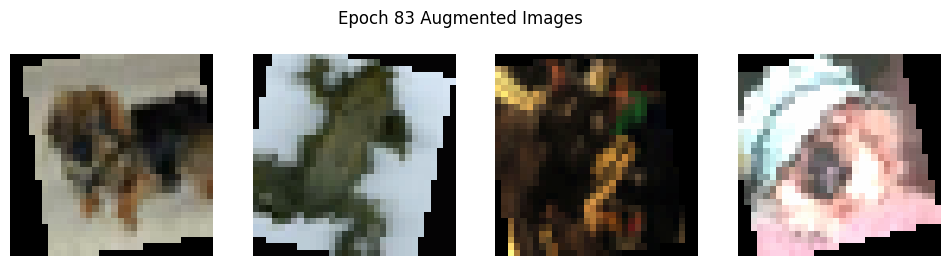

Epoch 84/199, Loss: 0.5284, Train Acc: 0.8174, Val Acc: 0.8313


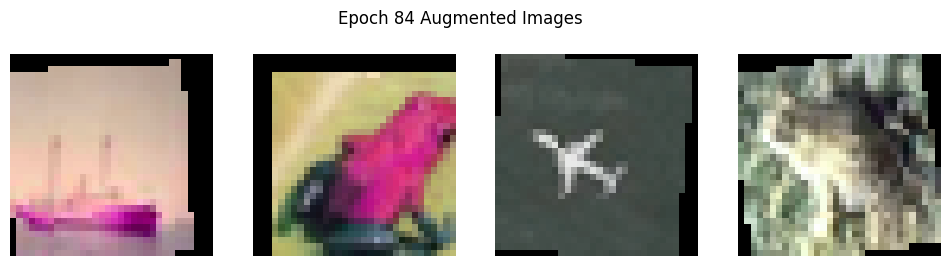

Epoch 85/199, Loss: 0.5270, Train Acc: 0.8172, Val Acc: 0.8305
Epoch 00086: reducing learning rate of group 0 to 1.0000e-05.


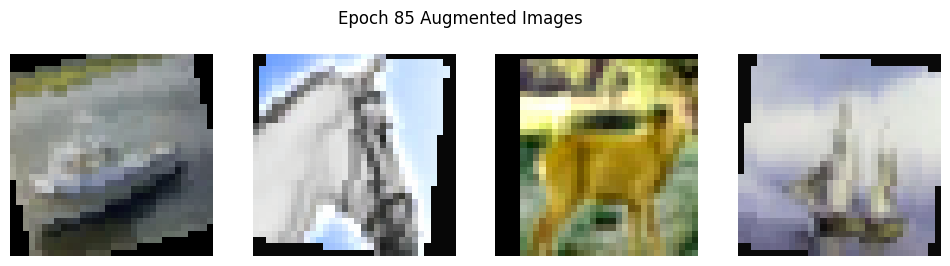

Epoch 86/199, Loss: 0.5257, Train Acc: 0.8185, Val Acc: 0.8350


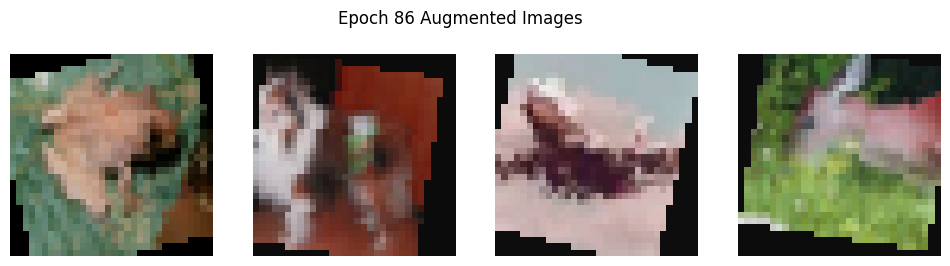

Epoch 87/199, Loss: 0.5245, Train Acc: 0.8175, Val Acc: 0.8354


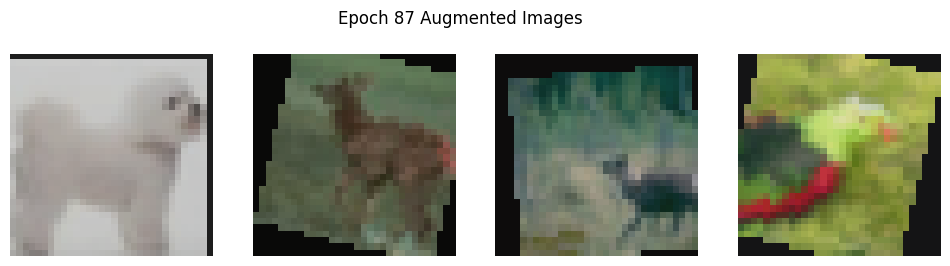

Epoch 88/199, Loss: 0.5246, Train Acc: 0.8189, Val Acc: 0.8357


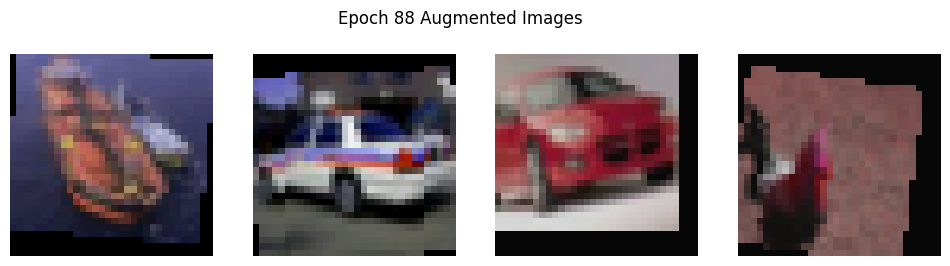

Epoch 89/199, Loss: 0.5181, Train Acc: 0.8214, Val Acc: 0.8353


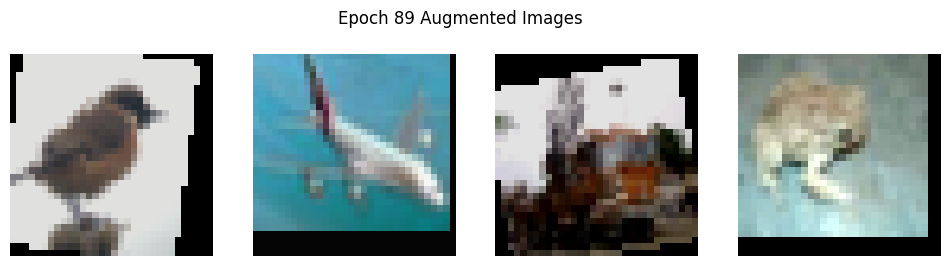

Epoch 90/199, Loss: 0.5118, Train Acc: 0.8229, Val Acc: 0.8350


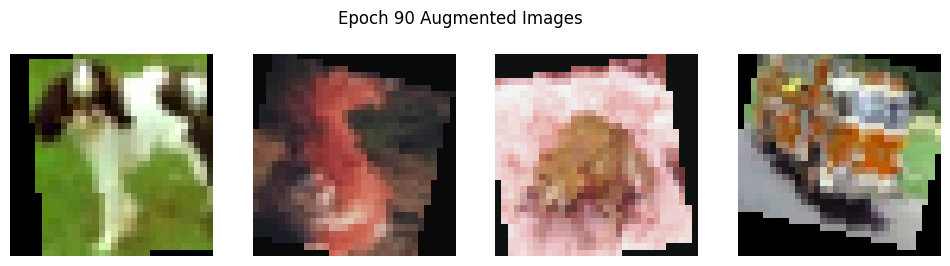

Epoch 91/199, Loss: 0.5172, Train Acc: 0.8209, Val Acc: 0.8356
Epoch 00092: reducing learning rate of group 0 to 1.0000e-06.


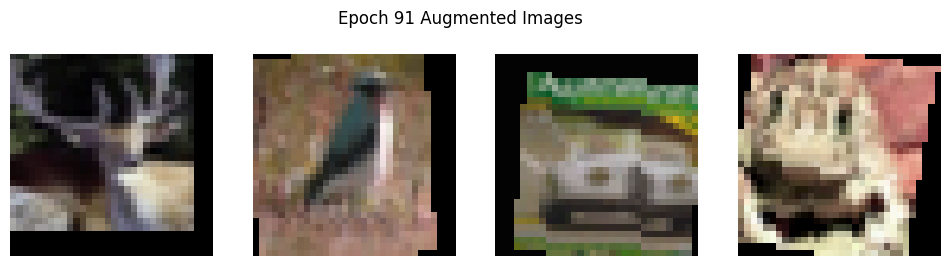

Epoch 92/199, Loss: 0.5143, Train Acc: 0.8225, Val Acc: 0.8351


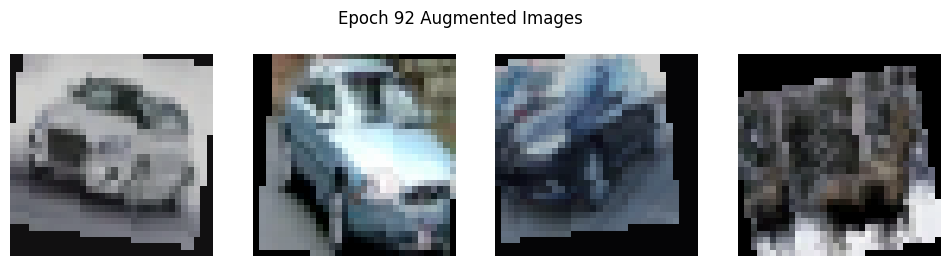

Epoch 93/199, Loss: 0.5178, Train Acc: 0.8203, Val Acc: 0.8347


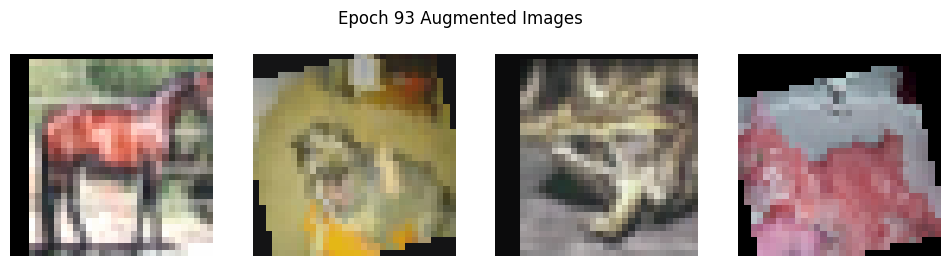

Epoch 94/199, Loss: 0.5152, Train Acc: 0.8203, Val Acc: 0.8354


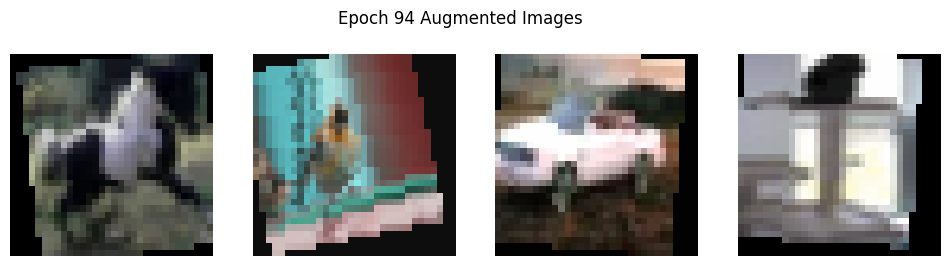

Epoch 95/199, Loss: 0.5154, Train Acc: 0.8228, Val Acc: 0.8349


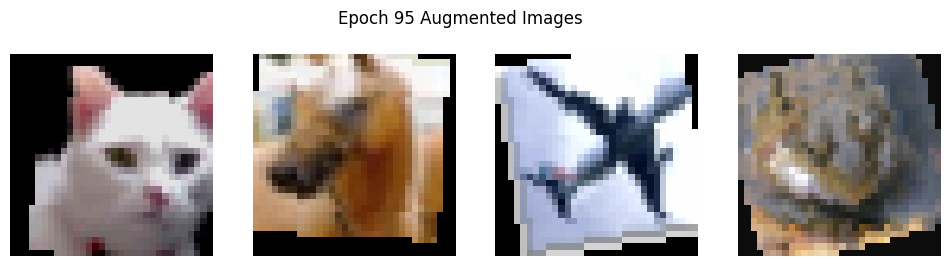

Epoch 96/199, Loss: 0.5192, Train Acc: 0.8220, Val Acc: 0.8354


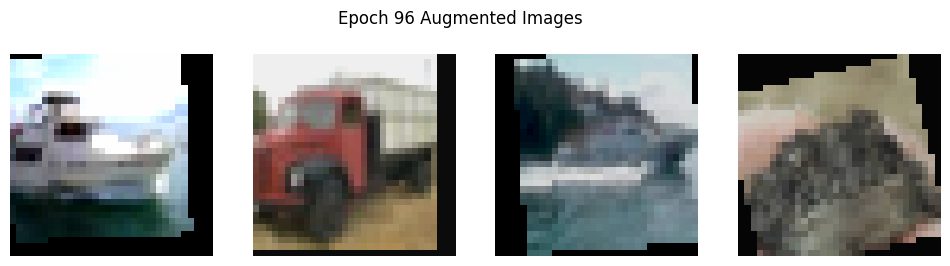

Epoch 97/199, Loss: 0.5175, Train Acc: 0.8201, Val Acc: 0.8355
Epoch 00098: reducing learning rate of group 0 to 1.0000e-07.


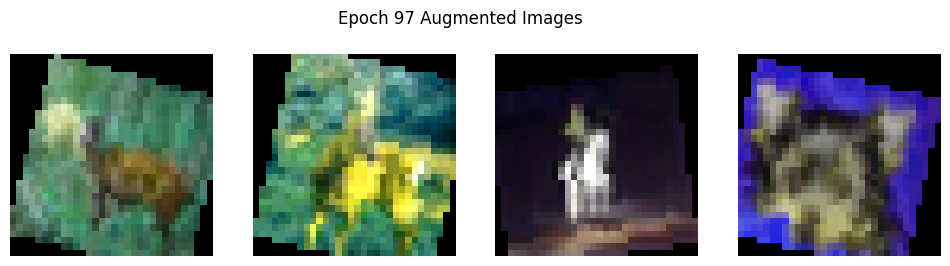

Epoch 98/199, Loss: 0.5172, Train Acc: 0.8209, Val Acc: 0.8354


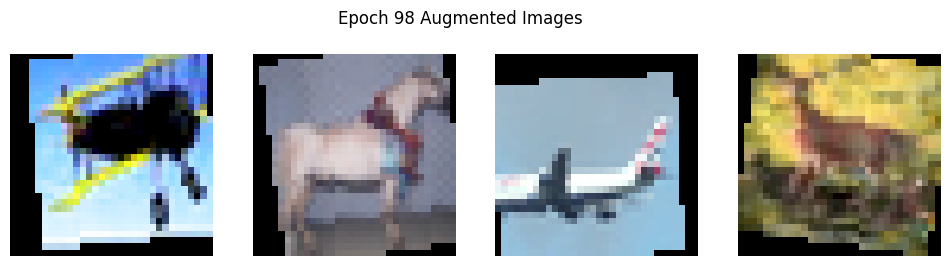

Epoch 99/199, Loss: 0.5173, Train Acc: 0.8220, Val Acc: 0.8355


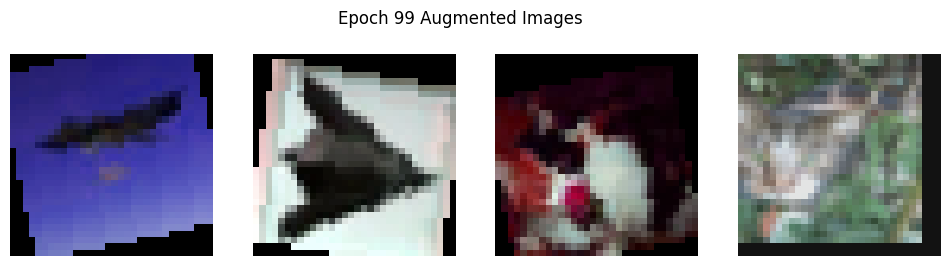

Epoch 100/199, Loss: 0.5176, Train Acc: 0.8193, Val Acc: 0.8355


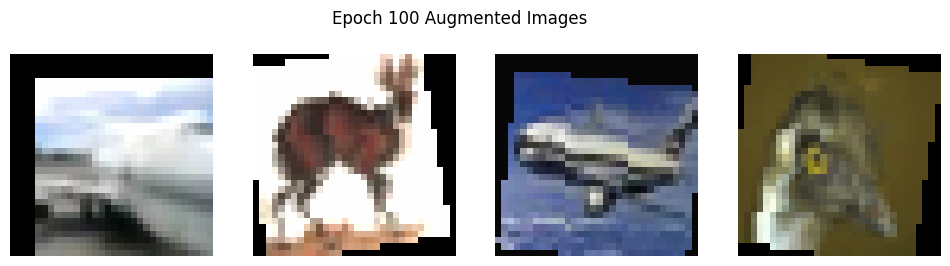

Epoch 101/199, Loss: 0.5193, Train Acc: 0.8204, Val Acc: 0.8356


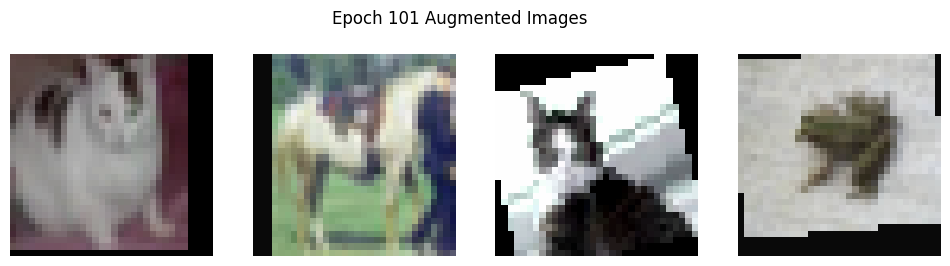

Epoch 102/199, Loss: 0.5132, Train Acc: 0.8219, Val Acc: 0.8356


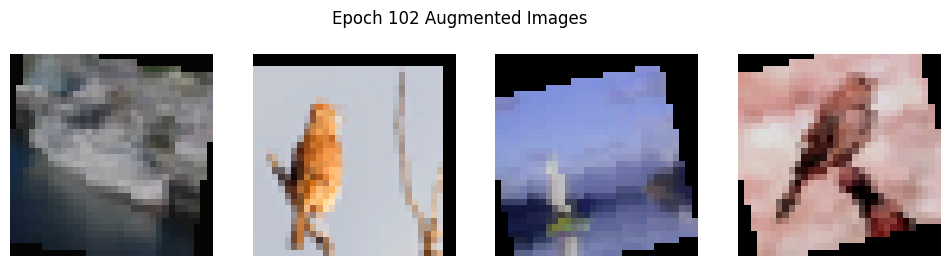

Epoch 103/199, Loss: 0.5193, Train Acc: 0.8207, Val Acc: 0.8356
Epoch 00104: reducing learning rate of group 0 to 1.0000e-08.


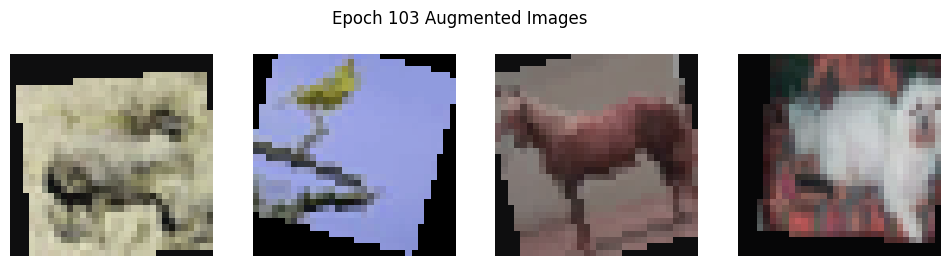

Epoch 104/199, Loss: 0.5159, Train Acc: 0.8211, Val Acc: 0.8356


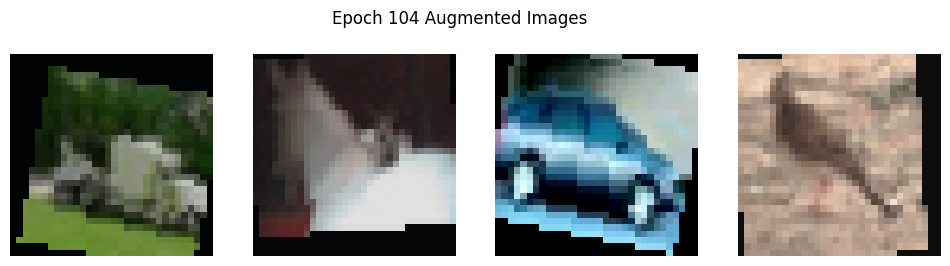

Epoch 105/199, Loss: 0.5139, Train Acc: 0.8214, Val Acc: 0.8356


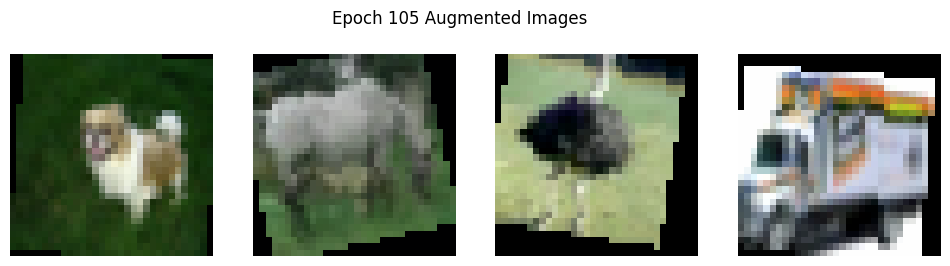

Epoch 106/199, Loss: 0.5138, Train Acc: 0.8227, Val Acc: 0.8356


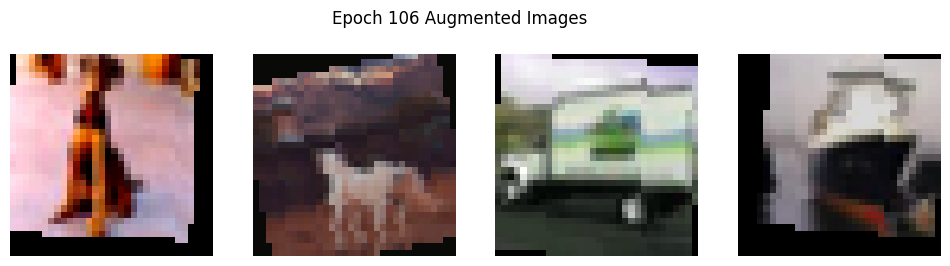

Epoch 107/199, Loss: 0.5155, Train Acc: 0.8203, Val Acc: 0.8356


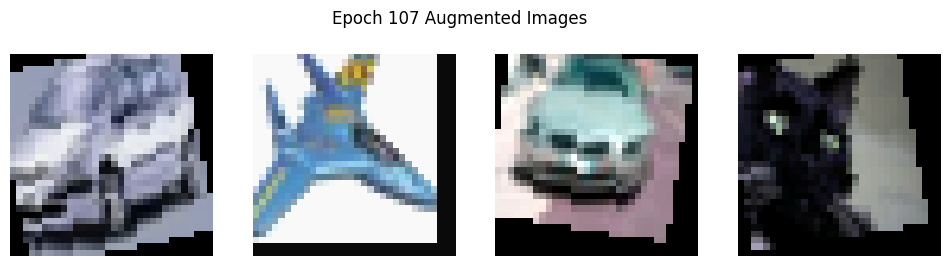

Epoch 108/199, Loss: 0.5124, Train Acc: 0.8234, Val Acc: 0.8356


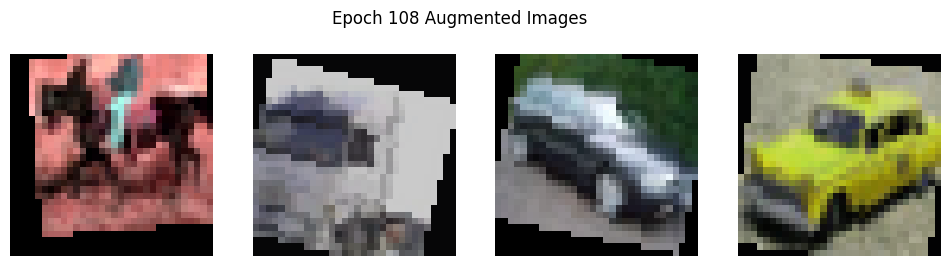

Epoch 109/199, Loss: 0.5130, Train Acc: 0.8218, Val Acc: 0.8356


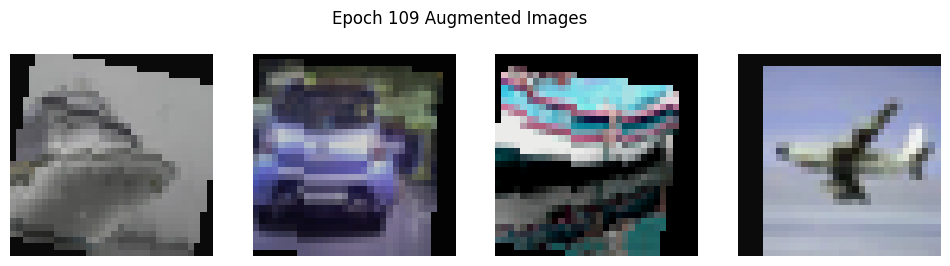

Epoch 110/199, Loss: 0.5125, Train Acc: 0.8212, Val Acc: 0.8356


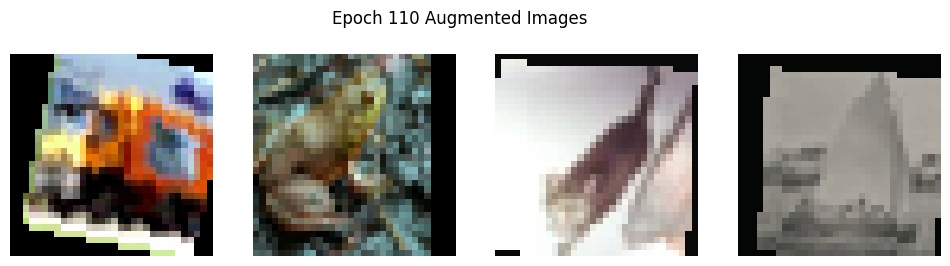

Epoch 111/199, Loss: 0.5176, Train Acc: 0.8204, Val Acc: 0.8356


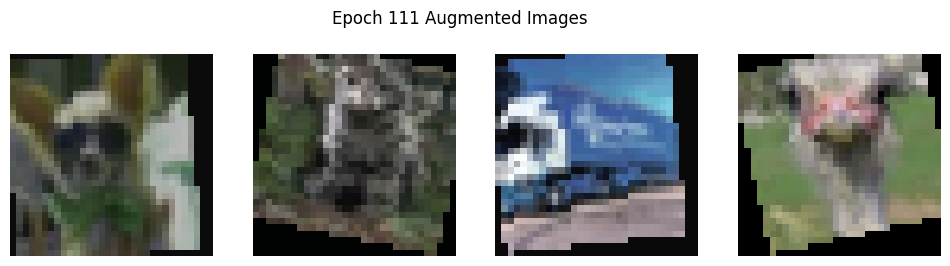

Epoch 112/199, Loss: 0.5141, Train Acc: 0.8233, Val Acc: 0.8356


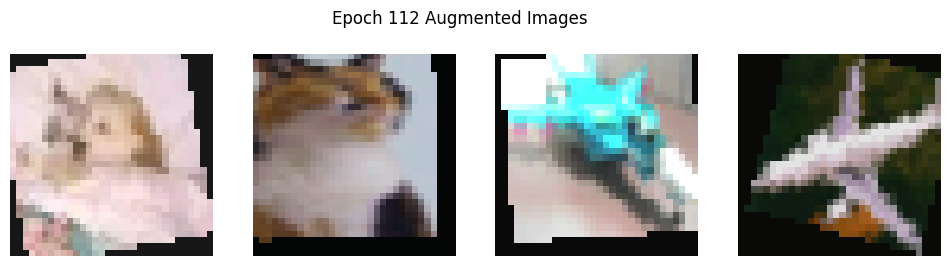

Epoch 113/199, Loss: 0.5196, Train Acc: 0.8195, Val Acc: 0.8356


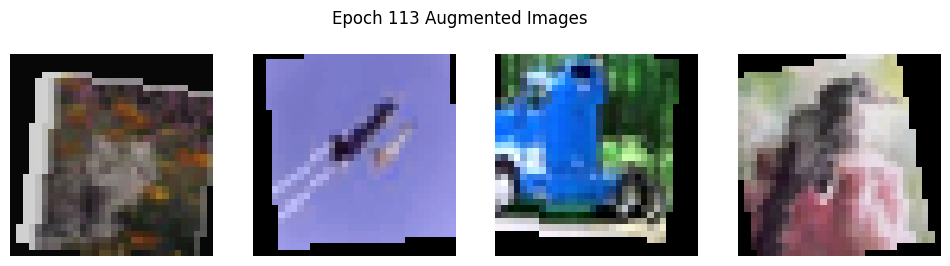

Epoch 114/199, Loss: 0.5158, Train Acc: 0.8208, Val Acc: 0.8356


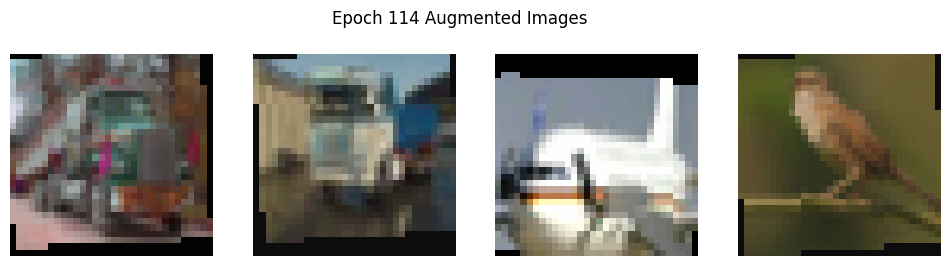

Epoch 115/199, Loss: 0.5127, Train Acc: 0.8235, Val Acc: 0.8356


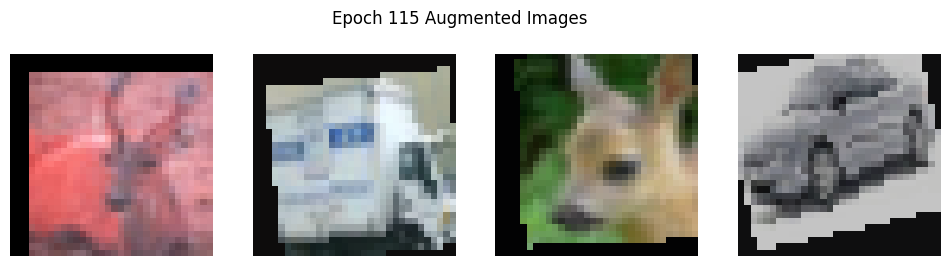

Epoch 116/199, Loss: 0.5174, Train Acc: 0.8223, Val Acc: 0.8356


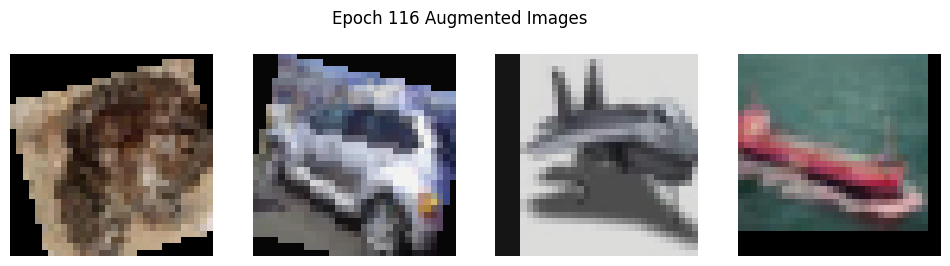

Epoch 117/199, Loss: 0.5134, Train Acc: 0.8228, Val Acc: 0.8356


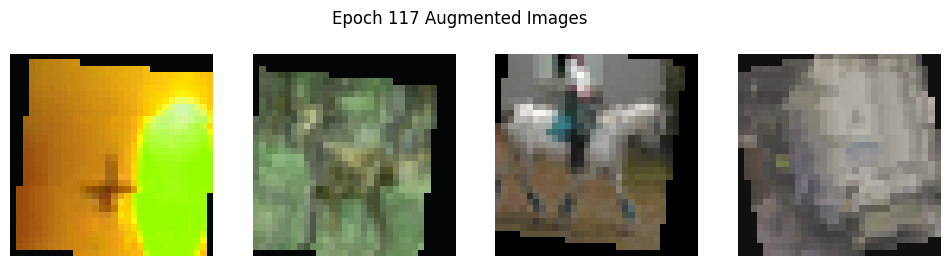

Epoch 118/199, Loss: 0.5188, Train Acc: 0.8214, Val Acc: 0.8356


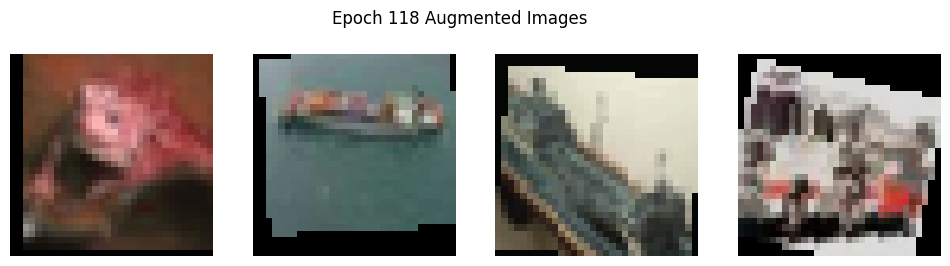

Epoch 119/199, Loss: 0.5152, Train Acc: 0.8217, Val Acc: 0.8356


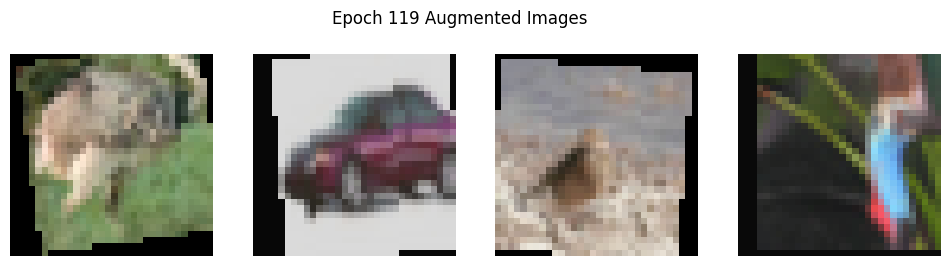

Epoch 120/199, Loss: 0.5138, Train Acc: 0.8215, Val Acc: 0.8356


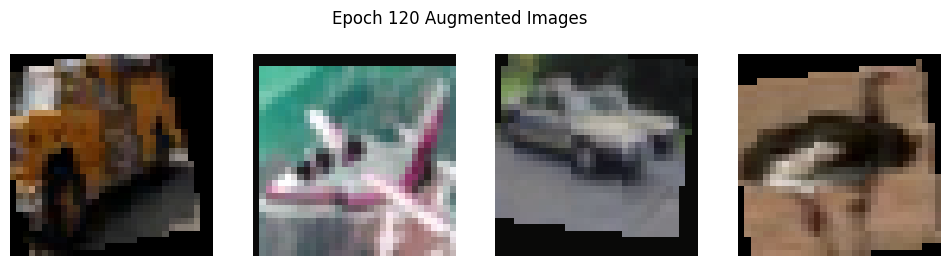

Epoch 121/199, Loss: 0.5171, Train Acc: 0.8213, Val Acc: 0.8356


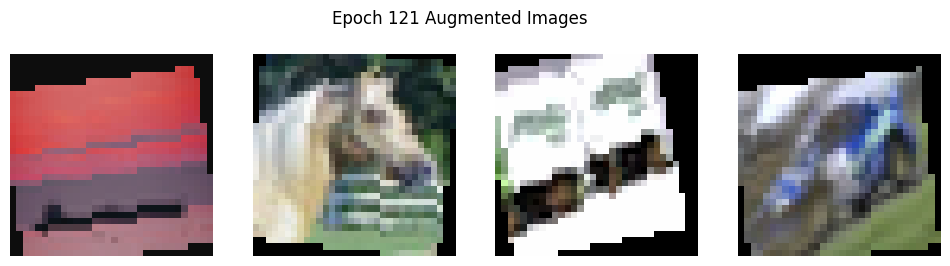

Epoch 122/199, Loss: 0.5141, Train Acc: 0.8226, Val Acc: 0.8356


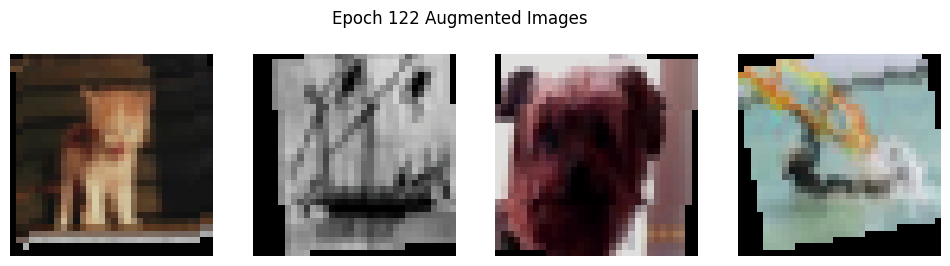

Epoch 123/199, Loss: 0.5173, Train Acc: 0.8209, Val Acc: 0.8356


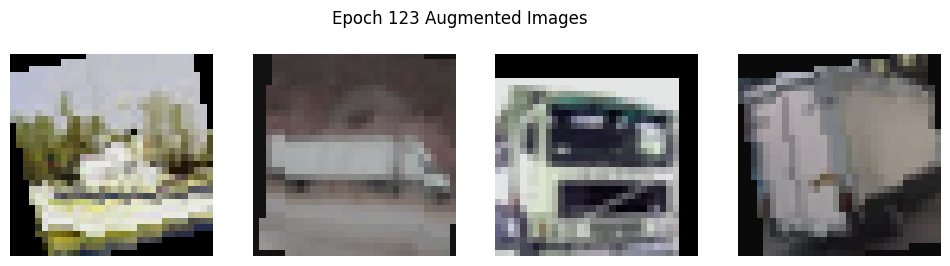

Epoch 124/199, Loss: 0.5195, Train Acc: 0.8212, Val Acc: 0.8356


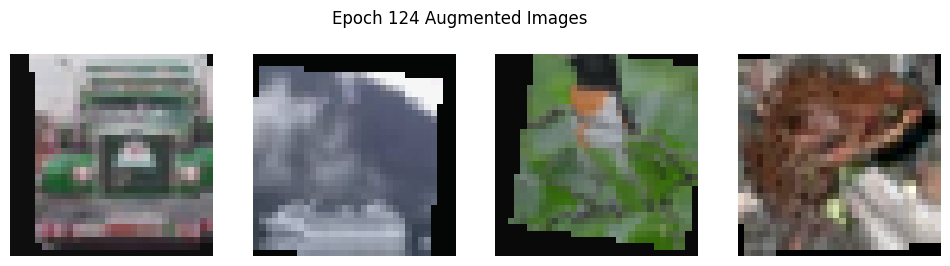

Epoch 125/199, Loss: 0.5137, Train Acc: 0.8209, Val Acc: 0.8356


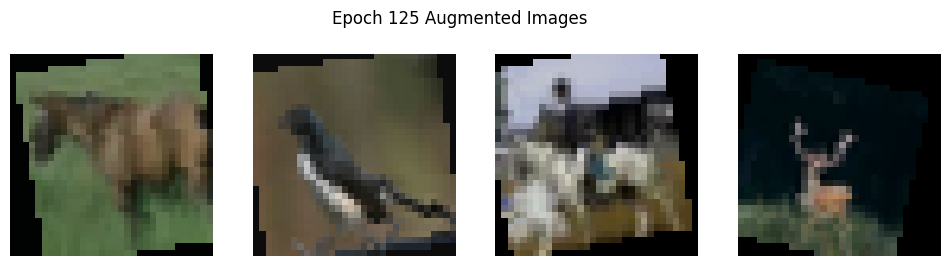

Epoch 126/199, Loss: 0.5169, Train Acc: 0.8211, Val Acc: 0.8356


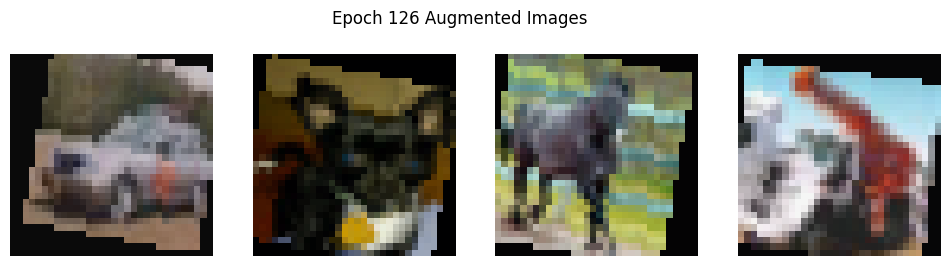

Epoch 127/199, Loss: 0.5165, Train Acc: 0.8206, Val Acc: 0.8356


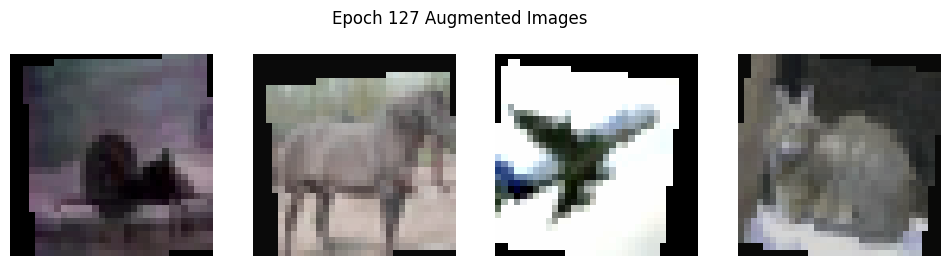

Epoch 128/199, Loss: 0.5115, Train Acc: 0.8226, Val Acc: 0.8356


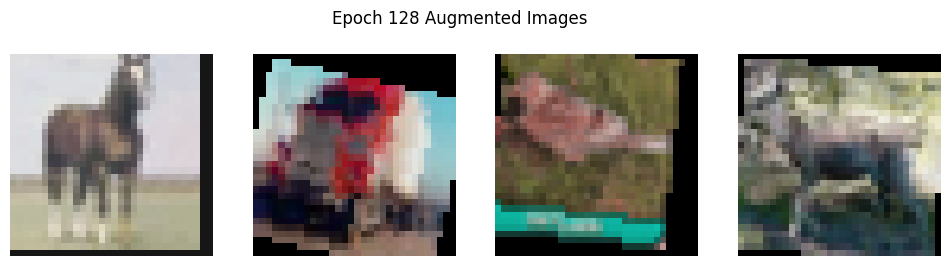

Epoch 129/199, Loss: 0.5189, Train Acc: 0.8203, Val Acc: 0.8356


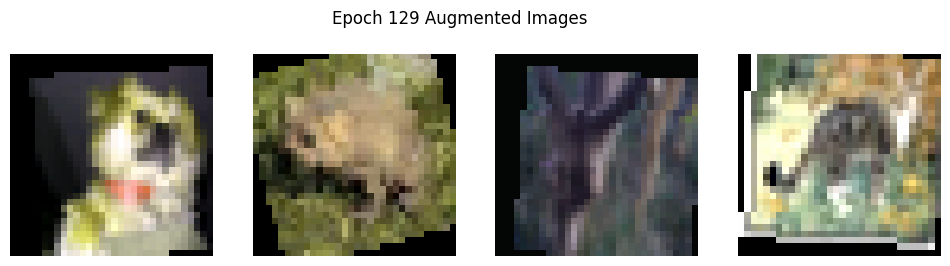

Epoch 130/199, Loss: 0.5110, Train Acc: 0.8237, Val Acc: 0.8356


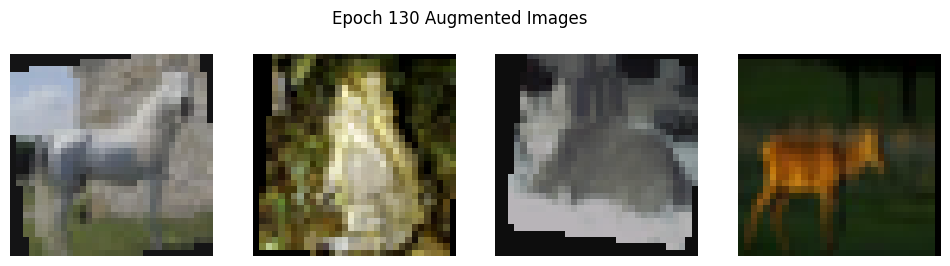

Epoch 131/199, Loss: 0.5102, Train Acc: 0.8222, Val Acc: 0.8356


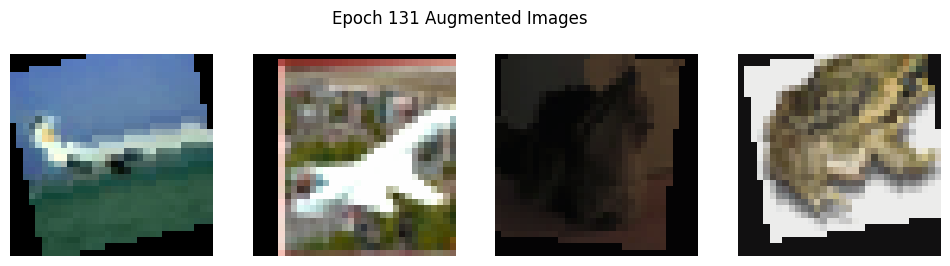

Epoch 132/199, Loss: 0.5139, Train Acc: 0.8214, Val Acc: 0.8356


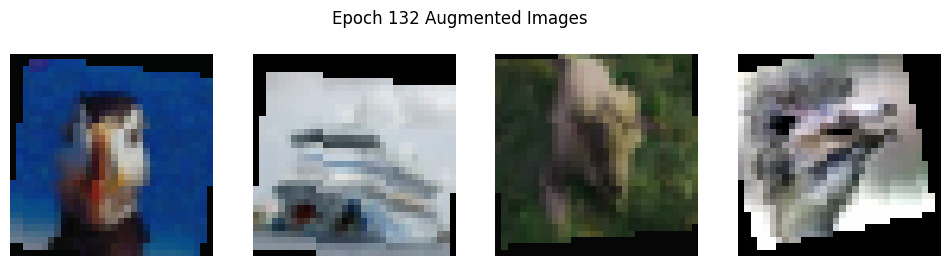

Epoch 133/199, Loss: 0.5181, Train Acc: 0.8202, Val Acc: 0.8356


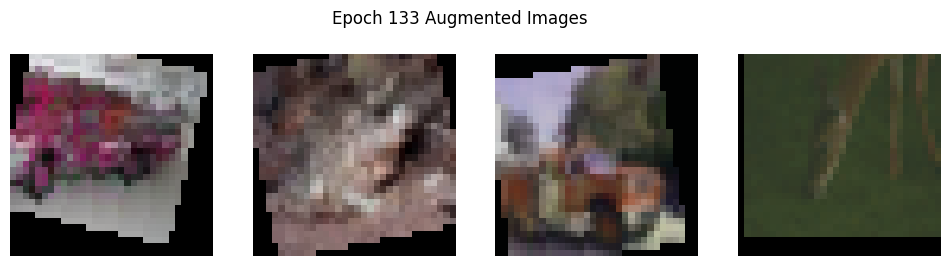

Epoch 134/199, Loss: 0.5131, Train Acc: 0.8223, Val Acc: 0.8356


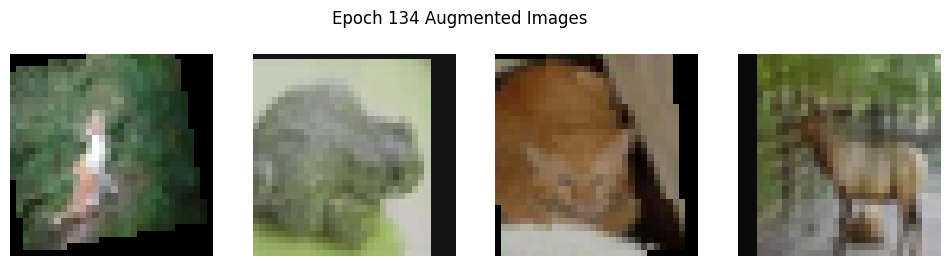

Epoch 135/199, Loss: 0.5202, Train Acc: 0.8194, Val Acc: 0.8356


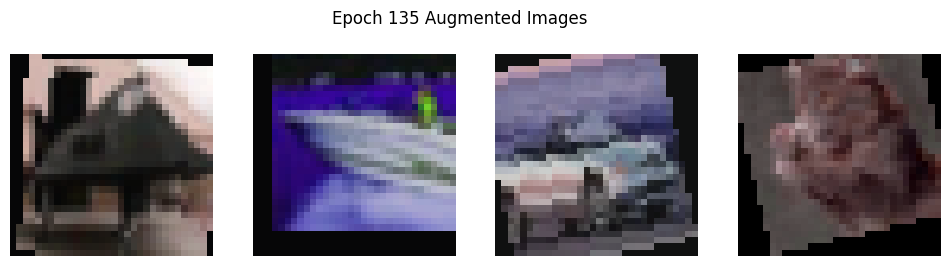

Epoch 136/199, Loss: 0.5181, Train Acc: 0.8220, Val Acc: 0.8356


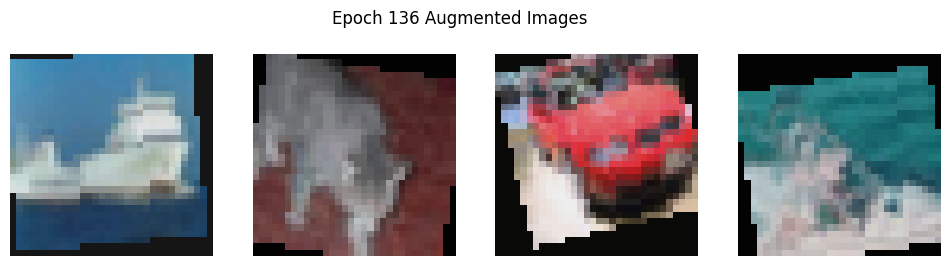

Epoch 137/199, Loss: 0.5157, Train Acc: 0.8224, Val Acc: 0.8356


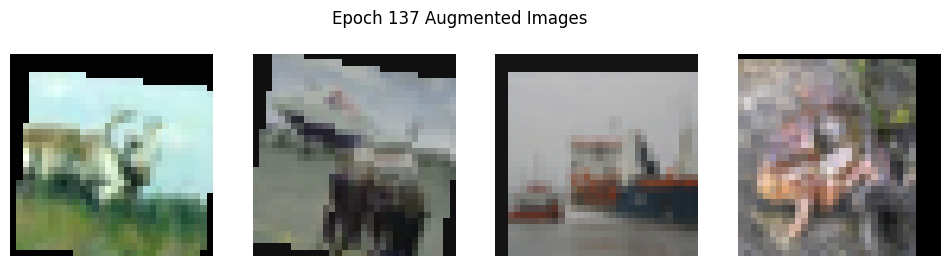

Epoch 138/199, Loss: 0.5135, Train Acc: 0.8217, Val Acc: 0.8356


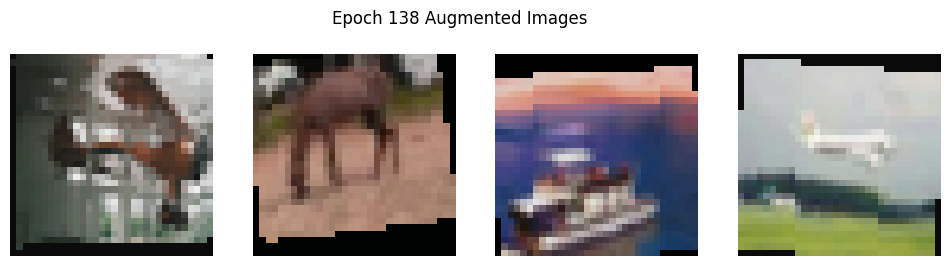

Epoch 139/199, Loss: 0.5155, Train Acc: 0.8201, Val Acc: 0.8356


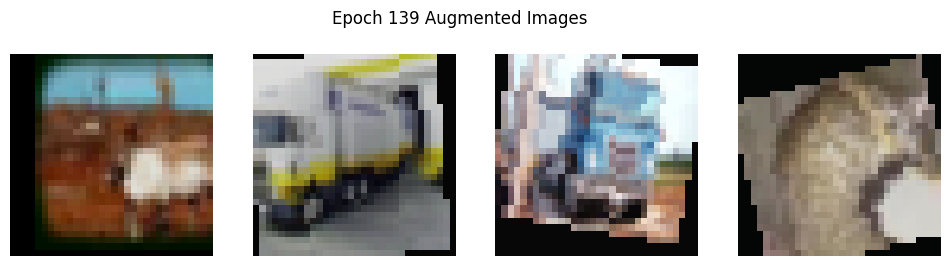

Epoch 140/199, Loss: 0.5145, Train Acc: 0.8213, Val Acc: 0.8356


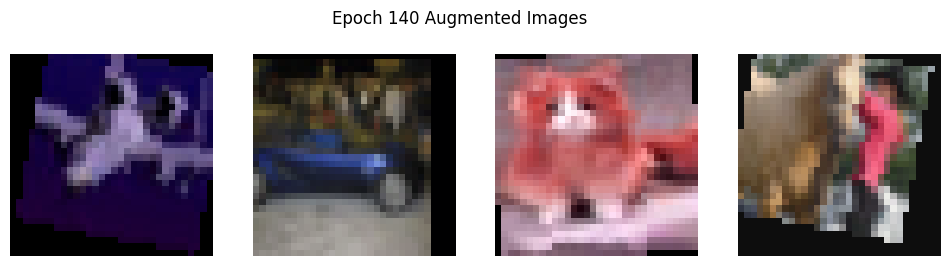

Epoch 141/199, Loss: 0.5150, Train Acc: 0.8223, Val Acc: 0.8356


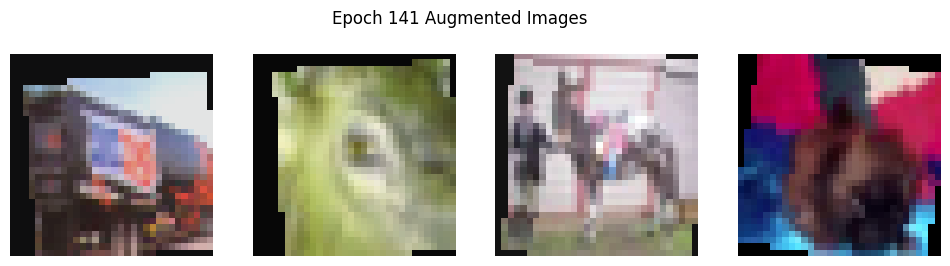

Epoch 142/199, Loss: 0.5172, Train Acc: 0.8196, Val Acc: 0.8356


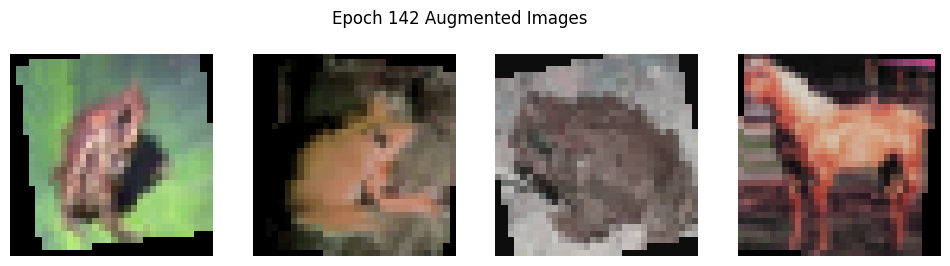

Epoch 143/199, Loss: 0.5168, Train Acc: 0.8218, Val Acc: 0.8356


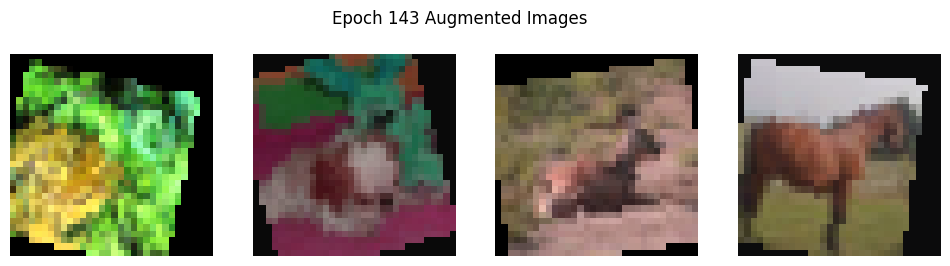

Epoch 144/199, Loss: 0.5189, Train Acc: 0.8205, Val Acc: 0.8356


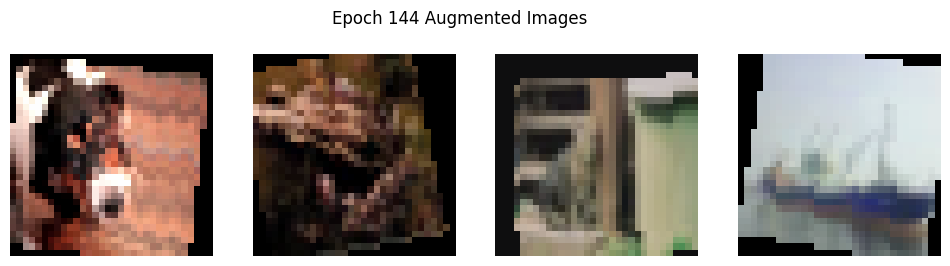

Epoch 145/199, Loss: 0.5145, Train Acc: 0.8214, Val Acc: 0.8356


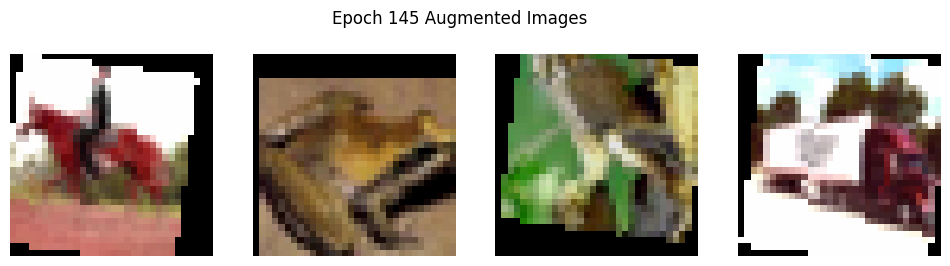

Epoch 146/199, Loss: 0.5163, Train Acc: 0.8223, Val Acc: 0.8356


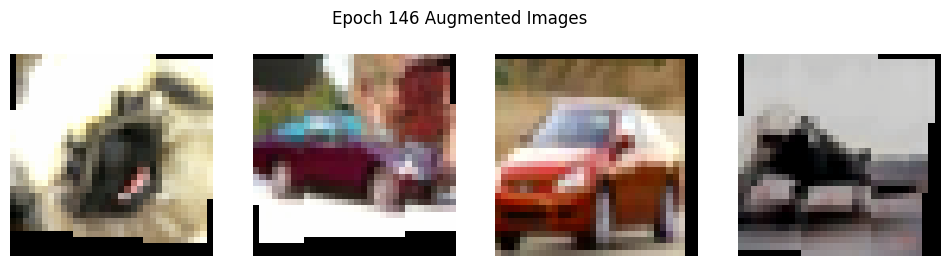

Epoch 147/199, Loss: 0.5201, Train Acc: 0.8192, Val Acc: 0.8356


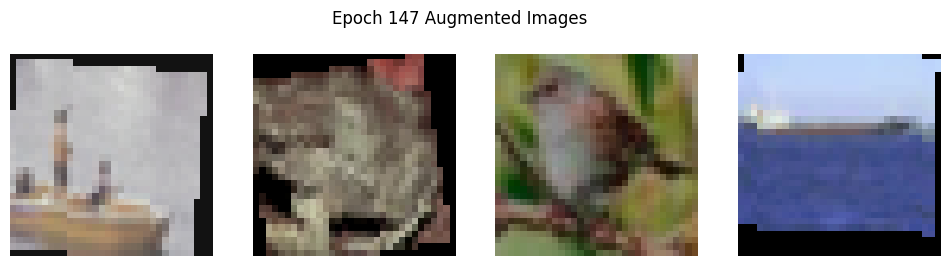

Epoch 148/199, Loss: 0.5191, Train Acc: 0.8216, Val Acc: 0.8356


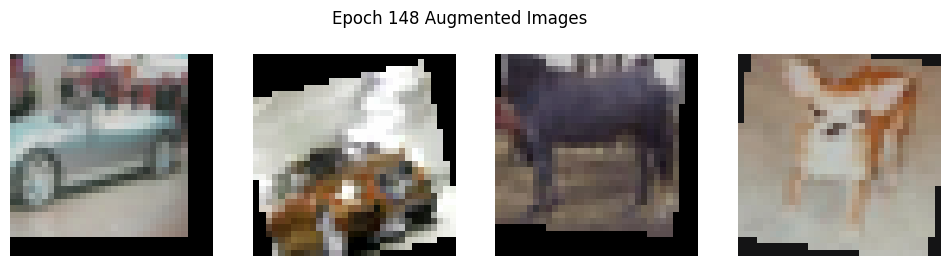

Epoch 149/199, Loss: 0.5160, Train Acc: 0.8201, Val Acc: 0.8356


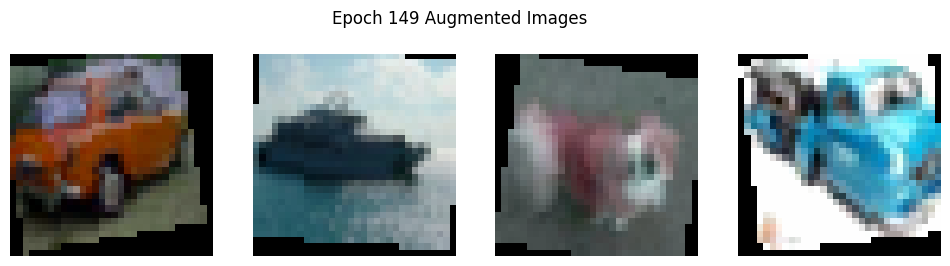

Epoch 150/199, Loss: 0.5134, Train Acc: 0.8233, Val Acc: 0.8356


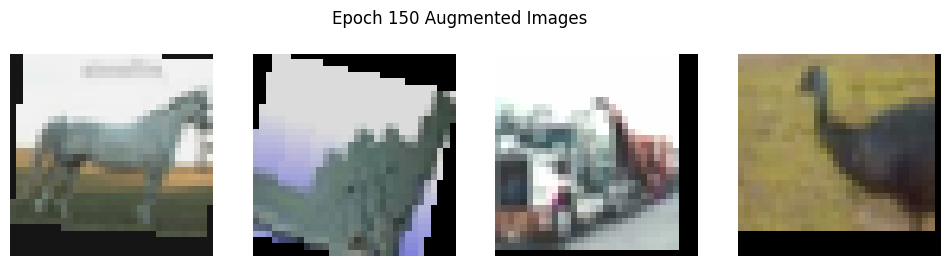

Epoch 151/199, Loss: 0.5173, Train Acc: 0.8231, Val Acc: 0.8356


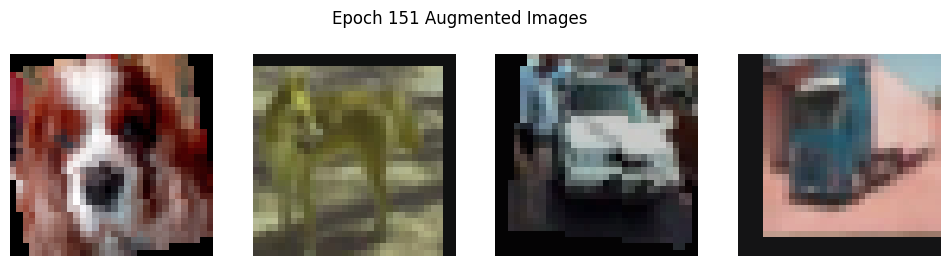

Epoch 152/199, Loss: 0.5132, Train Acc: 0.8233, Val Acc: 0.8356


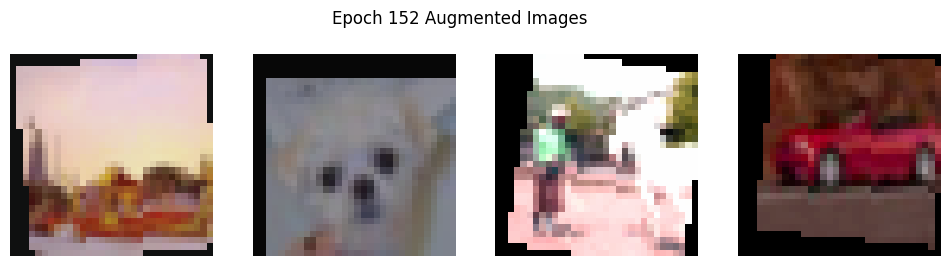

Epoch 153/199, Loss: 0.5177, Train Acc: 0.8217, Val Acc: 0.8356


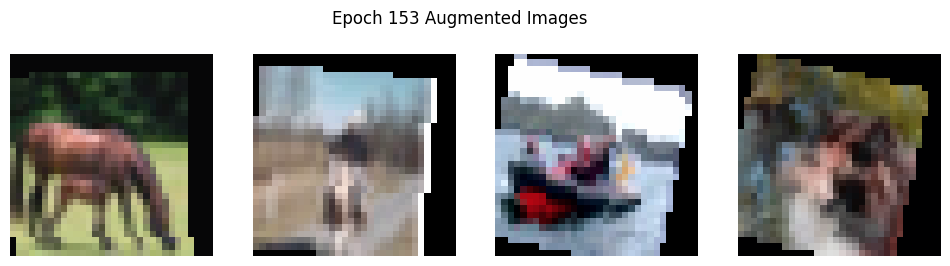

Epoch 154/199, Loss: 0.5158, Train Acc: 0.8215, Val Acc: 0.8356


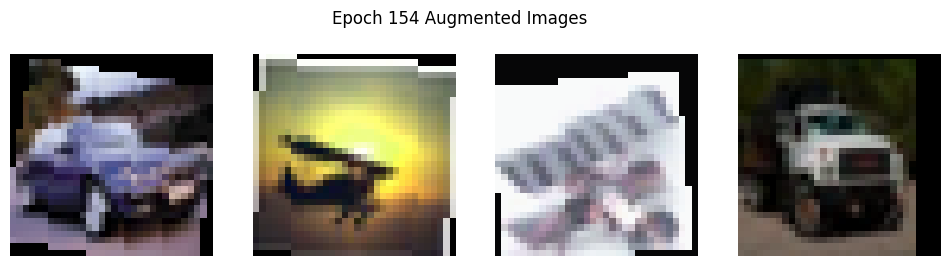

Epoch 155/199, Loss: 0.5121, Train Acc: 0.8225, Val Acc: 0.8356


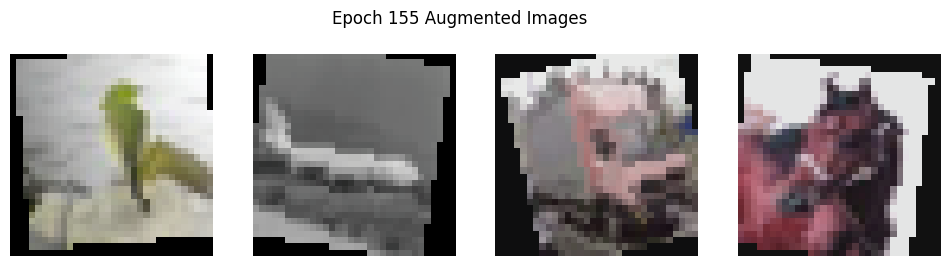

Epoch 156/199, Loss: 0.5137, Train Acc: 0.8207, Val Acc: 0.8356


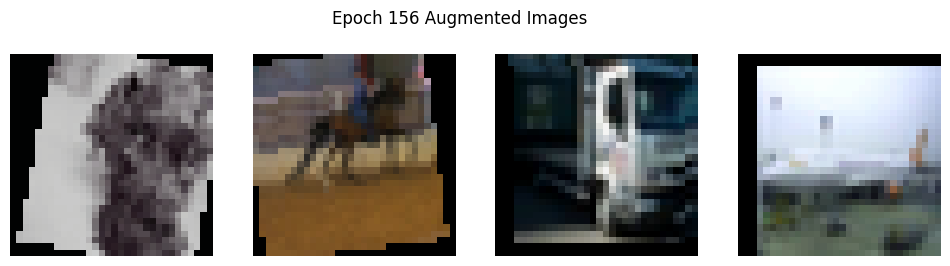

Epoch 157/199, Loss: 0.5159, Train Acc: 0.8209, Val Acc: 0.8355


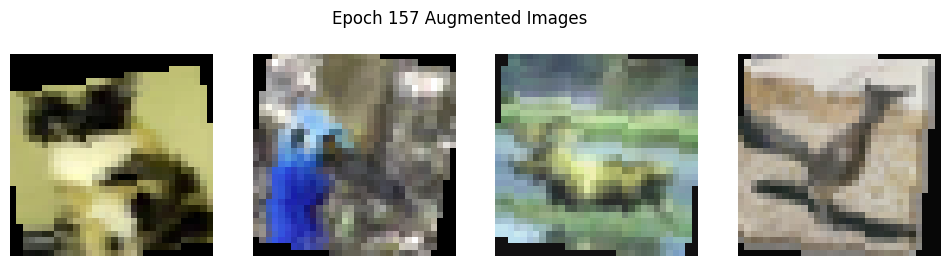

Epoch 158/199, Loss: 0.5135, Train Acc: 0.8244, Val Acc: 0.8355


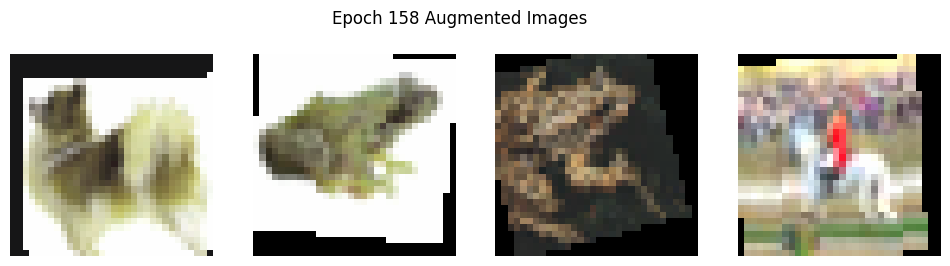

Epoch 159/199, Loss: 0.5151, Train Acc: 0.8210, Val Acc: 0.8355


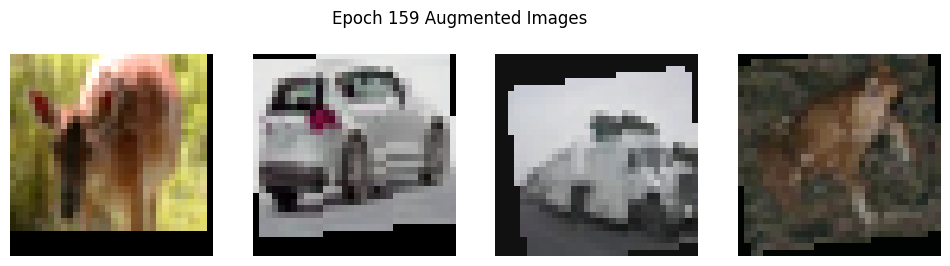

Epoch 160/199, Loss: 0.5172, Train Acc: 0.8226, Val Acc: 0.8355


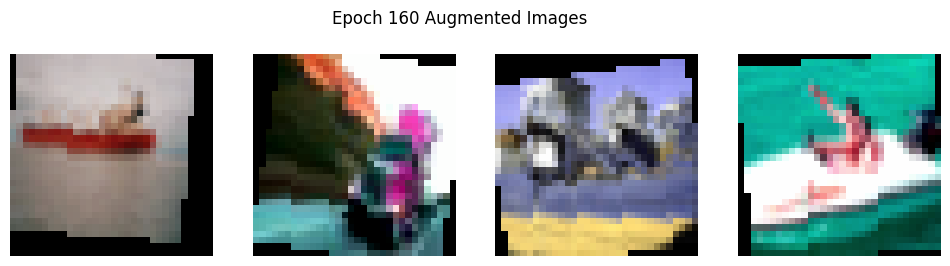

Epoch 161/199, Loss: 0.5155, Train Acc: 0.8222, Val Acc: 0.8355


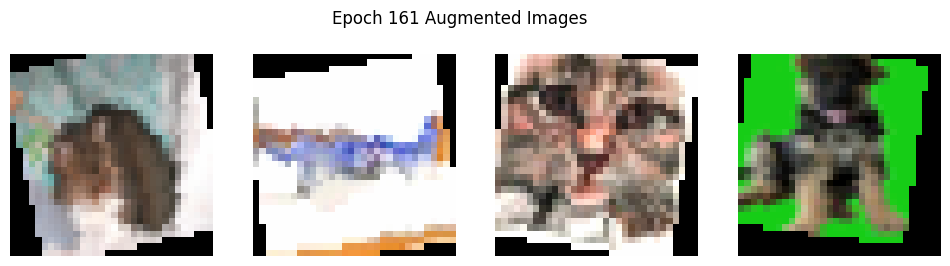

Epoch 162/199, Loss: 0.5162, Train Acc: 0.8230, Val Acc: 0.8355


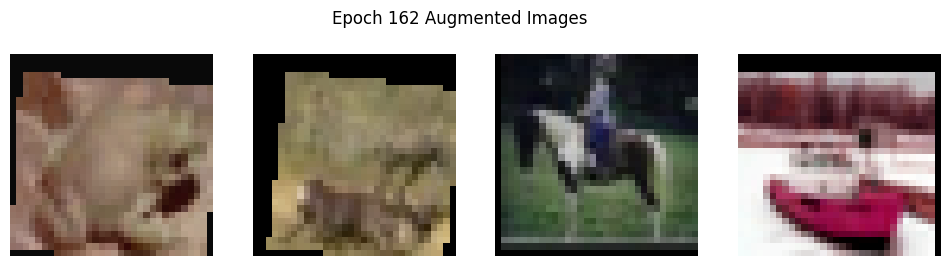

Epoch 163/199, Loss: 0.5184, Train Acc: 0.8206, Val Acc: 0.8355


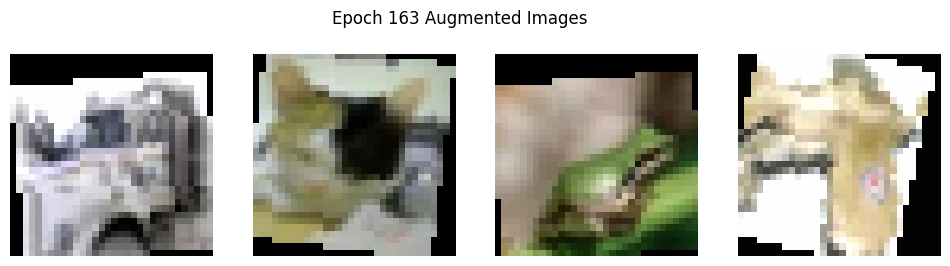

Epoch 164/199, Loss: 0.5116, Train Acc: 0.8234, Val Acc: 0.8355


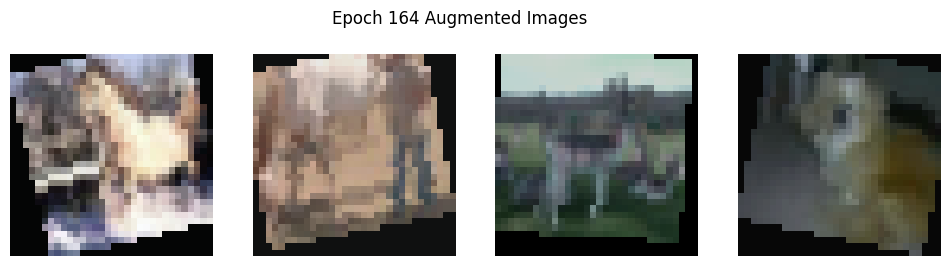

Epoch 165/199, Loss: 0.5131, Train Acc: 0.8227, Val Acc: 0.8355


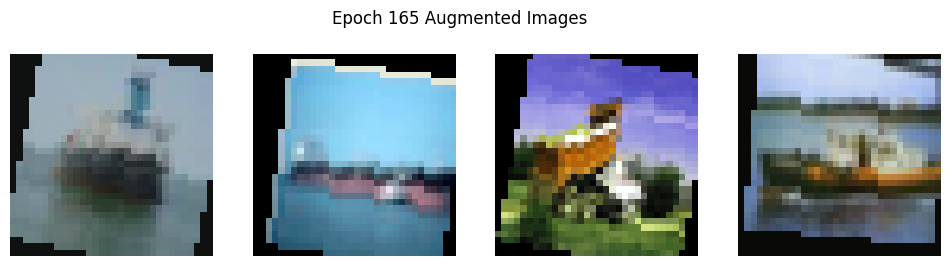

Epoch 166/199, Loss: 0.5150, Train Acc: 0.8198, Val Acc: 0.8355


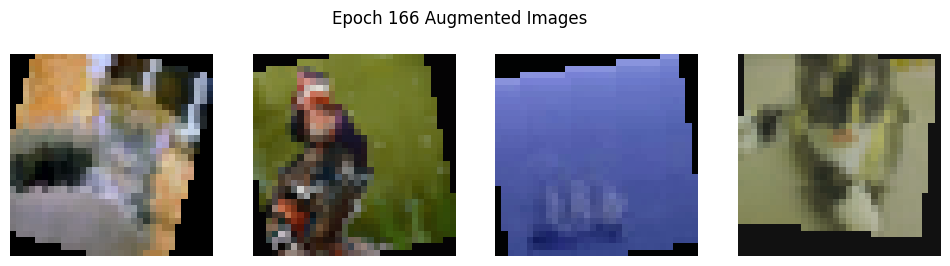

Epoch 167/199, Loss: 0.5199, Train Acc: 0.8189, Val Acc: 0.8355


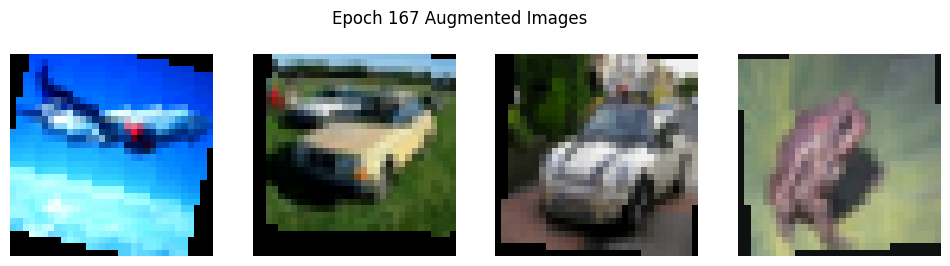

Epoch 168/199, Loss: 0.5138, Train Acc: 0.8208, Val Acc: 0.8355


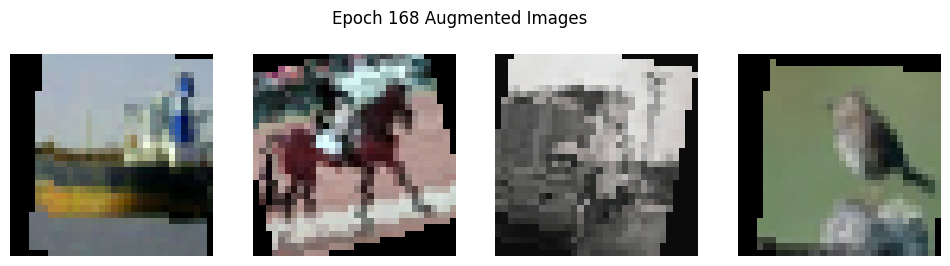

Epoch 169/199, Loss: 0.5195, Train Acc: 0.8223, Val Acc: 0.8355


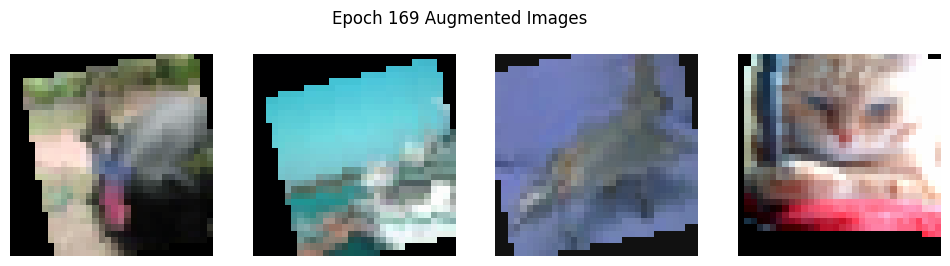

Epoch 170/199, Loss: 0.5171, Train Acc: 0.8214, Val Acc: 0.8355


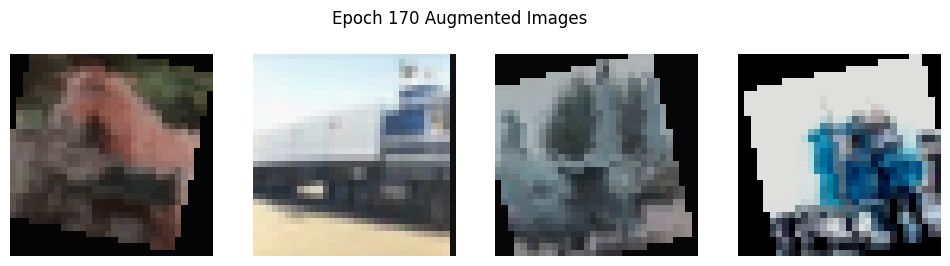

Epoch 171/199, Loss: 0.5201, Train Acc: 0.8207, Val Acc: 0.8355


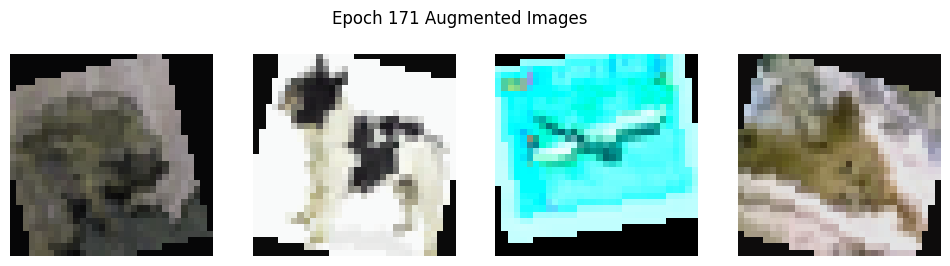

Epoch 172/199, Loss: 0.5198, Train Acc: 0.8204, Val Acc: 0.8355


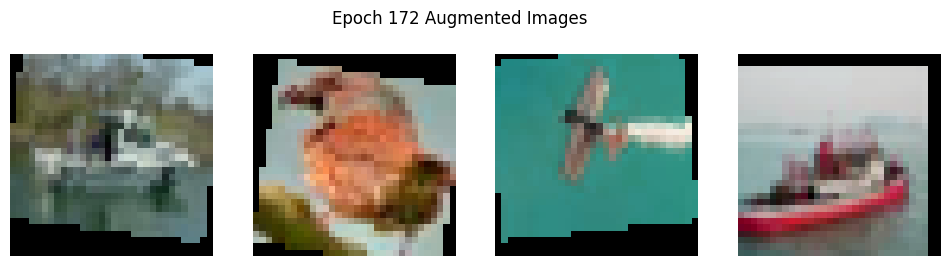

Epoch 173/199, Loss: 0.5157, Train Acc: 0.8216, Val Acc: 0.8355


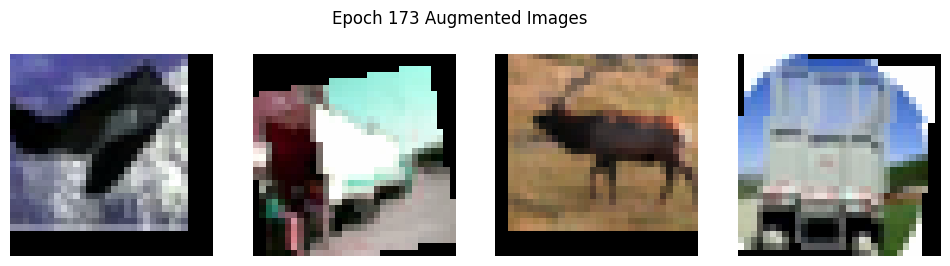

Epoch 174/199, Loss: 0.5183, Train Acc: 0.8196, Val Acc: 0.8355


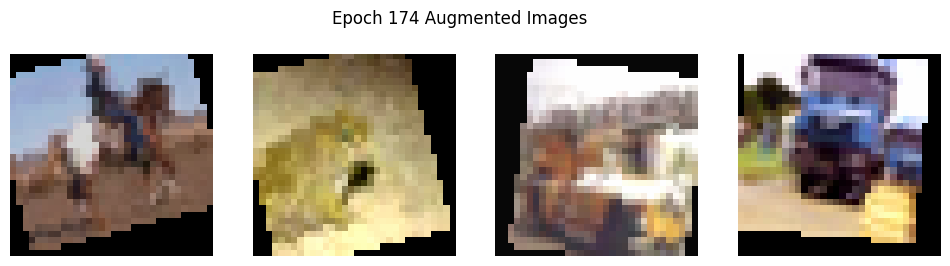

Epoch 175/199, Loss: 0.5163, Train Acc: 0.8202, Val Acc: 0.8355


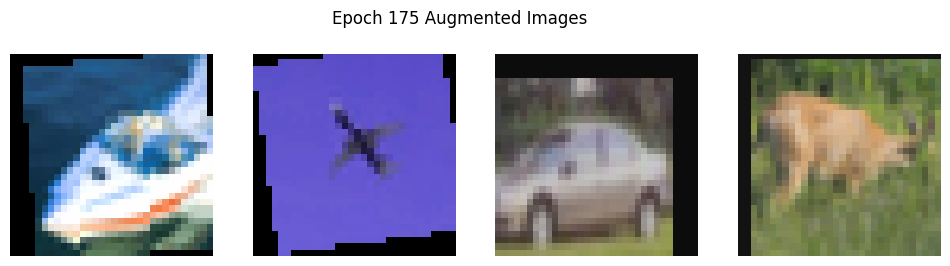

Epoch 176/199, Loss: 0.5158, Train Acc: 0.8215, Val Acc: 0.8355


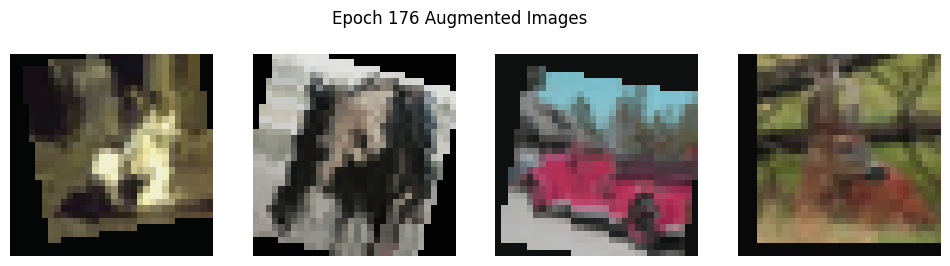

Epoch 177/199, Loss: 0.5151, Train Acc: 0.8222, Val Acc: 0.8355


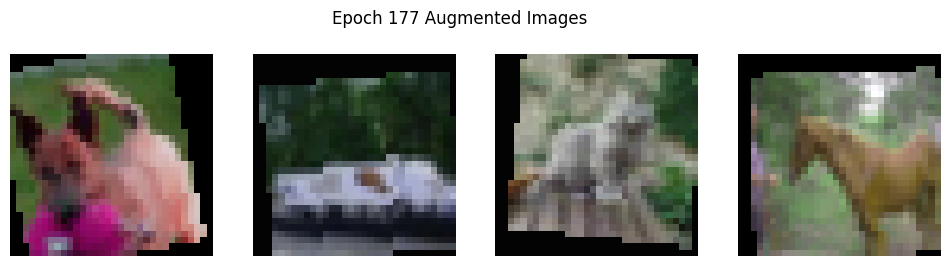

Epoch 178/199, Loss: 0.5180, Train Acc: 0.8196, Val Acc: 0.8355


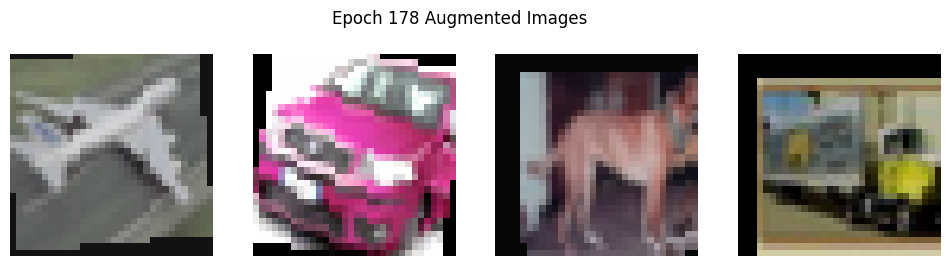

Epoch 179/199, Loss: 0.5195, Train Acc: 0.8200, Val Acc: 0.8355


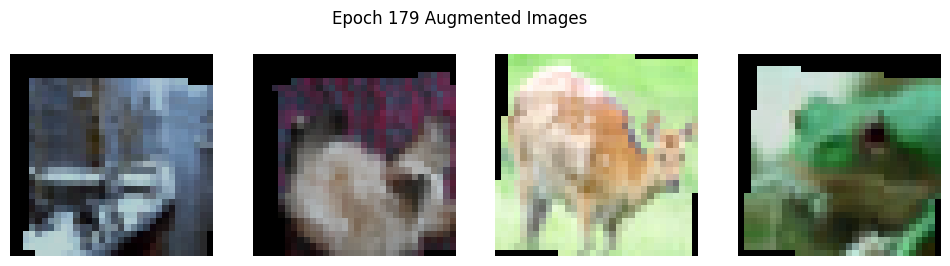

Epoch 180/199, Loss: 0.5156, Train Acc: 0.8214, Val Acc: 0.8355


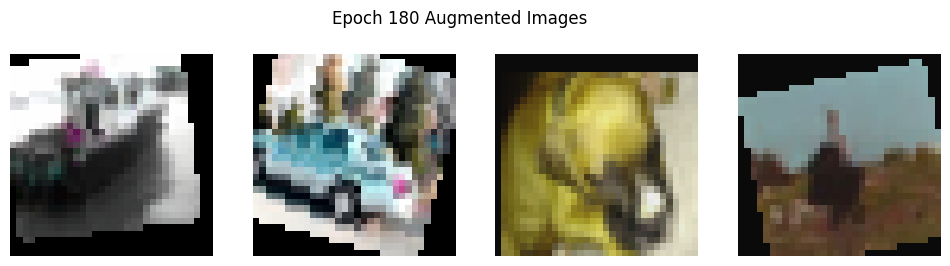

Epoch 181/199, Loss: 0.5134, Train Acc: 0.8209, Val Acc: 0.8355


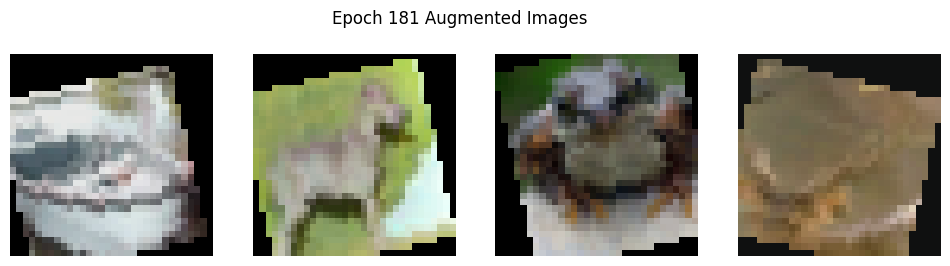

Epoch 182/199, Loss: 0.5163, Train Acc: 0.8216, Val Acc: 0.8355


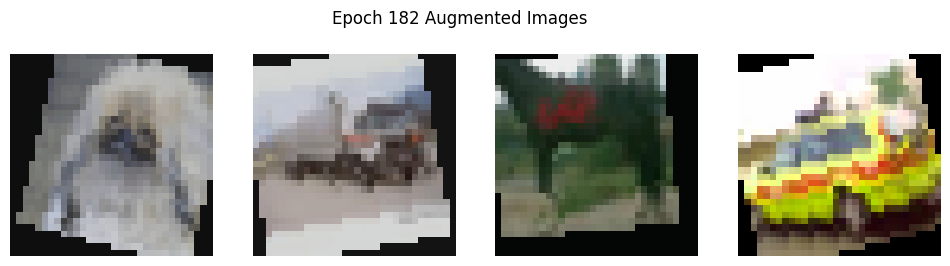

Epoch 183/199, Loss: 0.5174, Train Acc: 0.8211, Val Acc: 0.8355


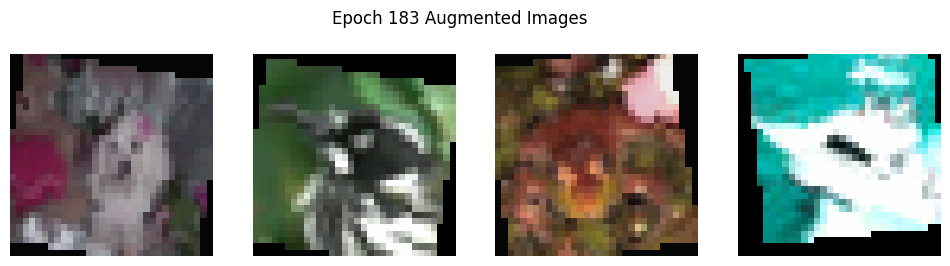

Epoch 184/199, Loss: 0.5235, Train Acc: 0.8195, Val Acc: 0.8355


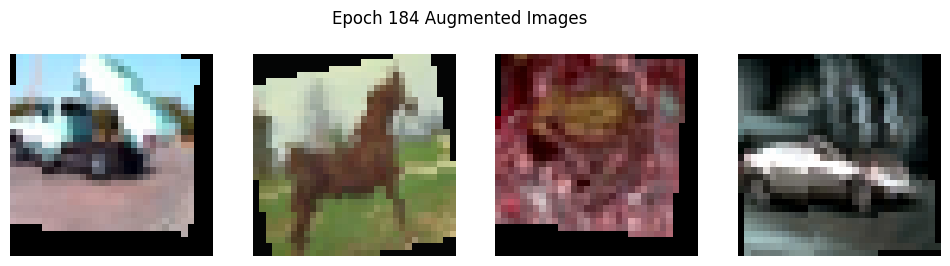

Epoch 185/199, Loss: 0.5100, Train Acc: 0.8225, Val Acc: 0.8355


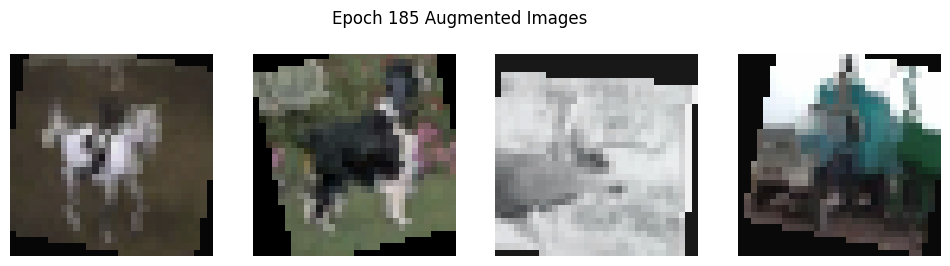

Epoch 186/199, Loss: 0.5130, Train Acc: 0.8224, Val Acc: 0.8355


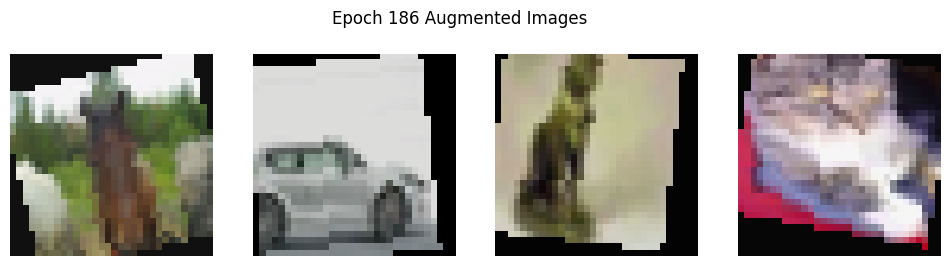

Epoch 187/199, Loss: 0.5099, Train Acc: 0.8243, Val Acc: 0.8354


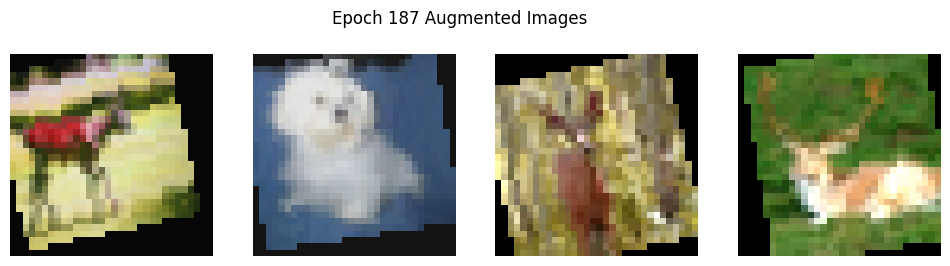

Epoch 188/199, Loss: 0.5192, Train Acc: 0.8198, Val Acc: 0.8354


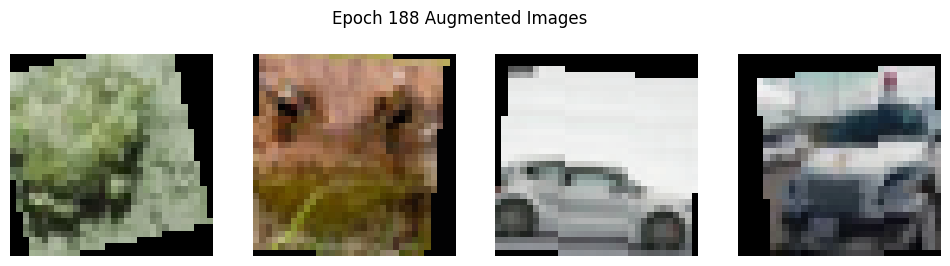

Epoch 189/199, Loss: 0.5136, Train Acc: 0.8229, Val Acc: 0.8354


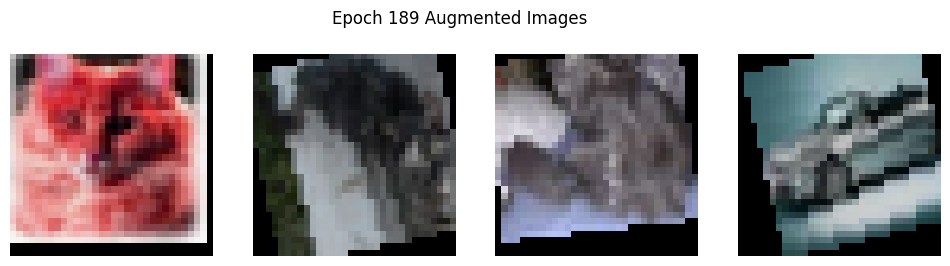

Epoch 190/199, Loss: 0.5167, Train Acc: 0.8214, Val Acc: 0.8354


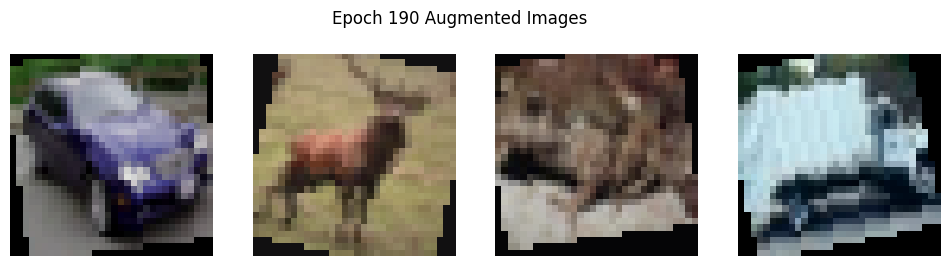

Epoch 191/199, Loss: 0.5158, Train Acc: 0.8209, Val Acc: 0.8353


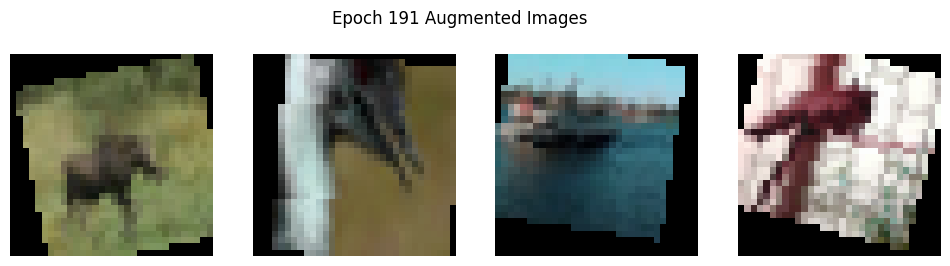

Epoch 192/199, Loss: 0.5184, Train Acc: 0.8225, Val Acc: 0.8353


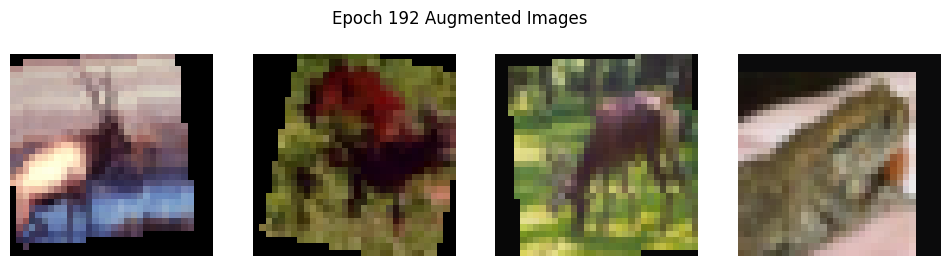

Epoch 193/199, Loss: 0.5167, Train Acc: 0.8224, Val Acc: 0.8354


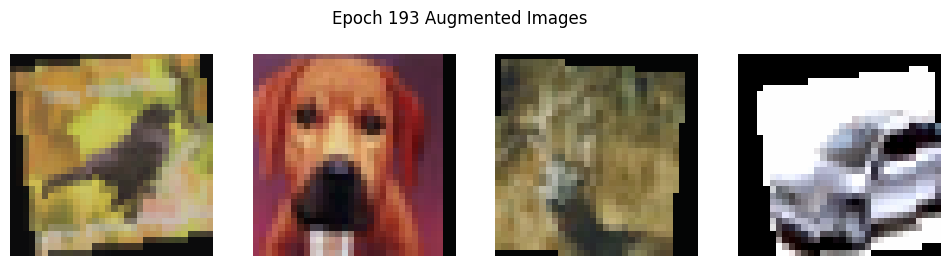

Epoch 194/199, Loss: 0.5166, Train Acc: 0.8220, Val Acc: 0.8354


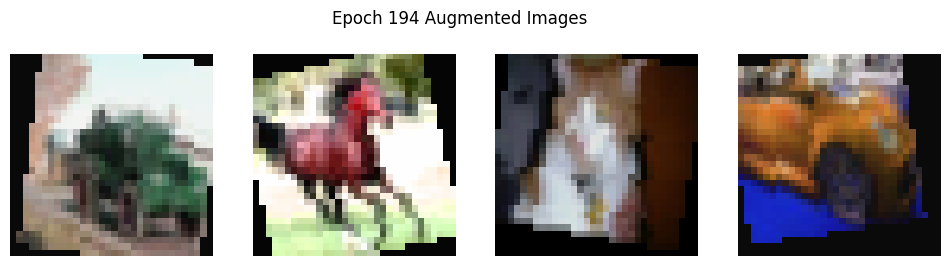

Epoch 195/199, Loss: 0.5134, Train Acc: 0.8199, Val Acc: 0.8354


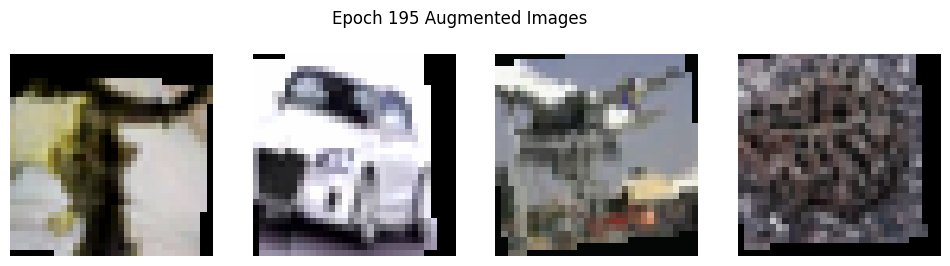

Epoch 196/199, Loss: 0.5151, Train Acc: 0.8224, Val Acc: 0.8354


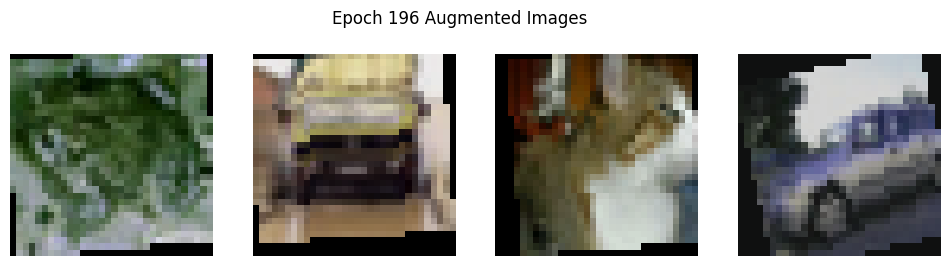

Epoch 197/199, Loss: 0.5128, Train Acc: 0.8220, Val Acc: 0.8354


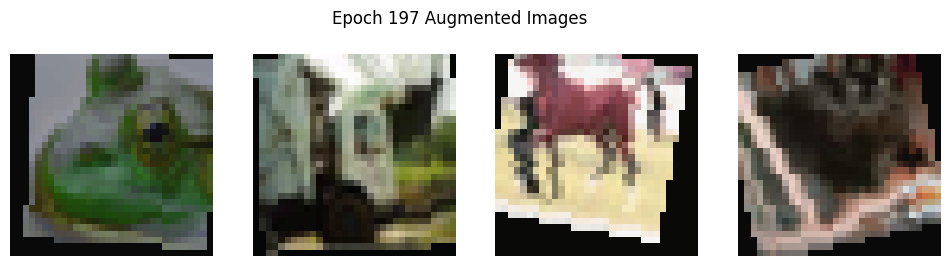

Epoch 198/199, Loss: 0.5158, Train Acc: 0.8203, Val Acc: 0.8354


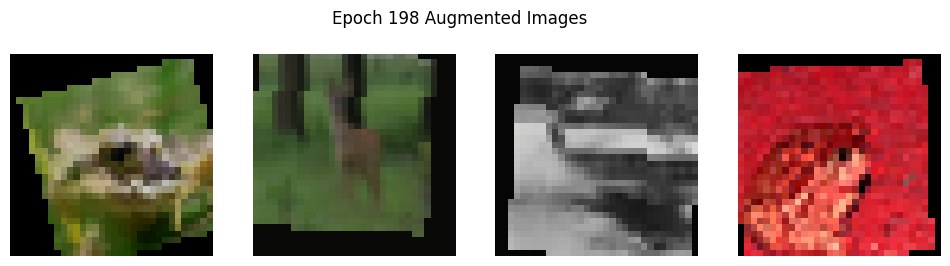

Epoch 199/199, Loss: 0.5153, Train Acc: 0.8209, Val Acc: 0.8353


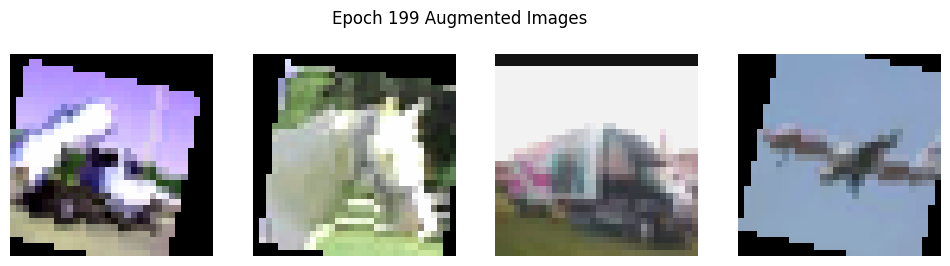

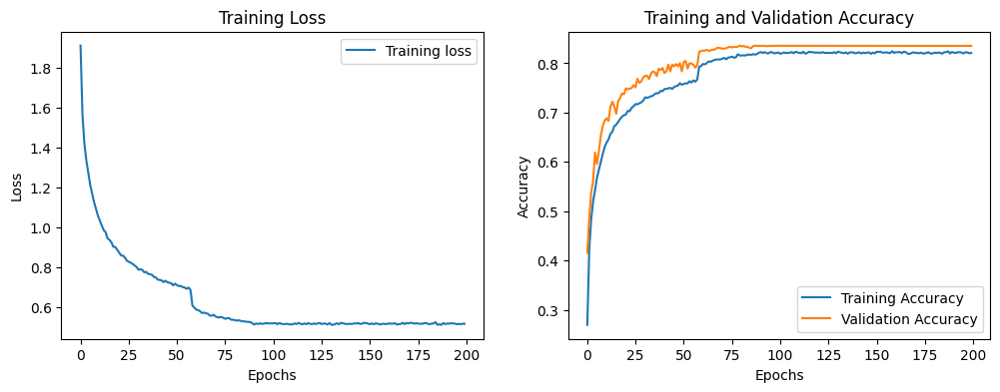

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

mean = (0.4914, 0.4822, 0.4465)
std = (0.2023, 0.1994, 0.2010)

# Training data augmentation
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

# Validation data augmentation
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])



def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        # Validation phase
        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model

if __name__ == '__main__':
    dataset = 'CIFAR10'
    batch_size = 128
    num_epochs = 200
    learning_rate = 0.001

    train_loader, test_loader, num_classes = get_dataloaders(dataset, batch_size)

    model = AlexNet(num_classes=num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=5, verbose=True)

    trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs, device='cuda')


###Second Part:

100%|██████████| 170498071/170498071 [00:03<00:00, 49198826.86it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
Epoch 0/199, Loss: 1.7347, Train Acc: 0.3389, Val Acc: 0.4867


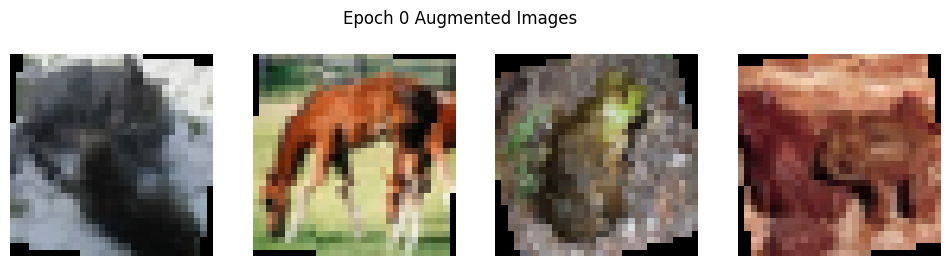

Epoch 1/199, Loss: 1.3372, Train Acc: 0.5105, Val Acc: 0.5805


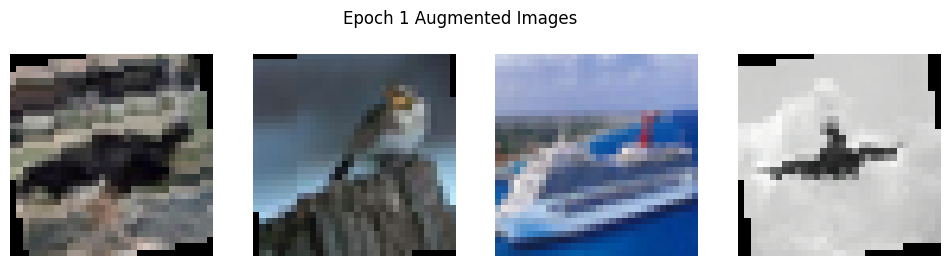

Epoch 2/199, Loss: 1.1687, Train Acc: 0.5804, Val Acc: 0.6393


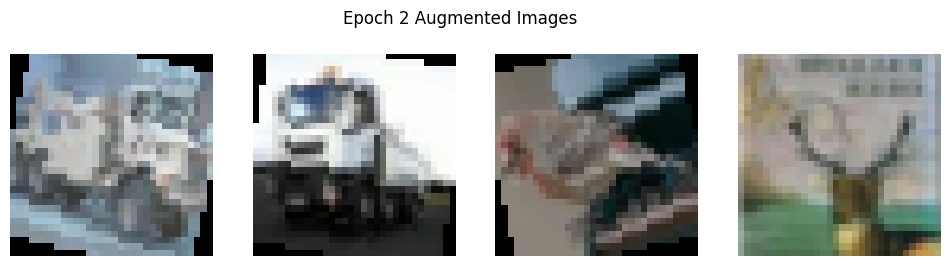

Epoch 3/199, Loss: 1.0556, Train Acc: 0.6244, Val Acc: 0.6556


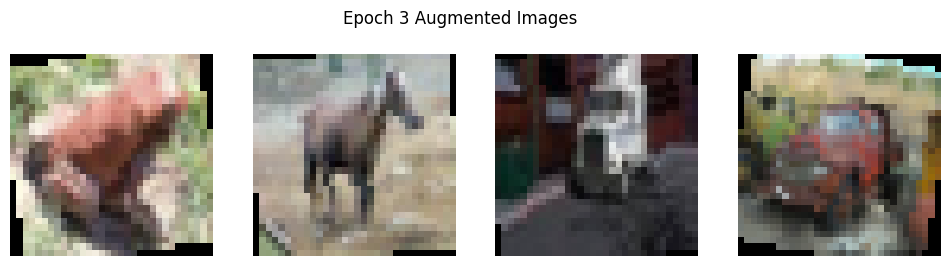

Epoch 4/199, Loss: 0.9854, Train Acc: 0.6532, Val Acc: 0.6983


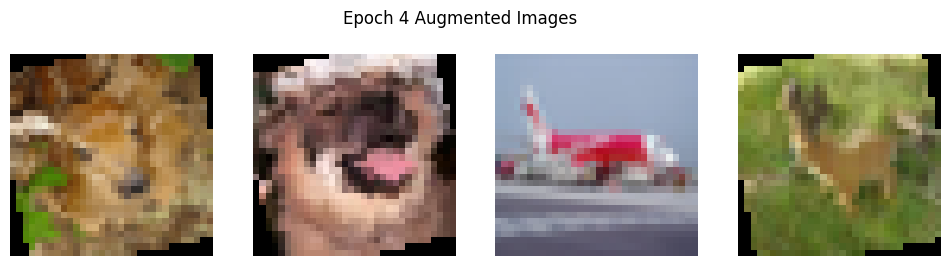

Epoch 5/199, Loss: 0.9140, Train Acc: 0.6798, Val Acc: 0.7139


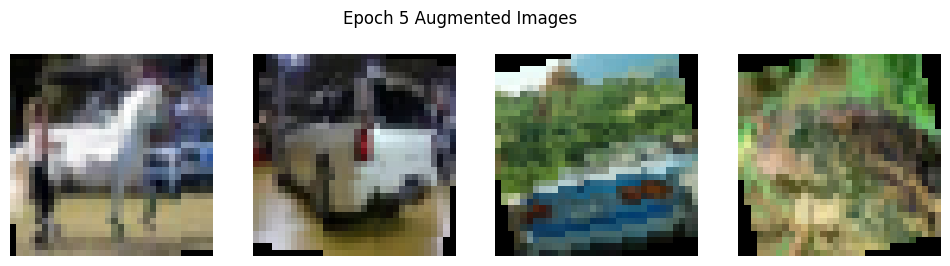

Epoch 6/199, Loss: 0.8583, Train Acc: 0.6991, Val Acc: 0.7269


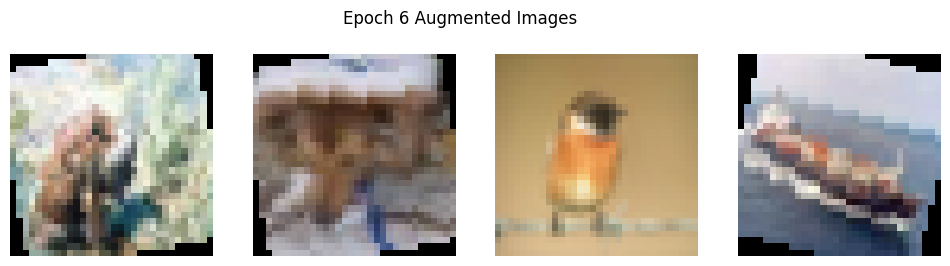

Epoch 7/199, Loss: 0.8266, Train Acc: 0.7128, Val Acc: 0.7347


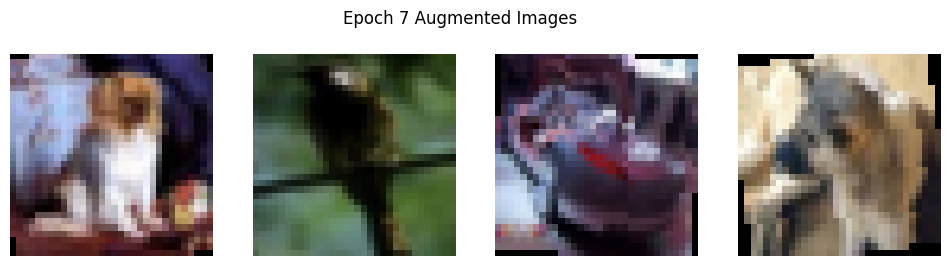

Epoch 8/199, Loss: 0.7837, Train Acc: 0.7264, Val Acc: 0.7472


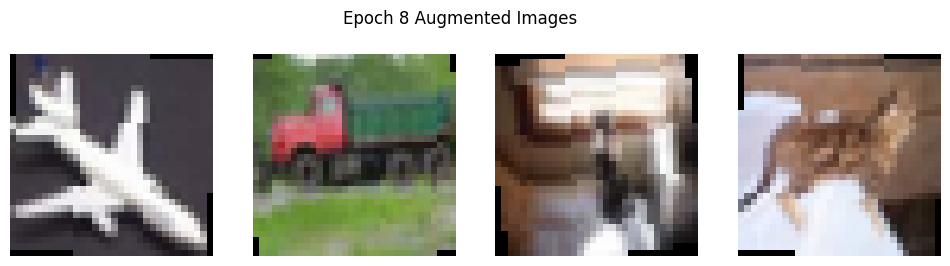

Epoch 9/199, Loss: 0.7576, Train Acc: 0.7385, Val Acc: 0.7497


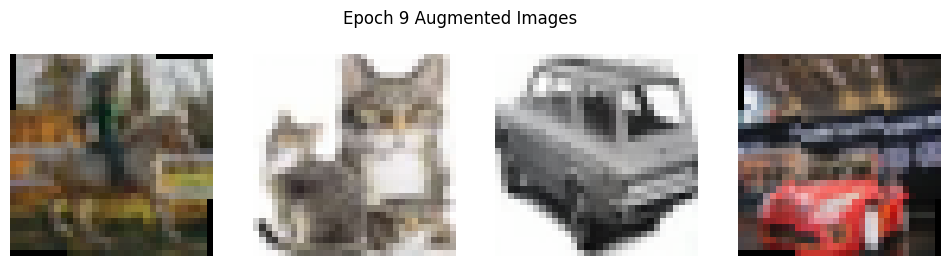

Epoch 10/199, Loss: 0.7392, Train Acc: 0.7443, Val Acc: 0.7620


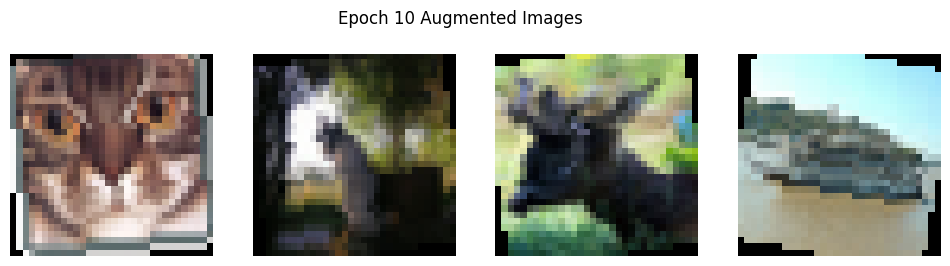

Epoch 11/199, Loss: 0.7140, Train Acc: 0.7508, Val Acc: 0.7686


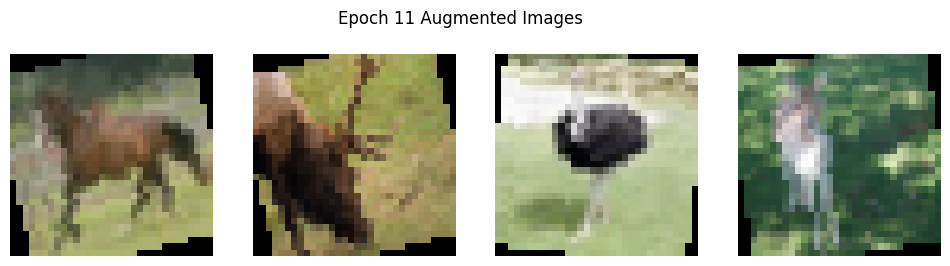

Epoch 12/199, Loss: 0.6973, Train Acc: 0.7588, Val Acc: 0.7664


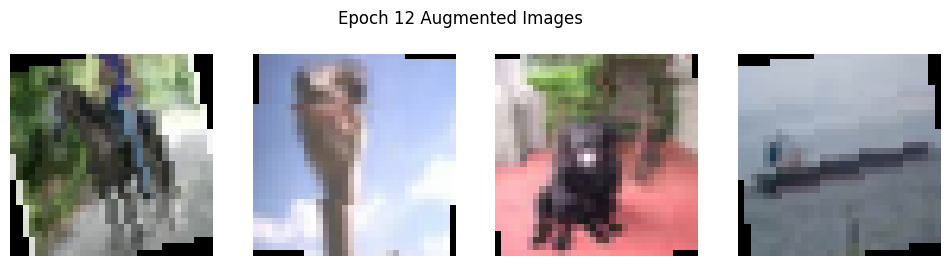

Epoch 13/199, Loss: 0.6808, Train Acc: 0.7647, Val Acc: 0.7688


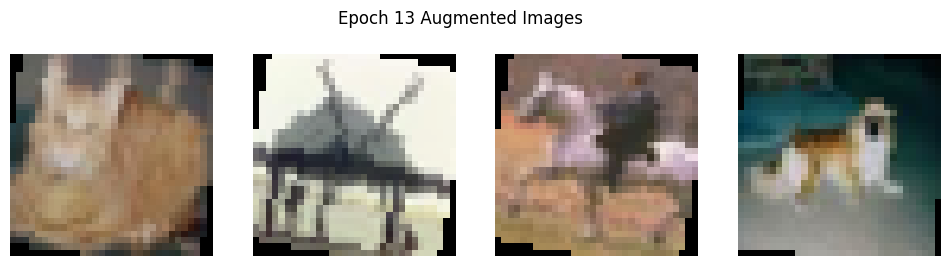

Epoch 14/199, Loss: 0.6593, Train Acc: 0.7738, Val Acc: 0.7673


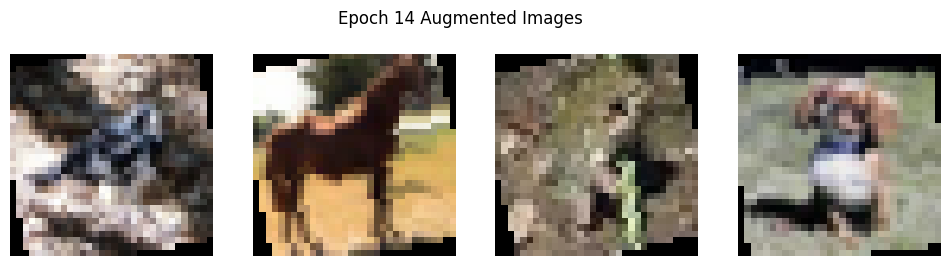

Epoch 15/199, Loss: 0.6481, Train Acc: 0.7771, Val Acc: 0.7827


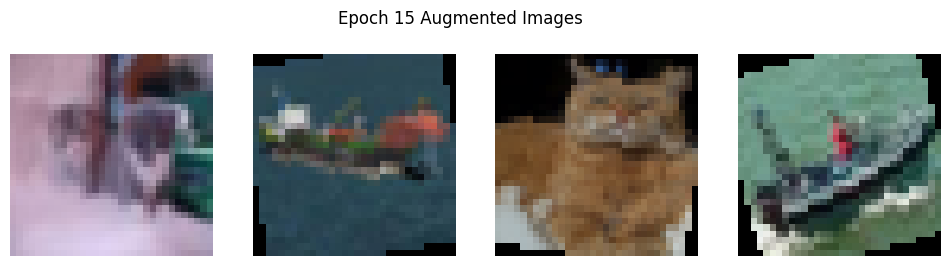

Epoch 16/199, Loss: 0.6379, Train Acc: 0.7794, Val Acc: 0.7749


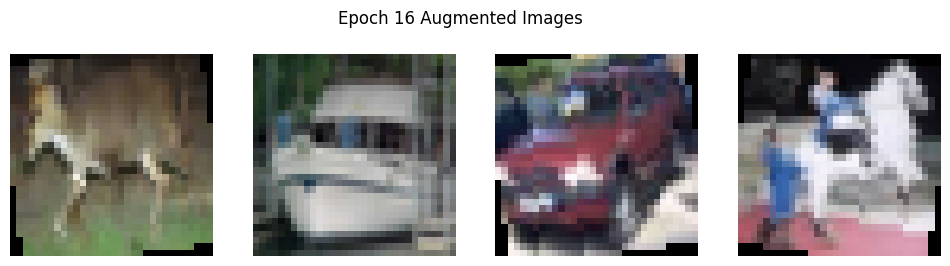

Epoch 17/199, Loss: 0.6221, Train Acc: 0.7846, Val Acc: 0.7882


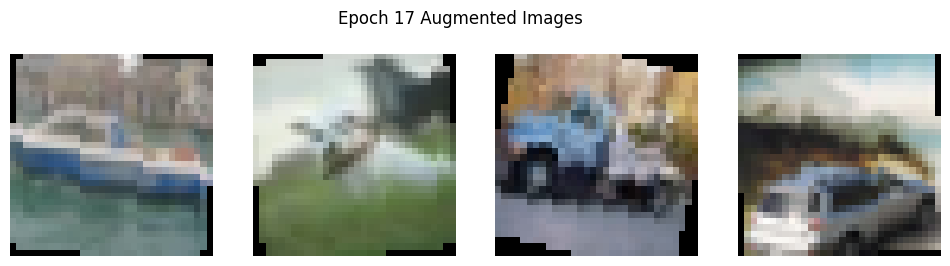

Epoch 18/199, Loss: 0.6167, Train Acc: 0.7867, Val Acc: 0.7872


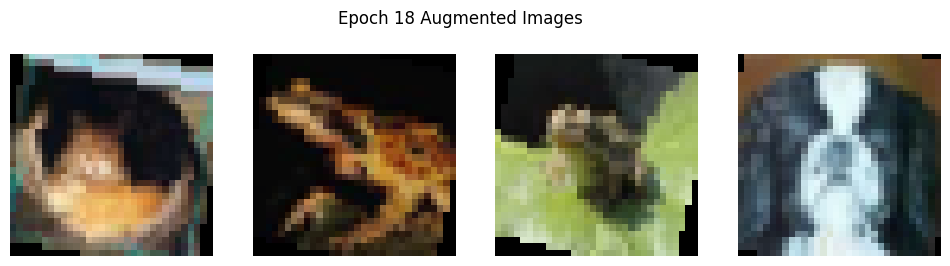

Epoch 19/199, Loss: 0.5965, Train Acc: 0.7923, Val Acc: 0.7815


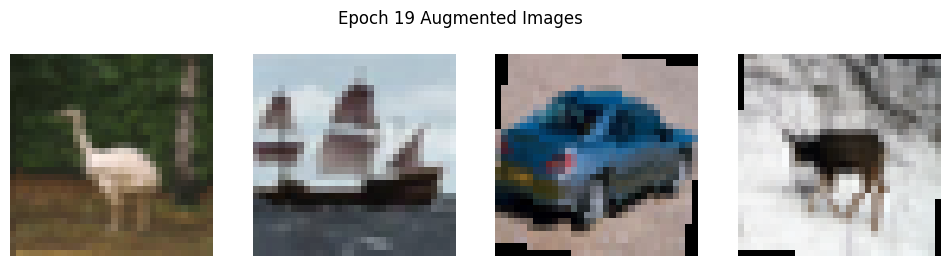

Epoch 20/199, Loss: 0.5948, Train Acc: 0.7931, Val Acc: 0.8012


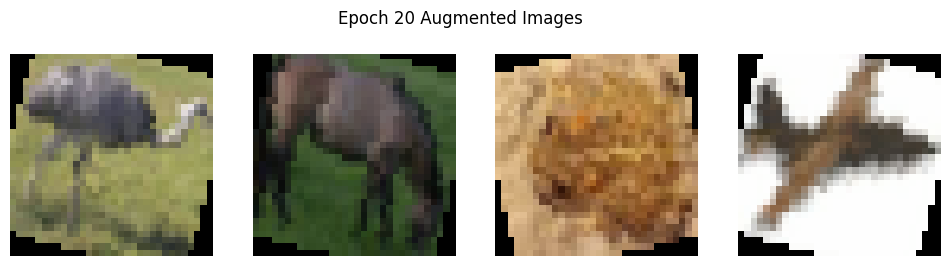

Epoch 21/199, Loss: 0.5809, Train Acc: 0.7987, Val Acc: 0.7970


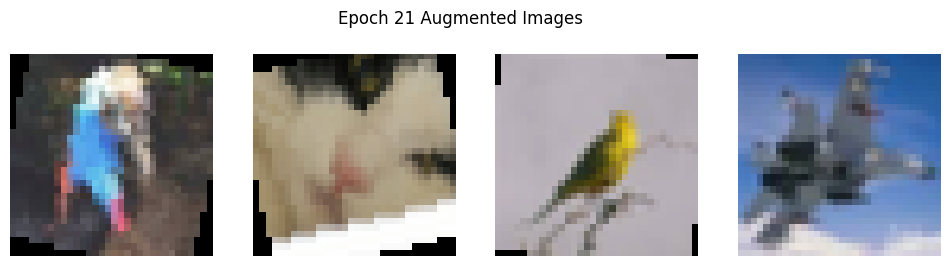

Epoch 22/199, Loss: 0.5648, Train Acc: 0.8048, Val Acc: 0.7872


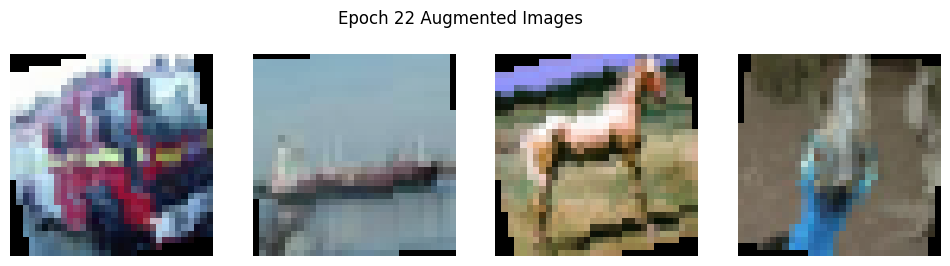

Epoch 23/199, Loss: 0.5617, Train Acc: 0.8050, Val Acc: 0.7965


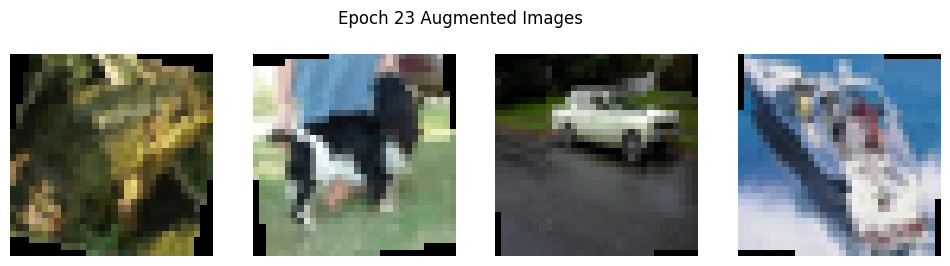

Epoch 24/199, Loss: 0.5599, Train Acc: 0.8066, Val Acc: 0.7907


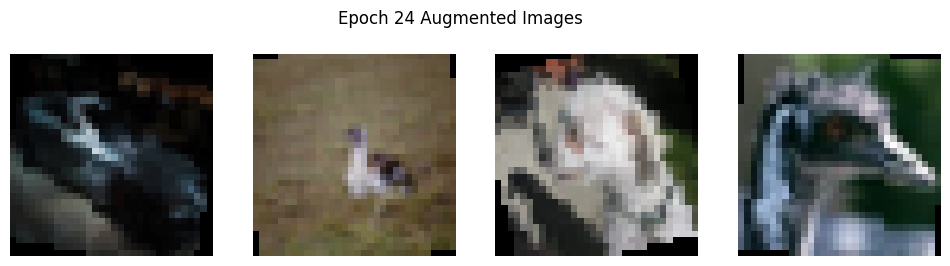

Epoch 25/199, Loss: 0.5565, Train Acc: 0.8086, Val Acc: 0.7936


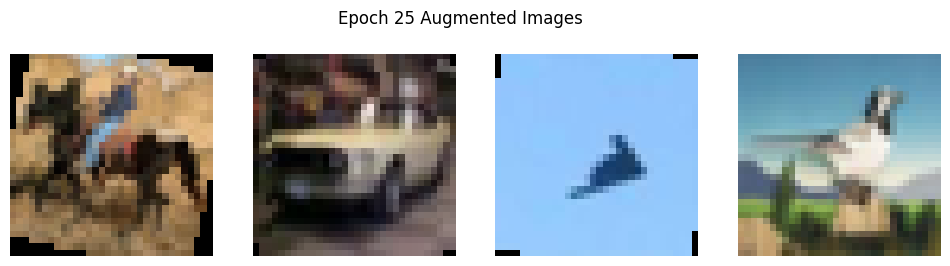

Epoch 26/199, Loss: 0.5450, Train Acc: 0.8120, Val Acc: 0.8003
Epoch 00027: reducing learning rate of group 0 to 1.0000e-04.


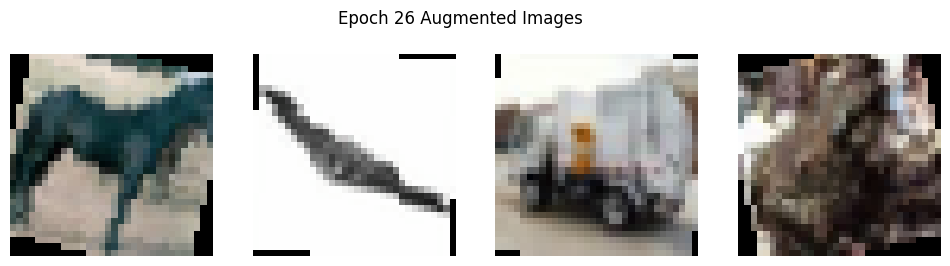

Epoch 27/199, Loss: 0.4566, Train Acc: 0.8414, Val Acc: 0.8179


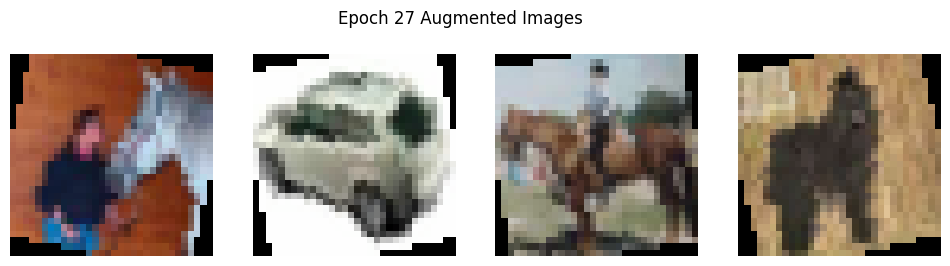

Epoch 28/199, Loss: 0.4246, Train Acc: 0.8516, Val Acc: 0.8208


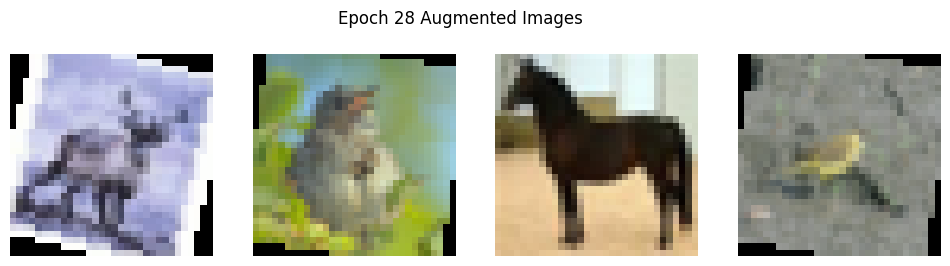

Epoch 29/199, Loss: 0.4115, Train Acc: 0.8561, Val Acc: 0.8207


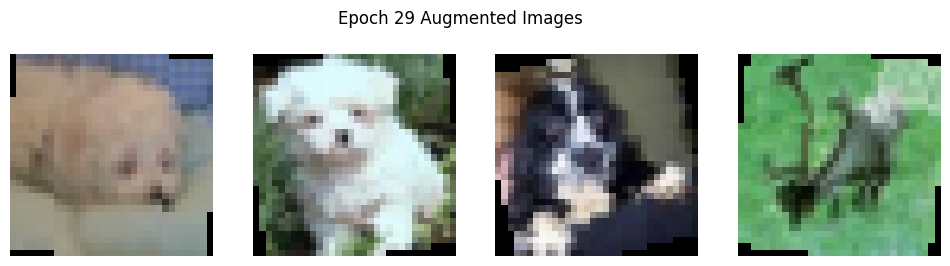

Epoch 30/199, Loss: 0.4006, Train Acc: 0.8576, Val Acc: 0.8233


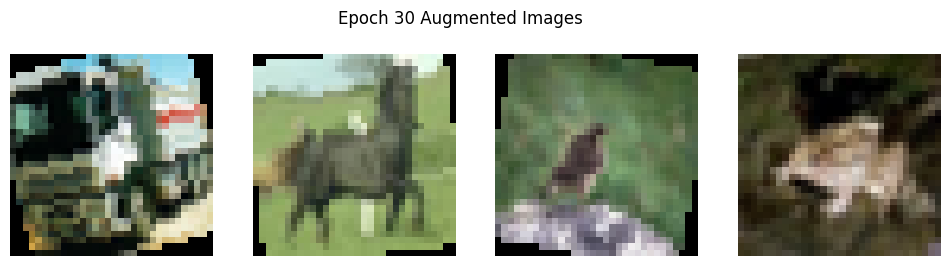

Epoch 31/199, Loss: 0.3970, Train Acc: 0.8609, Val Acc: 0.8234


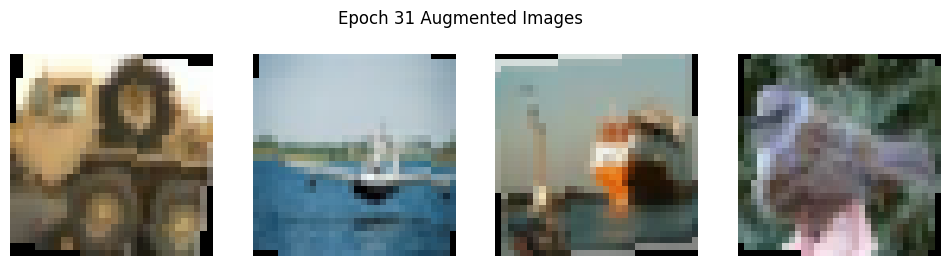

Epoch 32/199, Loss: 0.3857, Train Acc: 0.8644, Val Acc: 0.8246


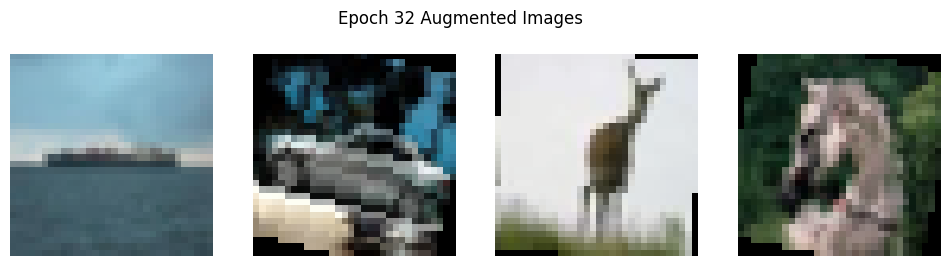

Epoch 33/199, Loss: 0.3852, Train Acc: 0.8639, Val Acc: 0.8243


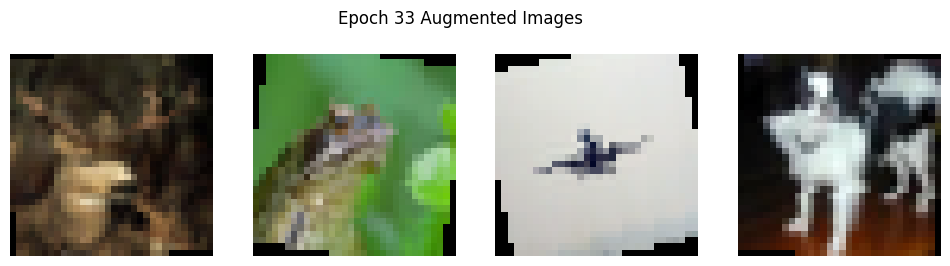

Epoch 34/199, Loss: 0.3747, Train Acc: 0.8685, Val Acc: 0.8247


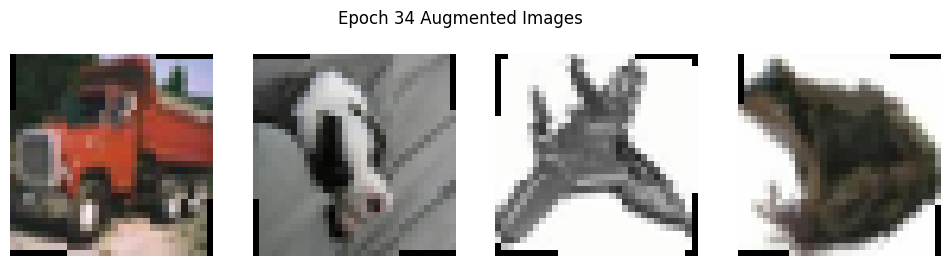

Epoch 35/199, Loss: 0.3732, Train Acc: 0.8672, Val Acc: 0.8272


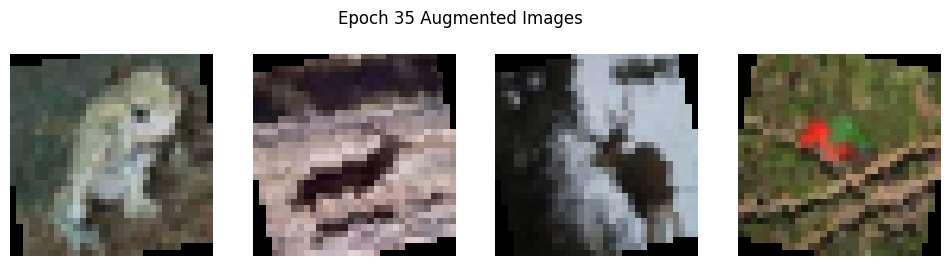

Epoch 36/199, Loss: 0.3676, Train Acc: 0.8696, Val Acc: 0.8268


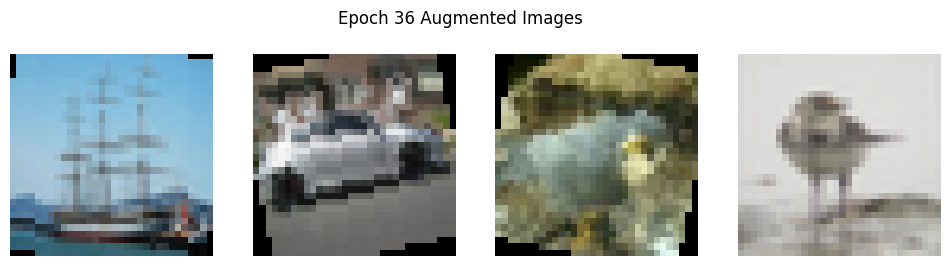

Epoch 37/199, Loss: 0.3631, Train Acc: 0.8718, Val Acc: 0.8275


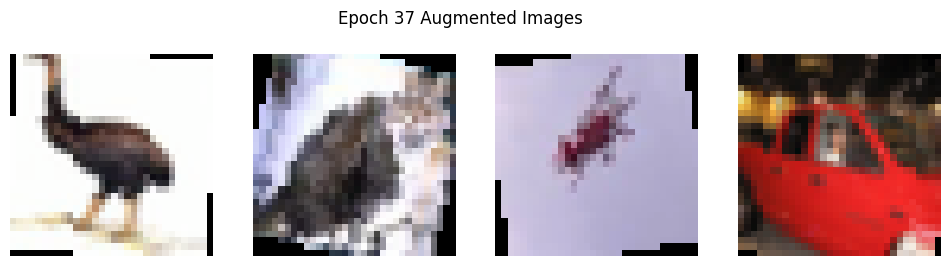

Epoch 38/199, Loss: 0.3561, Train Acc: 0.8747, Val Acc: 0.8253


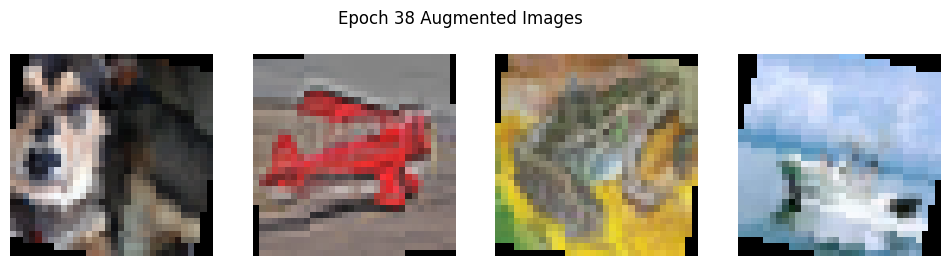

Epoch 39/199, Loss: 0.3574, Train Acc: 0.8735, Val Acc: 0.8277


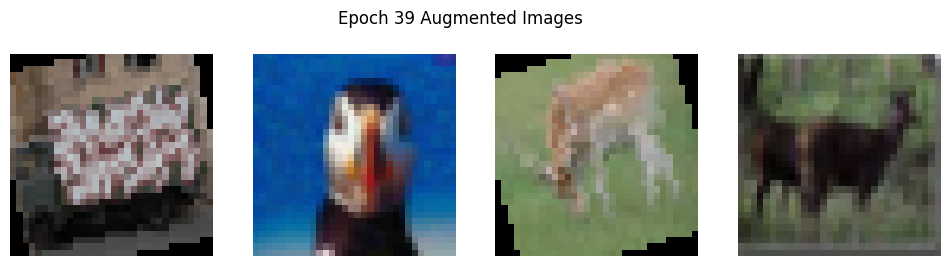

Epoch 40/199, Loss: 0.3521, Train Acc: 0.8752, Val Acc: 0.8270


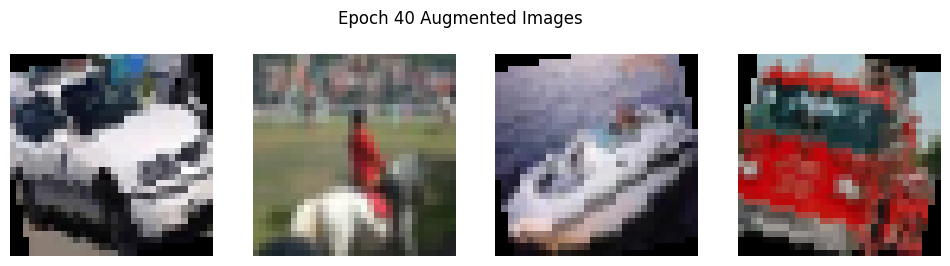

Epoch 41/199, Loss: 0.3518, Train Acc: 0.8745, Val Acc: 0.8279


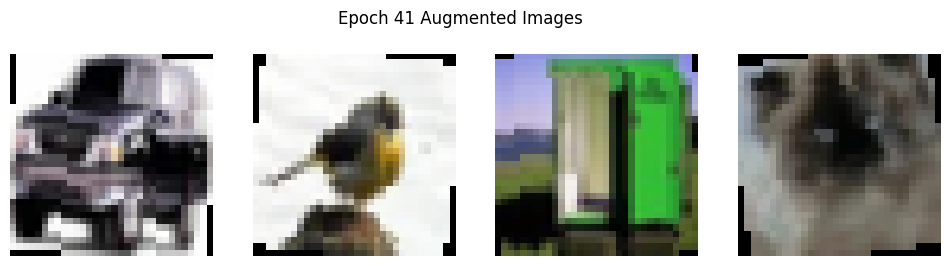

Epoch 42/199, Loss: 0.3402, Train Acc: 0.8803, Val Acc: 0.8274


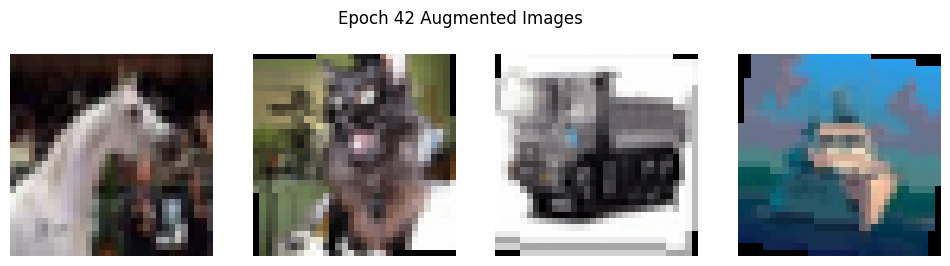

Epoch 43/199, Loss: 0.3423, Train Acc: 0.8787, Val Acc: 0.8270


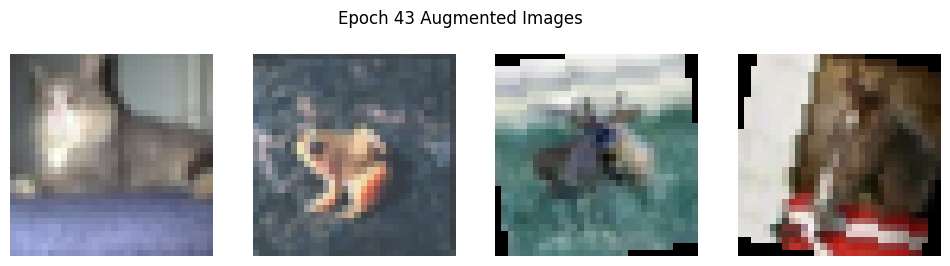

Epoch 44/199, Loss: 0.3378, Train Acc: 0.8795, Val Acc: 0.8279


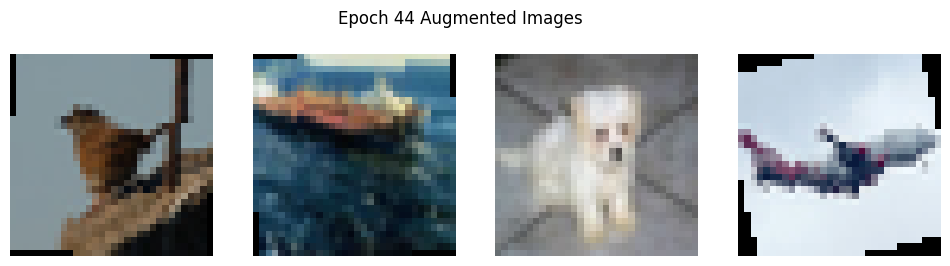

Epoch 45/199, Loss: 0.3378, Train Acc: 0.8805, Val Acc: 0.8305


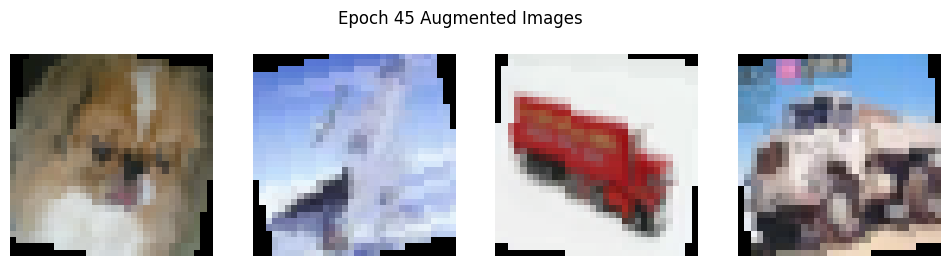

Epoch 46/199, Loss: 0.3329, Train Acc: 0.8804, Val Acc: 0.8308


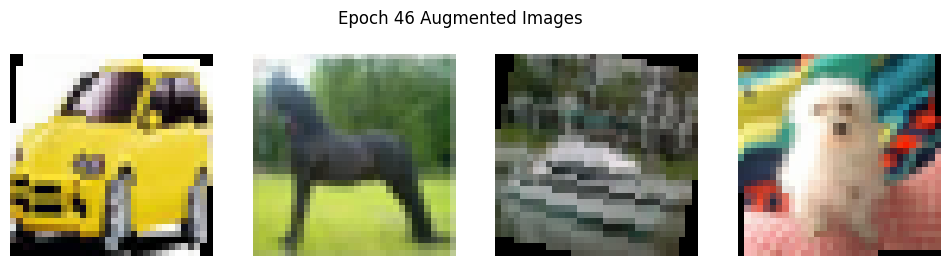

Epoch 47/199, Loss: 0.3326, Train Acc: 0.8824, Val Acc: 0.8302


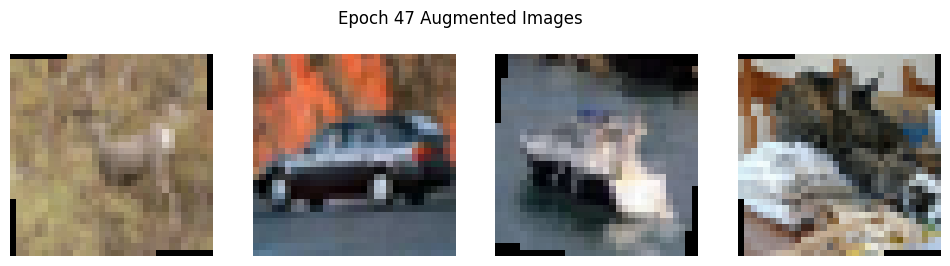

Epoch 48/199, Loss: 0.3283, Train Acc: 0.8839, Val Acc: 0.8292


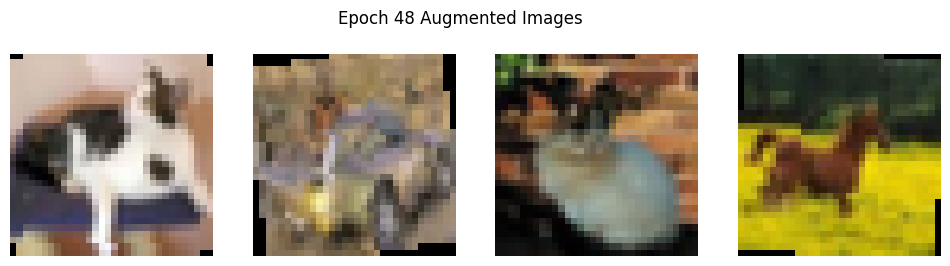

Epoch 49/199, Loss: 0.3285, Train Acc: 0.8841, Val Acc: 0.8287


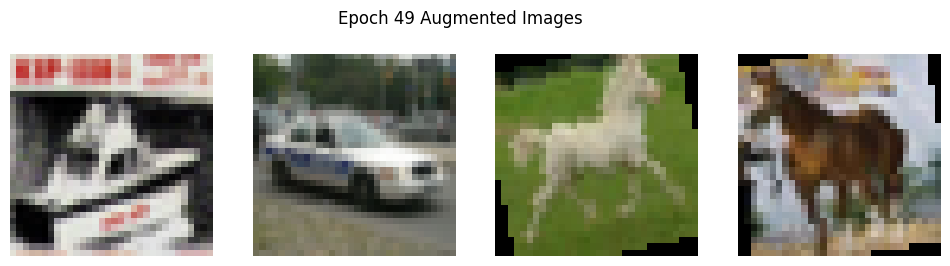

Epoch 50/199, Loss: 0.3224, Train Acc: 0.8848, Val Acc: 0.8310


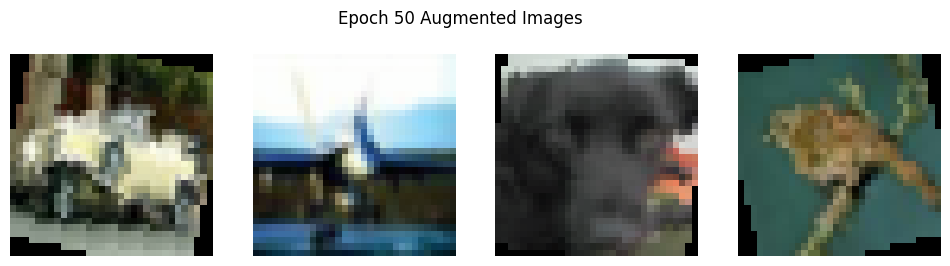

Epoch 51/199, Loss: 0.3223, Train Acc: 0.8856, Val Acc: 0.8297


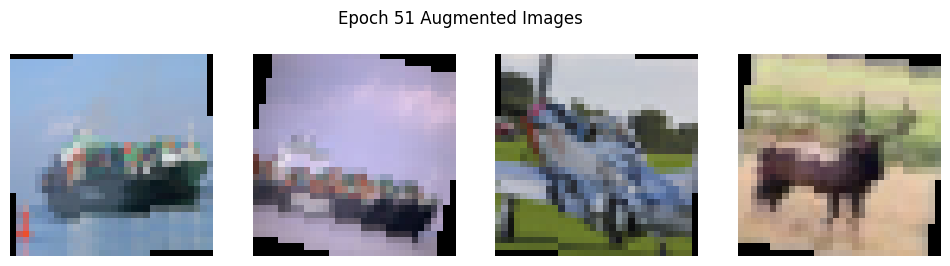

Epoch 52/199, Loss: 0.3182, Train Acc: 0.8880, Val Acc: 0.8278


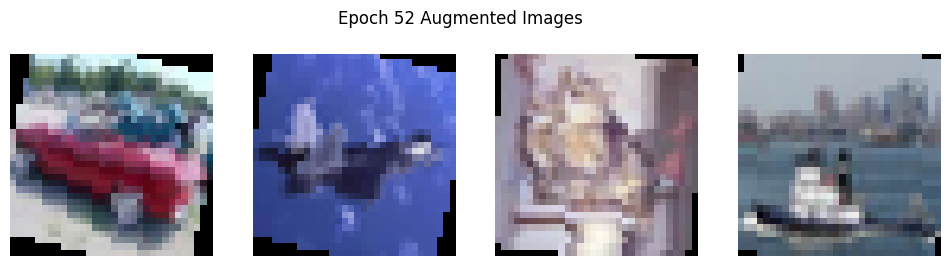

Epoch 53/199, Loss: 0.3109, Train Acc: 0.8894, Val Acc: 0.8288


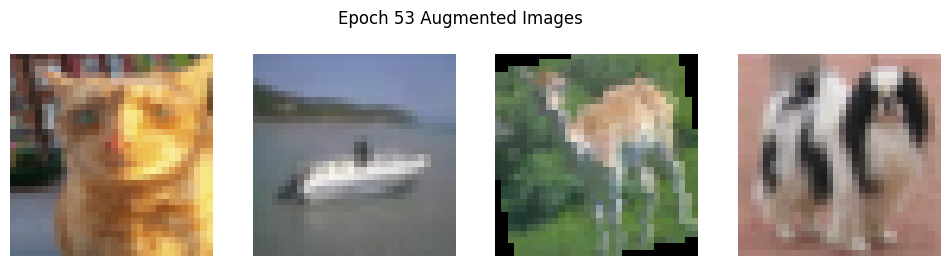

Epoch 54/199, Loss: 0.3093, Train Acc: 0.8894, Val Acc: 0.8299


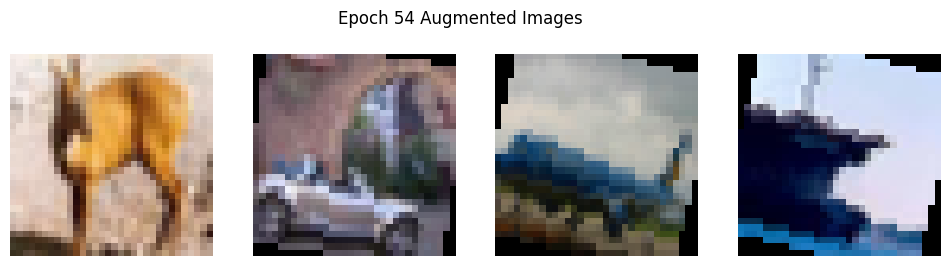

Epoch 55/199, Loss: 0.3068, Train Acc: 0.8911, Val Acc: 0.8323


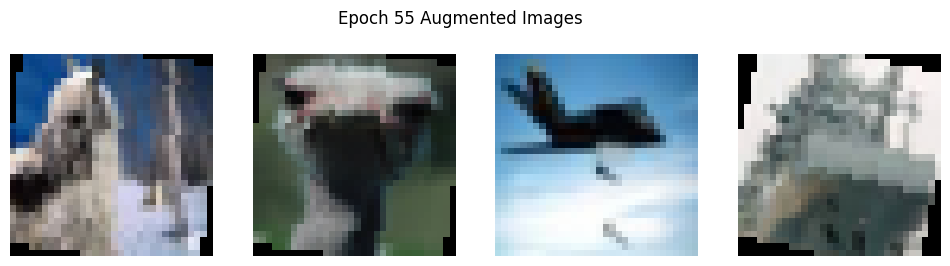

Epoch 56/199, Loss: 0.3062, Train Acc: 0.8906, Val Acc: 0.8321


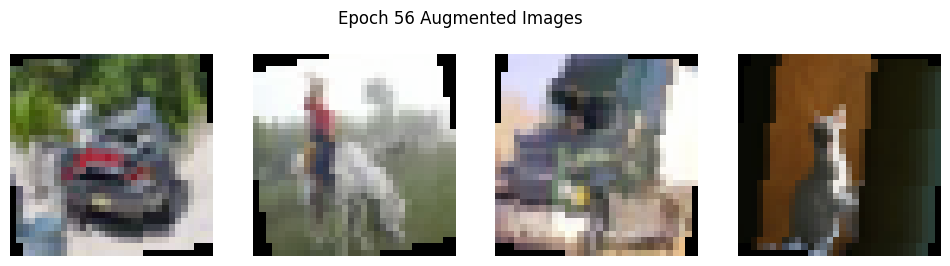

Epoch 57/199, Loss: 0.3020, Train Acc: 0.8927, Val Acc: 0.8321


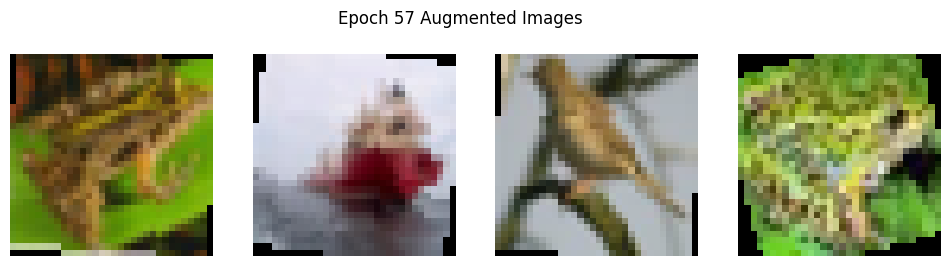

Epoch 58/199, Loss: 0.2977, Train Acc: 0.8949, Val Acc: 0.8321


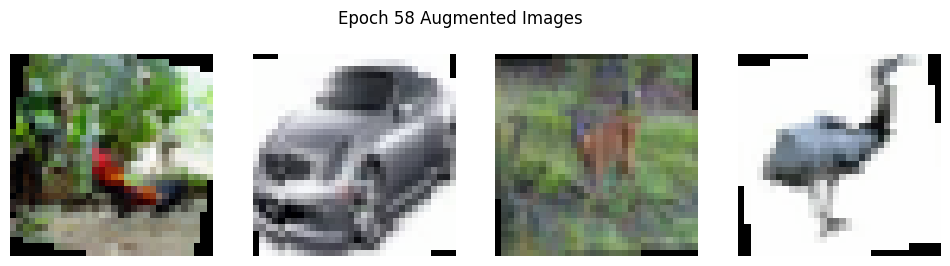

Epoch 59/199, Loss: 0.3018, Train Acc: 0.8913, Val Acc: 0.8302


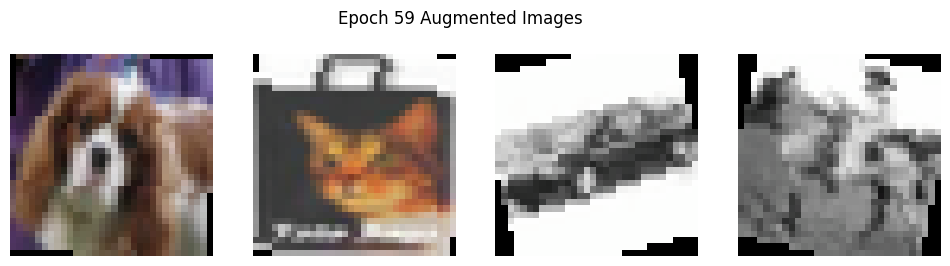

Epoch 60/199, Loss: 0.2950, Train Acc: 0.8961, Val Acc: 0.8297


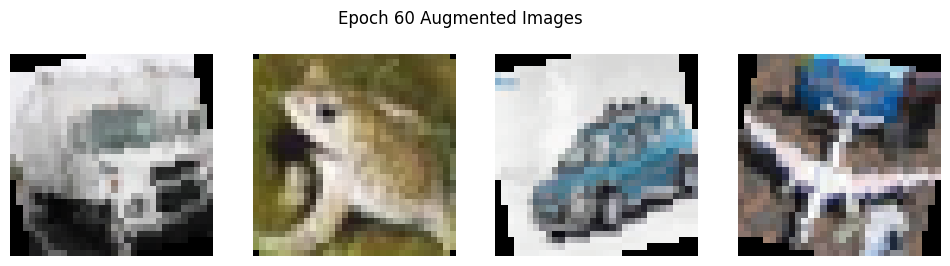

Epoch 61/199, Loss: 0.2927, Train Acc: 0.8960, Val Acc: 0.8318
Epoch 00062: reducing learning rate of group 0 to 1.0000e-05.


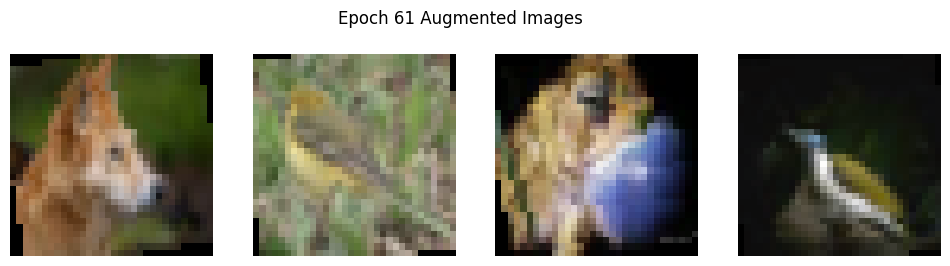

Epoch 62/199, Loss: 0.2840, Train Acc: 0.8984, Val Acc: 0.8337


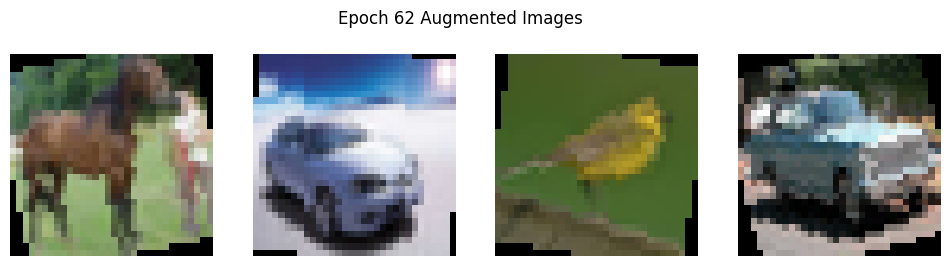

Epoch 63/199, Loss: 0.2859, Train Acc: 0.8984, Val Acc: 0.8330


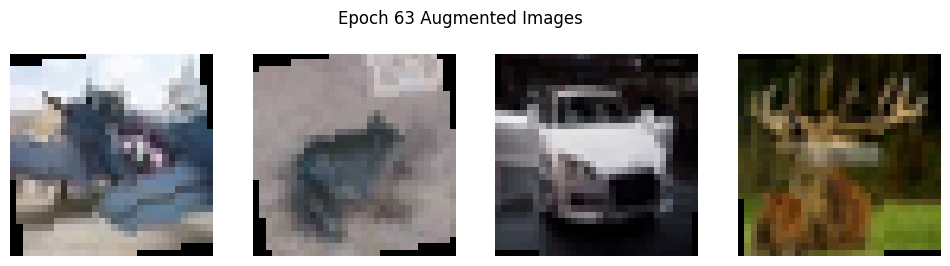

Epoch 64/199, Loss: 0.2775, Train Acc: 0.9006, Val Acc: 0.8324


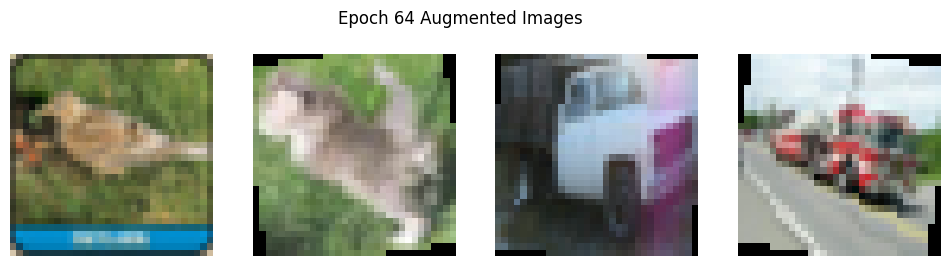

Epoch 65/199, Loss: 0.2827, Train Acc: 0.8992, Val Acc: 0.8329


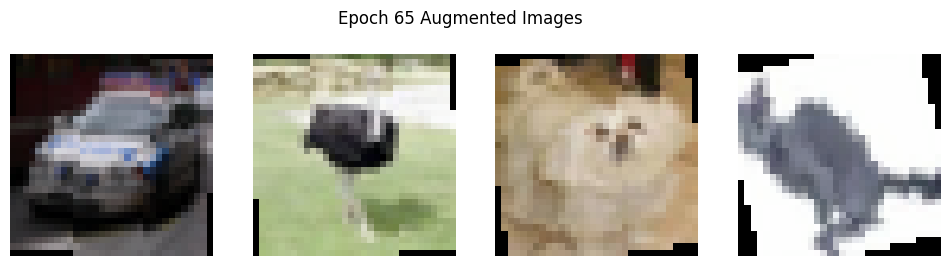

Epoch 66/199, Loss: 0.2795, Train Acc: 0.9009, Val Acc: 0.8343


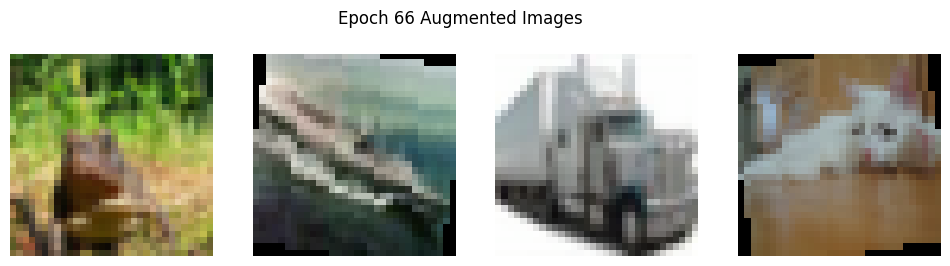

Epoch 67/199, Loss: 0.2774, Train Acc: 0.9028, Val Acc: 0.8347


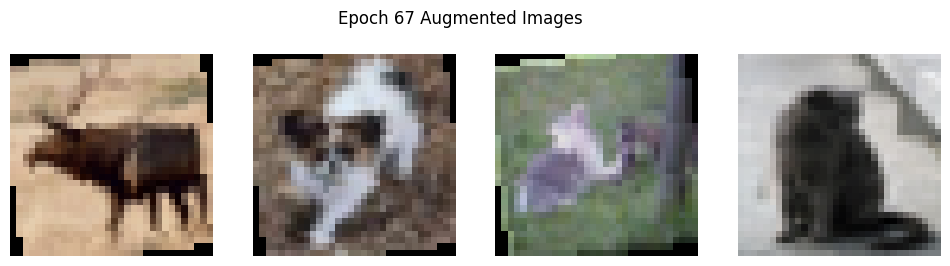

Epoch 68/199, Loss: 0.2795, Train Acc: 0.9009, Val Acc: 0.8320


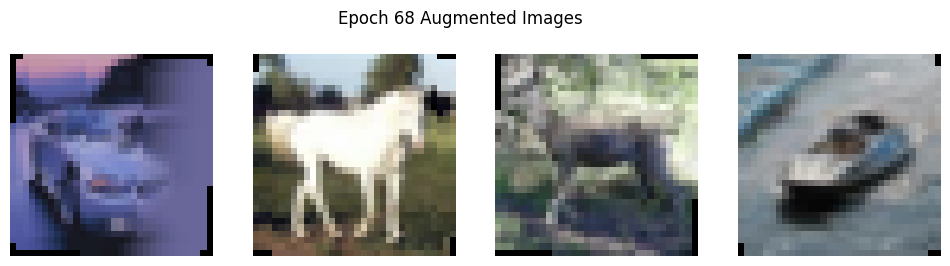

Epoch 69/199, Loss: 0.2762, Train Acc: 0.9025, Val Acc: 0.8338


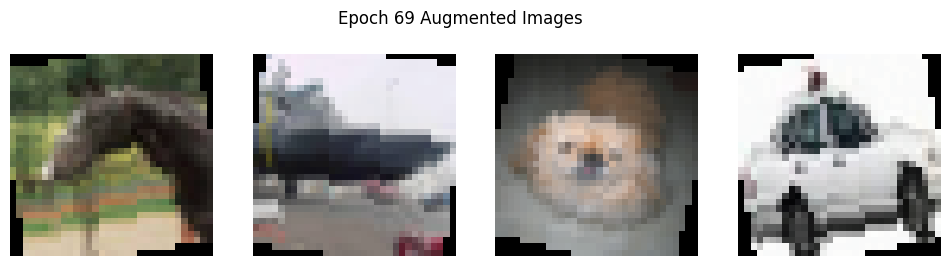

Epoch 70/199, Loss: 0.2757, Train Acc: 0.9026, Val Acc: 0.8345


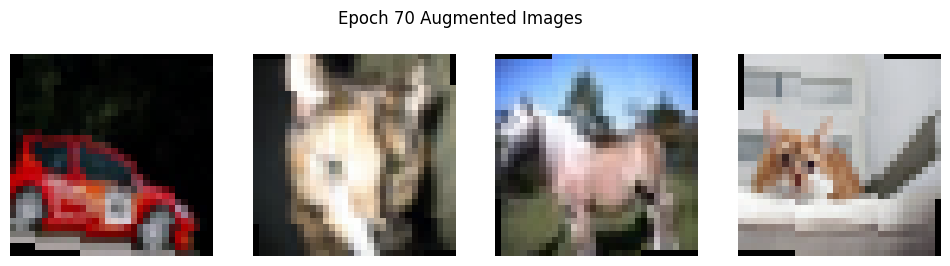

Epoch 71/199, Loss: 0.2775, Train Acc: 0.9009, Val Acc: 0.8345


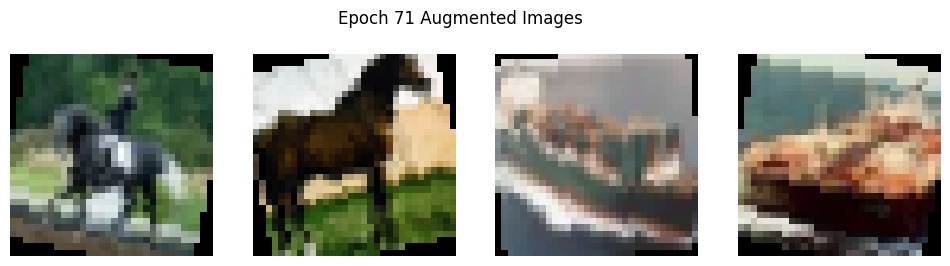

Epoch 72/199, Loss: 0.2752, Train Acc: 0.9039, Val Acc: 0.8341


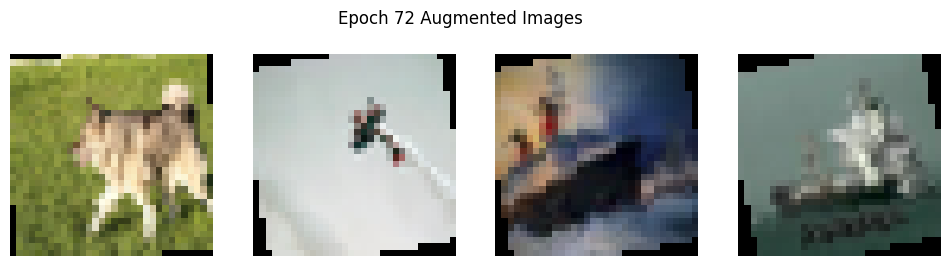

Epoch 73/199, Loss: 0.2769, Train Acc: 0.9016, Val Acc: 0.8340
Epoch 00074: reducing learning rate of group 0 to 1.0000e-06.


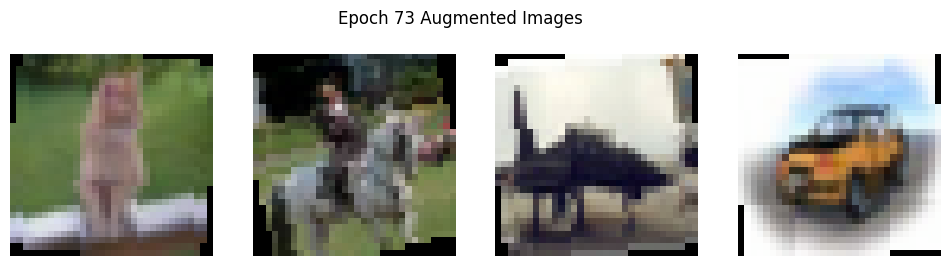

Epoch 74/199, Loss: 0.2746, Train Acc: 0.9014, Val Acc: 0.8343


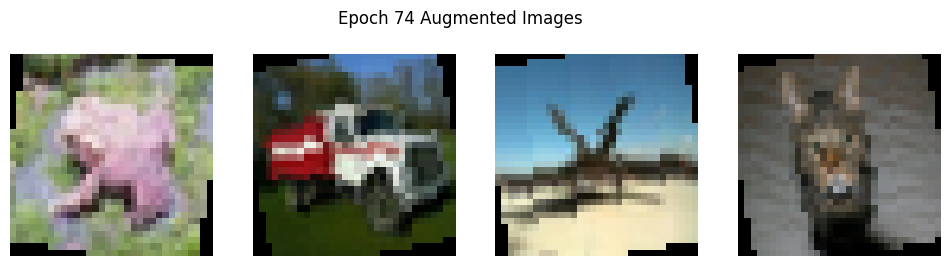

Epoch 75/199, Loss: 0.2729, Train Acc: 0.9035, Val Acc: 0.8343


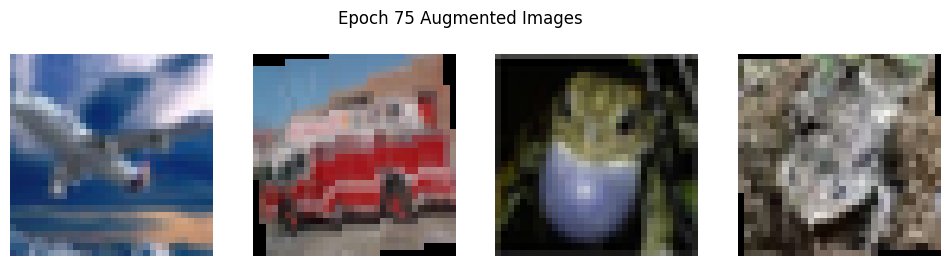

Epoch 76/199, Loss: 0.2753, Train Acc: 0.9022, Val Acc: 0.8343


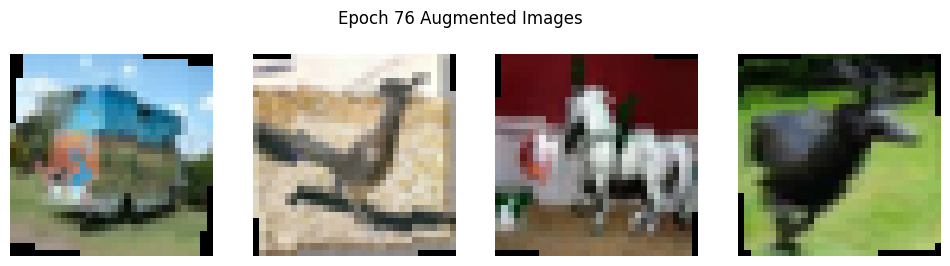

Epoch 77/199, Loss: 0.2748, Train Acc: 0.9025, Val Acc: 0.8342


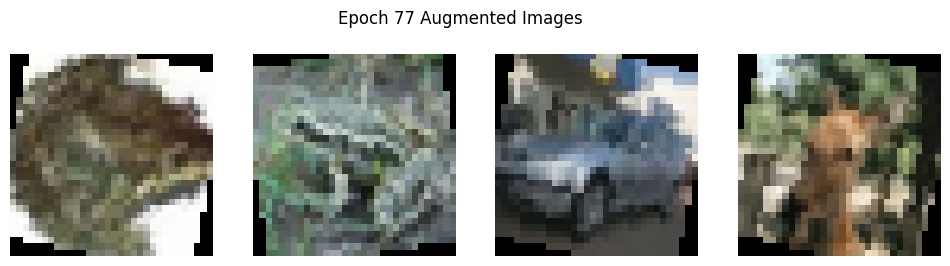

Epoch 78/199, Loss: 0.2746, Train Acc: 0.9009, Val Acc: 0.8344


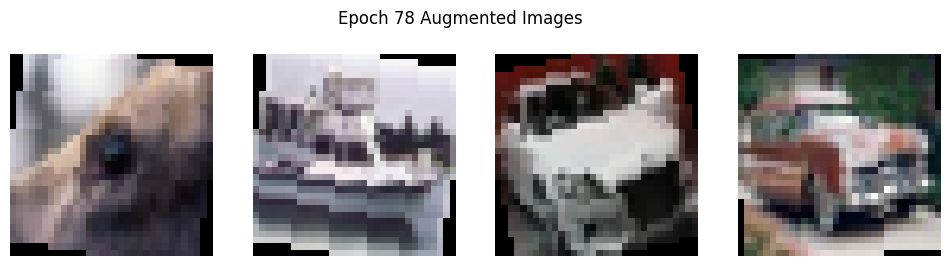

Epoch 79/199, Loss: 0.2784, Train Acc: 0.9018, Val Acc: 0.8341
Epoch 00080: reducing learning rate of group 0 to 1.0000e-07.


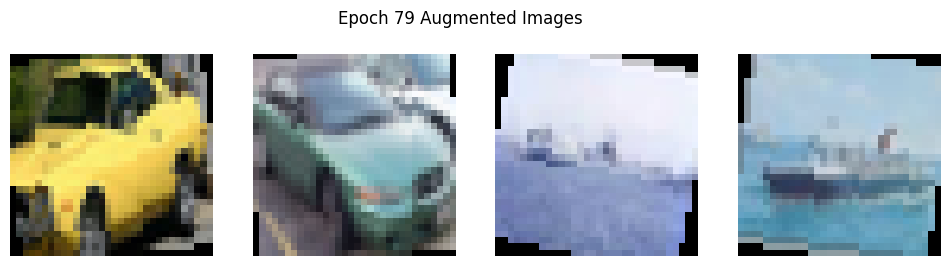

Epoch 80/199, Loss: 0.2755, Train Acc: 0.9013, Val Acc: 0.8340


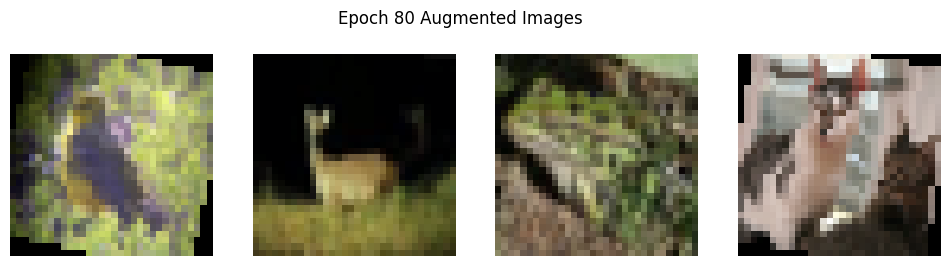

Epoch 81/199, Loss: 0.2727, Train Acc: 0.9023, Val Acc: 0.8341


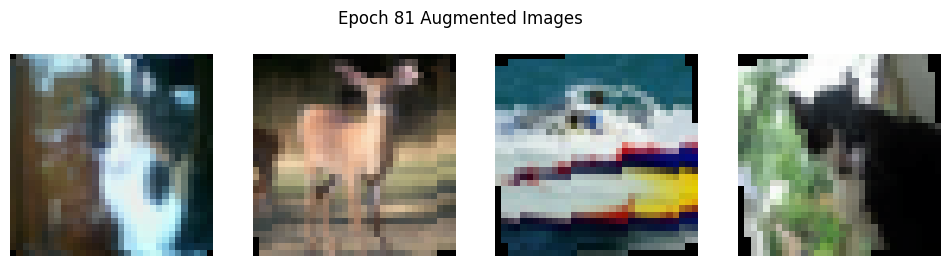

Epoch 82/199, Loss: 0.2690, Train Acc: 0.9034, Val Acc: 0.8341


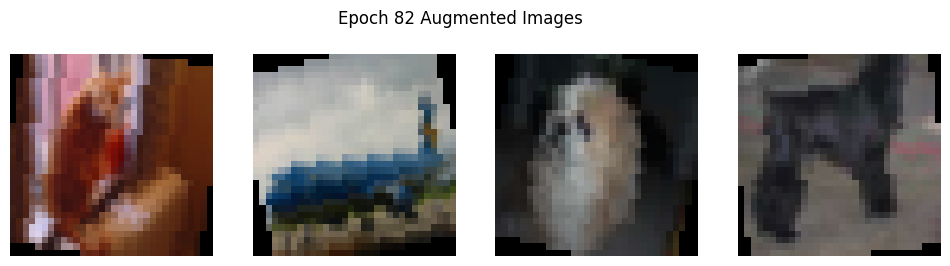

Epoch 83/199, Loss: 0.2744, Train Acc: 0.9025, Val Acc: 0.8341


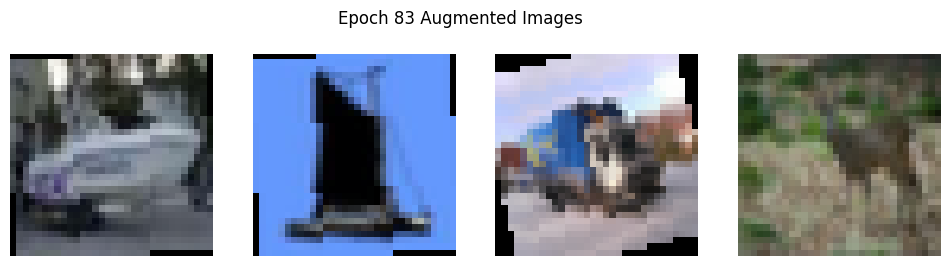

Epoch 84/199, Loss: 0.2714, Train Acc: 0.9037, Val Acc: 0.8340


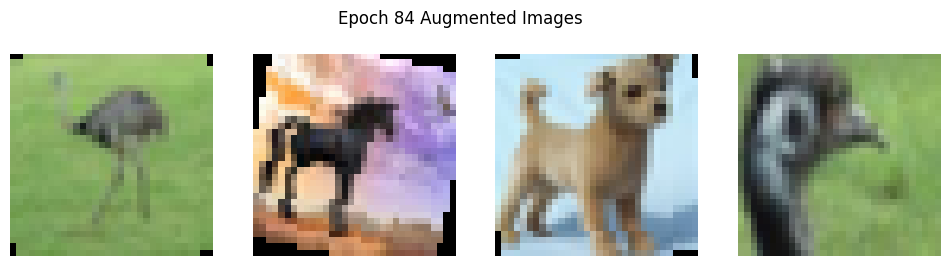

Epoch 85/199, Loss: 0.2742, Train Acc: 0.9033, Val Acc: 0.8340
Epoch 00086: reducing learning rate of group 0 to 1.0000e-08.


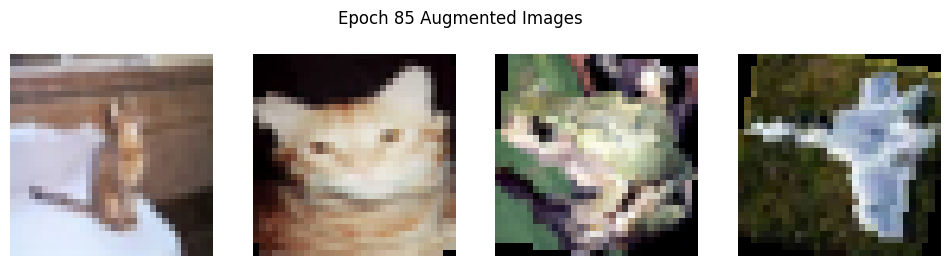

Epoch 86/199, Loss: 0.2752, Train Acc: 0.9031, Val Acc: 0.8340


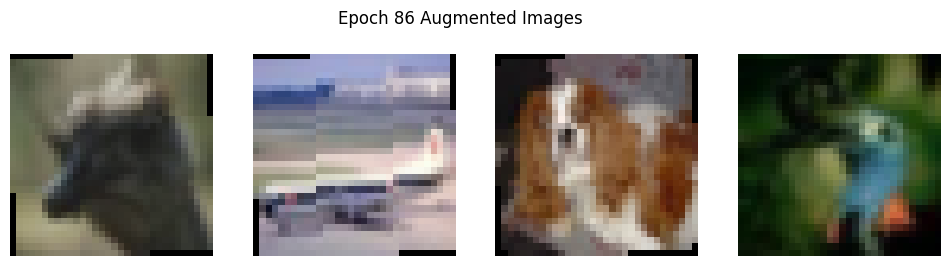

Epoch 87/199, Loss: 0.2731, Train Acc: 0.9010, Val Acc: 0.8340


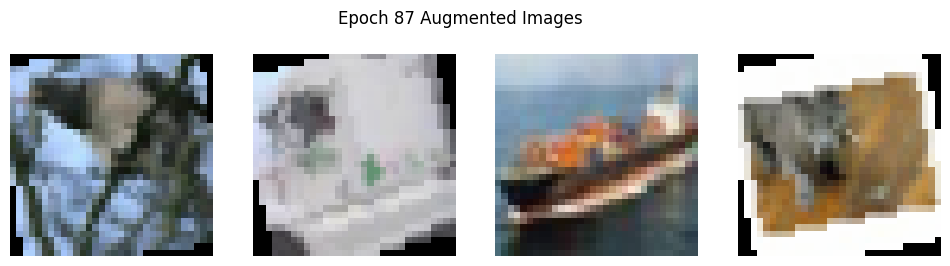

Epoch 88/199, Loss: 0.2742, Train Acc: 0.9020, Val Acc: 0.8339


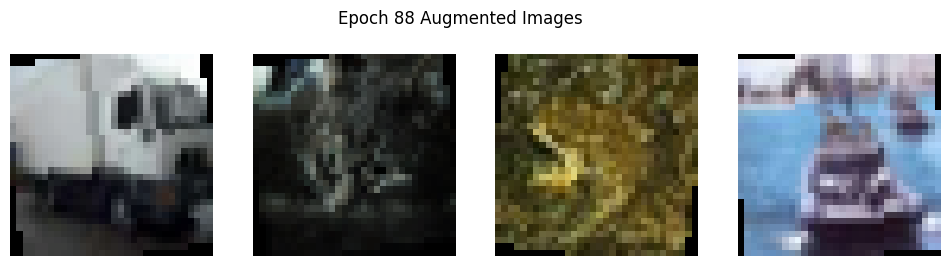

Epoch 89/199, Loss: 0.2746, Train Acc: 0.9016, Val Acc: 0.8340


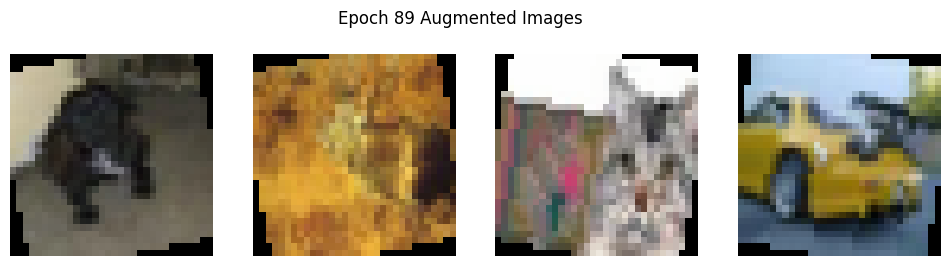

Epoch 90/199, Loss: 0.2694, Train Acc: 0.9056, Val Acc: 0.8340


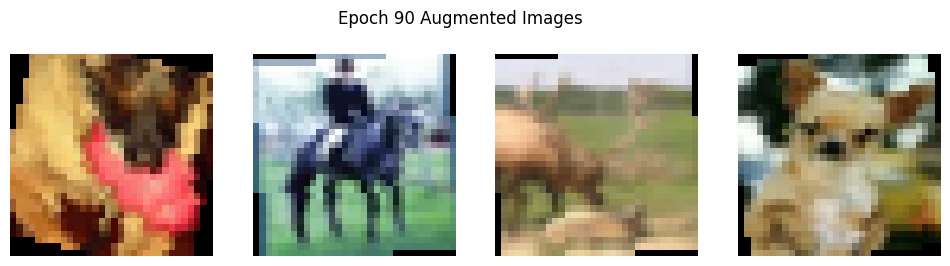

Epoch 91/199, Loss: 0.2752, Train Acc: 0.9014, Val Acc: 0.8341


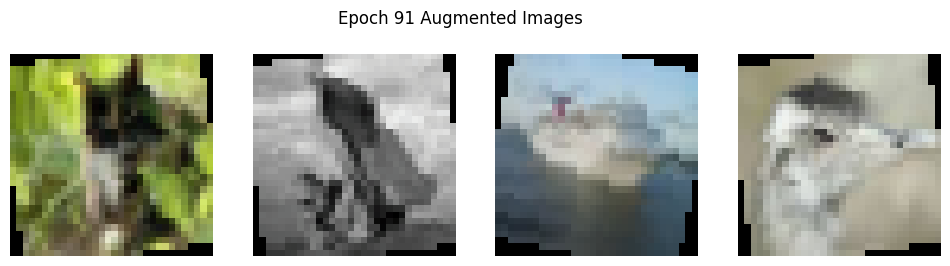

Epoch 92/199, Loss: 0.2699, Train Acc: 0.9035, Val Acc: 0.8341


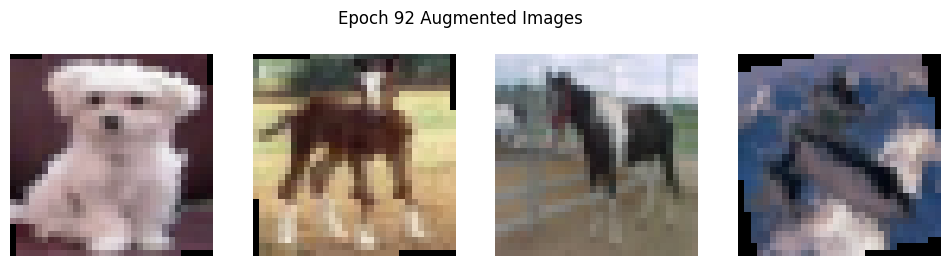

Epoch 93/199, Loss: 0.2719, Train Acc: 0.9035, Val Acc: 0.8341


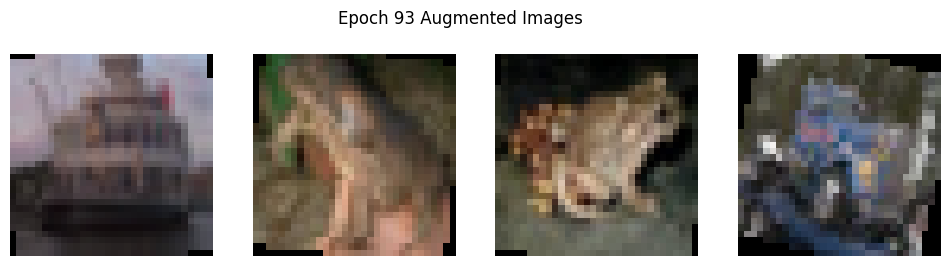

Epoch 94/199, Loss: 0.2753, Train Acc: 0.9029, Val Acc: 0.8340


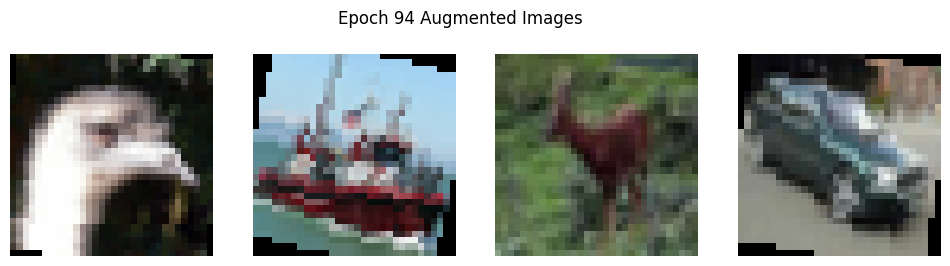

Epoch 95/199, Loss: 0.2729, Train Acc: 0.9025, Val Acc: 0.8342


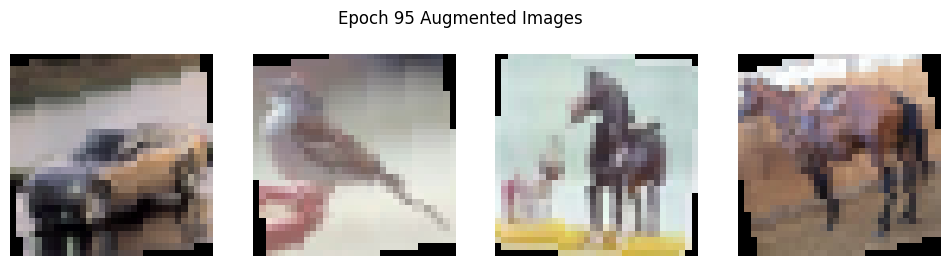

Epoch 96/199, Loss: 0.2742, Train Acc: 0.9031, Val Acc: 0.8342


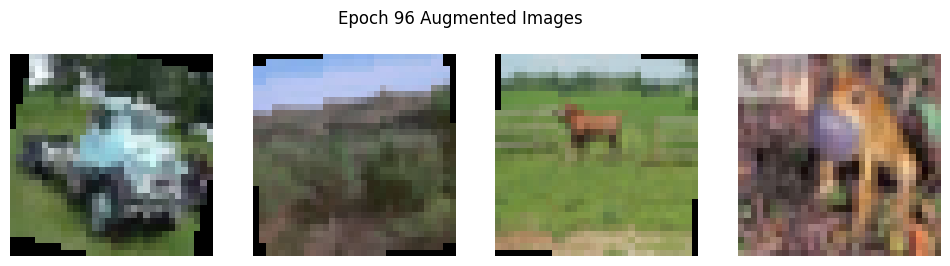

Epoch 97/199, Loss: 0.2690, Train Acc: 0.9047, Val Acc: 0.8342


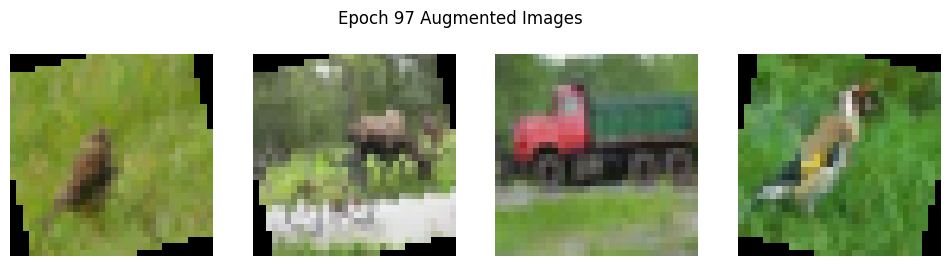

Epoch 98/199, Loss: 0.2738, Train Acc: 0.9042, Val Acc: 0.8341


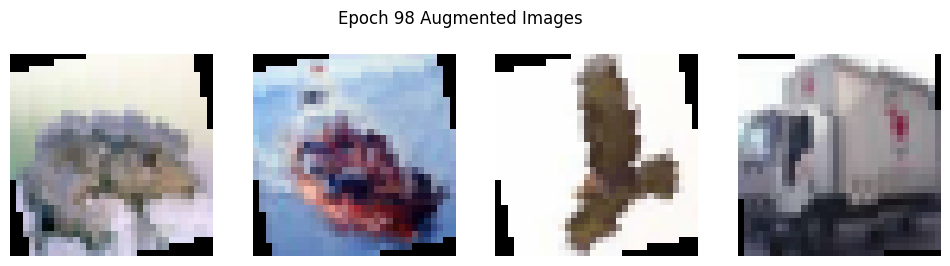

Epoch 99/199, Loss: 0.2780, Train Acc: 0.9000, Val Acc: 0.8342


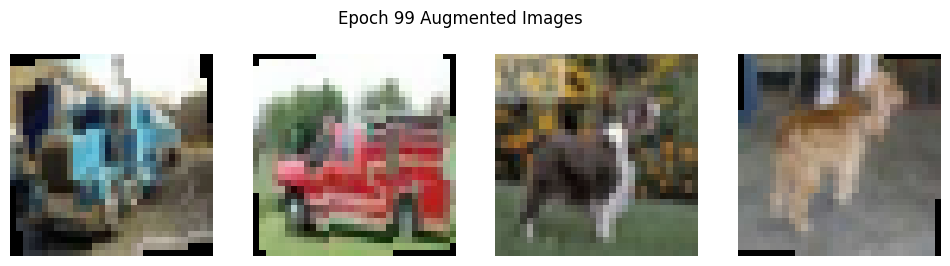

Epoch 100/199, Loss: 0.2710, Train Acc: 0.9038, Val Acc: 0.8341


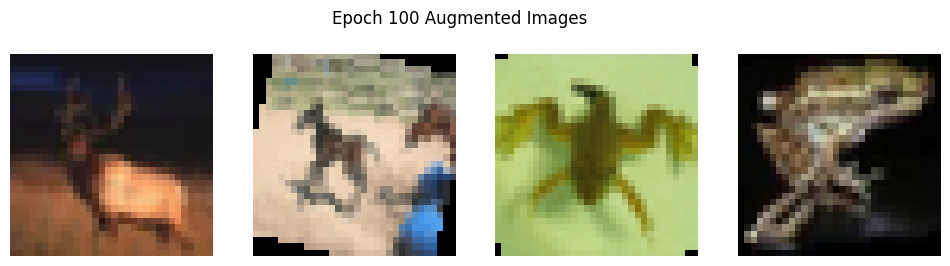

Epoch 101/199, Loss: 0.2743, Train Acc: 0.9023, Val Acc: 0.8340


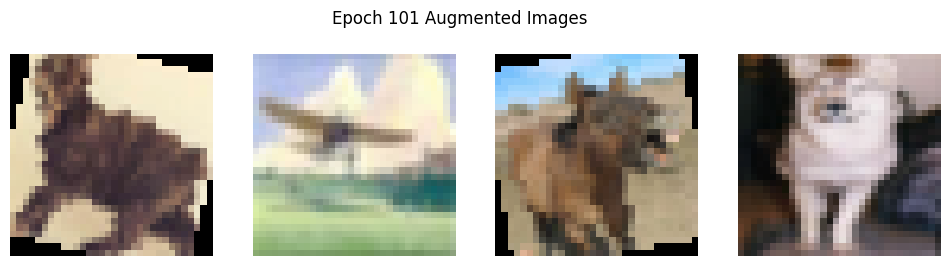

Epoch 102/199, Loss: 0.2711, Train Acc: 0.9028, Val Acc: 0.8341


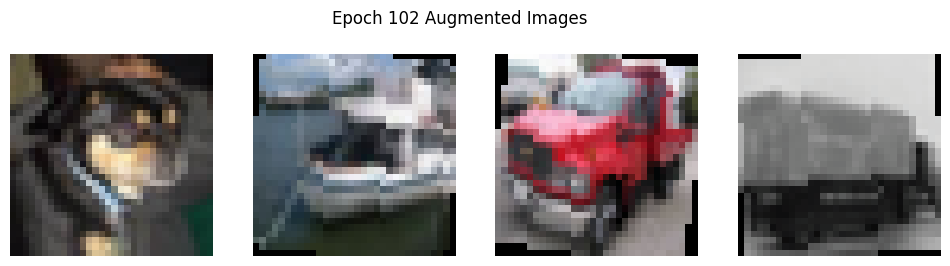

Epoch 103/199, Loss: 0.2778, Train Acc: 0.9026, Val Acc: 0.8340


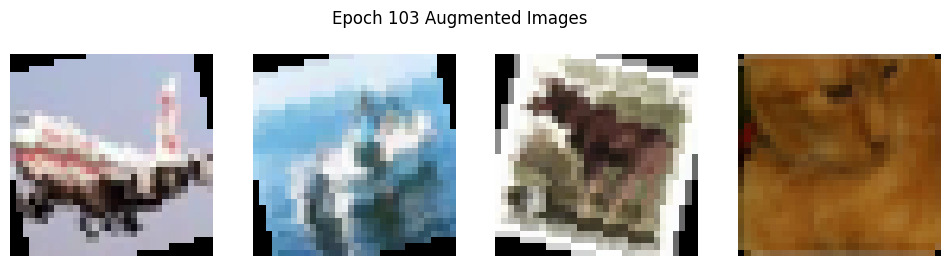

Epoch 104/199, Loss: 0.2766, Train Acc: 0.9018, Val Acc: 0.8341


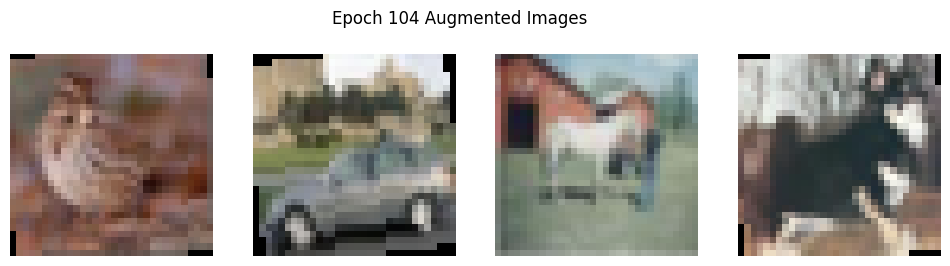

Epoch 105/199, Loss: 0.2717, Train Acc: 0.9030, Val Acc: 0.8341


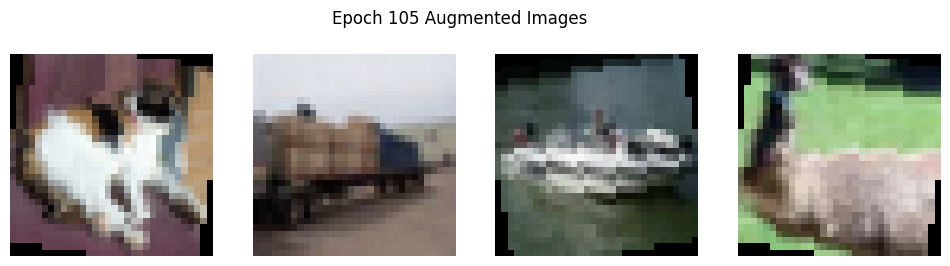

Epoch 106/199, Loss: 0.2734, Train Acc: 0.9028, Val Acc: 0.8342


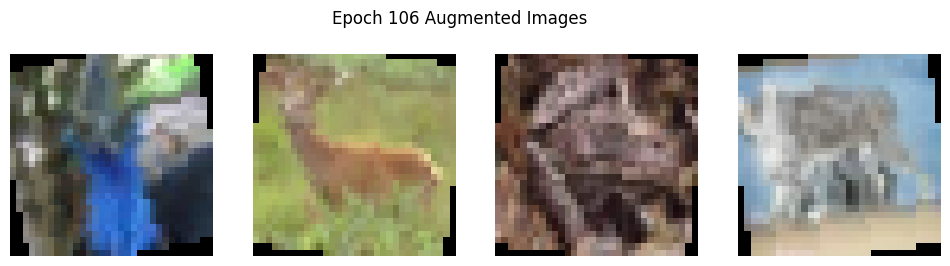

Epoch 107/199, Loss: 0.2689, Train Acc: 0.9022, Val Acc: 0.8341


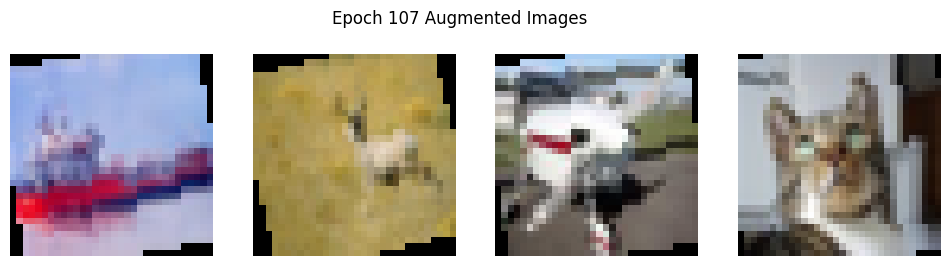

Epoch 108/199, Loss: 0.2734, Train Acc: 0.9031, Val Acc: 0.8341


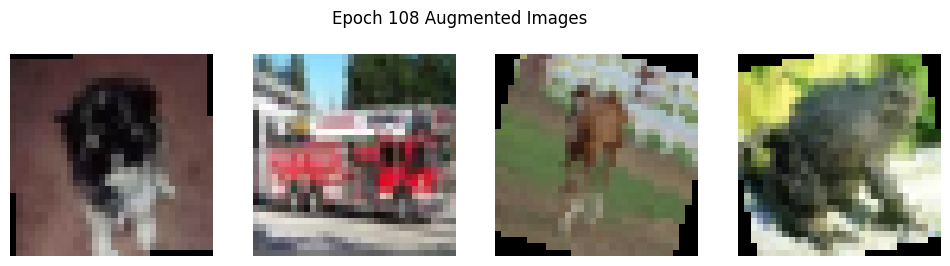

Epoch 109/199, Loss: 0.2724, Train Acc: 0.9016, Val Acc: 0.8341


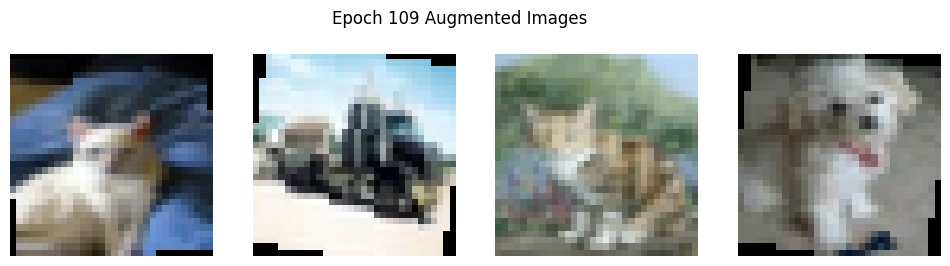

Epoch 110/199, Loss: 0.2740, Train Acc: 0.9019, Val Acc: 0.8341


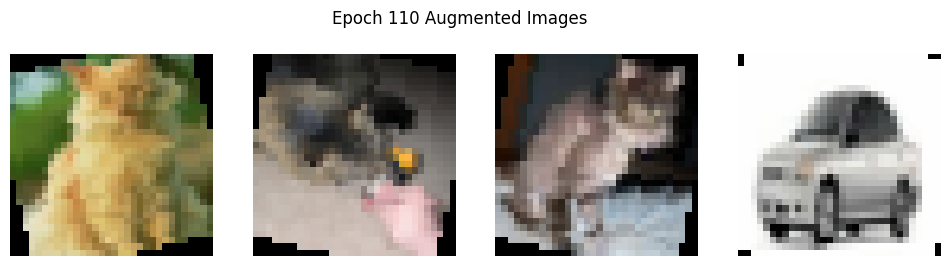

Epoch 111/199, Loss: 0.2757, Train Acc: 0.9027, Val Acc: 0.8341


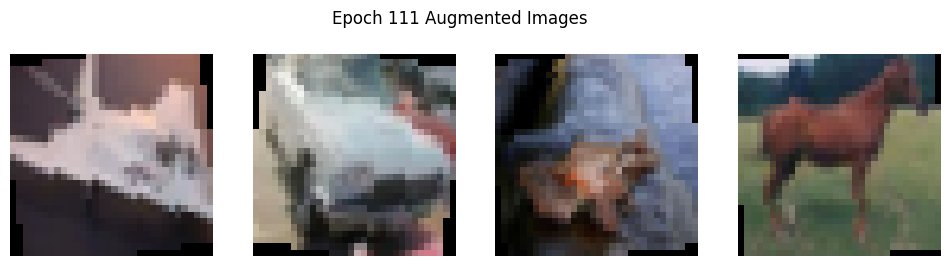

Epoch 112/199, Loss: 0.2757, Train Acc: 0.9025, Val Acc: 0.8341


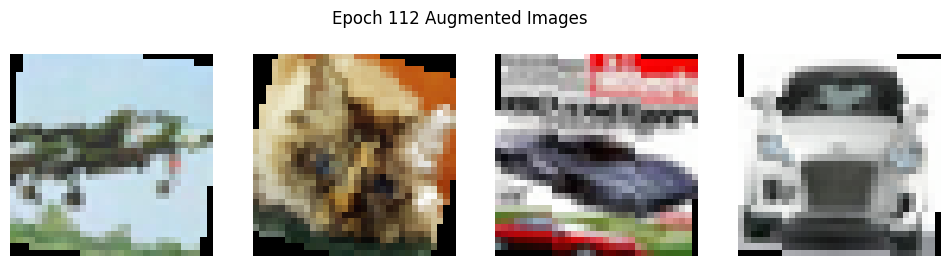

Epoch 113/199, Loss: 0.2742, Train Acc: 0.9020, Val Acc: 0.8341


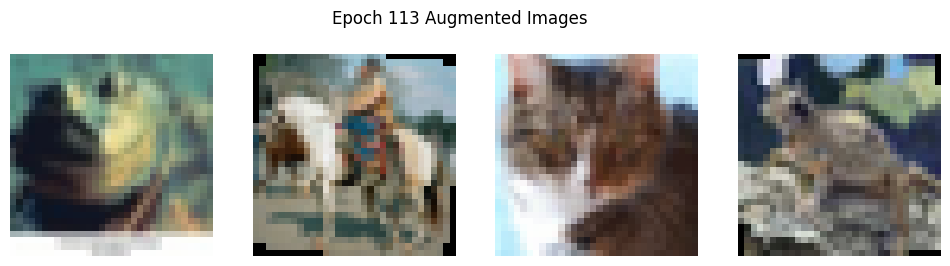

Epoch 114/199, Loss: 0.2751, Train Acc: 0.9019, Val Acc: 0.8341


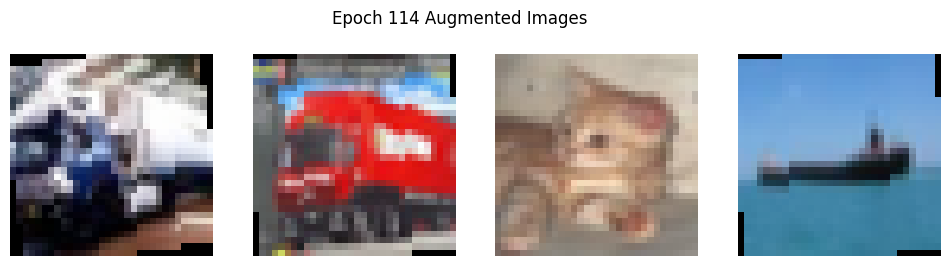

Epoch 115/199, Loss: 0.2731, Train Acc: 0.9029, Val Acc: 0.8341


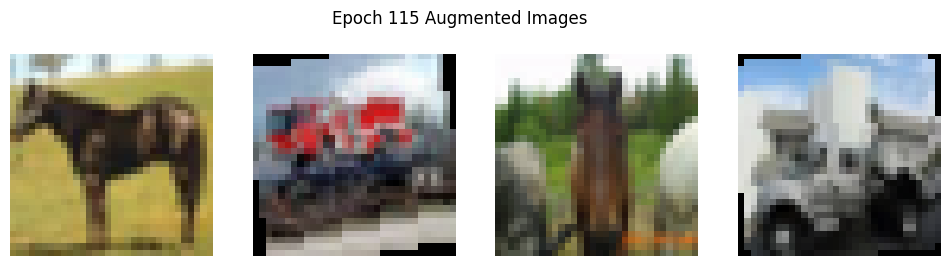

Epoch 116/199, Loss: 0.2785, Train Acc: 0.8991, Val Acc: 0.8341


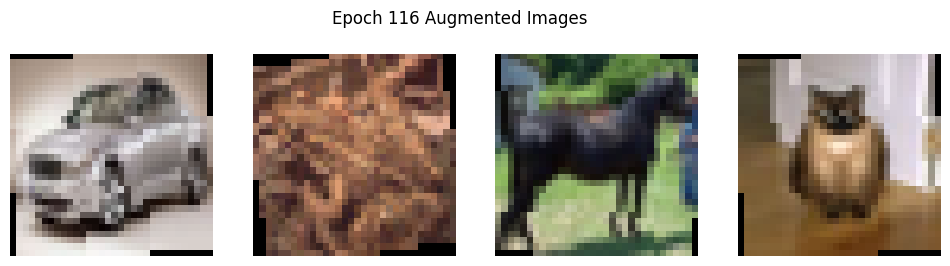

Epoch 117/199, Loss: 0.2716, Train Acc: 0.9017, Val Acc: 0.8341


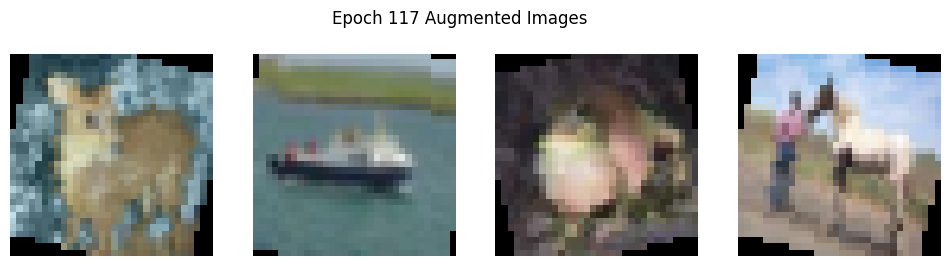

Epoch 118/199, Loss: 0.2751, Train Acc: 0.9007, Val Acc: 0.8341


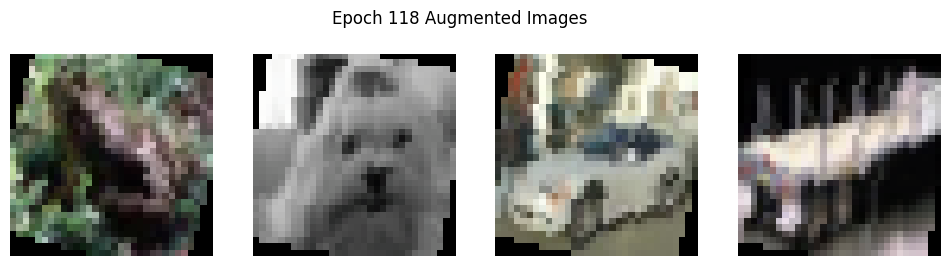

Epoch 119/199, Loss: 0.2747, Train Acc: 0.9017, Val Acc: 0.8341


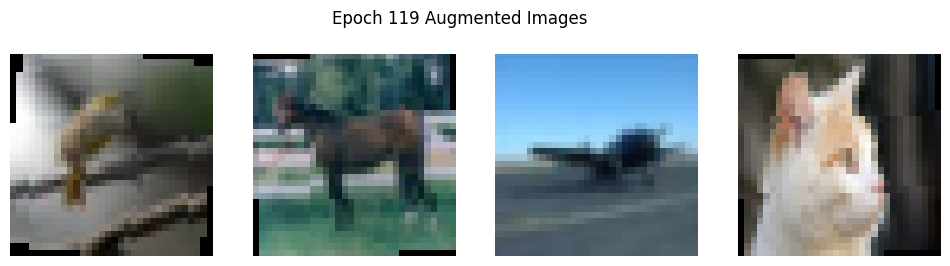

Epoch 120/199, Loss: 0.2739, Train Acc: 0.9011, Val Acc: 0.8341


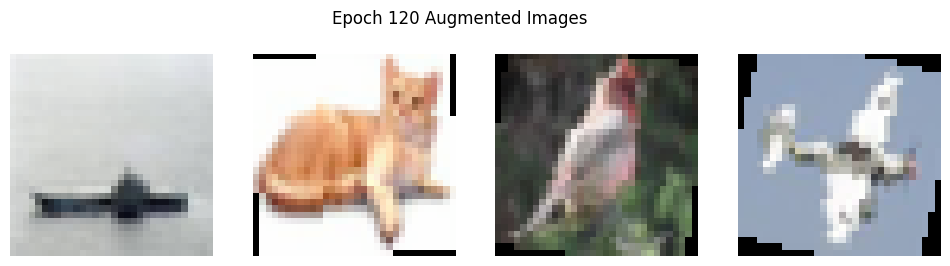

Epoch 121/199, Loss: 0.2793, Train Acc: 0.9013, Val Acc: 0.8341


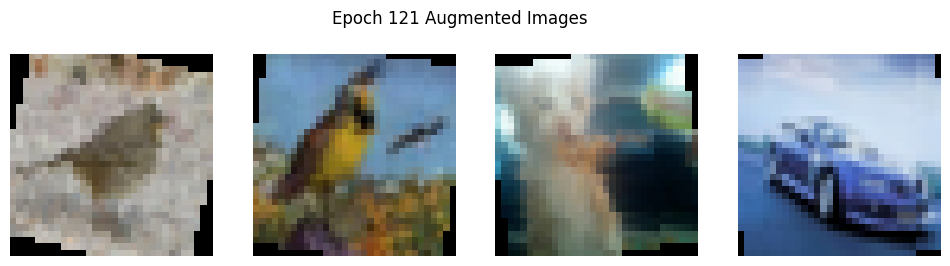

Epoch 122/199, Loss: 0.2696, Train Acc: 0.9039, Val Acc: 0.8341


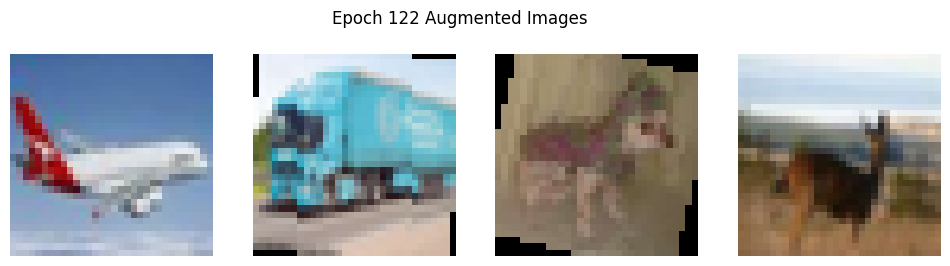

Epoch 123/199, Loss: 0.2751, Train Acc: 0.9036, Val Acc: 0.8342


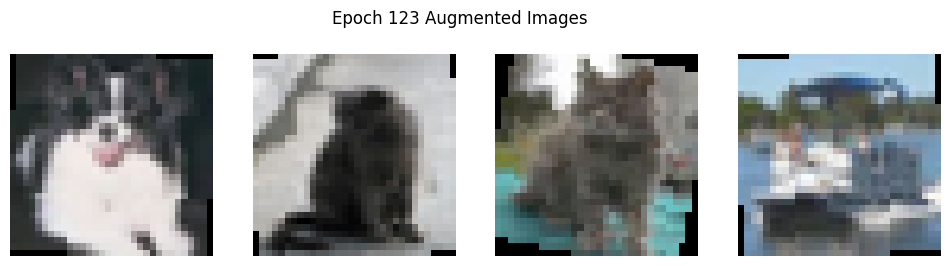

Epoch 124/199, Loss: 0.2725, Train Acc: 0.9015, Val Acc: 0.8341


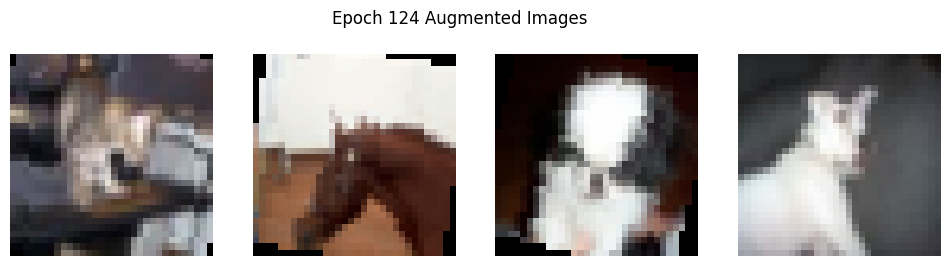

Epoch 125/199, Loss: 0.2727, Train Acc: 0.9038, Val Acc: 0.8341


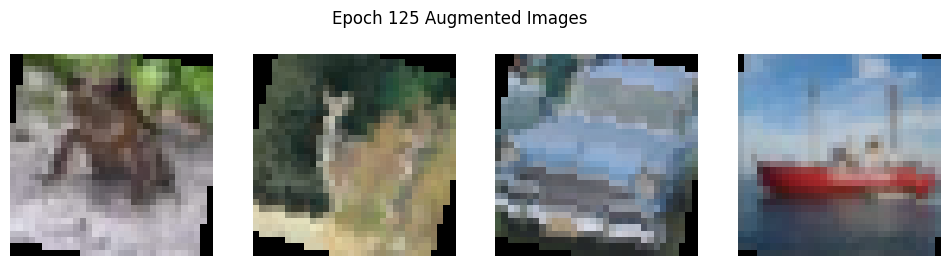

Epoch 126/199, Loss: 0.2736, Train Acc: 0.9024, Val Acc: 0.8341


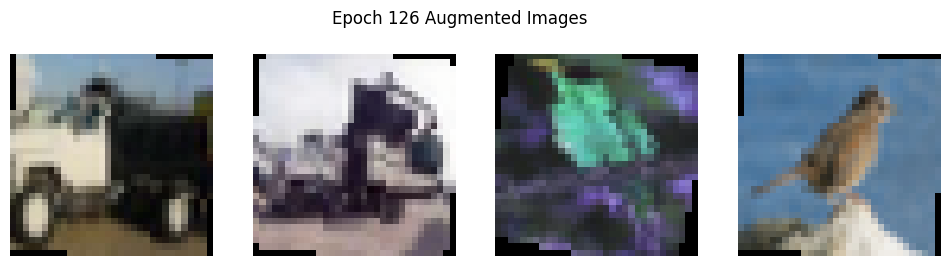

Epoch 127/199, Loss: 0.2721, Train Acc: 0.9029, Val Acc: 0.8341


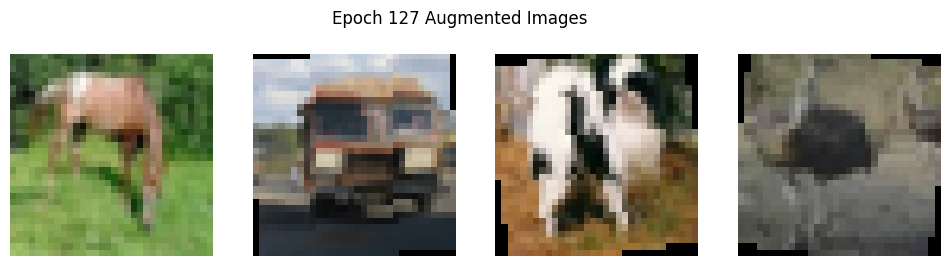

Epoch 128/199, Loss: 0.2751, Train Acc: 0.9022, Val Acc: 0.8341


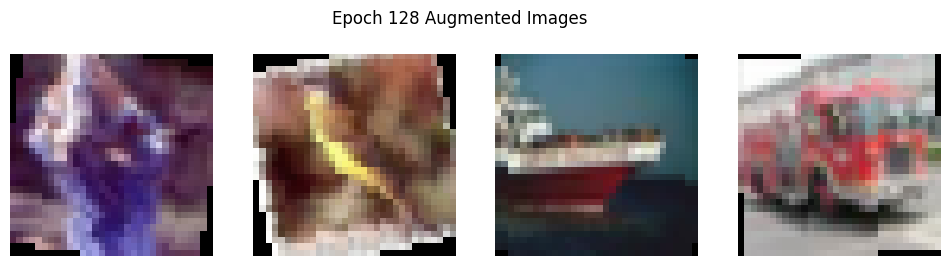

Epoch 129/199, Loss: 0.2703, Train Acc: 0.9033, Val Acc: 0.8342


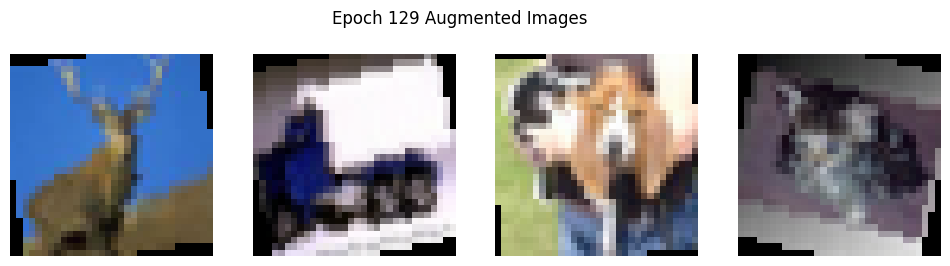

Epoch 130/199, Loss: 0.2731, Train Acc: 0.9032, Val Acc: 0.8342


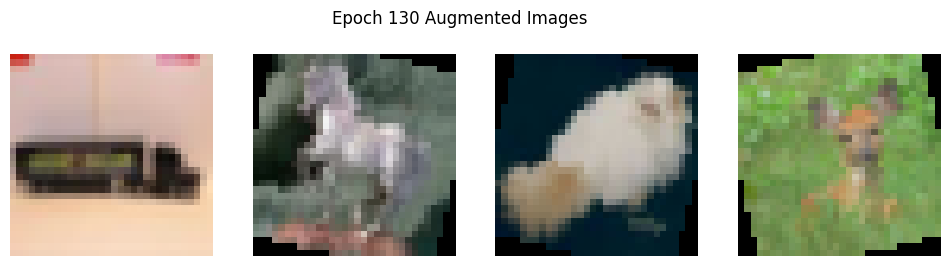

Epoch 131/199, Loss: 0.2761, Train Acc: 0.9015, Val Acc: 0.8342


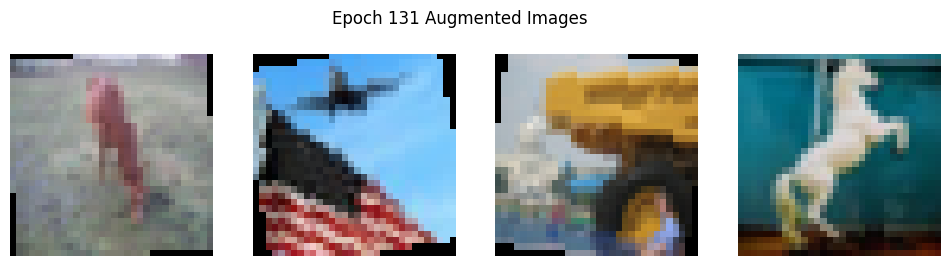

Epoch 132/199, Loss: 0.2685, Train Acc: 0.9050, Val Acc: 0.8342


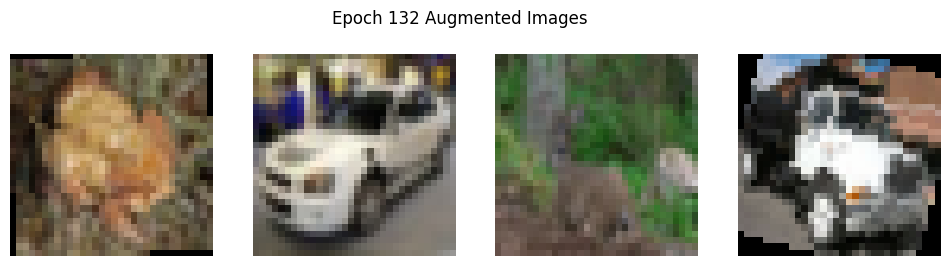

Epoch 133/199, Loss: 0.2749, Train Acc: 0.9024, Val Acc: 0.8342


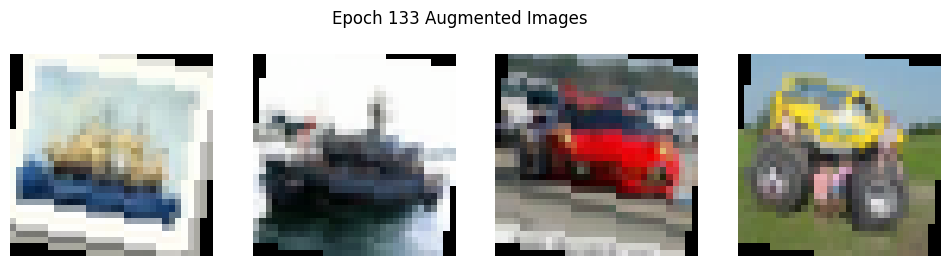

Epoch 134/199, Loss: 0.2727, Train Acc: 0.9031, Val Acc: 0.8342


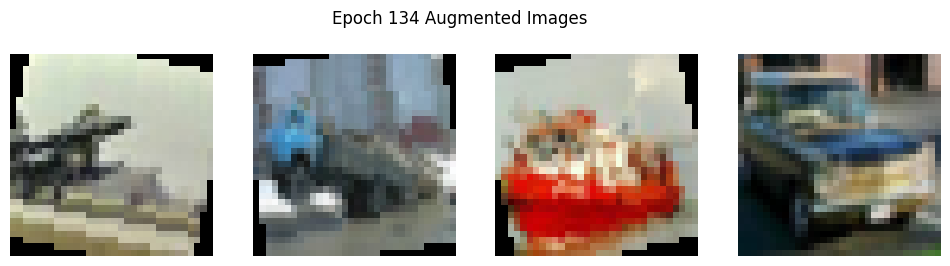

Epoch 135/199, Loss: 0.2706, Train Acc: 0.9040, Val Acc: 0.8342


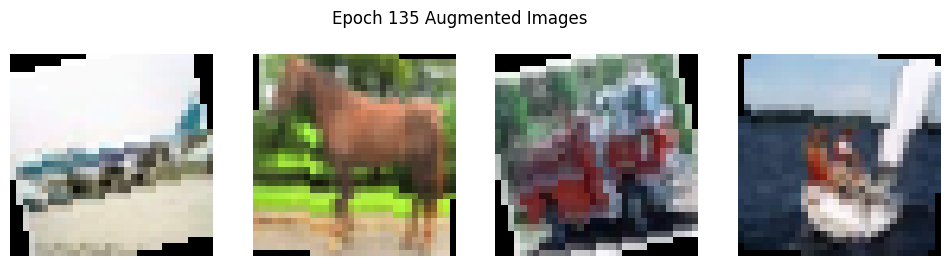

Epoch 136/199, Loss: 0.2718, Train Acc: 0.9045, Val Acc: 0.8343


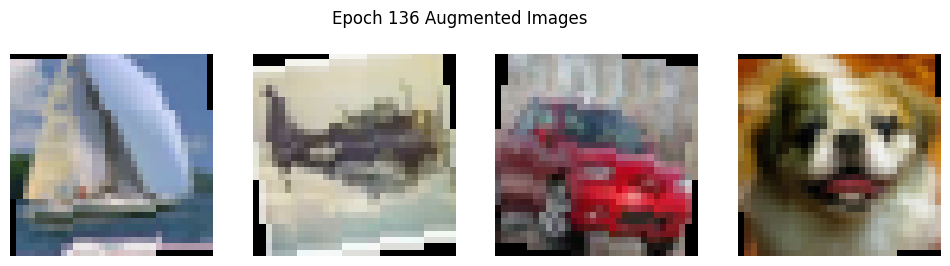

Epoch 137/199, Loss: 0.2768, Train Acc: 0.9007, Val Acc: 0.8342


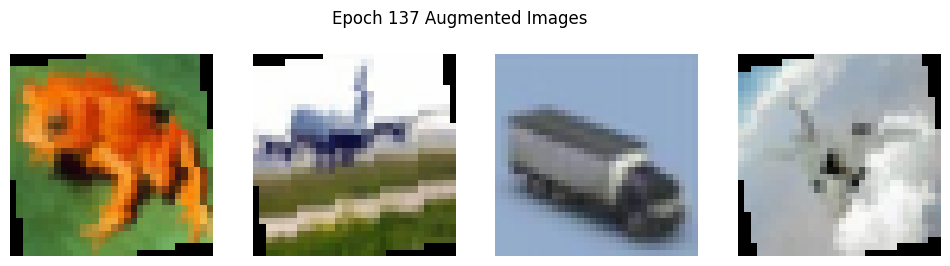

Epoch 138/199, Loss: 0.2745, Train Acc: 0.9022, Val Acc: 0.8342


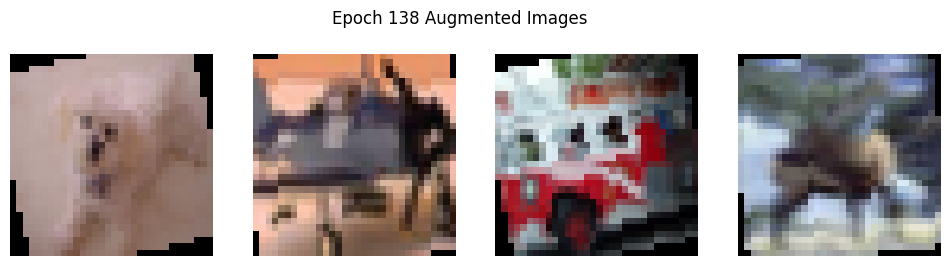

Epoch 139/199, Loss: 0.2760, Train Acc: 0.9014, Val Acc: 0.8343


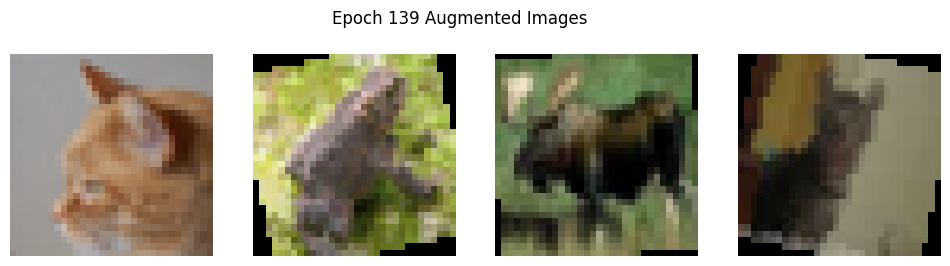

Epoch 140/199, Loss: 0.2705, Train Acc: 0.9032, Val Acc: 0.8342


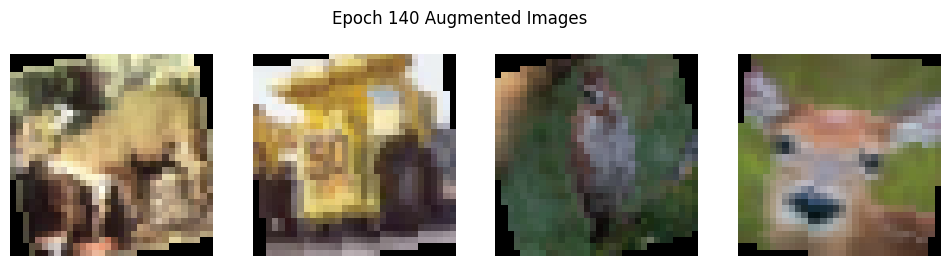

Epoch 141/199, Loss: 0.2729, Train Acc: 0.9016, Val Acc: 0.8342


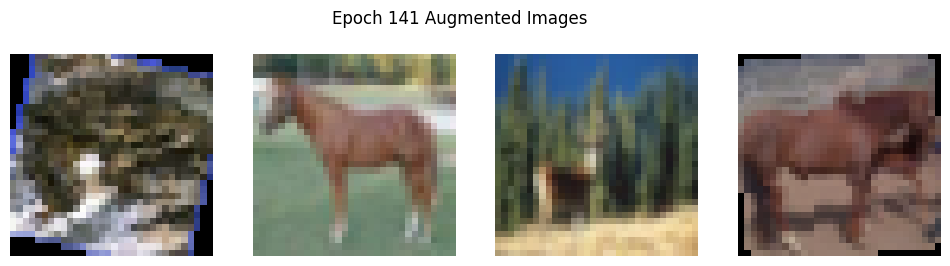

Epoch 142/199, Loss: 0.2800, Train Acc: 0.9006, Val Acc: 0.8342


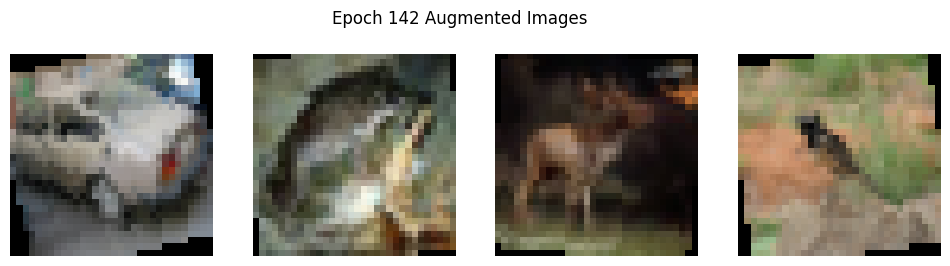

Epoch 143/199, Loss: 0.2753, Train Acc: 0.9010, Val Acc: 0.8341


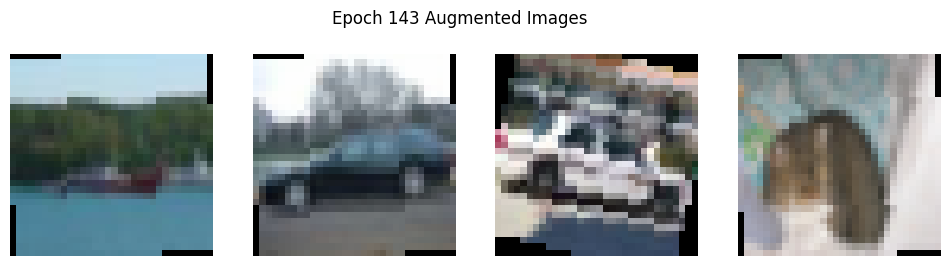

Epoch 144/199, Loss: 0.2767, Train Acc: 0.9006, Val Acc: 0.8343


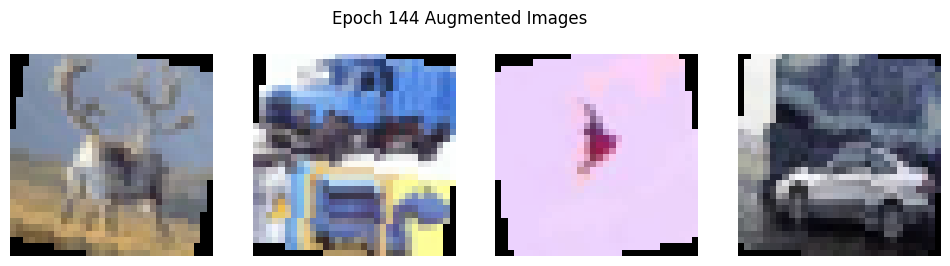

Epoch 145/199, Loss: 0.2701, Train Acc: 0.9036, Val Acc: 0.8341


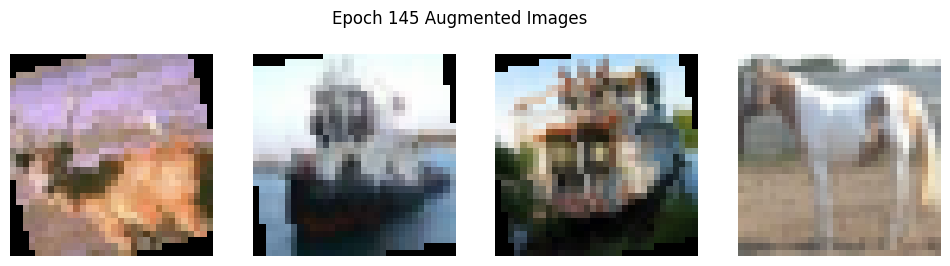

Epoch 146/199, Loss: 0.2712, Train Acc: 0.9034, Val Acc: 0.8340


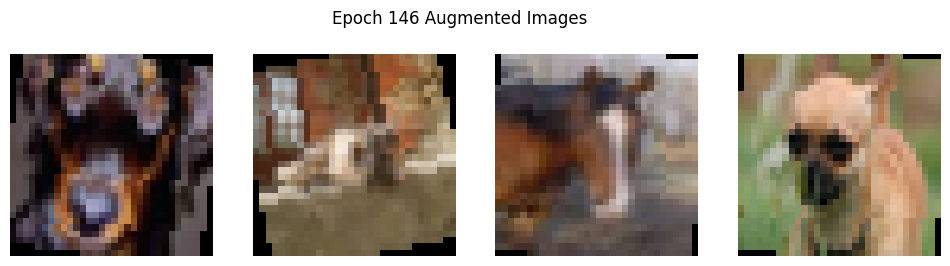

Epoch 147/199, Loss: 0.2775, Train Acc: 0.9014, Val Acc: 0.8341


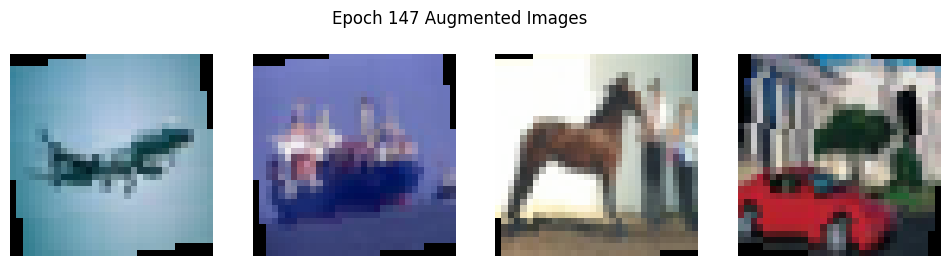

Epoch 148/199, Loss: 0.2751, Train Acc: 0.9021, Val Acc: 0.8341


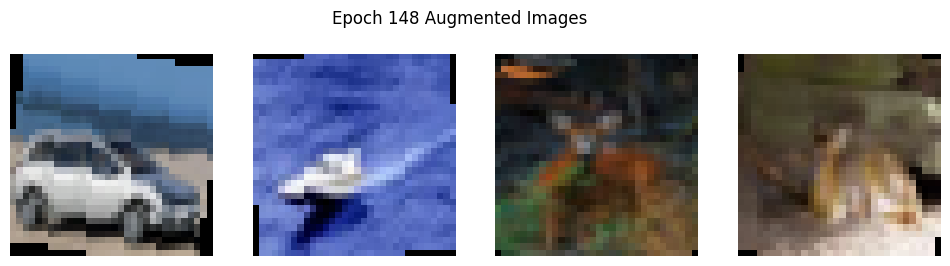

Epoch 149/199, Loss: 0.2731, Train Acc: 0.9040, Val Acc: 0.8341


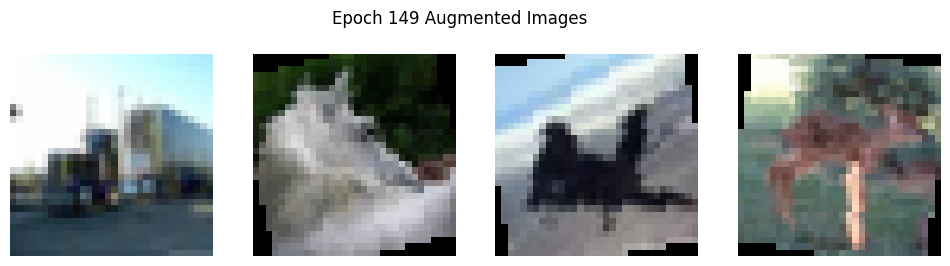

Epoch 150/199, Loss: 0.2726, Train Acc: 0.9041, Val Acc: 0.8342


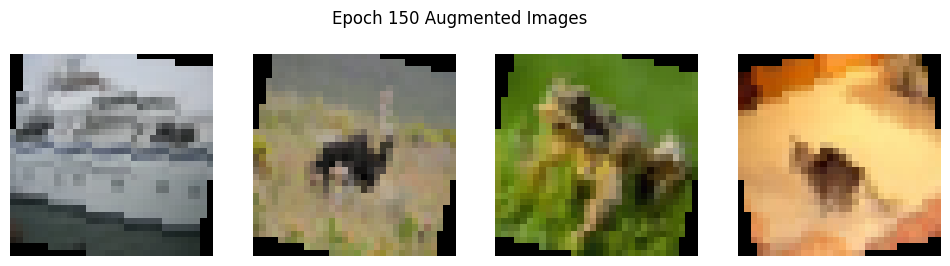

Epoch 151/199, Loss: 0.2722, Train Acc: 0.9031, Val Acc: 0.8341


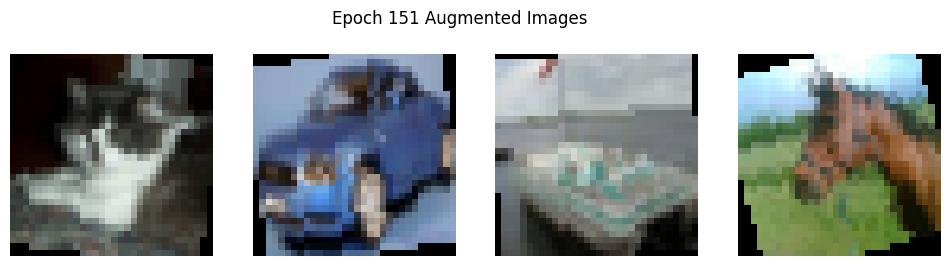

Epoch 152/199, Loss: 0.2704, Train Acc: 0.9034, Val Acc: 0.8342


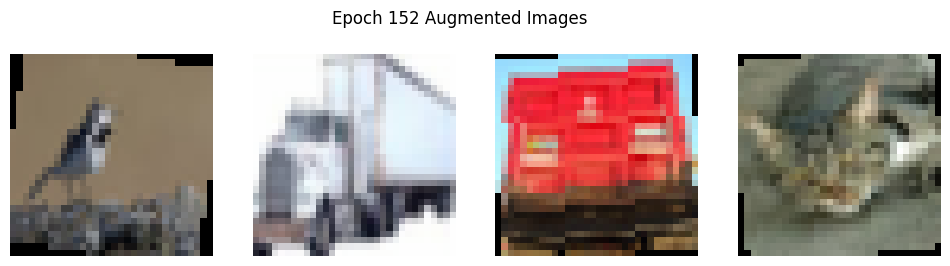

Epoch 153/199, Loss: 0.2745, Train Acc: 0.9015, Val Acc: 0.8342


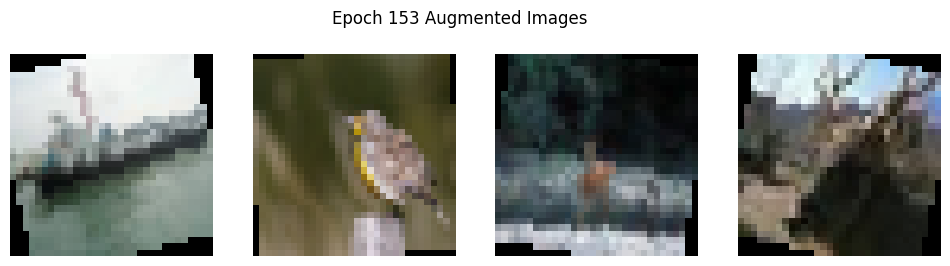

Epoch 154/199, Loss: 0.2716, Train Acc: 0.9028, Val Acc: 0.8342


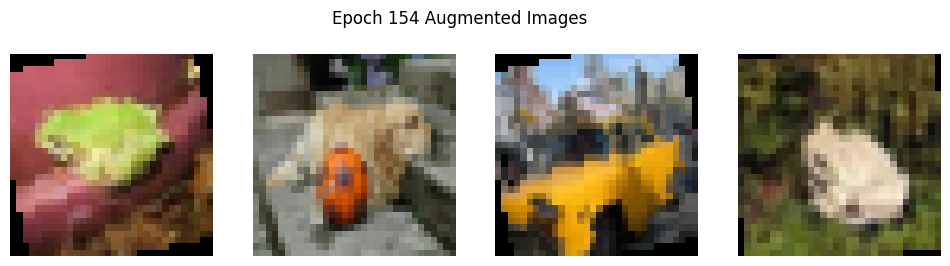

Epoch 155/199, Loss: 0.2746, Train Acc: 0.9023, Val Acc: 0.8342


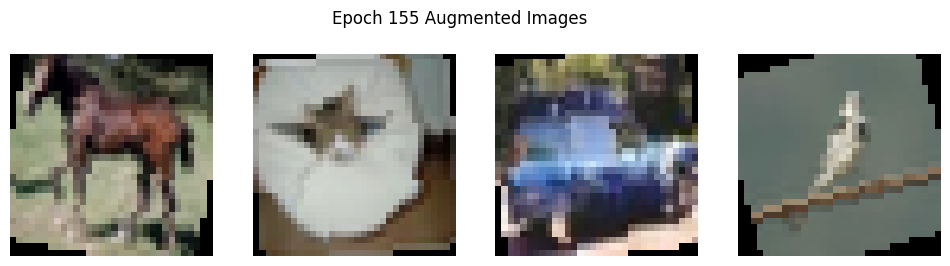

Epoch 156/199, Loss: 0.2718, Train Acc: 0.9026, Val Acc: 0.8342


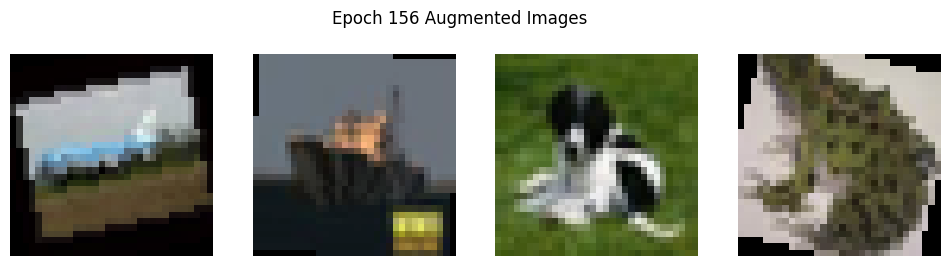

Epoch 157/199, Loss: 0.2729, Train Acc: 0.9018, Val Acc: 0.8342


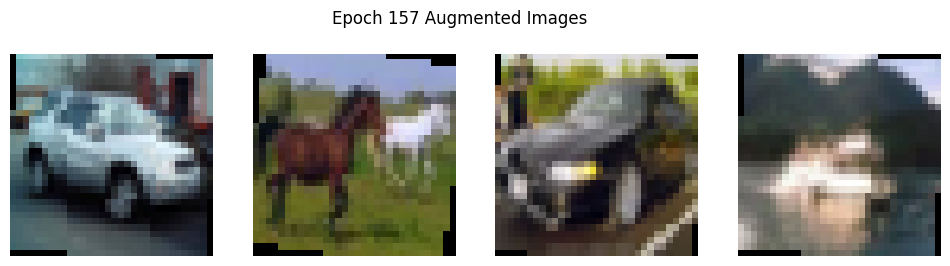

Epoch 158/199, Loss: 0.2720, Train Acc: 0.9026, Val Acc: 0.8342


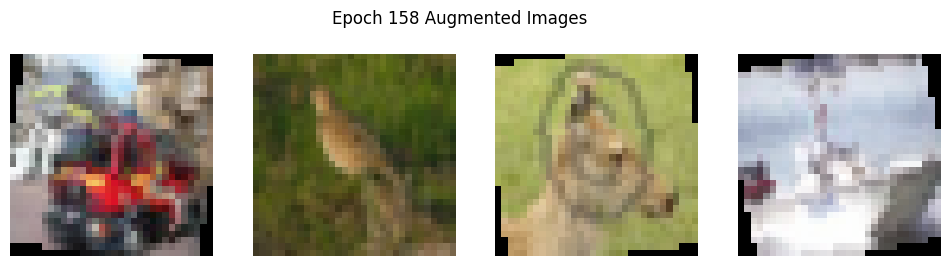

Epoch 159/199, Loss: 0.2756, Train Acc: 0.9015, Val Acc: 0.8342


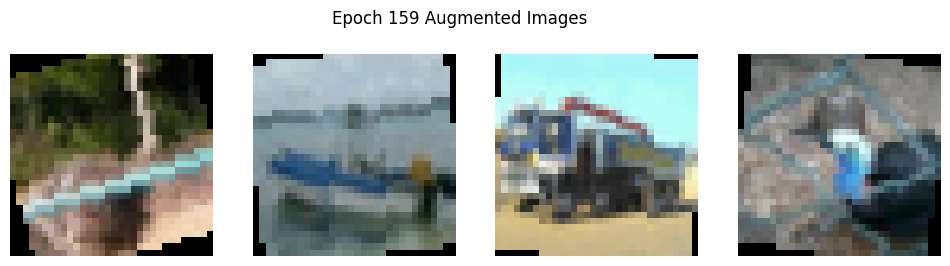

Epoch 160/199, Loss: 0.2735, Train Acc: 0.9006, Val Acc: 0.8342


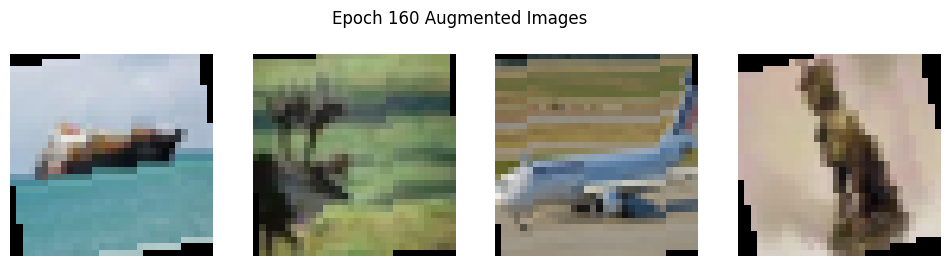

Epoch 161/199, Loss: 0.2751, Train Acc: 0.9042, Val Acc: 0.8342


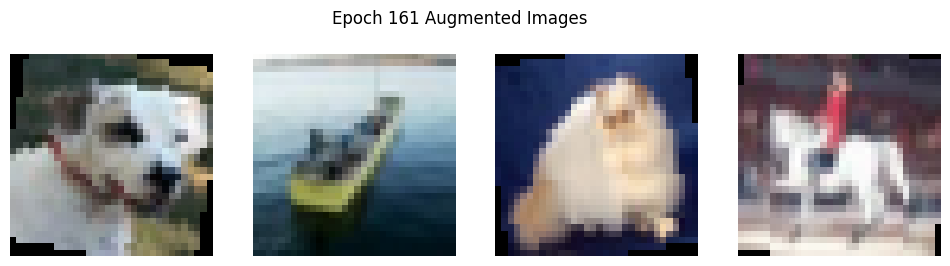

Epoch 162/199, Loss: 0.2733, Train Acc: 0.9037, Val Acc: 0.8342


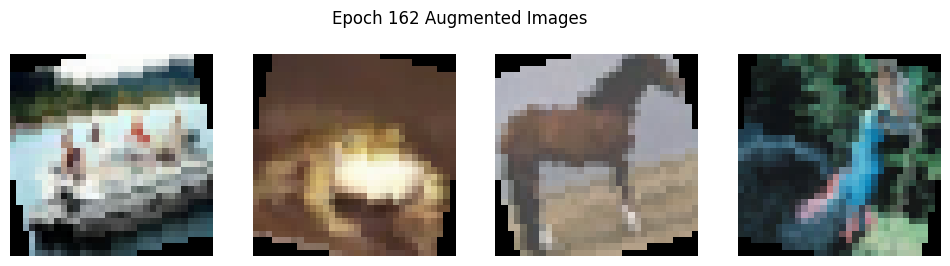

Epoch 163/199, Loss: 0.2763, Train Acc: 0.9018, Val Acc: 0.8342


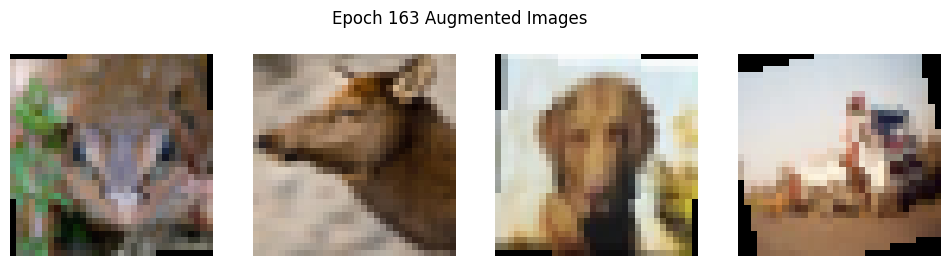

Epoch 164/199, Loss: 0.2780, Train Acc: 0.9020, Val Acc: 0.8342


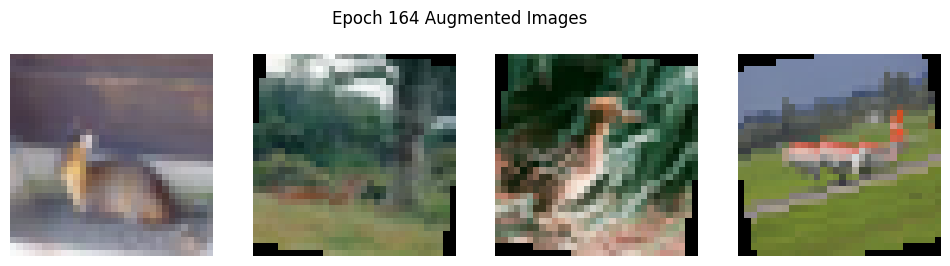

Epoch 165/199, Loss: 0.2758, Train Acc: 0.9012, Val Acc: 0.8342


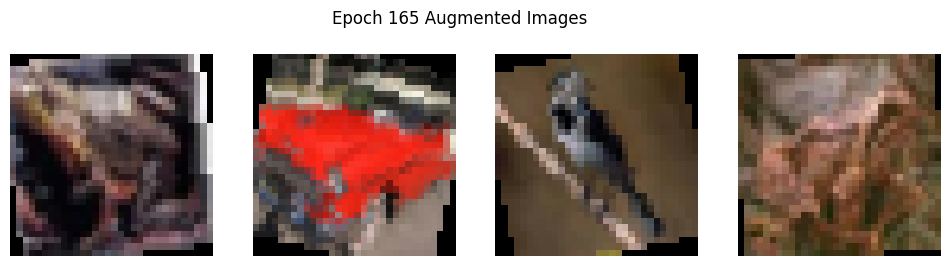

Epoch 166/199, Loss: 0.2723, Train Acc: 0.9019, Val Acc: 0.8342


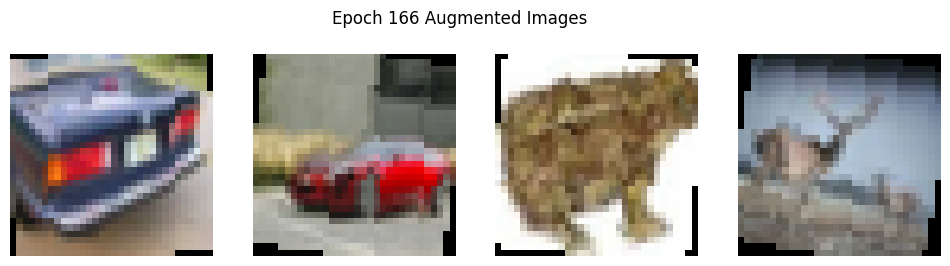

Epoch 167/199, Loss: 0.2747, Train Acc: 0.9025, Val Acc: 0.8342


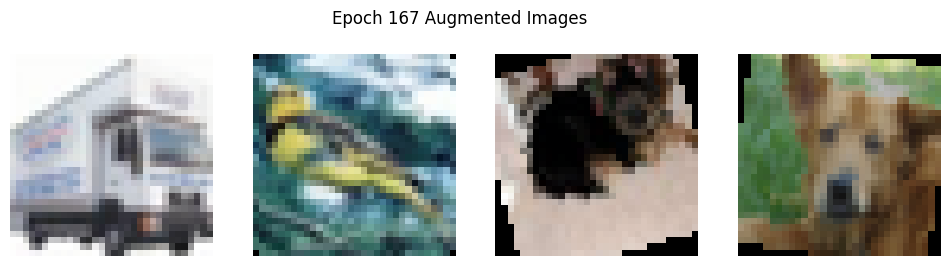

Epoch 168/199, Loss: 0.2748, Train Acc: 0.9011, Val Acc: 0.8342


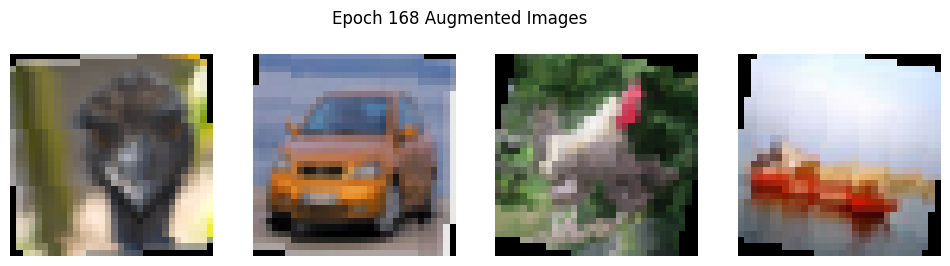

Epoch 169/199, Loss: 0.2723, Train Acc: 0.9024, Val Acc: 0.8342


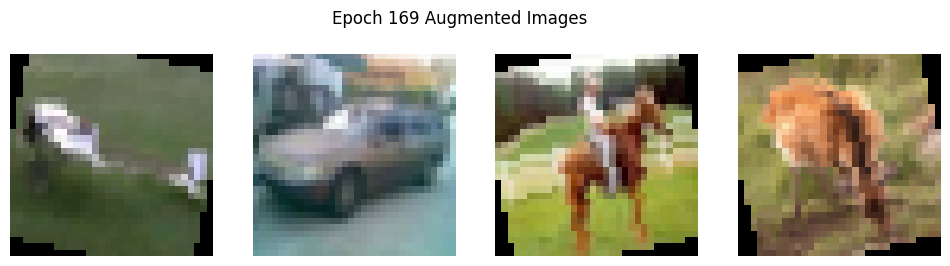

Epoch 170/199, Loss: 0.2746, Train Acc: 0.9016, Val Acc: 0.8342


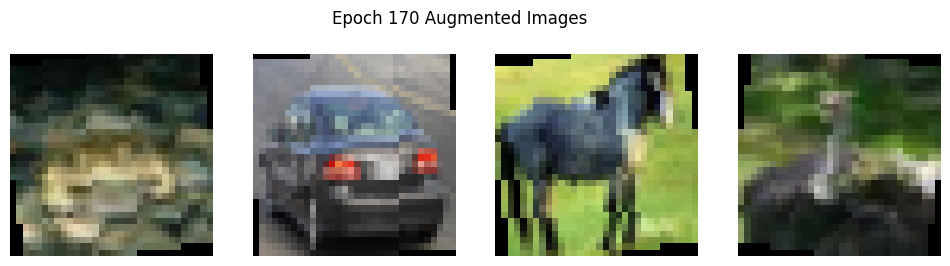

Epoch 171/199, Loss: 0.2780, Train Acc: 0.9017, Val Acc: 0.8342


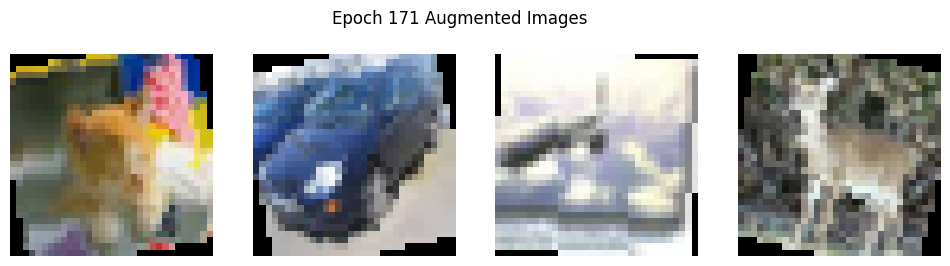

Epoch 172/199, Loss: 0.2745, Train Acc: 0.9027, Val Acc: 0.8342


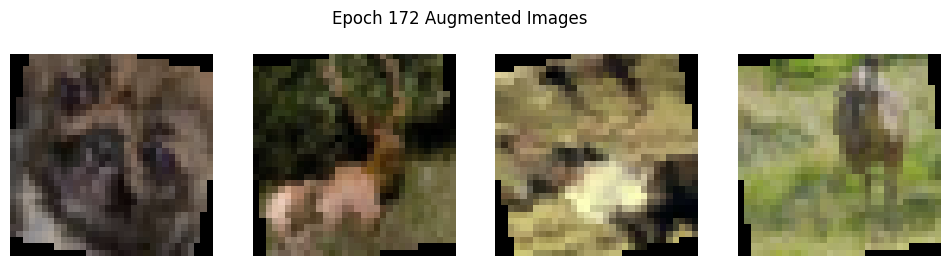

Epoch 173/199, Loss: 0.2749, Train Acc: 0.9016, Val Acc: 0.8342


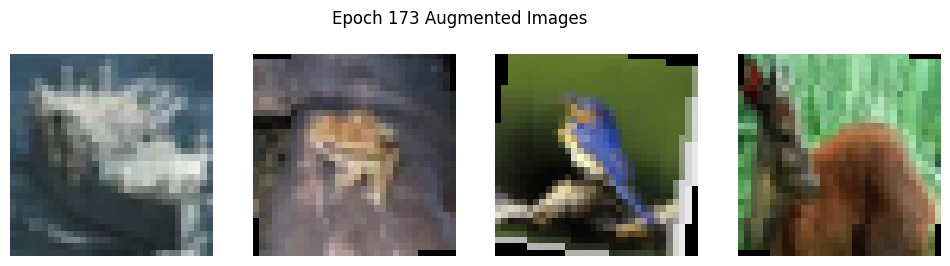

Epoch 174/199, Loss: 0.2717, Train Acc: 0.9036, Val Acc: 0.8342


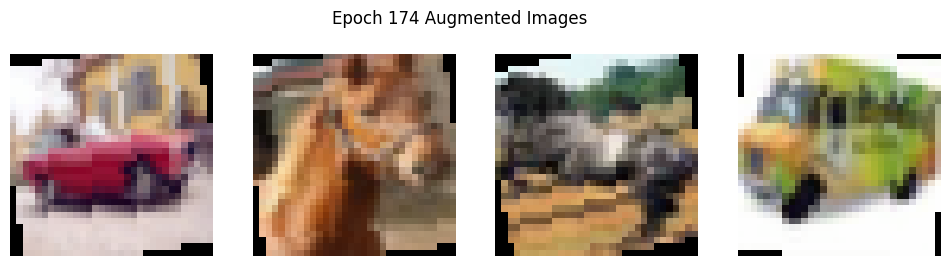

Epoch 175/199, Loss: 0.2685, Train Acc: 0.9041, Val Acc: 0.8342


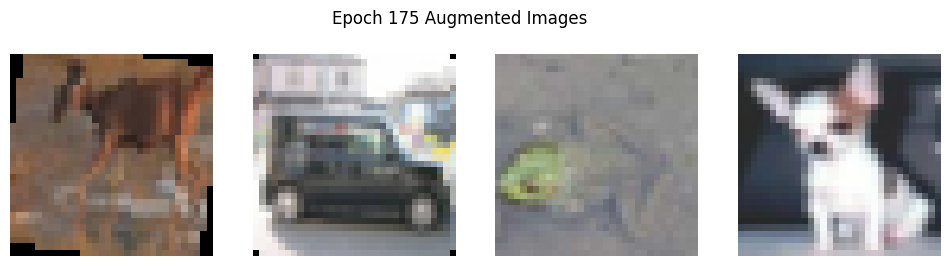

Epoch 176/199, Loss: 0.2765, Train Acc: 0.9019, Val Acc: 0.8342


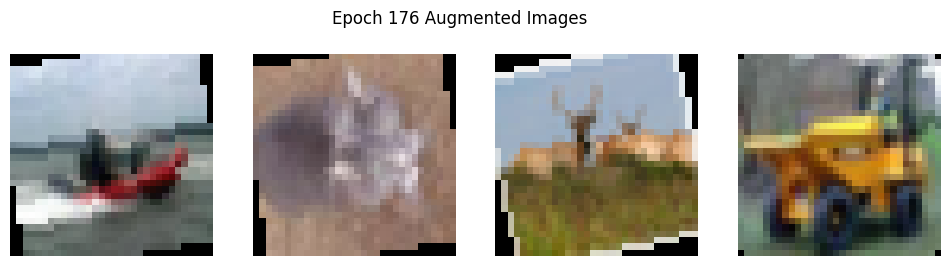

Epoch 177/199, Loss: 0.2766, Train Acc: 0.9013, Val Acc: 0.8342


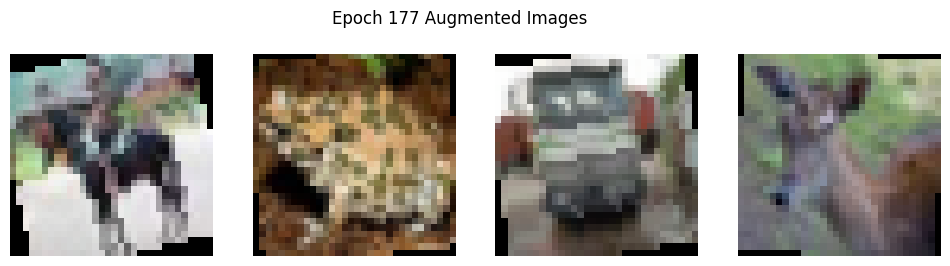

Epoch 178/199, Loss: 0.2700, Train Acc: 0.9030, Val Acc: 0.8342


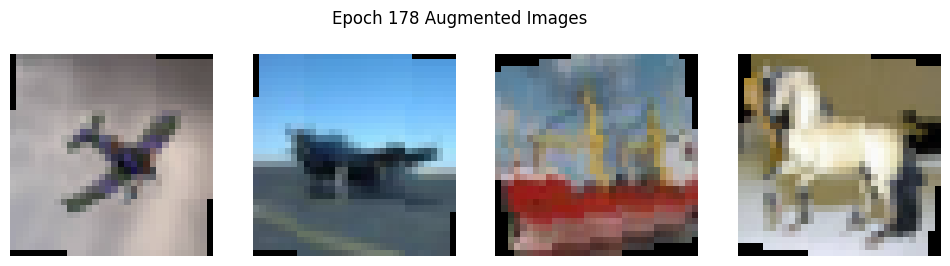

Epoch 179/199, Loss: 0.2776, Train Acc: 0.9016, Val Acc: 0.8342


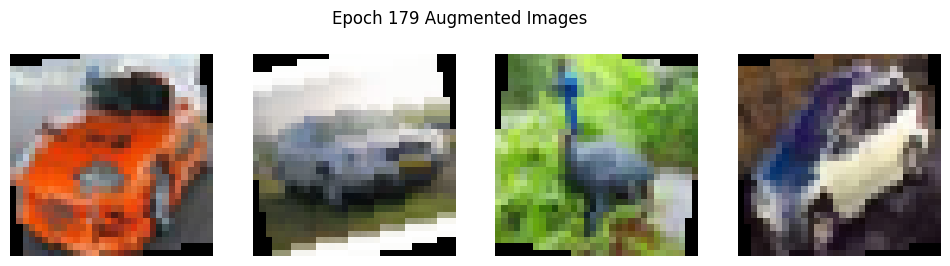

Epoch 180/199, Loss: 0.2720, Train Acc: 0.9031, Val Acc: 0.8342


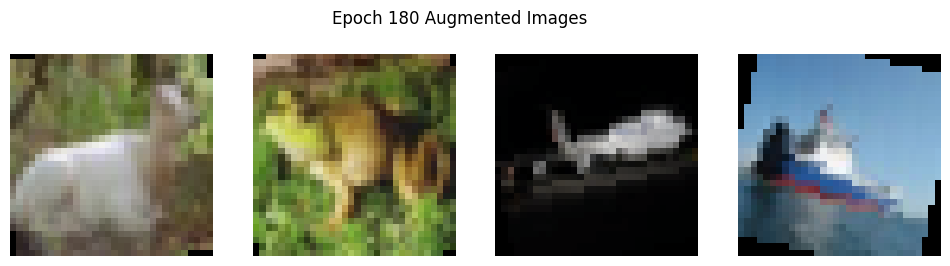

Epoch 181/199, Loss: 0.2711, Train Acc: 0.9040, Val Acc: 0.8342


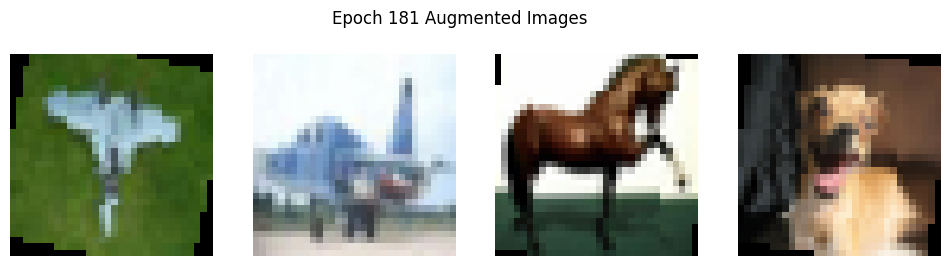

Epoch 182/199, Loss: 0.2737, Train Acc: 0.9026, Val Acc: 0.8342


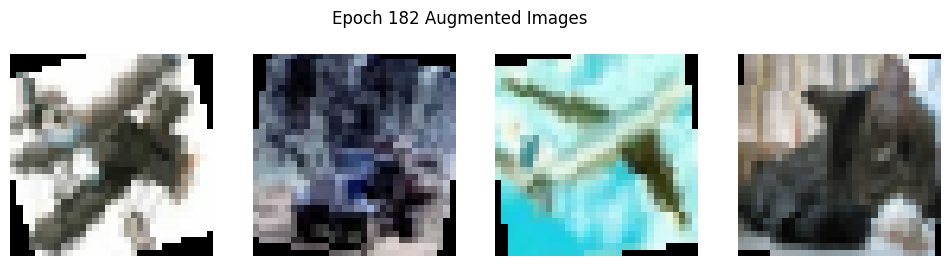

Epoch 183/199, Loss: 0.2725, Train Acc: 0.9029, Val Acc: 0.8342


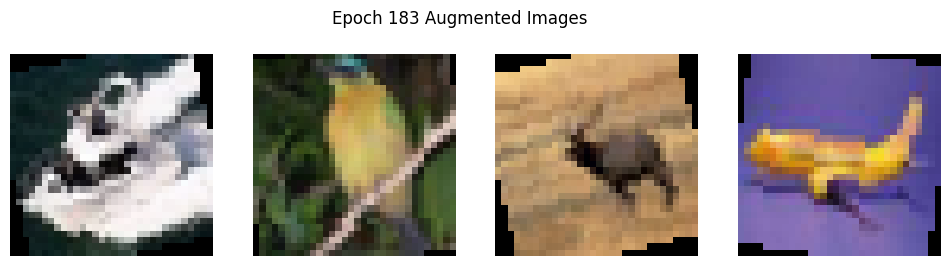

Epoch 184/199, Loss: 0.2727, Train Acc: 0.9024, Val Acc: 0.8342


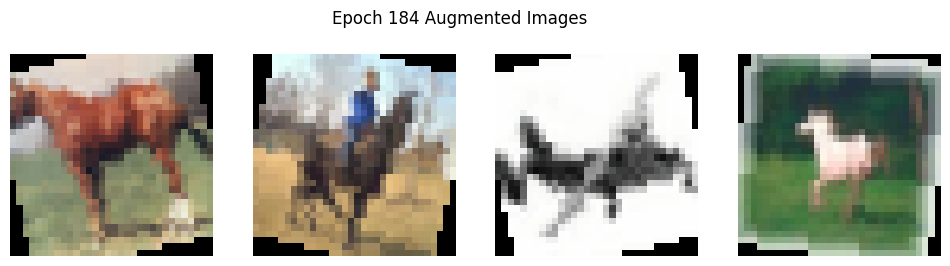

Epoch 185/199, Loss: 0.2747, Train Acc: 0.9011, Val Acc: 0.8342


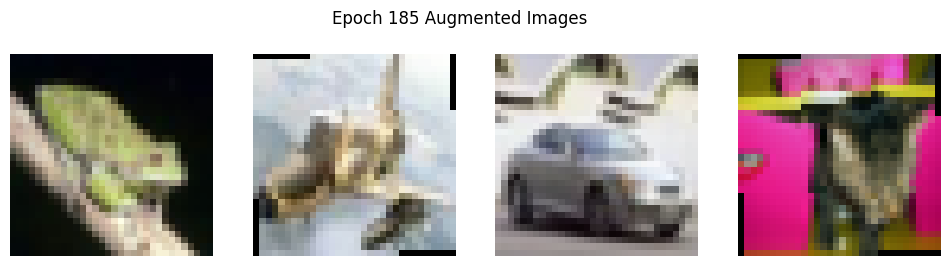

Epoch 186/199, Loss: 0.2718, Train Acc: 0.9041, Val Acc: 0.8342


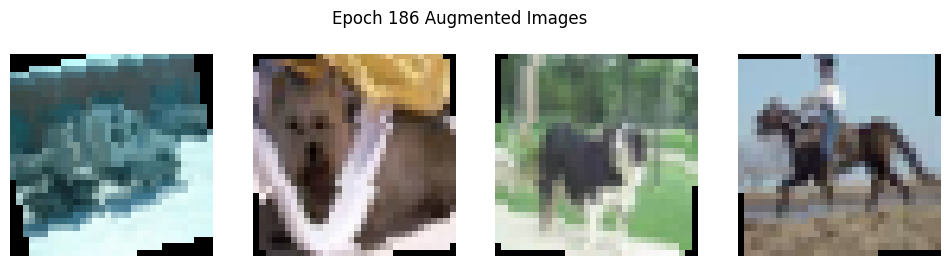

Epoch 187/199, Loss: 0.2716, Train Acc: 0.9031, Val Acc: 0.8342


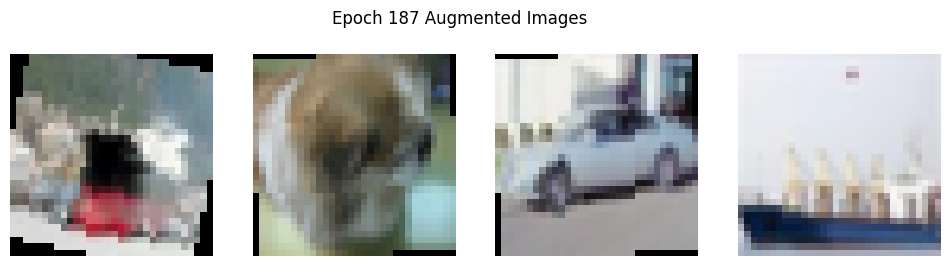

Epoch 188/199, Loss: 0.2767, Train Acc: 0.9008, Val Acc: 0.8342


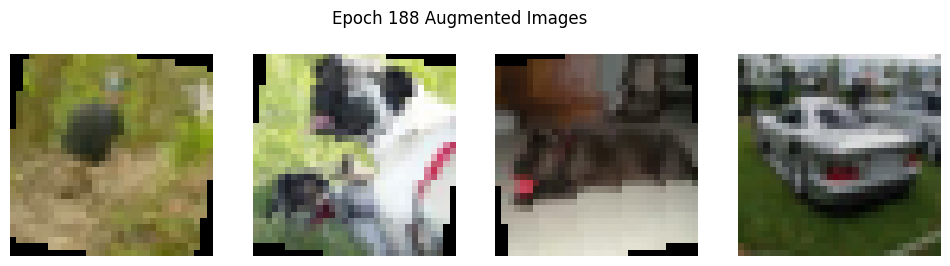

Epoch 189/199, Loss: 0.2741, Train Acc: 0.9020, Val Acc: 0.8342


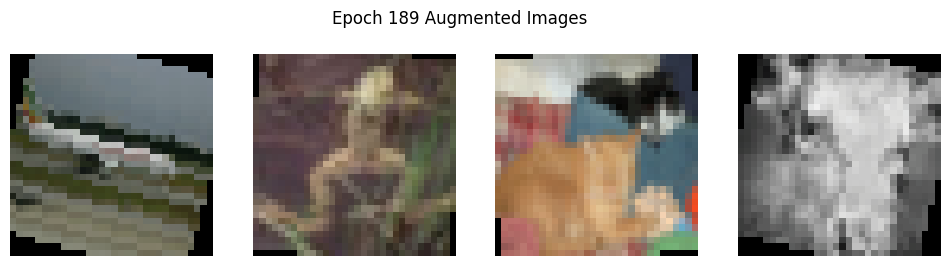

Epoch 190/199, Loss: 0.2736, Train Acc: 0.9026, Val Acc: 0.8342


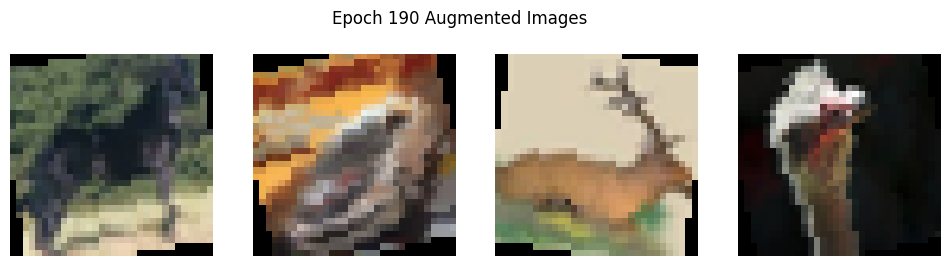

Epoch 191/199, Loss: 0.2729, Train Acc: 0.9028, Val Acc: 0.8342


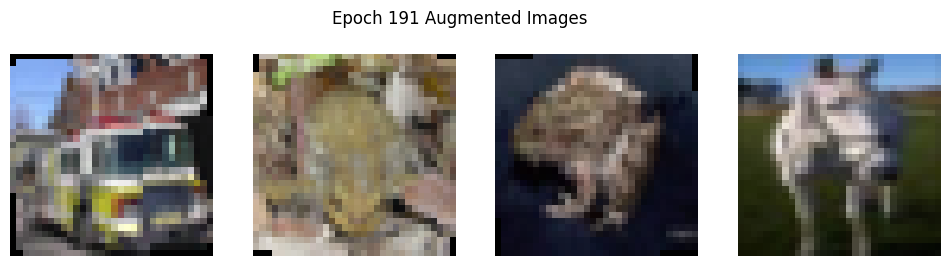

Epoch 192/199, Loss: 0.2679, Train Acc: 0.9046, Val Acc: 0.8342


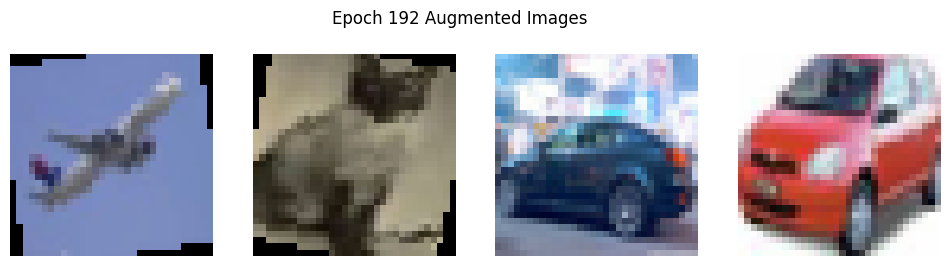

Epoch 193/199, Loss: 0.2741, Train Acc: 0.9035, Val Acc: 0.8342


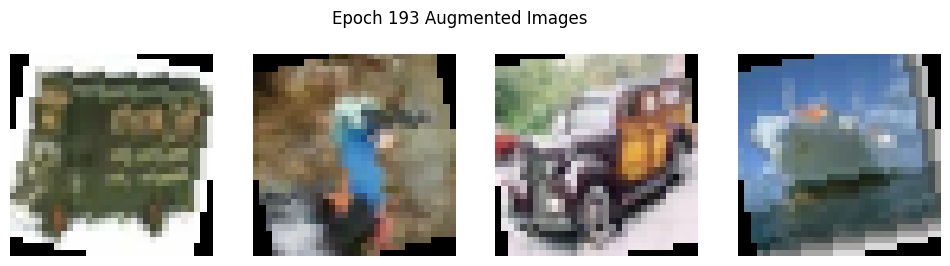

Epoch 194/199, Loss: 0.2750, Train Acc: 0.9024, Val Acc: 0.8342


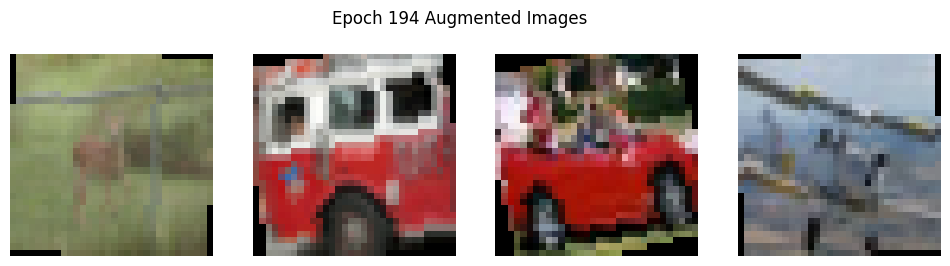

Epoch 195/199, Loss: 0.2757, Train Acc: 0.9014, Val Acc: 0.8342


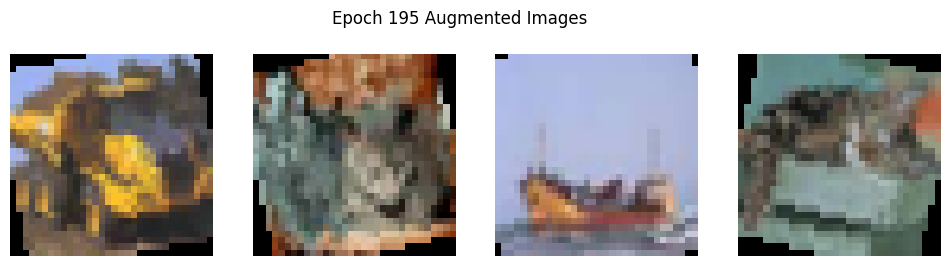

Epoch 196/199, Loss: 0.2772, Train Acc: 0.9004, Val Acc: 0.8342


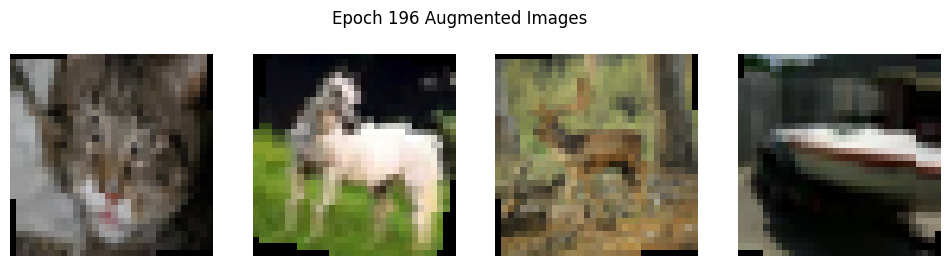

Epoch 197/199, Loss: 0.2740, Train Acc: 0.9025, Val Acc: 0.8342


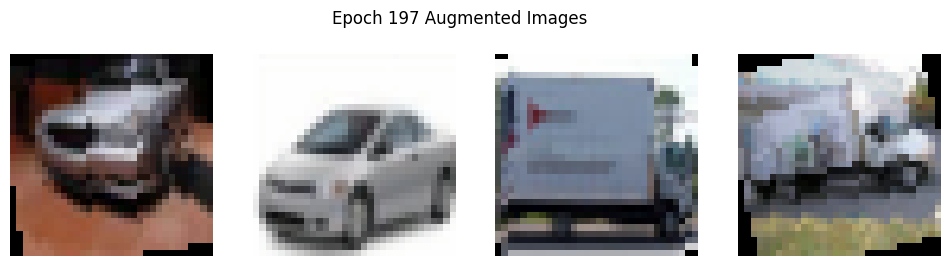

Epoch 198/199, Loss: 0.2735, Train Acc: 0.9025, Val Acc: 0.8342


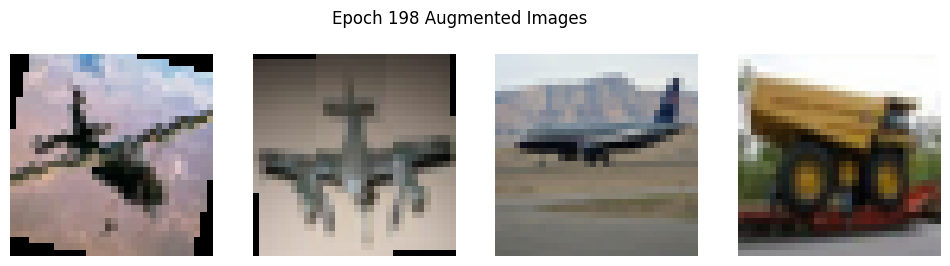

Epoch 199/199, Loss: 0.2729, Train Acc: 0.9029, Val Acc: 0.8342


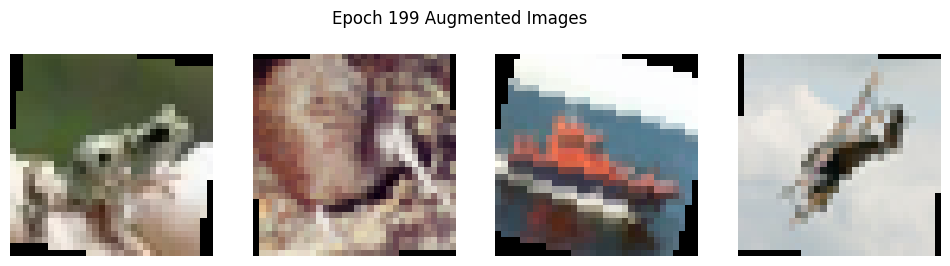

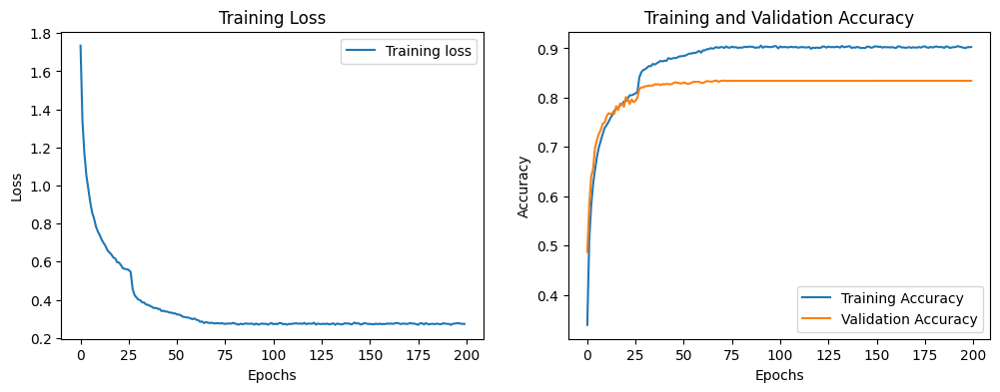

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt

class AlexNet(nn.Module):
    def __init__(self, num_classes=10):
        super(AlexNet, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.LocalResponseNorm(size=5, alpha=1e-4, beta=0.75, k=2.0),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.avg_pooling = torch.nn.AdaptiveAvgPool2d((6, 6))

        self.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, num_classes),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avg_pooling(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

mean = (0.4914, 0.4822, 0.4465)
std = (0.2023, 0.1994, 0.2010)

# Training data augmentation
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

# Validation data augmentation
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])



def get_dataloaders(dataset='CIFAR10', batch_size=128):
    if dataset == 'CIFAR10':
        train_dataset = datasets.CIFAR10(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR10(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 10
    elif dataset == 'CIFAR100':
        train_dataset = datasets.CIFAR100(root='./data', train=True, download=True, transform=train_transforms)
        test_dataset = datasets.CIFAR100(root='./data', train=False, download=True, transform=test_transforms)
        num_classes = 100

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, test_loader, num_classes

# Training function
def train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=25, device='cuda'):
    model.to(device)
    best_acc = 0.0

    train_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0

        augmented_images = []

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)

            if len(augmented_images) < 4:
                augmented_images.append(inputs.cpu().numpy())

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)

        train_losses.append(epoch_loss)
        train_accuracies.append(epoch_acc.item())

        # Validation phase
        model.eval()
        val_running_corrects = 0

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)

        val_acc = val_running_corrects.double() / len(test_loader.dataset)
        val_accuracies.append(val_acc.item())

        print(f'Epoch {epoch}/{num_epochs-1}, Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, Val Acc: {val_acc:.4f}')

        scheduler.step(val_acc)

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        fig, axes = plt.subplots(1, 4, figsize=(12, 3))
        for i, img in enumerate(augmented_images):
            img = img.transpose((0, 2, 3, 1))
            img = (img * np.array([0.2023, 0.1994, 0.2010])) + np.array([0.4914, 0.4822, 0.4465])
            img = np.clip(img, 0, 1)
            axes[i].imshow(img[0])
            axes[i].axis('off')
        plt.suptitle(f'Epoch {epoch} Augmented Images')
        plt.show()

    model.load_state_dict(best_model_wts)

    # Plotting training metrics
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))

    # Plot training loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Training loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()

    # Plot accuracies
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Training Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

    return model

if __name__ == '__main__':
    dataset = 'CIFAR10'
    batch_size = 128
    num_epochs = 200
    learning_rate = 0.001

    train_loader, test_loader, num_classes = get_dataloaders(dataset, batch_size)

    model = AlexNet(num_classes=num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=5, verbose=True)

    trained_model = train_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs, device='cuda')
